# Let's try KNN and see 

### First lets check all the cubic, reno and bbr graphs with different things 

In [38]:
import matplotlib.pyplot as plt
from scipy.fft import rfft, rfftfreq
from scipy.fft import irfft
import numpy as np
import statistics


In [18]:
names = []
variants=["reno"]
postdelays=[20,25,30,35,40]
predelays=[20,25,30,35,40]
linkspeeds=[1000]

In [19]:
for v in variants :
    for pred in predelays:
        for pod in postdelays:
            for ls in linkspeeds :
                names.append(v+"-"+str(pred)+"-"+str(pod)+"-"+str(ls))
print(names)

['reno-20-20-1000', 'reno-20-25-1000', 'reno-20-30-1000', 'reno-20-35-1000', 'reno-20-40-1000', 'reno-25-20-1000', 'reno-25-25-1000', 'reno-25-30-1000', 'reno-25-35-1000', 'reno-25-40-1000', 'reno-30-20-1000', 'reno-30-25-1000', 'reno-30-30-1000', 'reno-30-35-1000', 'reno-30-40-1000', 'reno-35-20-1000', 'reno-35-25-1000', 'reno-35-30-1000', 'reno-35-35-1000', 'reno-35-40-1000', 'reno-40-20-1000', 'reno-40-25-1000', 'reno-40-30-1000', 'reno-40-35-1000', 'reno-40-40-1000']


In [17]:
cubic_files

['cubic-20-20-1000',
 'cubic-20-25-1000',
 'cubic-20-30-1000',
 'cubic-20-35-1000',
 'cubic-20-40-1000',
 'cubic-25-20-1000',
 'cubic-25-25-1000',
 'cubic-25-30-1000',
 'cubic-25-35-1000',
 'cubic-25-40-1000',
 'cubic-30-20-1000',
 'cubic-30-25-1000',
 'cubic-30-30-1000',
 'cubic-30-35-1000',
 'cubic-30-40-1000',
 'cubic-35-20-1000',
 'cubic-35-25-1000',
 'cubic-35-30-1000',
 'cubic-35-35-1000',
 'cubic-35-40-1000',
 'cubic-40-20-1000',
 'cubic-40-25-1000',
 'cubic-40-30-1000',
 'cubic-40-35-1000',
 'cubic-40-40-1000']

In [21]:
reno_files

['reno-20-20-1000',
 'reno-20-25-1000',
 'reno-20-30-1000',
 'reno-20-35-1000',
 'reno-20-40-1000',
 'reno-25-20-1000',
 'reno-25-25-1000',
 'reno-25-30-1000',
 'reno-25-35-1000',
 'reno-25-40-1000',
 'reno-30-20-1000',
 'reno-30-25-1000',
 'reno-30-30-1000',
 'reno-30-35-1000',
 'reno-30-40-1000',
 'reno-35-20-1000',
 'reno-35-25-1000',
 'reno-35-30-1000',
 'reno-35-35-1000',
 'reno-35-40-1000',
 'reno-40-20-1000',
 'reno-40-25-1000',
 'reno-40-30-1000',
 'reno-40-35-1000',
 'reno-40-40-1000']

In [7]:
bbr_files 

['bbr-20-20-3000',
 'bbr-20-25-3000',
 'bbr-20-30-3000',
 'bbr-20-35-3000',
 'bbr-20-40-3000',
 'bbr-25-20-3000',
 'bbr-25-25-3000',
 'bbr-25-30-3000',
 'bbr-25-35-3000',
 'bbr-25-40-3000',
 'bbr-30-20-3000',
 'bbr-30-25-3000',
 'bbr-30-30-3000',
 'bbr-30-35-3000',
 'bbr-30-40-3000',
 'bbr-35-20-3000',
 'bbr-35-25-3000',
 'bbr-35-30-3000',
 'bbr-35-35-3000',
 'bbr-35-40-3000',
 'bbr-40-20-3000',
 'bbr-40-25-3000',
 'bbr-40-30-3000',
 'bbr-40-35-3000',
 'bbr-40-40-3000']

In [40]:
ts = []

Reading ./Nebby/measurements/bbr-20-20-3000-tcp.csv...
total bytes processed: 1483.09 KBytes for bbr-20-20-3000 (unlimited)
6653   6653
RTT 0.1 Freq  10.0


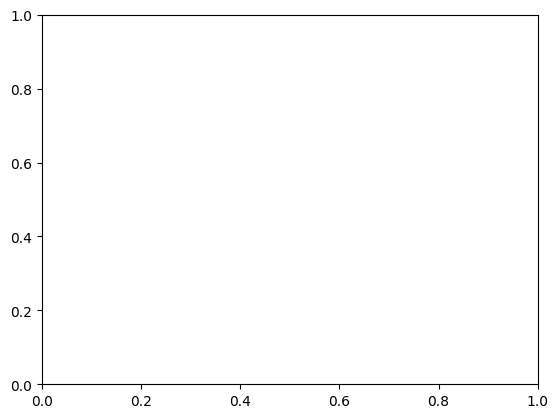

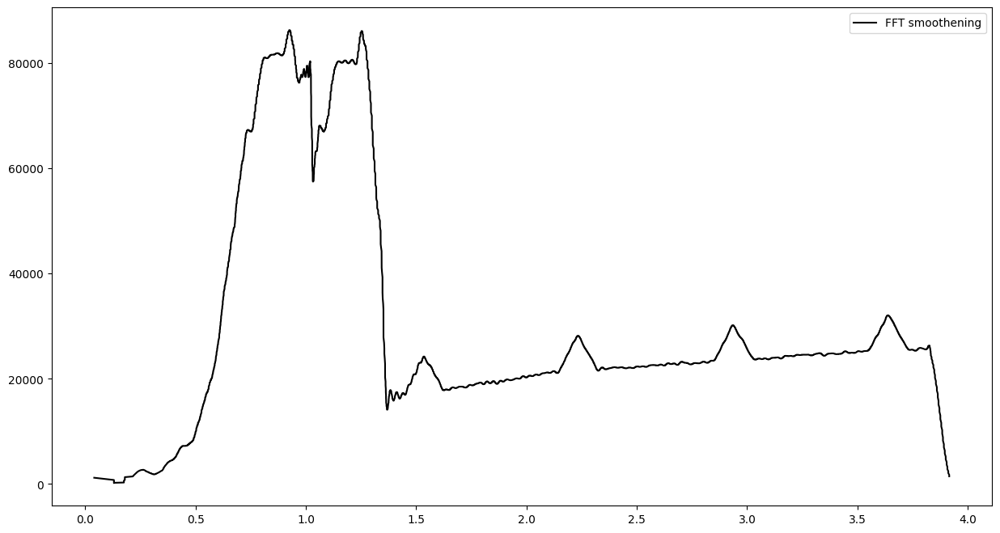

Reading ./Nebby/measurements/bbr-20-25-3000-tcp.csv...
total bytes processed: 1464.914 KBytes for bbr-20-25-3000 (unlimited)
6536   6536
RTT 0.1 Freq  10.0


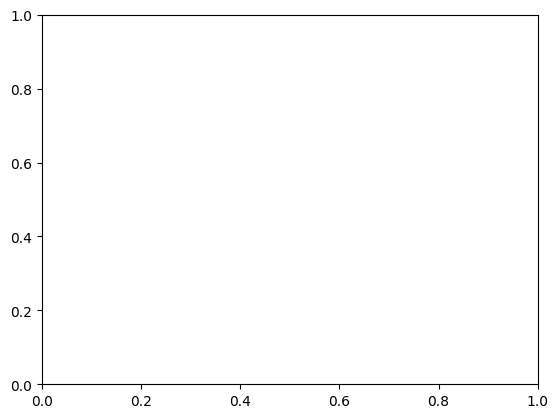

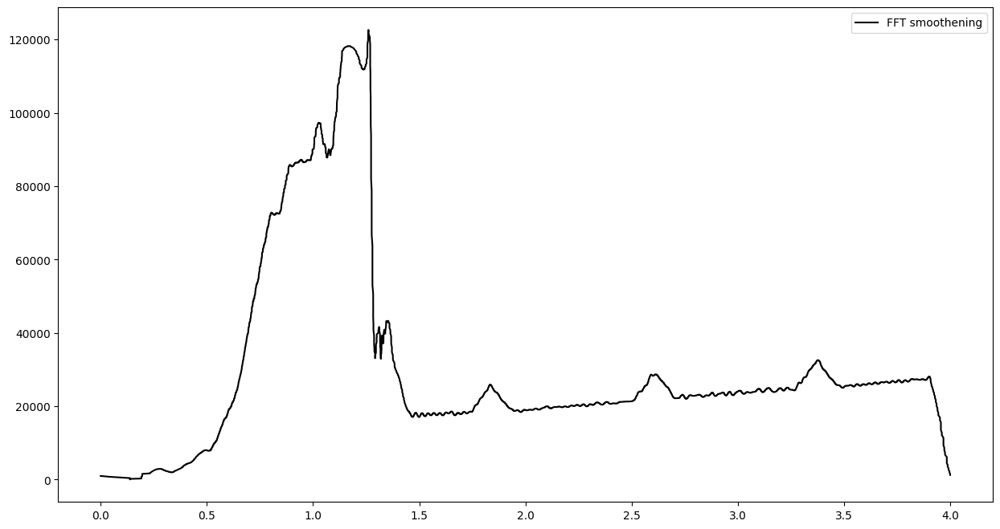

Reading ./Nebby/measurements/bbr-20-30-3000-tcp.csv...
total bytes processed: 1465.094 KBytes for bbr-20-30-3000 (unlimited)
6120   6120
RTT 0.1 Freq  10.0


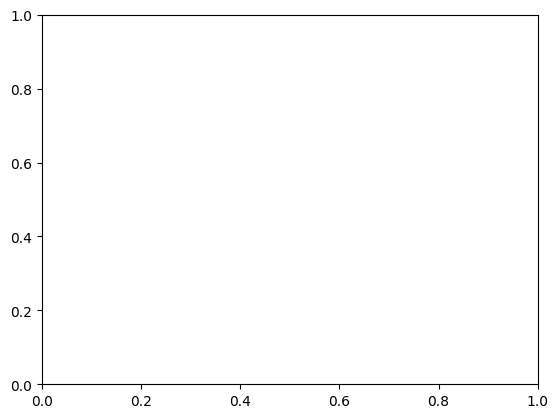

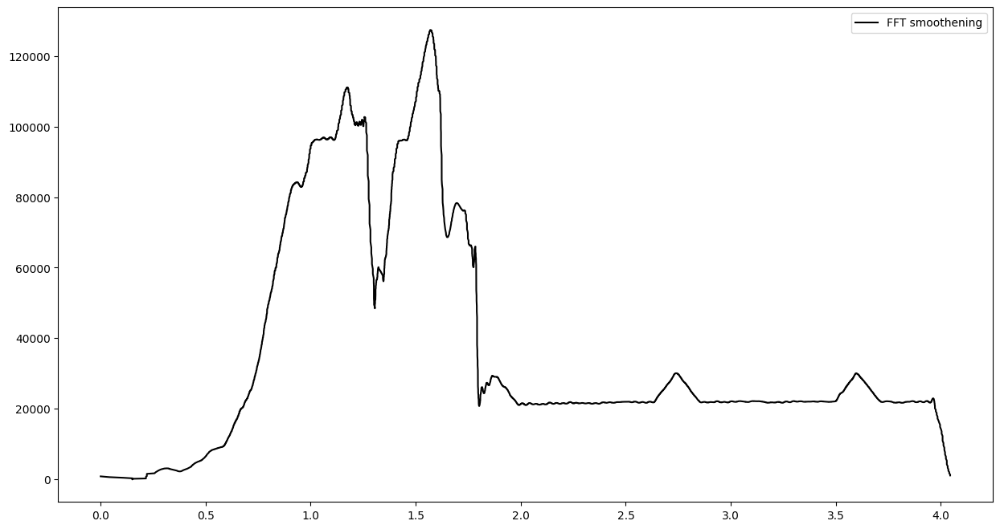

Reading ./Nebby/measurements/bbr-20-35-3000-tcp.csv...
total bytes processed: 1498.214 KBytes for bbr-20-35-3000 (unlimited)
6656   6656
RTT 0.1 Freq  10.0


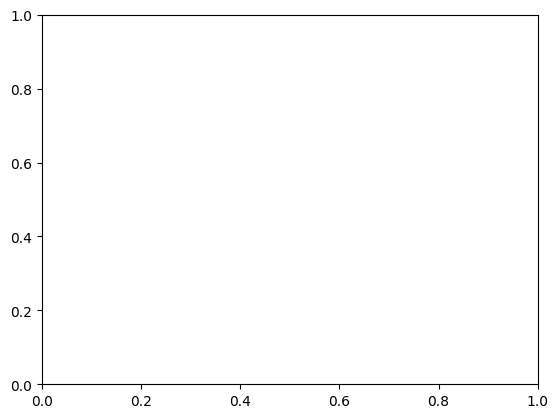

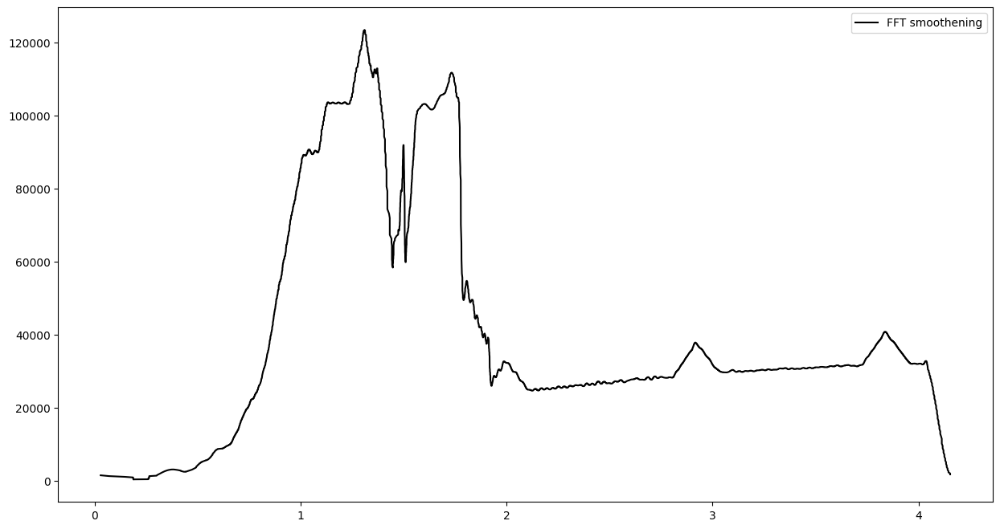

Reading ./Nebby/measurements/bbr-20-40-3000-tcp.csv...
total bytes processed: 1491.758 KBytes for bbr-20-40-3000 (unlimited)
6408   6408
RTT 0.1 Freq  10.0


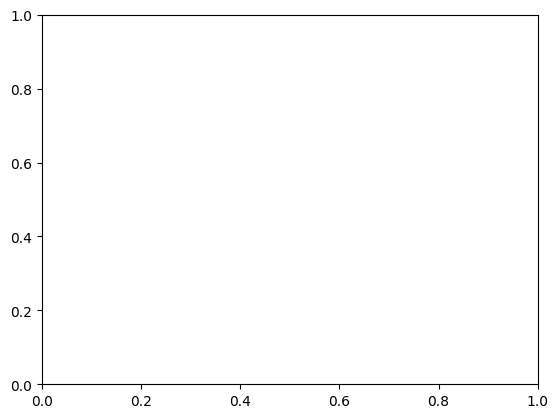

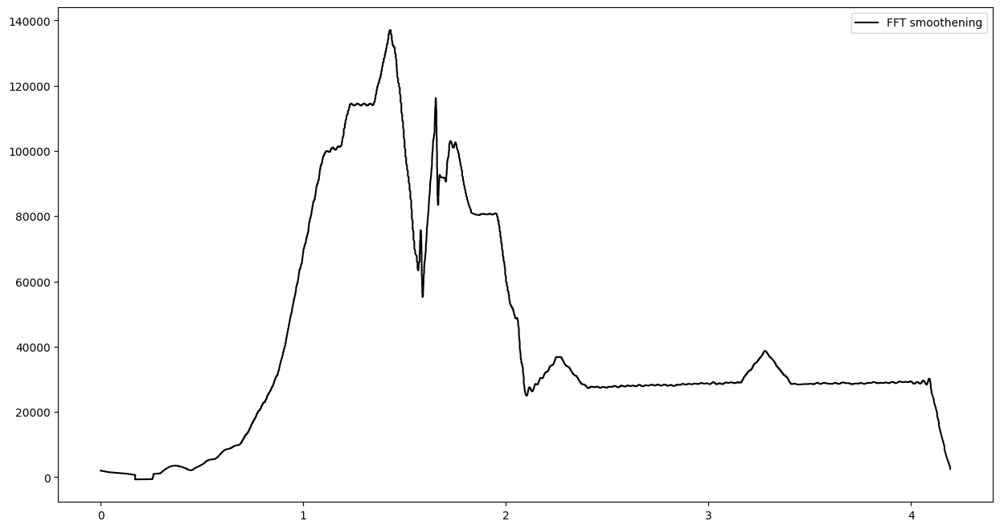

Reading ./Nebby/measurements/bbr-25-20-3000-tcp.csv...
total bytes processed: 1453.002 KBytes for bbr-25-20-3000 (unlimited)
6030   6030
RTT 0.1 Freq  10.0


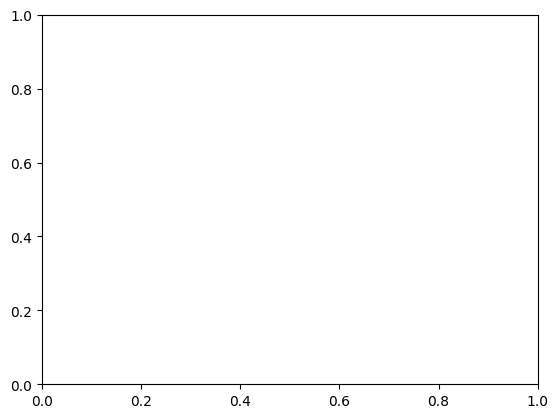

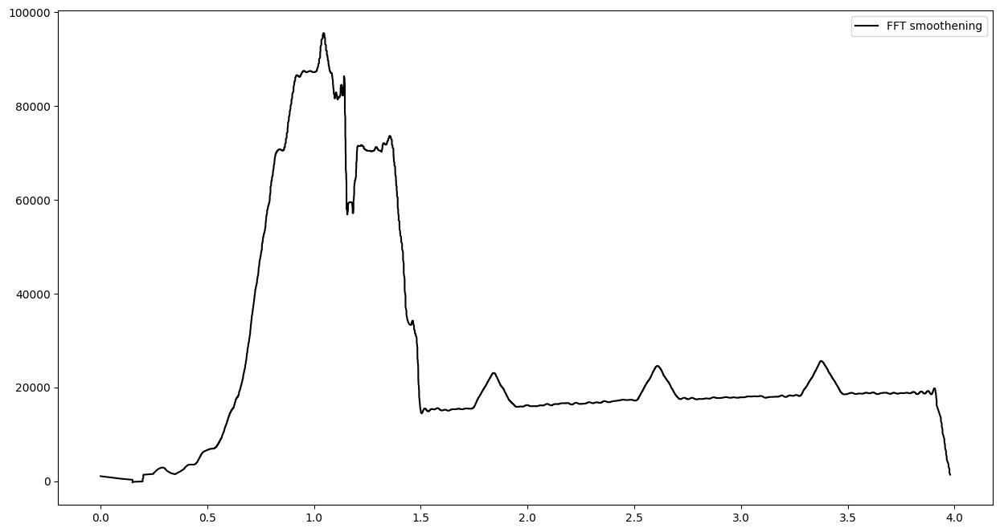

Reading ./Nebby/measurements/bbr-25-25-3000-tcp.csv...
total bytes processed: 1437.394 KBytes for bbr-25-25-3000 (unlimited)
5882   5882
RTT 0.1 Freq  10.0


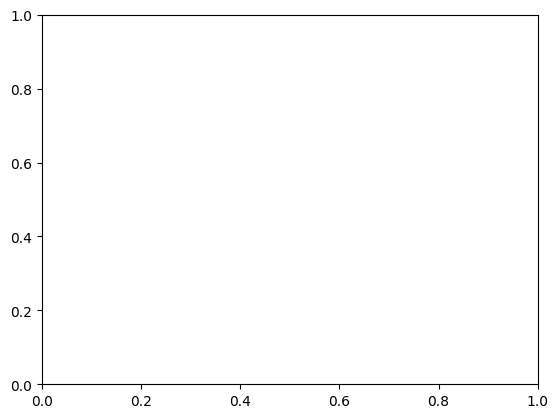

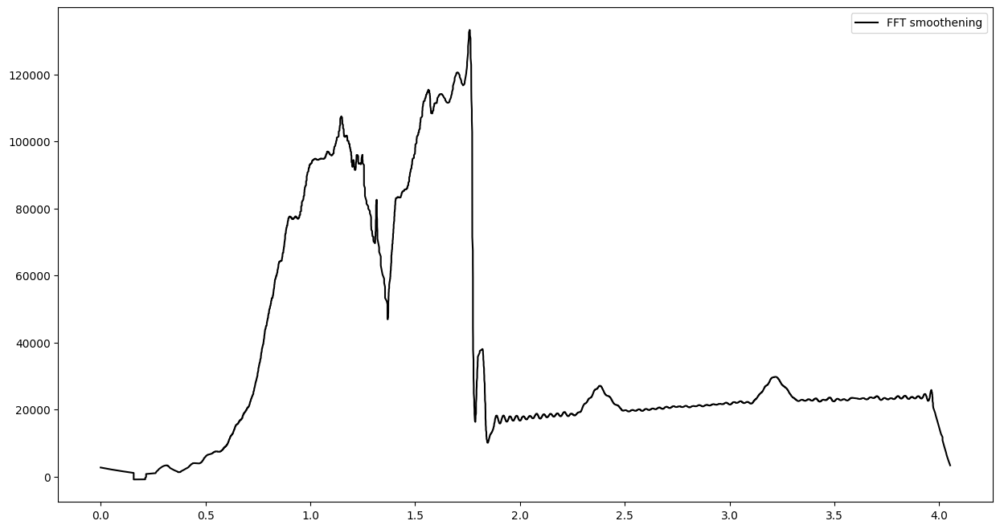

Reading ./Nebby/measurements/bbr-25-30-3000-tcp.csv...
total bytes processed: 1501.006 KBytes for bbr-25-30-3000 (unlimited)
6657   6657
RTT 0.1 Freq  10.0


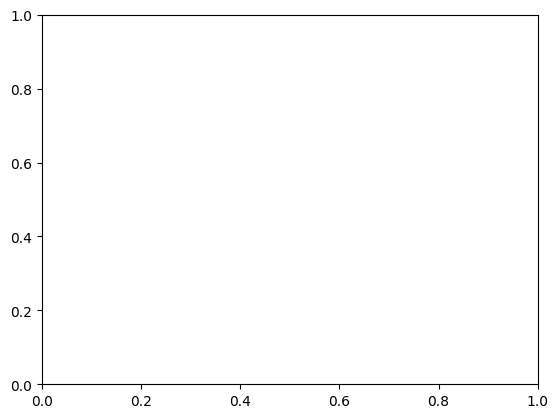

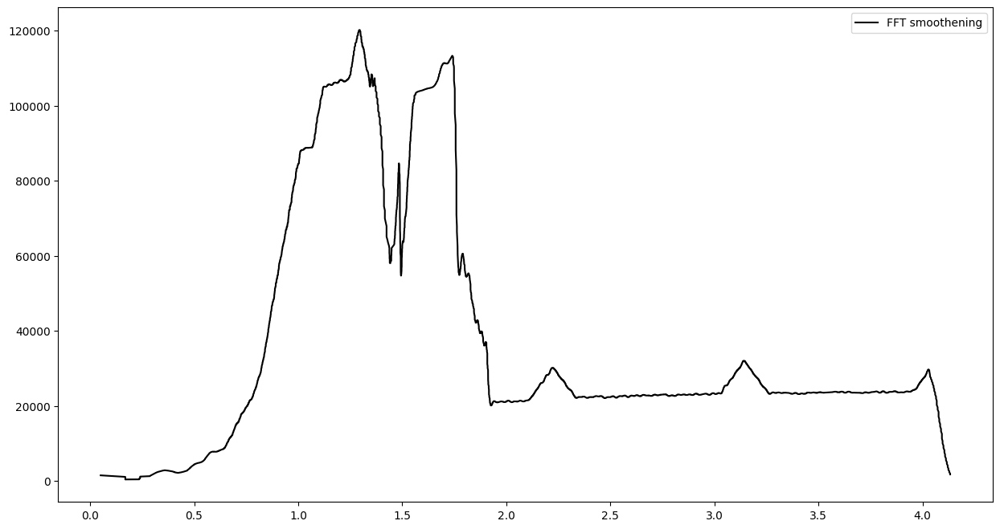

Reading ./Nebby/measurements/bbr-25-35-3000-tcp.csv...
total bytes processed: 1470.458 KBytes for bbr-25-35-3000 (unlimited)
6092   6092
RTT 0.1 Freq  10.0


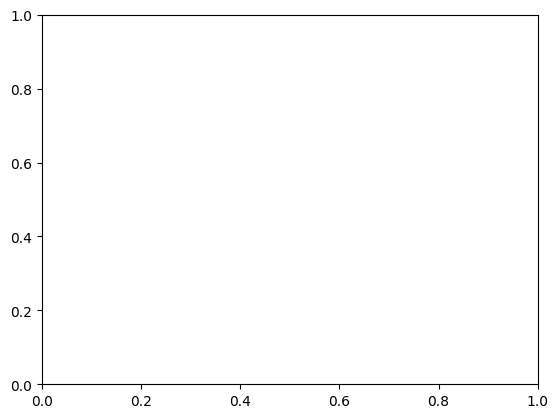

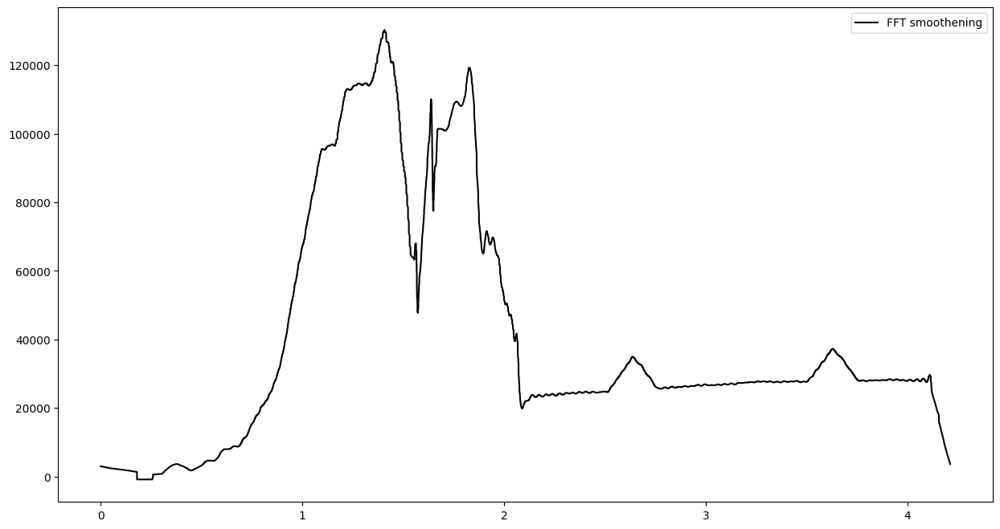

Reading ./Nebby/measurements/bbr-25-40-3000-tcp.csv...
total bytes processed: 1519.382 KBytes for bbr-25-40-3000 (unlimited)
6777   6777
RTT 0.1 Freq  10.0


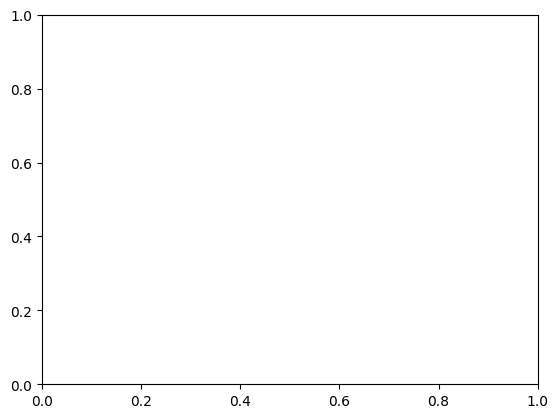

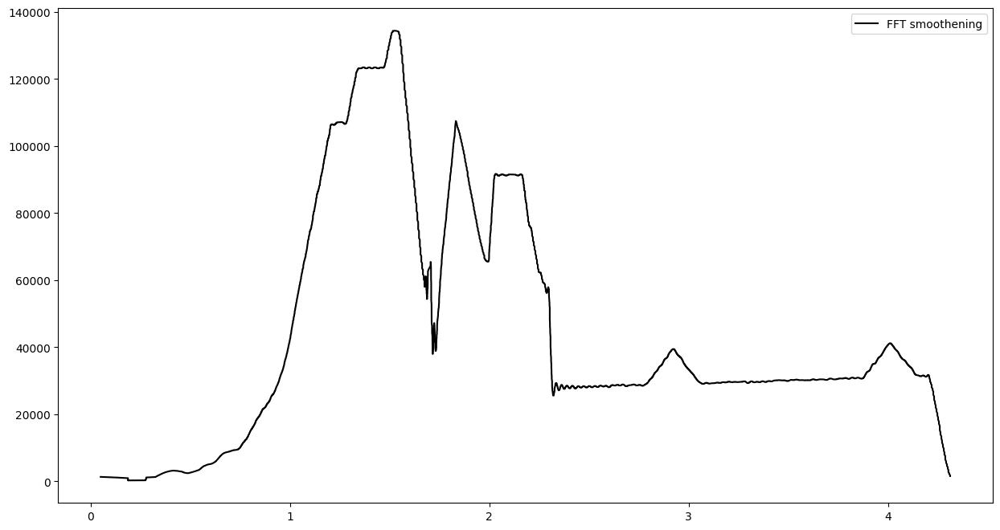

Reading ./Nebby/measurements/bbr-30-20-3000-tcp.csv...
total bytes processed: 1464.442 KBytes for bbr-30-20-3000 (unlimited)
6123   6123
RTT 0.1 Freq  10.0


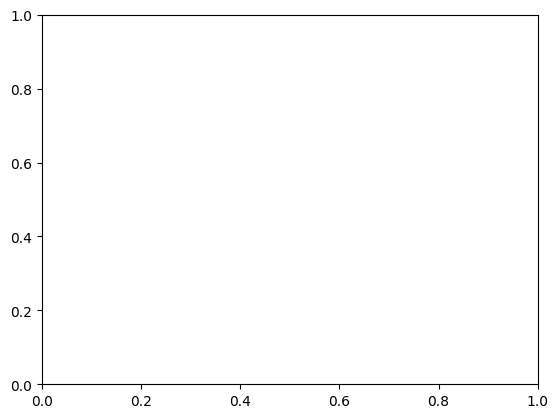

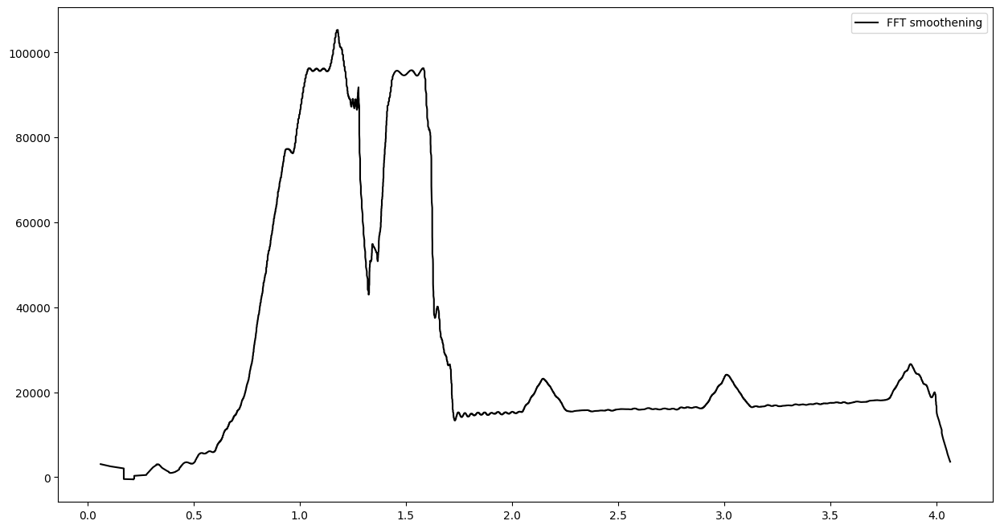

Reading ./Nebby/measurements/bbr-30-25-3000-tcp.csv...
total bytes processed: 1498.886 KBytes for bbr-30-25-3000 (unlimited)
6700   6700
RTT 0.1 Freq  10.0


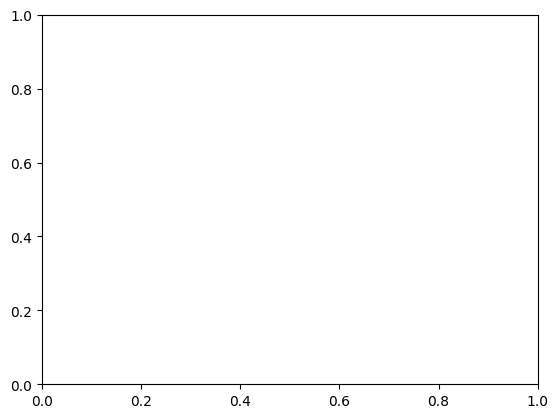

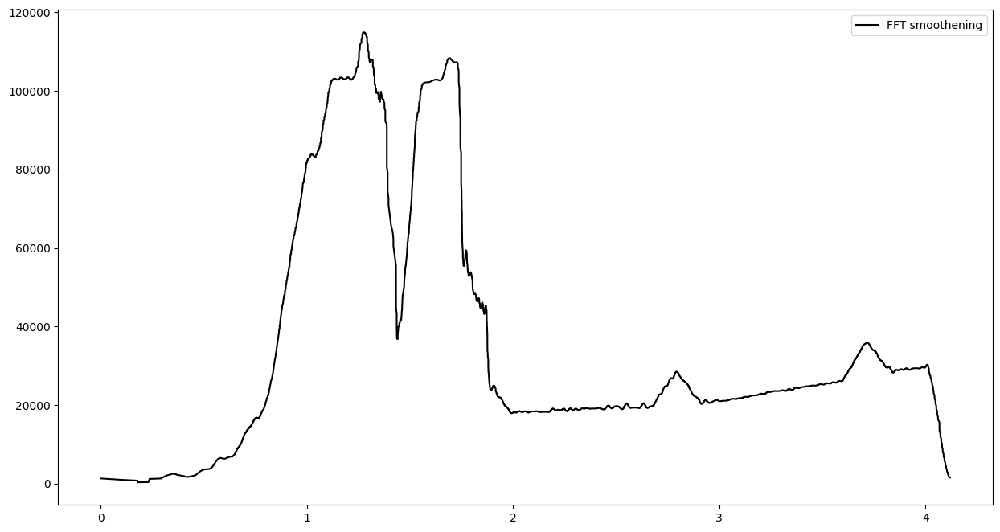

Reading ./Nebby/measurements/bbr-30-30-3000-tcp.csv...
total bytes processed: 1510.53 KBytes for bbr-30-30-3000 (unlimited)
6758   6758
RTT 0.1 Freq  10.0


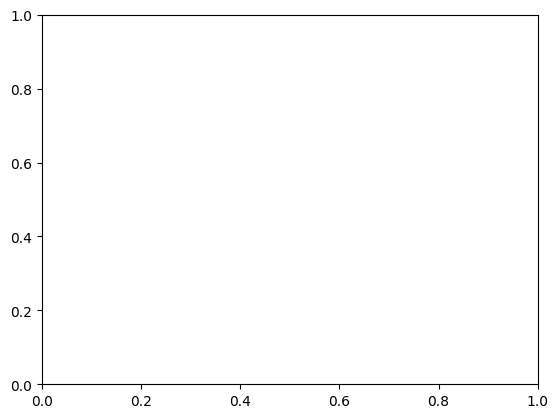

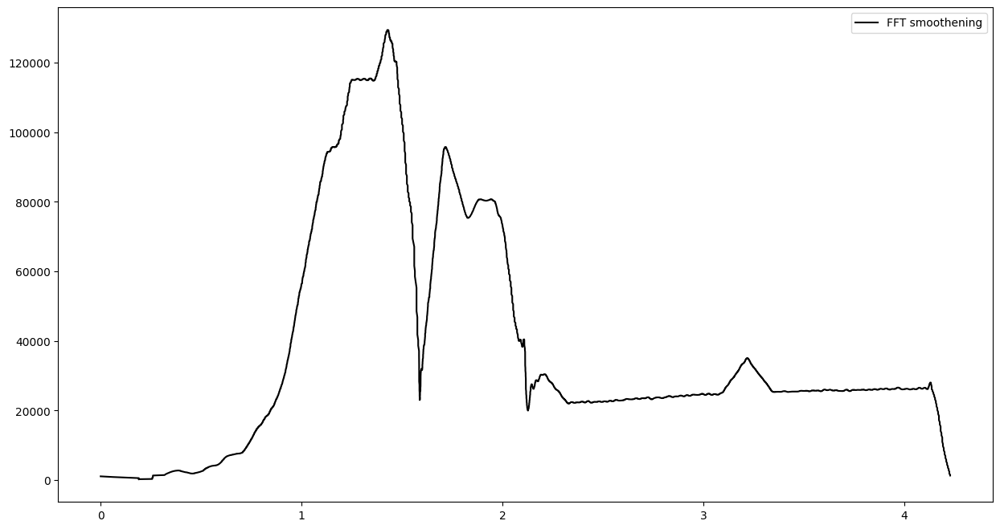

Reading ./Nebby/measurements/bbr-30-35-3000-tcp.csv...
total bytes processed: 1517.034 KBytes for bbr-30-35-3000 (unlimited)
6788   6788
RTT 0.1 Freq  10.0


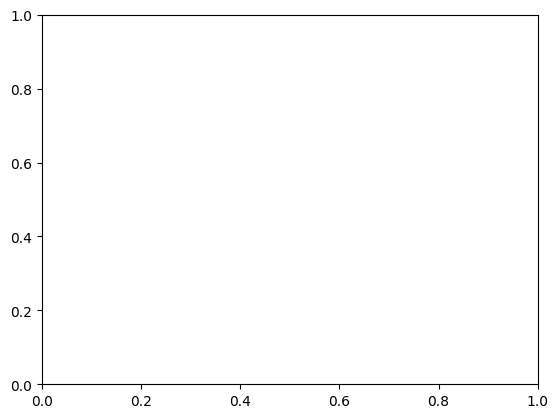

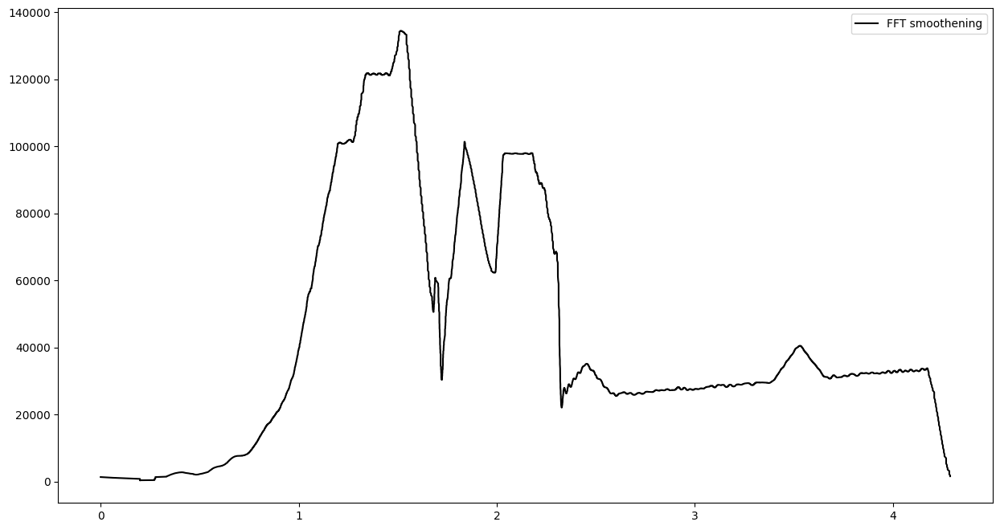

Reading ./Nebby/measurements/bbr-30-40-3000-tcp.csv...
total bytes processed: 1483.83 KBytes for bbr-30-40-3000 (unlimited)
6217   6217
RTT 0.1 Freq  10.0


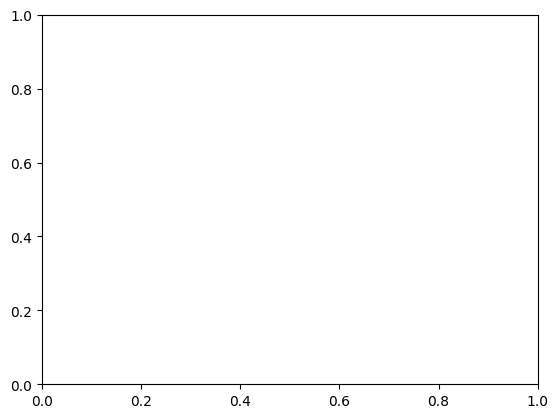

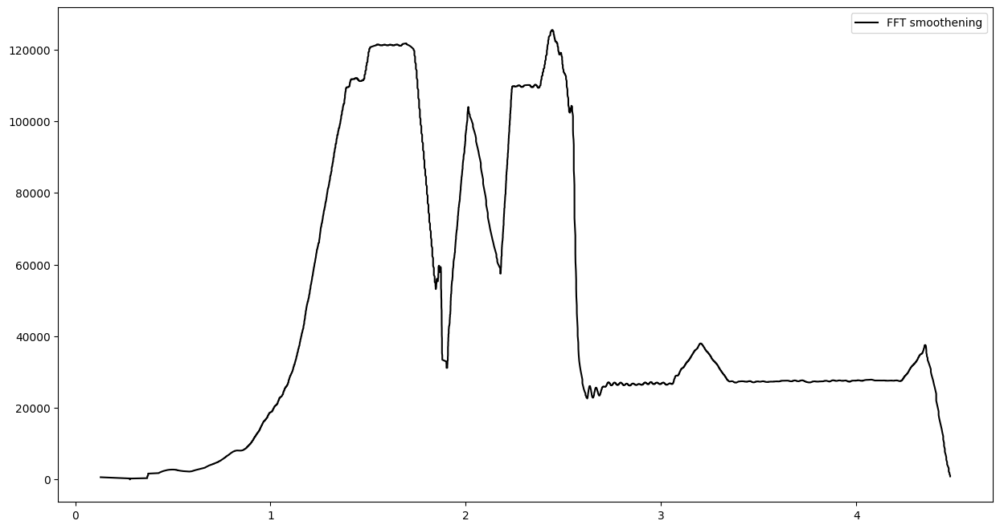

Reading ./Nebby/measurements/bbr-35-20-3000-tcp.csv...
total bytes processed: 1462.586 KBytes for bbr-35-20-3000 (unlimited)
6598   6598
RTT 0.1 Freq  10.0


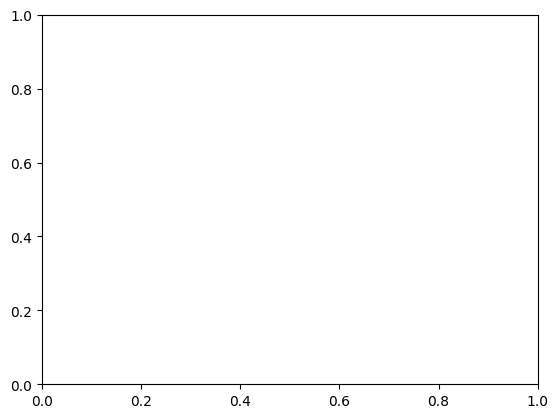

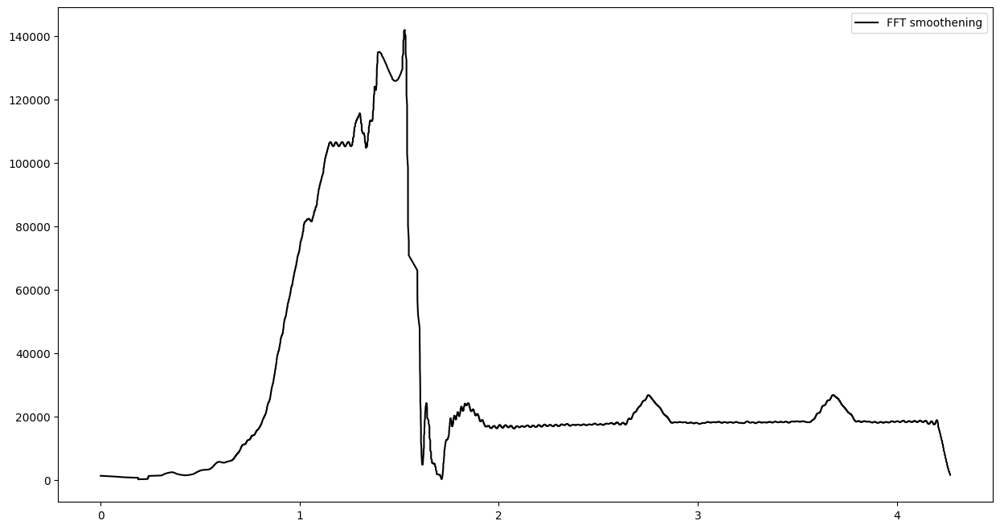

Reading ./Nebby/measurements/bbr-35-25-3000-tcp.csv...
total bytes processed: 1498.13 KBytes for bbr-35-25-3000 (unlimited)
6666   6666
RTT 0.1 Freq  10.0


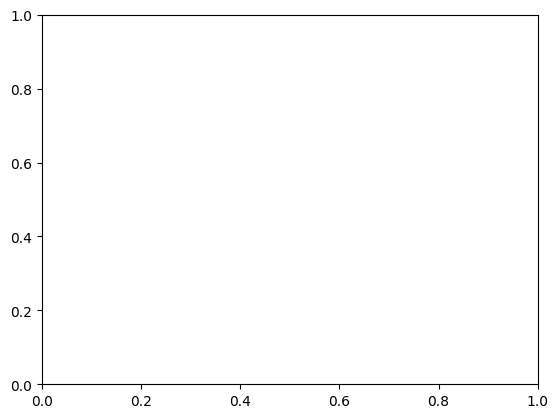

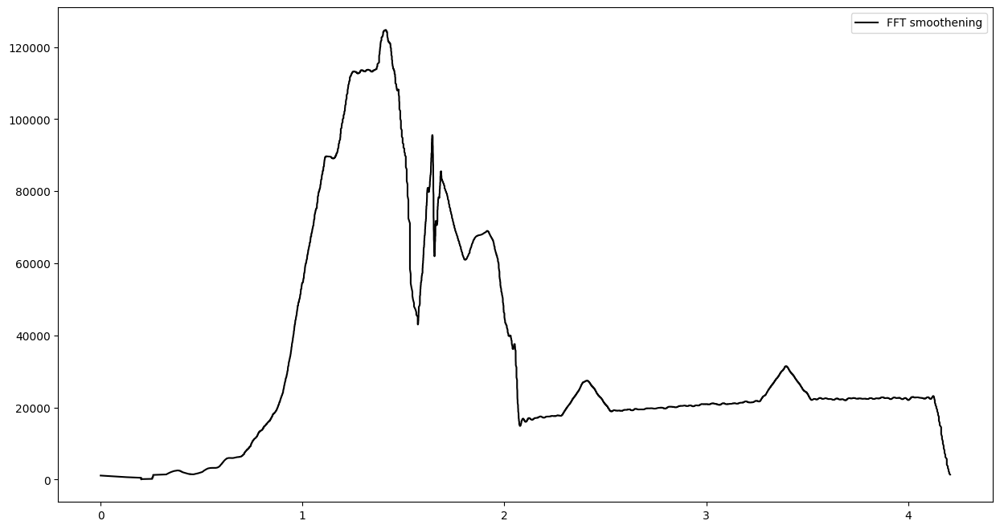

Reading ./Nebby/measurements/bbr-35-30-3000-tcp.csv...
total bytes processed: 1518.242 KBytes for bbr-35-30-3000 (unlimited)
6769   6769
RTT 0.1 Freq  10.0


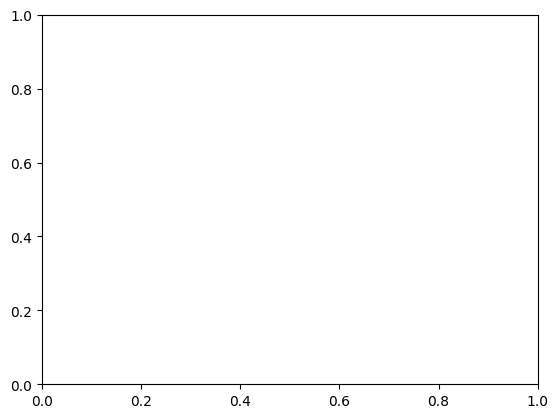

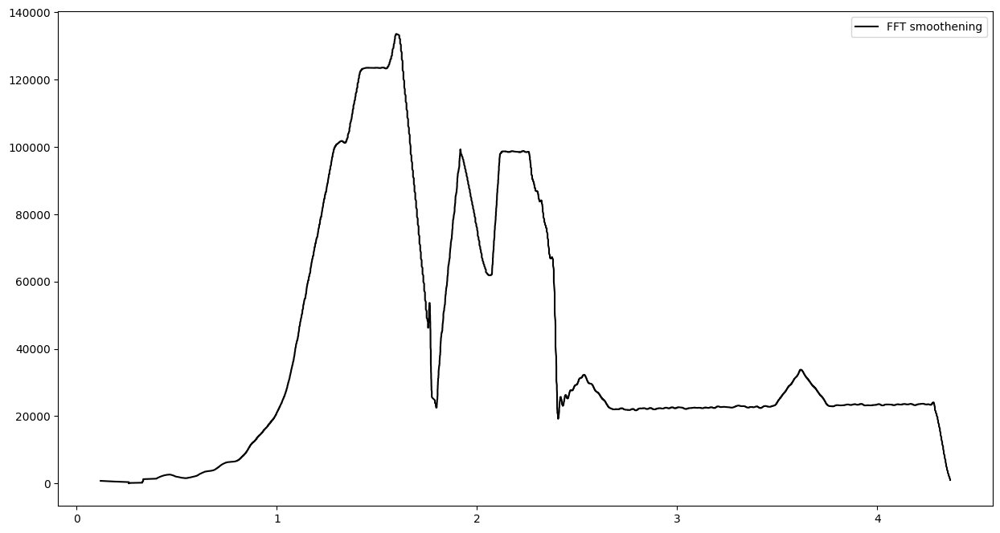

Reading ./Nebby/measurements/bbr-35-35-3000-tcp.csv...
total bytes processed: 1513.554 KBytes for bbr-35-35-3000 (unlimited)
6736   6736
RTT 0.1 Freq  10.0


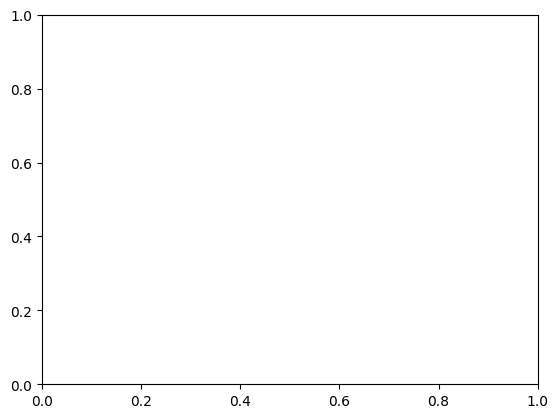

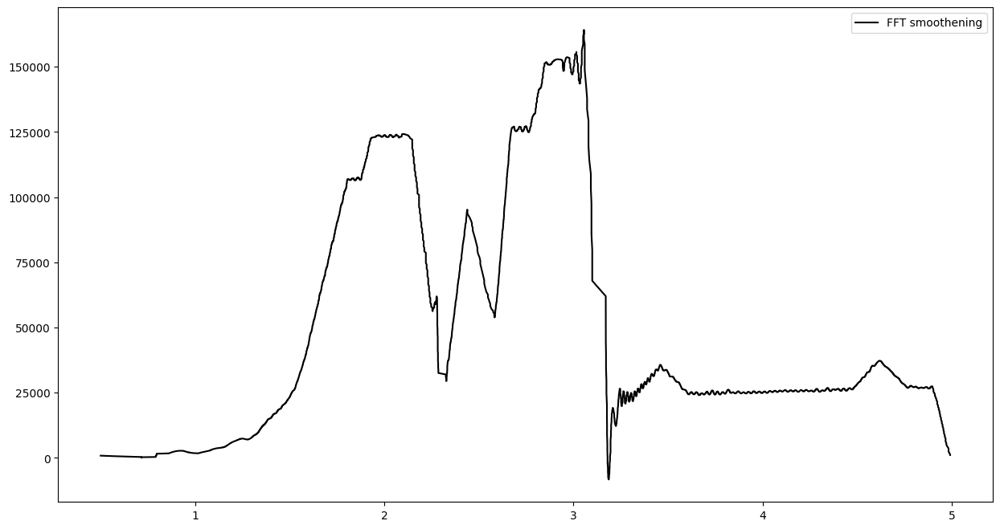

Reading ./Nebby/measurements/bbr-35-40-3000-tcp.csv...
total bytes processed: 1521.85 KBytes for bbr-35-40-3000 (unlimited)
6792   6792
RTT 0.1 Freq  10.0


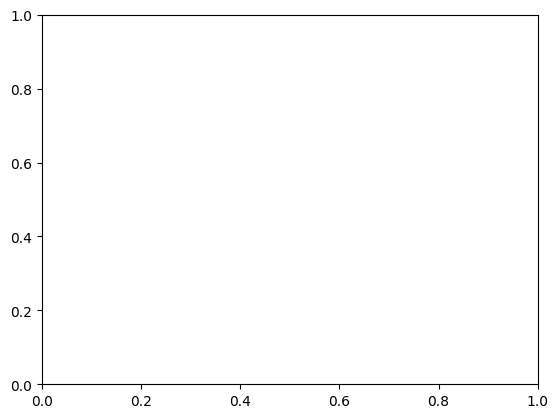

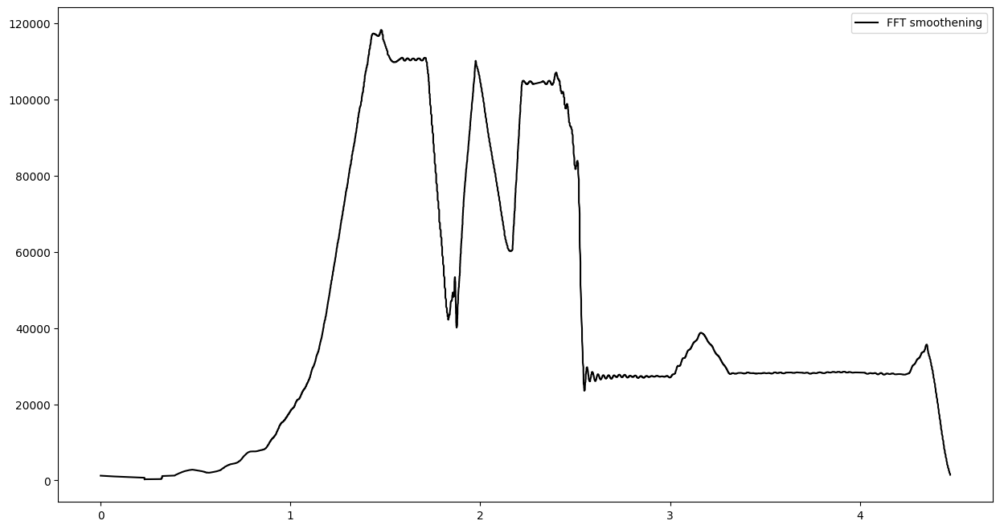

Reading ./Nebby/measurements/bbr-40-20-3000-tcp.csv...
total bytes processed: 1511.542 KBytes for bbr-40-20-3000 (unlimited)
6779   6779
RTT 0.1 Freq  10.0


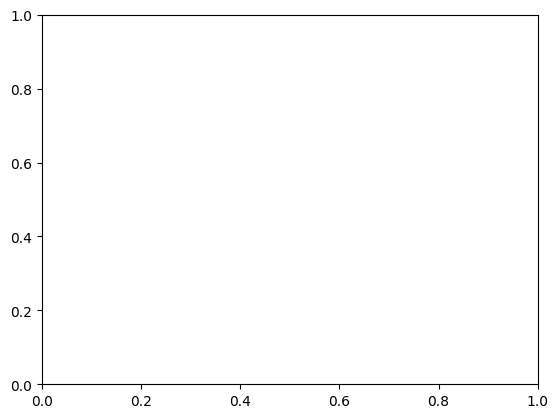

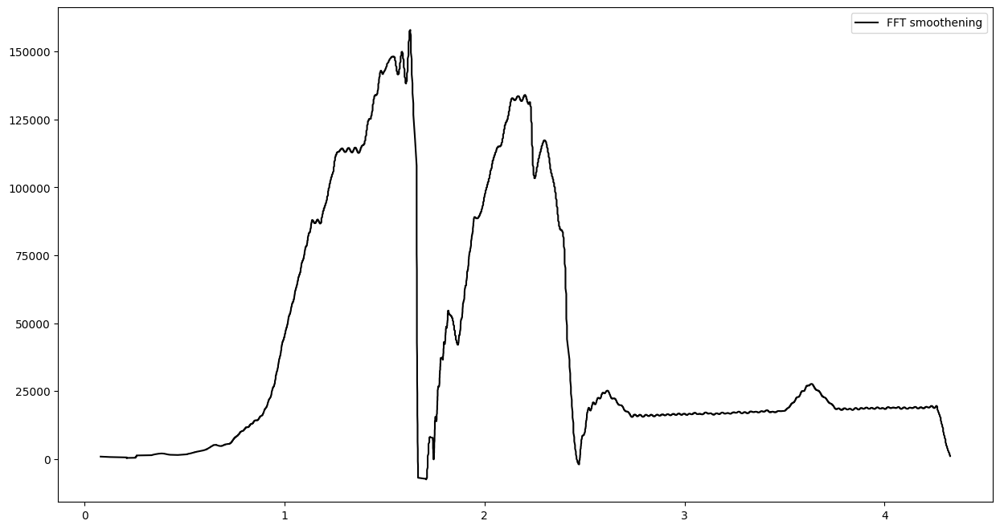

Reading ./Nebby/measurements/bbr-40-25-3000-tcp.csv...
total bytes processed: 1511.402 KBytes for bbr-40-25-3000 (unlimited)
6699   6699
RTT 0.1 Freq  10.0


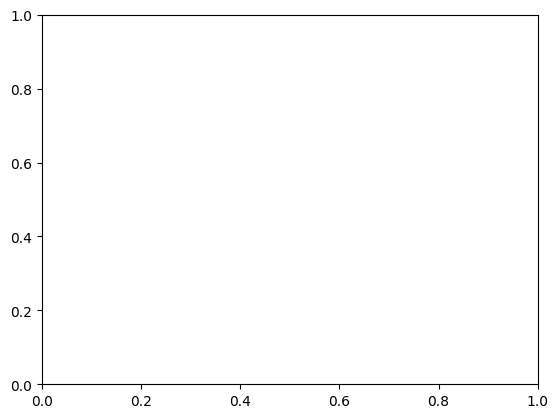

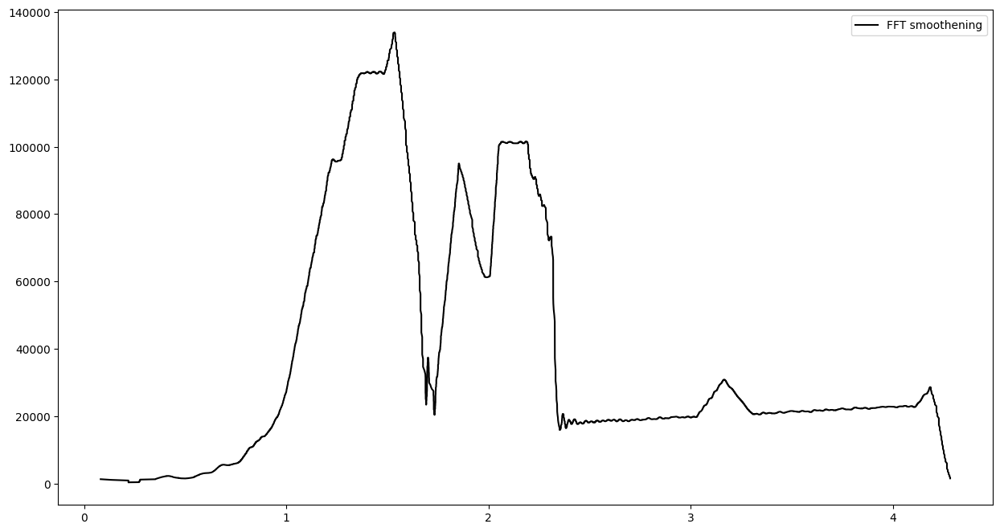

Reading ./Nebby/measurements/bbr-40-30-3000-tcp.csv...
total bytes processed: 1487.618 KBytes for bbr-40-30-3000 (unlimited)
6261   6261
RTT 0.1 Freq  10.0


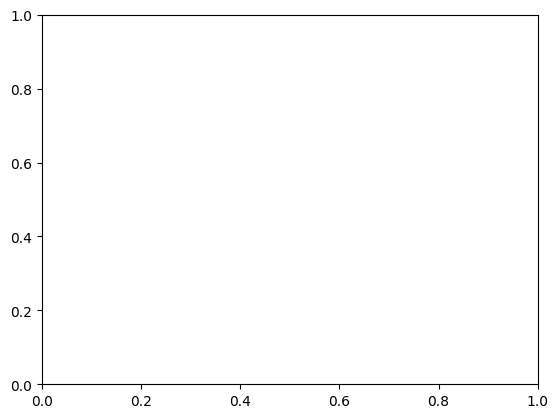

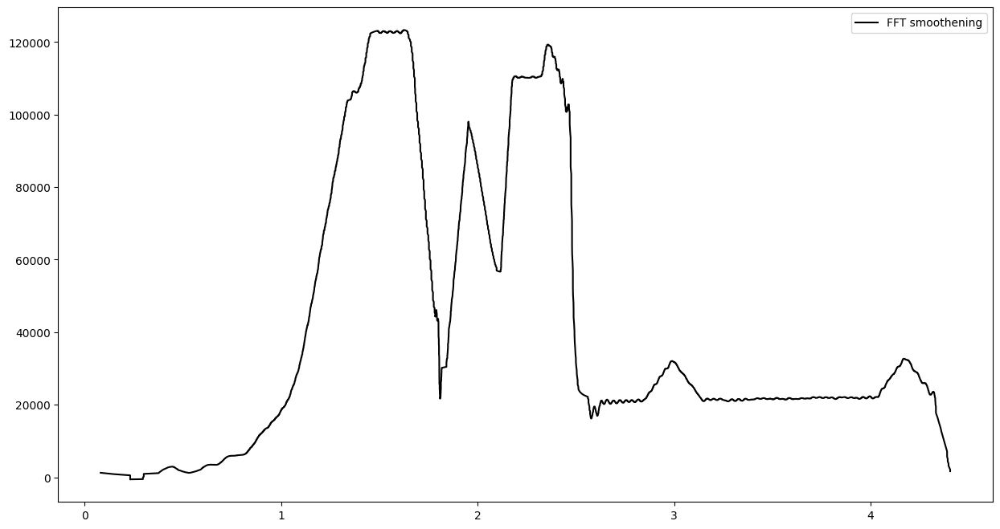

Reading ./Nebby/measurements/bbr-40-35-3000-tcp.csv...
total bytes processed: 1522.646 KBytes for bbr-40-35-3000 (unlimited)
6798   6798
RTT 0.1 Freq  10.0


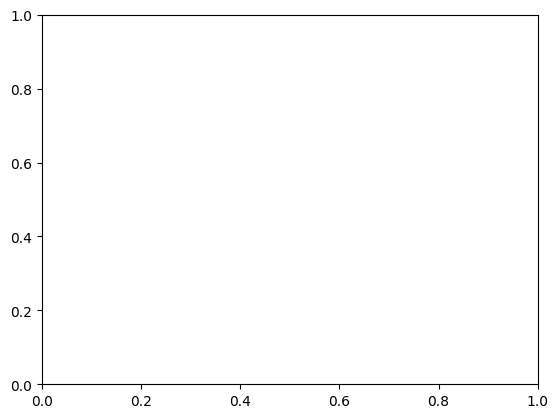

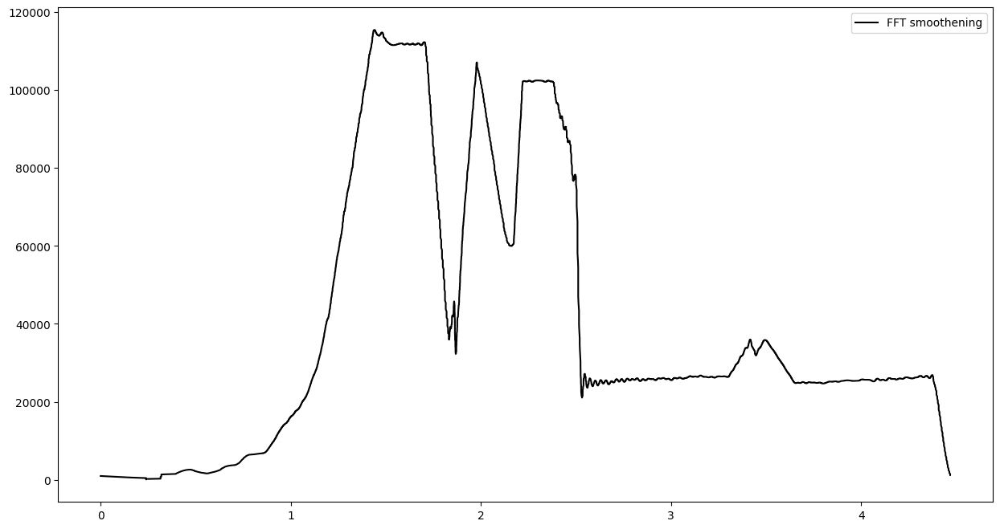

Reading ./Nebby/measurements/bbr-40-40-3000-tcp.csv...
total bytes processed: 1488.114 KBytes for bbr-40-40-3000 (unlimited)
6325   6325
RTT 0.1 Freq  10.0


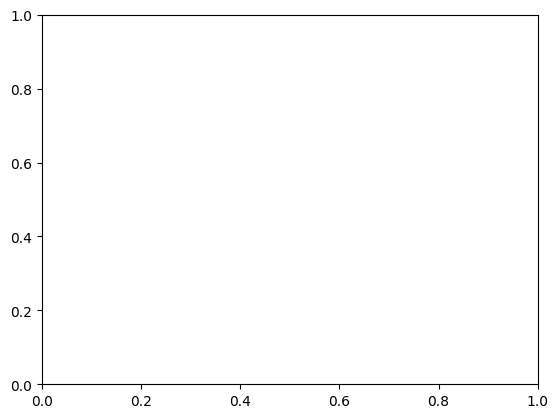

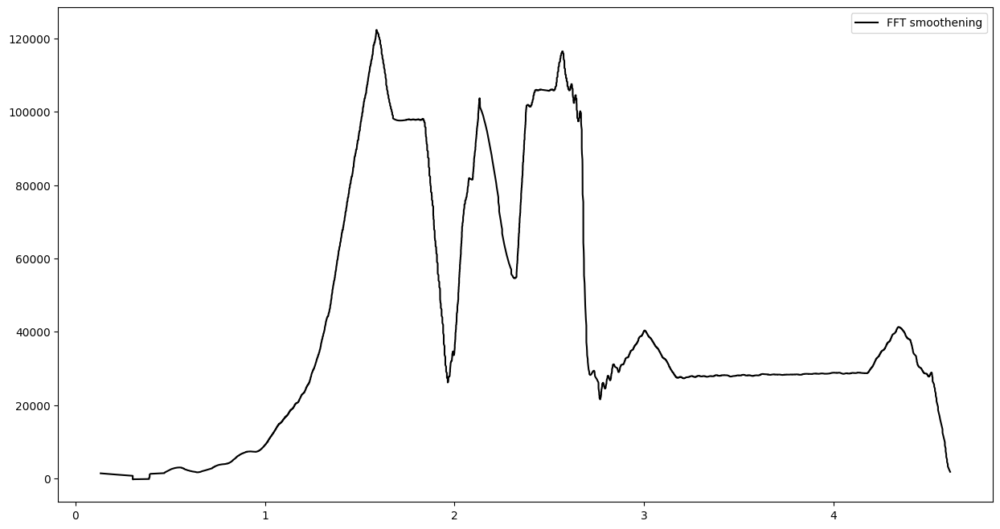

In [43]:
for f in bbr_files :
    fig, ax = plt.subplots()
    time,data = plot_bif(f)
    ts.append(data)

In [50]:
from tslearn.utils import to_time_series_dataset
X = to_time_series_dataset(ts)

In [49]:
!pip install numpy==1.21.6

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 9.5 MB/s eta 0:00:000m eta 0:00:010:00:01
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.3
    Uninstalling numpy-1.24.3:
      Successfully uninstalled numpy-1.24.3


In [51]:
from tslearn.clustering import TimeSeriesKMeans
model = TimeSeriesKMeans(n_clusters=3, metric="softdtw", max_iter=10)
labels = model.fit(X)

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (17,) + inhomogeneous part.

# Getting parameters from the graph for decision trees. 

### The cwnd decrease, the cwnd increase. 

In [233]:
f = "cubic"

In [34]:
def plot_bif(f):
    fig, ax = plt.subplots(1,1, figsize=(15,8))
#     get_bif(ax,f)
#     get_cwnd(ax,f)
#     get_ma(ax,f)
#     get_ema(ax,f)
#     get_wwlt(ax,f)
    time, data = get_fft_smoothening(ax,f)
#     ax.title.set_text(f)
    ax.legend()
    plt.show()
#     fig, ax = plt.subplots(1,1, figsize=(15,8))
#     ax.plot(new_time[5:], grad[5:], color='r', lw=0.8)
#     plt.show()
    return time, data

Reading ./Nebby/measurements/cubic-tcp.csv...
total bytes processed: 886.307 KBytes for cubic (unlimited)
3988   3988
RTT 0.1 Freq  10.0


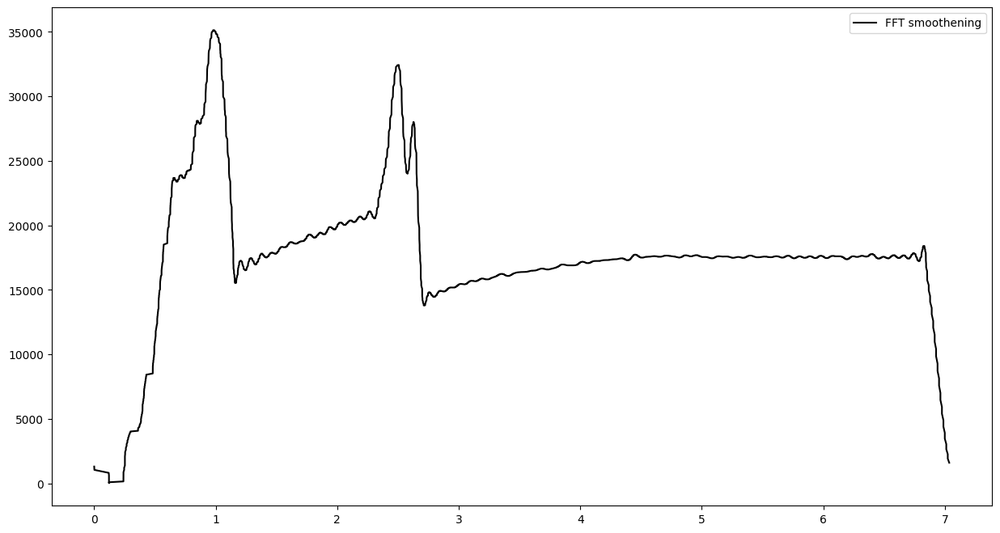

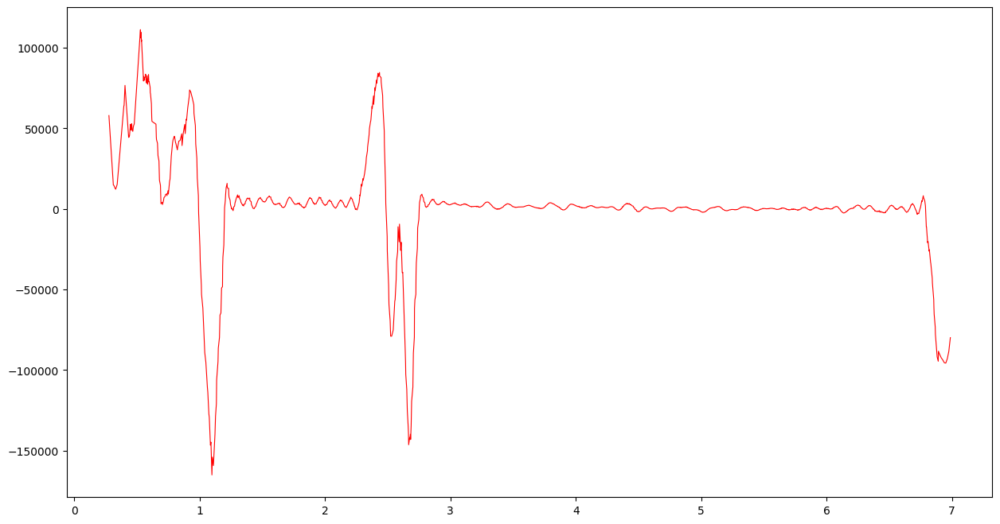

In [195]:
time, data = plot_bif("cubic")

### Using 1 RTT as the window size to calculate maximum and minimum

In [118]:
data[1], time[2]

(1037.8548357054724, 0.119562)

In [111]:
rtt = 0.1

In [131]:
from collections import Counter
diff = []
for i in range(1,len(time)):
    curr = round(time[i]-time[i-1],3)
    diff.append(curr)
Counter(diff)

Counter({0.0: 2132,
         0.002: 498,
         0.001: 491,
         0.004: 269,
         0.009: 143,
         0.005: 128,
         0.006: 105,
         0.003: 64,
         0.01: 61,
         0.008: 35,
         0.007: 30,
         0.012: 13,
         0.011: 12,
         0.118: 1,
         0.119: 1,
         0.062: 1,
         0.053: 1,
         0.03: 1,
         0.013: 1})

In [113]:
step = 0.002

In [161]:
from sortedcontainers import SortedDict
from collections import OrderedDict

In [147]:
def get_grad(dt):
    first = next(iter(dt))
    last = next(reversed(dt))
    time_first = dt[first][0]
    time_last = dt[last][0]
    grad = (last-first)/(time_last-time_first)
    return grad, (first, last, time_first, time_last)

In [238]:
left = 0
right = 0
grad = []
grad_meta = []
# dt = SortedDict()
dt = OrderedDict()
# continue loop till we reach the end of the right
while right < len(time) and left < len(time):
    # choose a right and while choosing get max and min
    while right < len(time) and time[right] - time[left] < rtt :
        if data[right] not in dt :
            dt[data[right]] = list()
        dt[data[right]].append(time[right])
        right+=1
    # save gradient and the data and time period with it
    curr_grad, curr_meta = get_grad(dt) 
    grad.append(curr_grad)
    grad_meta.append(curr_meta)
    # choose the next left
    prev_left = left 
    while left < len(time) and time[left] - time[prev_left] < step :
        if data[left] in dt :
            dt[data[left]].pop(0)
            if len(dt[data[left]])==0:
                del dt[data[left]]
        left+=1


In [239]:
len(grad), len(time), len(data)

(1359, 3988, 3988)

In [240]:
new_time = []
for i in range(len(grad)):
    t = (grad_meta[i][3] + grad_meta[i][2])/2
    new_time.append(t)

In [241]:
len(new_time)

1359

In [242]:
color = []
i = 0
for t in range(len(new_time)):
    while i < len(time) and time[i]<new_time[t]:
        if(grad[t]>0):
            color.append(1)
        else :
            color.append(0)
        i+=1
while i < len(time) :
    if(grad[len(new_time)-1]>0):
        color.append(1)
    else :
        color.append(0)
    i+=1

In [243]:
len(color)

3988

In [244]:
pos = []
neg = []
for i in range(len(data)):
    if color[i]==1:
        pos.append(data[i])
        neg.append(0)
    else :
        pos.append(0)
        neg.append(data[i])

In [245]:
len(pos), len(neg)

(3988, 3988)

In [246]:
len(time)

3988

Reading ./Nebby/measurements/cubic-tcp.csv...
total bytes processed: 886.307 KBytes for cubic (unlimited)
3988   3988
RTT 0.1 Freq  10.0


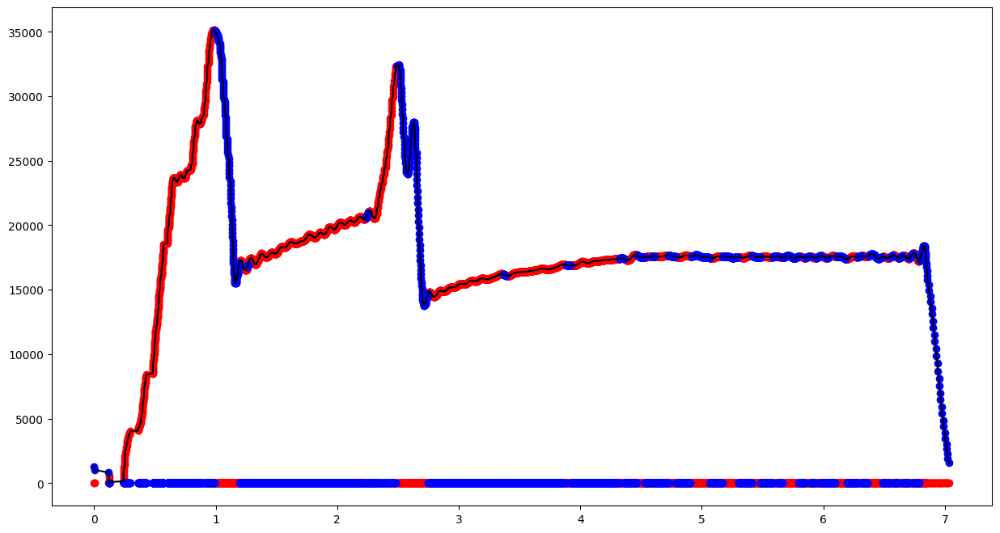

In [247]:
fig, ax = plt.subplots(1,1, figsize=(15,8))
time, data = get_fft_smoothening(ax,f)
ax.scatter(time,pos, color='r')
ax.scatter(time,neg,color='b')
plt.show()

In [201]:
len(time)

3988

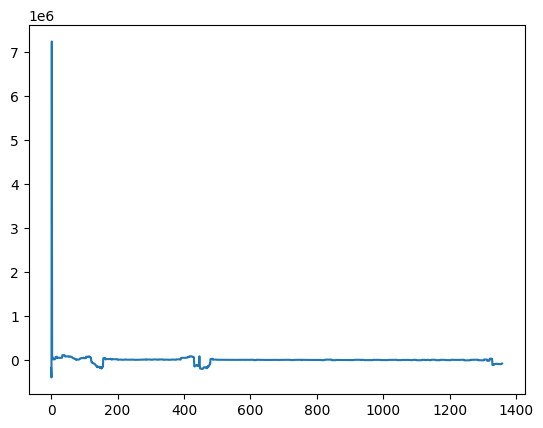

In [158]:
plt.plot(grad)

# Plotting the sites BIF by applying the filter

In [46]:
sites = "google youtube facebook twitter wikipedia amazon instagram linkedin reddit whatsapp openai yahoo bing xvideos live pornhub microsoft vk"

In [47]:
sites = sites.split(" ")

In [50]:
def plot_bif(files):
    for f in files:
        fig, ax = plt.subplots(1,1, figsize=(15,8))
        time, data = get_bif(ax,f)
        time, data = get_fft_smoothening(ax,f)
        plt.show()

Reading ./Nebby/measurements/google-tcp.csv...
total bytes processed: 24.406 KBytes for google (unlimited)
Reading ./Nebby/measurements/google-tcp.csv...
total bytes processed: 24.406 KBytes for google (unlimited)
128   128
RTT 0.1 Freq  10.0


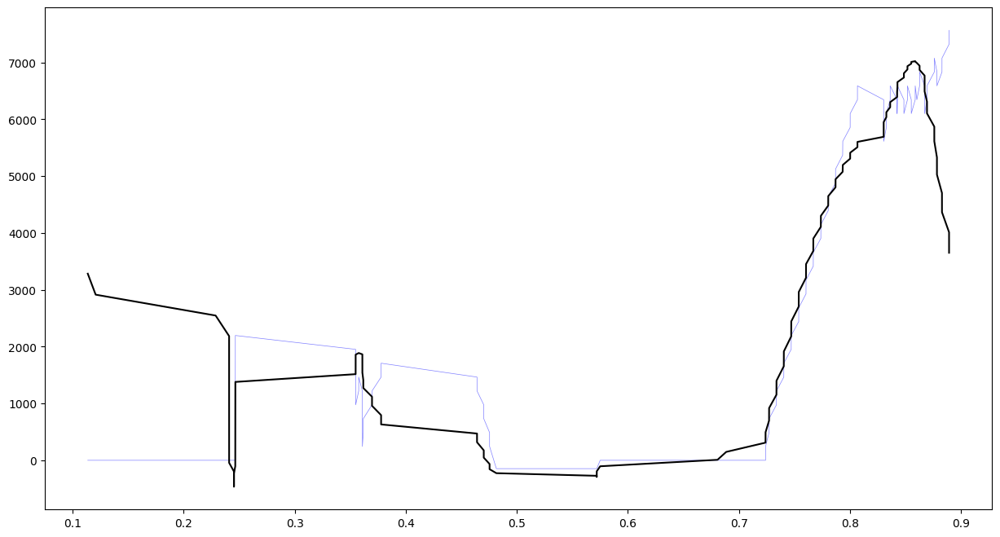

Reading ./Nebby/measurements/youtube-tcp.csv...
total bytes processed: 938.233 KBytes for youtube (unlimited)
Reading ./Nebby/measurements/youtube-tcp.csv...
total bytes processed: 938.233 KBytes for youtube (unlimited)
4166   4166
RTT 0.1 Freq  10.0


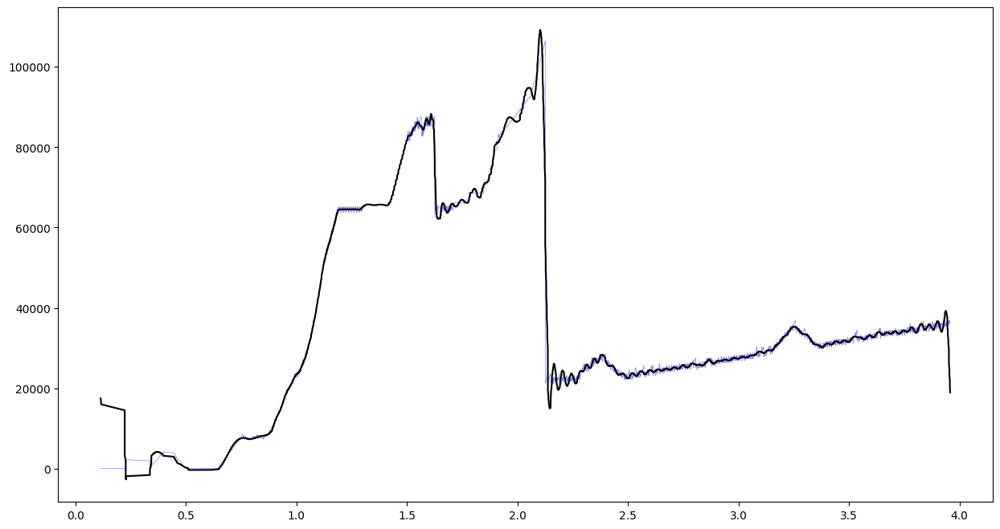

Reading ./Nebby/measurements/facebook-tcp.csv...
total bytes processed: 20.034 KBytes for facebook (unlimited)
Reading ./Nebby/measurements/facebook-tcp.csv...
total bytes processed: 20.034 KBytes for facebook (unlimited)
110   110
RTT 0.1 Freq  10.0


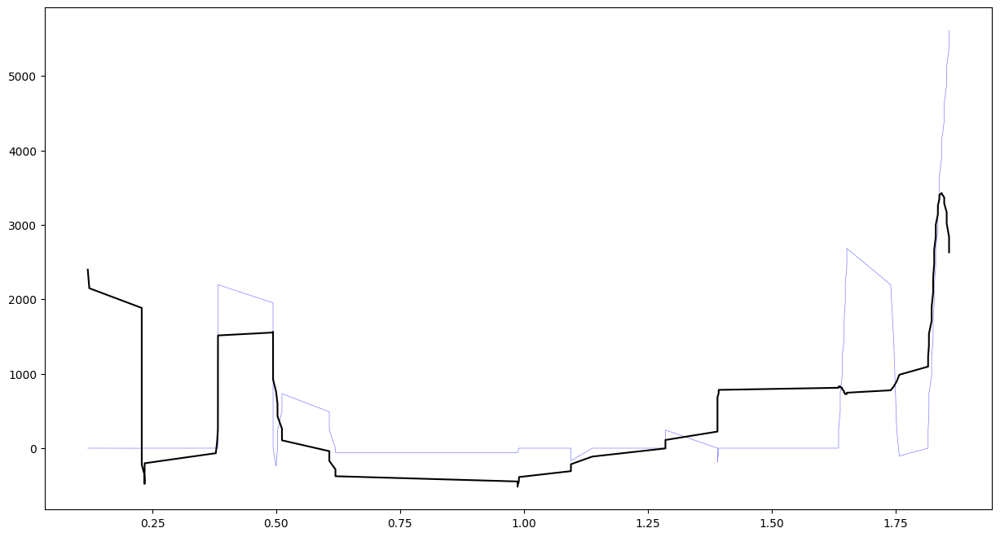

Reading ./Nebby/measurements/twitter-tcp.csv...
total bytes processed: 201.061 KBytes for twitter (unlimited)
Reading ./Nebby/measurements/twitter-tcp.csv...
total bytes processed: 201.061 KBytes for twitter (unlimited)
71   71
RTT 0.1 Freq  10.0


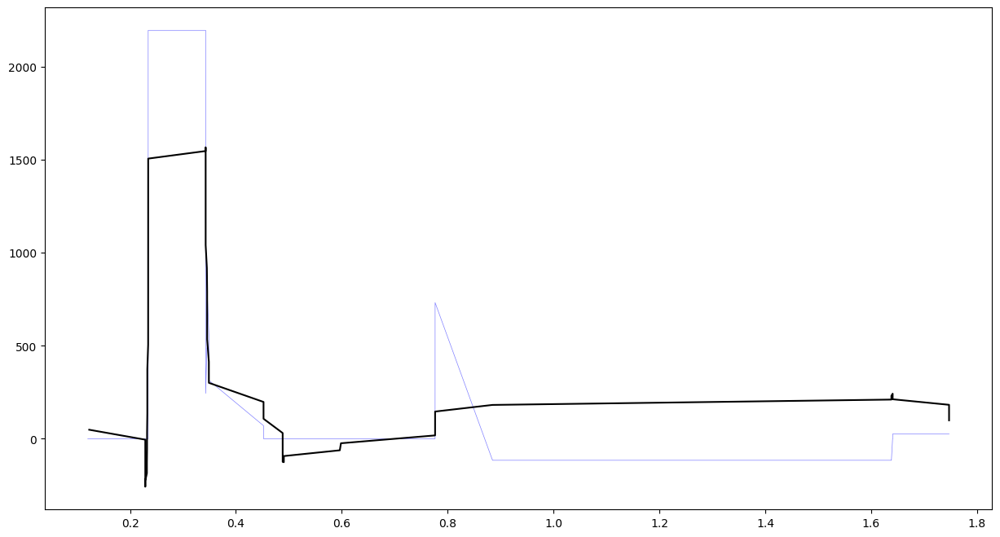

Reading ./Nebby/measurements/wikipedia-tcp.csv...
total bytes processed: 28.041 KBytes for wikipedia (unlimited)
Reading ./Nebby/measurements/wikipedia-tcp.csv...
total bytes processed: 28.041 KBytes for wikipedia (unlimited)
49   49
RTT 0.1 Freq  10.0


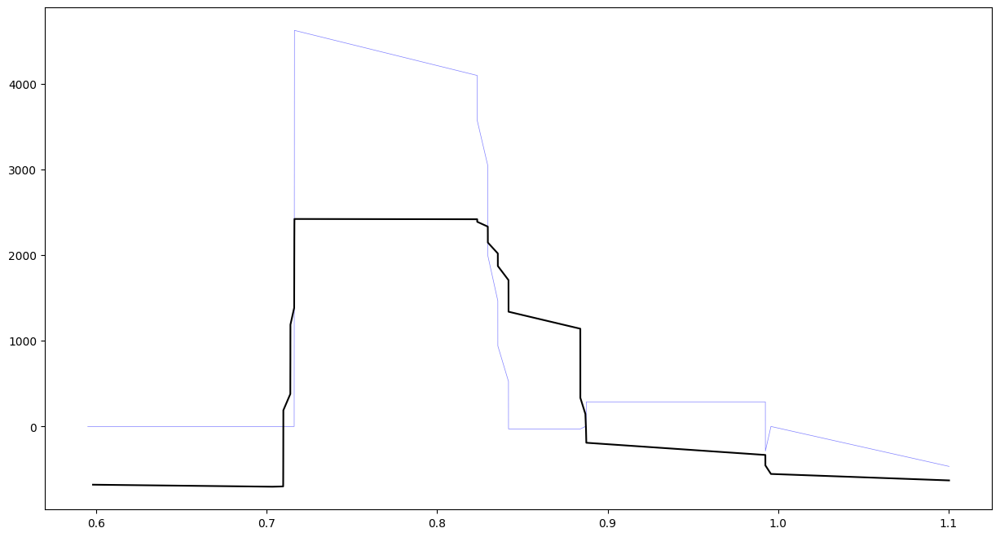

Reading ./Nebby/measurements/amazon-tcp.csv...
total bytes processed: 14.771 KBytes for amazon (unlimited)
Reading ./Nebby/measurements/amazon-tcp.csv...
total bytes processed: 14.771 KBytes for amazon (unlimited)
80   80
RTT 0.1 Freq  10.0


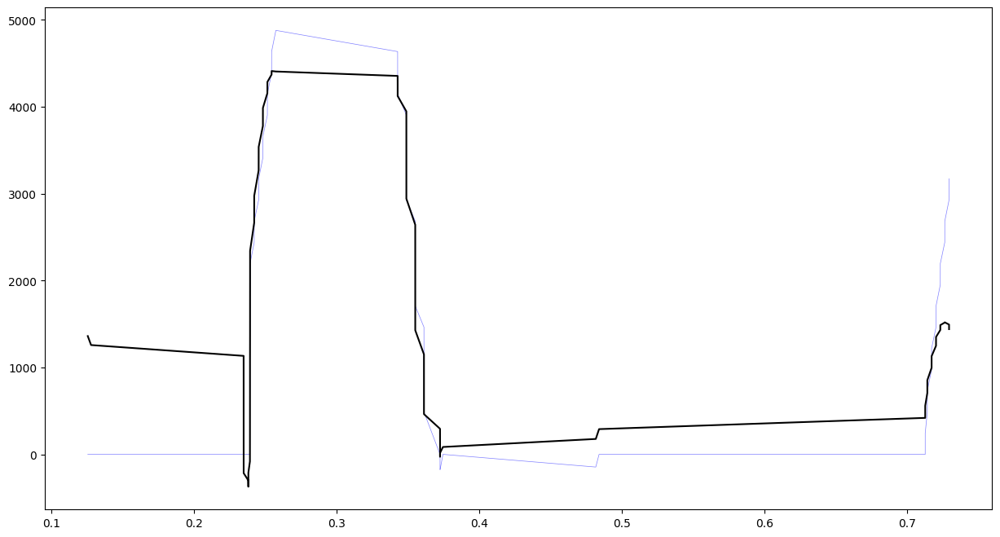

Reading ./Nebby/measurements/instagram-tcp.csv...
total bytes processed: 86.291 KBytes for instagram (unlimited)
Reading ./Nebby/measurements/instagram-tcp.csv...
total bytes processed: 86.291 KBytes for instagram (unlimited)
72   72
RTT 0.1 Freq  10.0


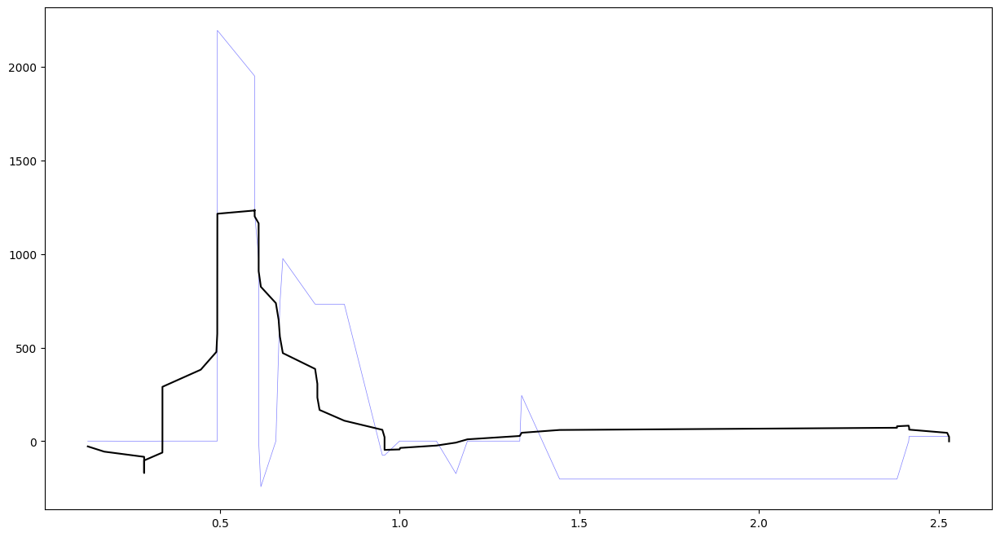

Reading ./Nebby/measurements/linkedin-tcp.csv...
total bytes processed: 155.452 KBytes for linkedin (unlimited)
Reading ./Nebby/measurements/linkedin-tcp.csv...
total bytes processed: 155.452 KBytes for linkedin (unlimited)
427   427
RTT 0.1 Freq  10.0


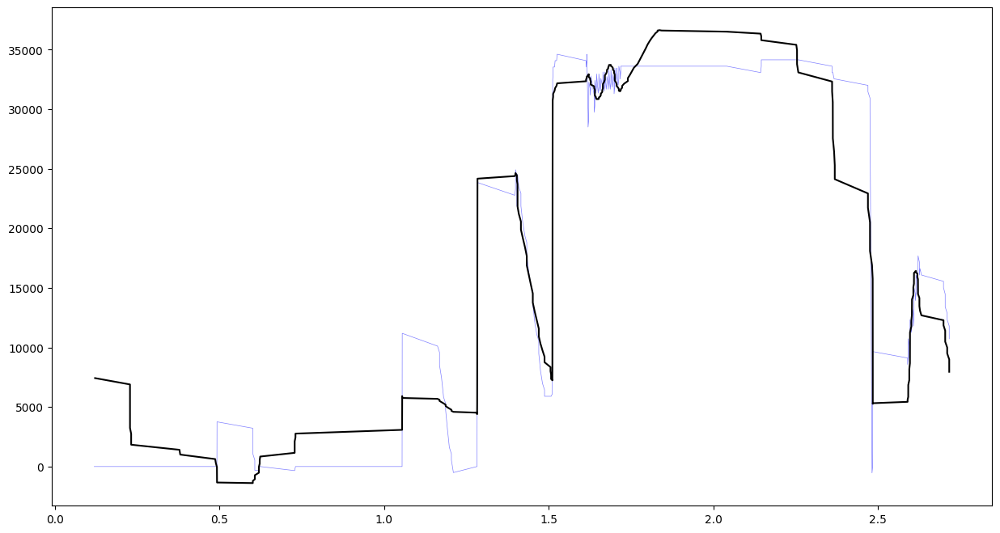

Reading ./Nebby/measurements/reddit-tcp.csv...
total bytes processed: 1418.075 KBytes for reddit (unlimited)
Reading ./Nebby/measurements/reddit-tcp.csv...
total bytes processed: 1418.075 KBytes for reddit (unlimited)
61   61
RTT 0.1 Freq  10.0


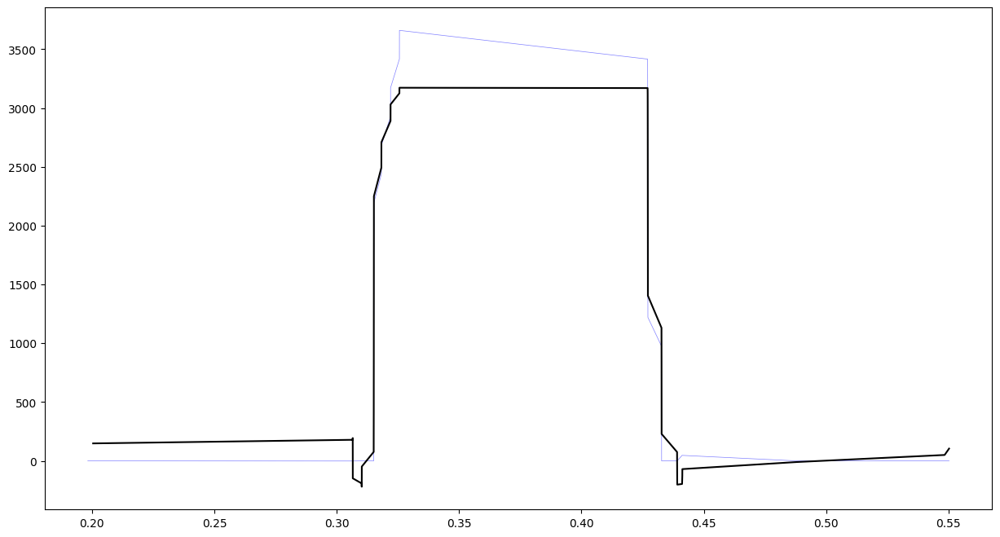

Reading ./Nebby/measurements/whatsapp-tcp.csv...
total bytes processed: 38.292 KBytes for whatsapp (unlimited)
Reading ./Nebby/measurements/whatsapp-tcp.csv...
total bytes processed: 38.292 KBytes for whatsapp (unlimited)
63   63
RTT 0.1 Freq  10.0


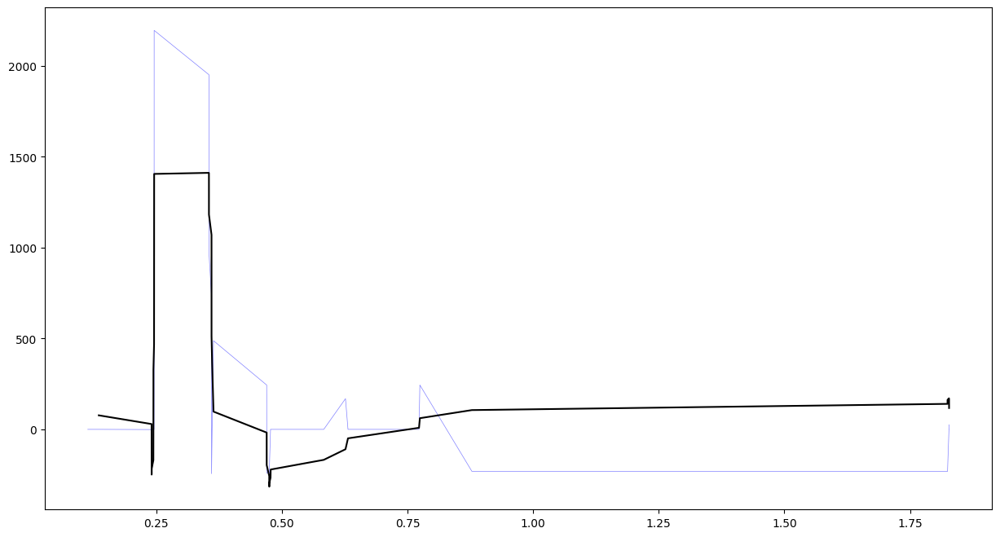

Reading ./Nebby/measurements/openai-tcp.csv...
total bytes processed: 145.052 KBytes for openai (unlimited)
Reading ./Nebby/measurements/openai-tcp.csv...
total bytes processed: 145.052 KBytes for openai (unlimited)
49   49
RTT 0.1 Freq  10.0


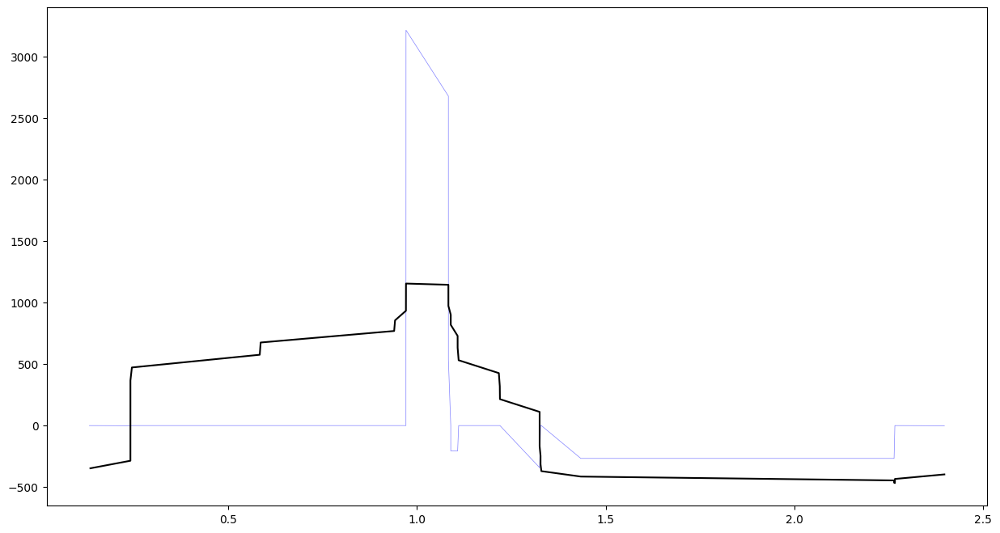

Reading ./Nebby/measurements/yahoo-tcp.csv...
total bytes processed: 1610.84 KBytes for yahoo (unlimited)
Reading ./Nebby/measurements/yahoo-tcp.csv...
total bytes processed: 1610.84 KBytes for yahoo (unlimited)
7245   7245
RTT 0.1 Freq  10.0


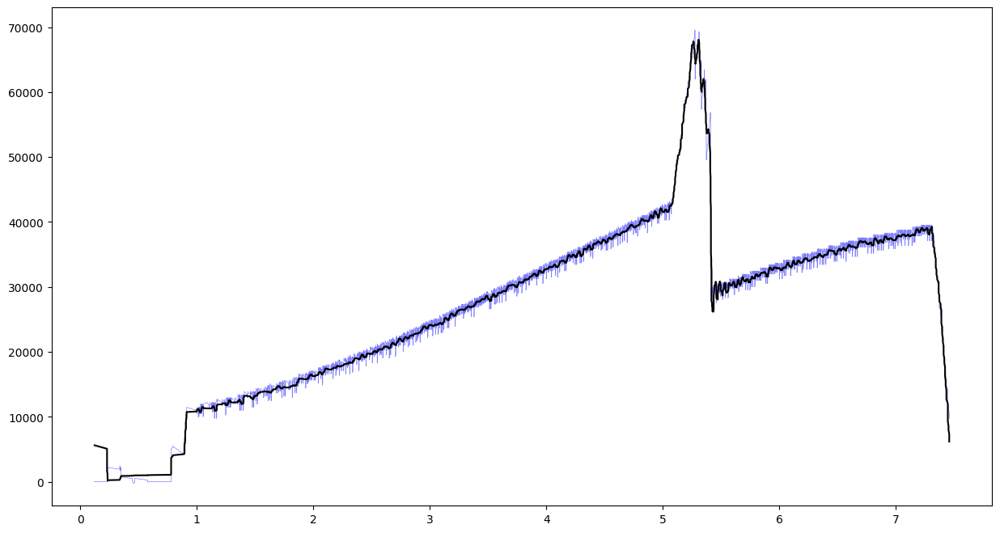

Reading ./Nebby/measurements/bing-tcp.csv...
total bytes processed: 54.777 KBytes for bing (unlimited)
Reading ./Nebby/measurements/bing-tcp.csv...
total bytes processed: 54.777 KBytes for bing (unlimited)
136   136
RTT 0.1 Freq  10.0


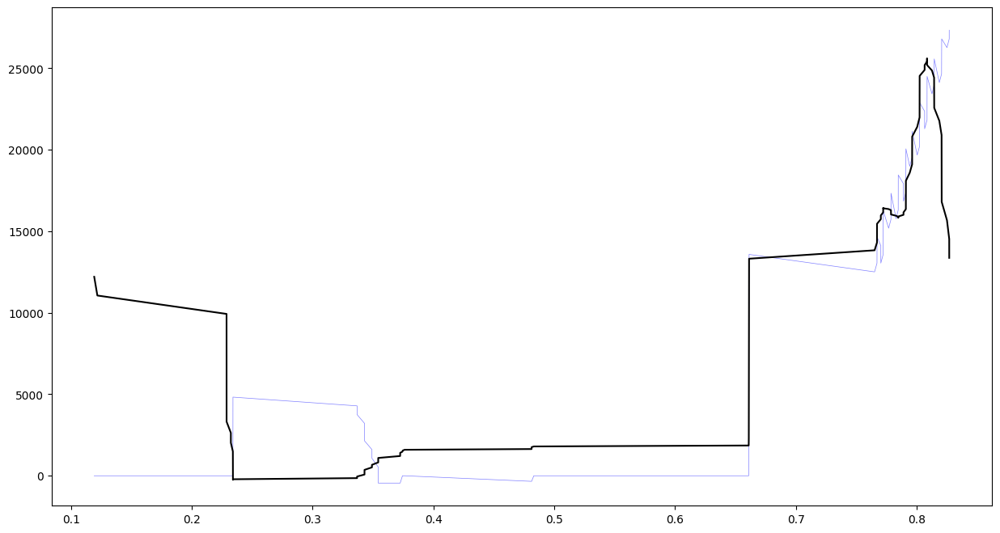

Reading ./Nebby/measurements/xvideos-tcp.csv...
total bytes processed: 91.347 KBytes for xvideos (unlimited)
Reading ./Nebby/measurements/xvideos-tcp.csv...
total bytes processed: 91.347 KBytes for xvideos (unlimited)
416   416
RTT 0.1 Freq  10.0


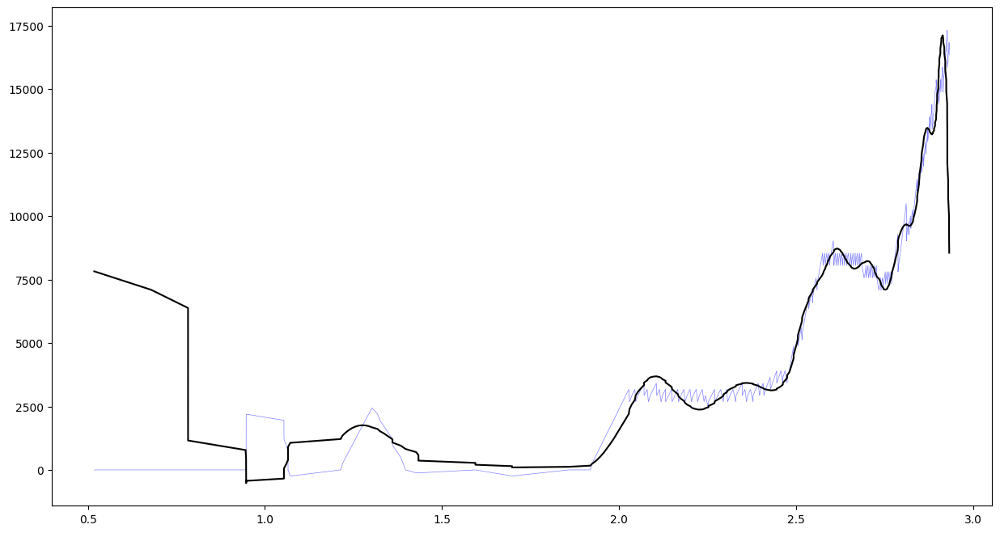

Reading ./Nebby/measurements/live-tcp.csv...
total bytes processed: 64.276 KBytes for live (unlimited)
Reading ./Nebby/measurements/live-tcp.csv...
total bytes processed: 64.276 KBytes for live (unlimited)
44   44
RTT 0.1 Freq  10.0


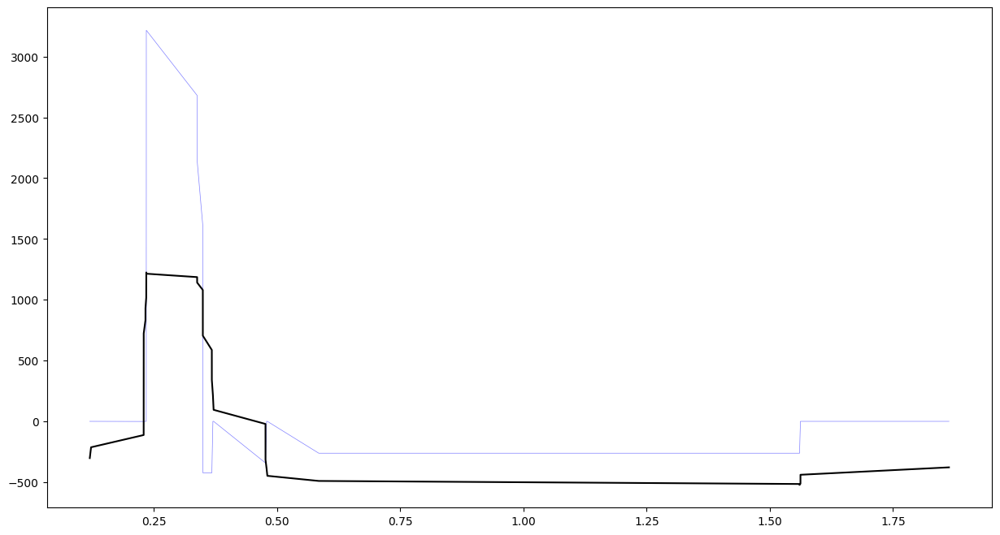

Reading ./Nebby/measurements/pornhub-tcp.csv...
total bytes processed: 1068.354 KBytes for pornhub (unlimited)
Reading ./Nebby/measurements/pornhub-tcp.csv...
total bytes processed: 1068.354 KBytes for pornhub (unlimited)
4429   4429
RTT 0.1 Freq  10.0


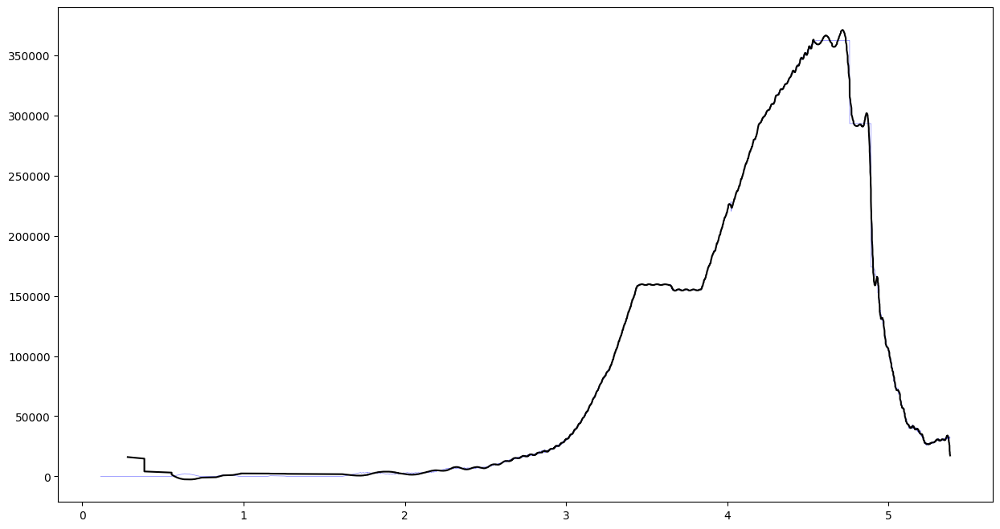

Reading ./Nebby/measurements/microsoft-tcp.csv...
total bytes processed: 10.613 KBytes for microsoft (unlimited)
Reading ./Nebby/measurements/microsoft-tcp.csv...
total bytes processed: 10.613 KBytes for microsoft (unlimited)
69   69
RTT 0.1 Freq  10.0


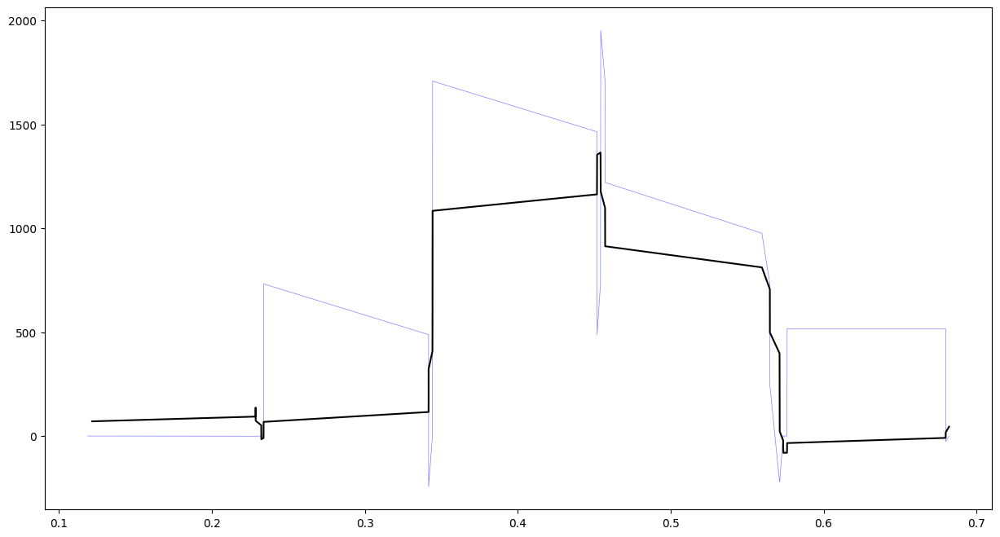

Reading ./Nebby/measurements/vk-tcp.csv...
total bytes processed: 205.021 KBytes for vk (unlimited)
Reading ./Nebby/measurements/vk-tcp.csv...
total bytes processed: 205.021 KBytes for vk (unlimited)
48   48
RTT 0.1 Freq  10.0


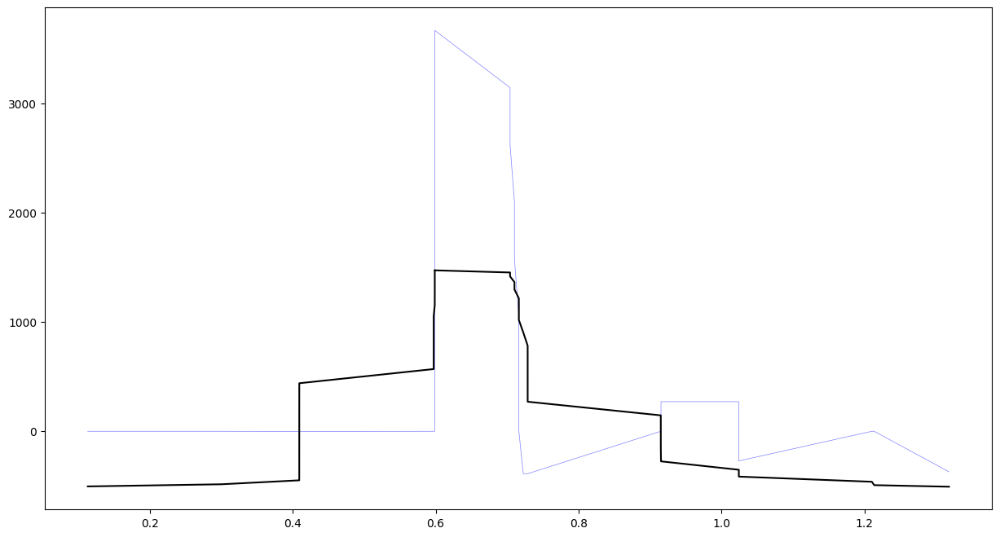

In [52]:
plot_bif(sites)

# Calculating the DTW of CWND with all filtered and unfiltered BIF

In [27]:
from datetime import datetime

In [28]:
from scipy.spatial.distance import euclidean
from fastdtw import fastdtw

In [54]:
from dtw import dtw

Importing the dtw module. When using in academic works please cite:
  T. Giorgino. Computing and Visualizing Dynamic Time Warping Alignments in R: The dtw Package.
  J. Stat. Soft., doi:10.18637/jss.v031.i07.



In [ ]:
f = "cubic"
ds = []
labels = []
fig, ax = plt.subplots(1,1, figsize=(15,8))
time_cwnd, data_cwnd = get_cwnd(ax,f)
time, data = get_bif(ax,f)
distance, path = fastdtw(data_cwnd, data, dist=euclidean)
print("BIF Error ", distance)
ds.append(distance)
labels.append("BIF")

time, data = get_ma(ax,f)
distance, path = fastdtw(data_cwnd, data, dist=euclidean)
print("MA Error ", distance)
ds.append(distance)
labels.append("MA")

time, data = get_ema(ax,f)
distance, path = fastdtw(data_cwnd, data, dist=euclidean)
print("EMA Error ", distance)
ds.append(distance)
labels.append("EMA")


time, data = get_fft_smoothening(ax,f)
distance, path = fastdtw(data_cwnd, data, dist=euclidean)
print("FFT Error ", distance)
ds.append(distance)
labels.append("FFT")
ax.title.set_text(f)
ax.legend()
plt.show()

plt.bar(labels, ds, color ='maroon',width = 0.4)
plt.show()

In [1]:
def plot_one_dtw(files):
    for f in files:
        fig, ax = plt.subplots(1,1, figsize=(15,8))
        time_cwnd, data_cwnd = get_cwnd(ax,f)
        time, data = get_bif(ax,f)
        start_time = datetime.now()
        distance, path = fastdtw(data_cwnd, data, dist=euclidean)
        end_time = datetime.now()
        print("Time taken in seconds", end_time - start_time)
        print("The error : ", distance)
#         time, data = get_ma(ax,f)
#         time, data = get_ema(ax,f)
#         time, data = get_fft_smoothening(ax,f)
        ax.title.set_text(f)
        ax.legend()
        plt.show()
        

Reading ./Nebby/measurements/bbr-tcp.csv...
total bytes processed: 921.731 KBytes for bbr (unlimited)
Reading ./Nebby/measurements/bbr-tcp.csv...
total bytes processed: 921.731 KBytes for bbr (unlimited)
BIF Error  170229172.0
Reading ./Nebby/measurements/bbr-tcp.csv...
total bytes processed: 921.731 KBytes for bbr (unlimited)
MA Error  127393371.49986571
Reading ./Nebby/measurements/bbr-tcp.csv...
total bytes processed: 921.731 KBytes for bbr (unlimited)
EMA Error  171741358.01564902
Reading ./Nebby/measurements/bbr-tcp.csv...
total bytes processed: 921.731 KBytes for bbr (unlimited)
4154   4154
RTT 0.1 Freq  10.0
FFT Error  170782426.8208686


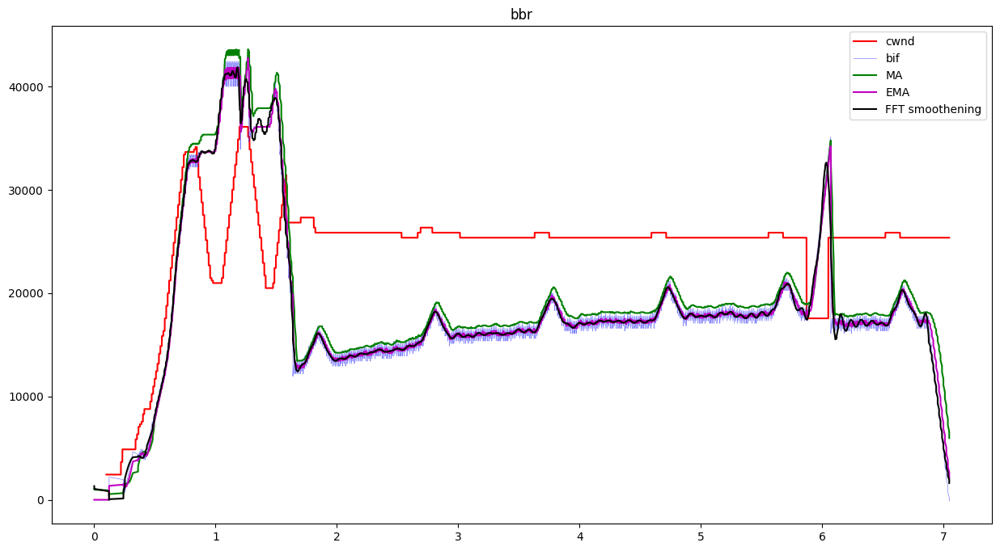

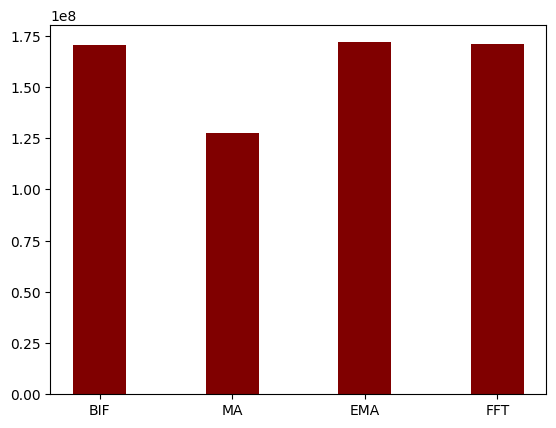

In [53]:
f = "bbr"
ds = []
labels = []
fig, ax = plt.subplots(1,1, figsize=(15,8))
time_cwnd, data_cwnd = get_cwnd(ax,f)
time, data = get_bif(ax,f)
distance, path = fastdtw(data_cwnd, data, dist=euclidean)
print("BIF Error ", distance)
ds.append(distance)
labels.append("BIF")

time, data = get_ma(ax,f)
distance, path = fastdtw(data_cwnd, data, dist=euclidean)
print("MA Error ", distance)
ds.append(distance)
labels.append("MA")

time, data = get_ema(ax,f)
distance, path = fastdtw(data_cwnd, data, dist=euclidean)
print("EMA Error ", distance)
ds.append(distance)
labels.append("EMA")


time, data = get_fft_smoothening(ax,f)
distance, path = fastdtw(data_cwnd, data, dist=euclidean)
print("FFT Error ", distance)
ds.append(distance)
labels.append("FFT")
ax.title.set_text(f)
ax.legend()
plt.show()

plt.bar(labels, ds, color ='maroon',width = 0.4)
plt.show()

Reading ./Nebby/measurements/cubic-tcp.csv...
total bytes processed: 886.307 KBytes for cubic (unlimited)
Reading ./Nebby/measurements/cubic-tcp.csv...
total bytes processed: 886.307 KBytes for cubic (unlimited)
BIF Error  24133684.0
Reading ./Nebby/measurements/cubic-tcp.csv...
total bytes processed: 886.307 KBytes for cubic (unlimited)
MA Error  10568367.499950495
Reading ./Nebby/measurements/cubic-tcp.csv...
total bytes processed: 886.307 KBytes for cubic (unlimited)
EMA Error  50194339.59944072
Reading ./Nebby/measurements/cubic-tcp.csv...
total bytes processed: 886.307 KBytes for cubic (unlimited)
3988   3988
RTT 0.1 Freq  10.0
FFT Error  59115220.77637478


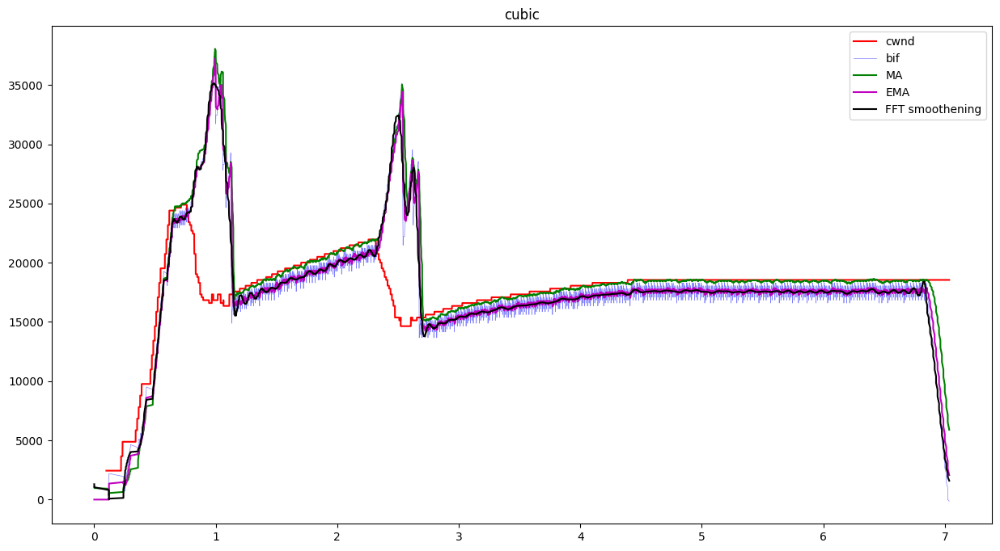

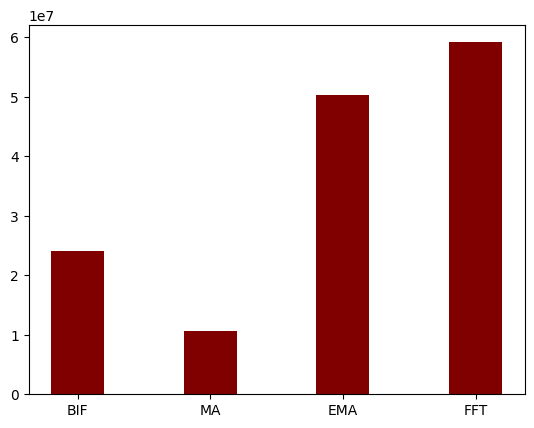

In [33]:
f = "cubic"
ds = []
labels = []
fig, ax = plt.subplots(1,1, figsize=(15,8))
time_cwnd, data_cwnd = get_cwnd(ax,f)
time, data = get_bif(ax,f)
distance, path = fastdtw(data_cwnd, data, dist=euclidean)
print("BIF Error ", distance)
ds.append(distance)
labels.append("BIF")

time, data = get_ma(ax,f)
distance, path = fastdtw(data_cwnd, data, dist=euclidean)
print("MA Error ", distance)
ds.append(distance)
labels.append("MA")

time, data = get_ema(ax,f)
distance, path = fastdtw(data_cwnd, data, dist=euclidean)
print("EMA Error ", distance)
ds.append(distance)
labels.append("EMA")


time, data = get_fft_smoothening(ax,f)
distance, path = fastdtw(data_cwnd, data, dist=euclidean)
print("FFT Error ", distance)
ds.append(distance)
labels.append("FFT")
ax.title.set_text(f)
ax.legend()
plt.show()

plt.bar(labels, ds, color ='maroon',width = 0.4)
plt.show()

In [30]:
def get_window(f,p):
    algo_cc = f
    flows = process_flows(algo_cc, "./Nebby/measurements/")
    data = []
    time = []
    for port in flows.keys():
        if flows[port]["last_ack"] == 0 :
            continue
        else :
            data = flows[port]['windows']
            time = flows[port]['times']
            if p == "p":
                for i in range(len(flows[port]['windows'])):
                    print("{0:10}{1:10}".format(flows[port]['times'][i], flows[port]['windows'][i]))
        time_index = len(time)-1
        for index in range(len(flows[port]['times'])-1):
            if flows[port]['times'][index+1] - flows[port]['times'][index] > 1 :
                time_index = index
        time_last = flows[port]['times'][time_index]
        data = data[:time_index+1]
        time = time[:time_index+1]
        return data, time

In [ ]:
ig, ax = plt.subplots(figsize=(14, 10))
x = data_cwnd
y = data
# Remove the border and axes ticks
fig.patch.set_visible(False)
ax.axis('off')

for [map_x, map_y] in path:
    ax.plot([map_x, map_y], [x[map_x], y[map_y]], '--k', linewidth=4)

ax.plot(x, '-ro', label='x', linewidth=0.5, markersize=1, markerfacecolor='lightcoral', markeredgecolor='lightcoral')
ax.plot(y, '-bo', label='y', linewidth=4, markersize=1, markerfacecolor='skyblue', markeredgecolor='skyblue')
ax.set_title("DTW Distance", fontsize=28, fontweight="bold")

In [ ]:
ig, ax = plt.subplots(figsize=(14, 10))

# Remove the border and axes ticks
fig.patch.set_visible(False)
ax.axis('off')

for [map_x, map_y] in warp_path:
    ax.plot([map_x, map_y], [x[map_x], y[map_y]], '--k', linewidth=4)

ax.plot(x, '-ro', label='x', linewidth=4, markersize=20, markerfacecolor='lightcoral', markeredgecolor='lightcoral')
ax.plot(y, '-bo', label='y', linewidth=4, markersize=20, markerfacecolor='skyblue', markeredgecolor='skyblue')
ax.set_title("DTW Distance", fontsize=28, fontweight="bold")

# Plotting the BIF for all the algos : 1000Kbps LINKSPEED and 50ms POST DELAY 

In [66]:
def lowpassfilter(signal, thresh=0.63, wavelet="db4"):
    thresh = thresh*np.nanmax(signal)
    coeff = pywt.wavedec(signal, wavelet, mode="per")
    coeff[1:] = (pywt.threshold(i, value=thresh, mode="hard") for i in coeff[1:])
    reconstructed_signal = pywt.waverec(coeff, wavelet, mode="per")
    return reconstructed_signal
# def plot_dwt(ax,signal,thresh=0.63, wv="db4"):
#     fig, ax = plt.subplots(figsize=(12,8))
#     rec = lowpassfilter(signal, thresh, wv)
#     ax.plot(rec, 'k', label='DWT smoothing}', linewidth=2)
#     ax.set_title('Removing High Frequency Noise with DWT', fontsize=18)
#     ax.set_ylabel('Signal Amplitude', fontsize=16)
#     ax.set_xlabel('Sample No', fontsize=16)
#     plt.show()
# plot_dwt(0.1,"rbio1.5")

In [55]:
import pandas as pd
import pywt

In [13]:
def get_algo_files(name=[]):
    if len(name) == 0:
        ccs = "reno cubic bbr veno bic cdg dctcp highspeed htcp hybla illinois lp nv scalable vegas westwood yeah"
        ccs = ccs.split(" ")
    else :
        ccs = name
    return ccs

In [14]:
def plot_cwnd_bf(files):
    path = "/home/lakshayr/nus_intern/Nebby/custom_clients/statsfiles"
    for f in files:
        algo_cc = f
        flows = process_flows(algo_cc, "./Nebby/measurements/")
        port = list(flows.keys())[0]
        
        statsfile = path + "/" + f + "-stats.csv"
        df_c = pd.read_csv(statsfile,sep=",")
        start = df_c['ts'][1]
        df_c['ts'] = df_c['ts'] - start
        cwnd_bytes = df_c['tcpi_snd_cwnd'].mul(df_c['snd'])
        
        fig, (ax1,ax2) = plt.subplots(1,2, figsize=(10,5))
        ax1.plot(flows[port]['times'][1:int(len(flows[port]['times']))], flows[port]['windows'][1:int(len(flows[port]['times']))], color='b',lw='0.5')
        ax1.title.set_text(f)
        ax2.plot(df_c['ts'][1:], cwnd_bytes[1:])
        plt.show()

In [31]:
def get_wwlt(ax,f):
    data, time = get_window(f, "n")
    thresh = 0.4
    wv = "rbio1.5"
    rec = lowpassfilter(data, thresh, wv)
    start = len(rec) - len(time)
    ax.plot(time,rec[start:], label='DWT smoothing}', linewidth=2)
    return time, data
def get_bif(ax,f):
    algo_cc = f
    data, time = get_window(f, "n")
#     flows = process_flows(algo_cc, "./Nebby/measurements/")
#     port = list(flows.keys())[0]
#     start_bif = flows[port]['times'][0]
#     ax.plot(flows[port]['times'][1:int(len(flows[port]['times']))], flows[port]['windows'][1:int(len(flows[port]['windows']))], label="bif",color='b',lw=0.5,alpha=0.5)
    ax.plot(time, data,label="bif",color='b',lw=0.5,alpha=0.5)
    return time,data
    
def get_cwnd(ax,f):
    path = "/home/lakshayr/nus_intern/Nebby/custom_clients/statsfiles"
    statsfile = path + "/" + f + "-stats.csv"
    df_c = pd.read_csv(statsfile,sep=",")
    start_cwnd = df_c['ts'][1]

    fix = 0.1
    if(f=="reno"):
        fix=0.2
    df_c['ts'] = df_c['ts'] - start_cwnd  + fix
    cwnd_bytes = df_c['tcpi_snd_cwnd'].mul(df_c['snd'])
    cwnd_times = df_c['ts']
    data, time = get_window(f, "n")
    time_thresh = time[-1]
    cwnd_thresh = len(time)
    for t in range(len(df_c['ts'])):
        if df_c['ts'][t] > time_thresh:
            cwnd_thresh = t+1
            break
    ax.plot(cwnd_times[1:cwnd_thresh], cwnd_bytes[1:cwnd_thresh], label="cwnd",color='r', lw=1.5, alpha=1)
    return list(cwnd_times[1:cwnd_thresh]), list(cwnd_bytes[1:cwnd_thresh])

def get_ma(ax,f):
    data, time = get_window(f, "n")
    ma_data = []
    k = 20
    for i in range(len(data)):
        if i-k < 0:
            curr = sum(data[0:i+1])
            curr += sum(data[i+1:abs(i-k)])
            curr = float(curr)/k
        else :
            curr = sum(data[i-k:i+1]);
            curr = float(curr)/k
        ma_data.append(curr)
    ax.plot(time, ma_data, color='g', label="MA", lw=1.5, alpha=1)
    return time, ma_data
    
def get_ema(ax,f):
    data, time = get_window(f, "n")
    ma_data = []
    alpha=0.2
    for i in range(len(data)):
        if i == 0:
            curr = data[i]
        else :
            curr = alpha*data[i] + (1-alpha)*ma_data[i-1]
        ma_data.append(curr)
    ax.plot(time, ma_data, color='m', label="EMA")
    return time, ma_data
    
def get_fft_smoothening(ax,f):
    rtt=0.1
    data, time = get_window(f, "n")
    print(len(data), " ", len(time))

    yf, xf = get_fft(data)
    abs_yf = np.abs(yf)
#     print(len(abs_yf), len(xf))
    sort_abs_yf = sorted(abs_yf)
    
#     plt.title("FFT Decomposition")
#     plt.plot(xf, sort_abs_yf, color='b', alpha=0.5, lw=1)
#     plt.scatter(xf, sort_abs_yf, color='r', s=2)
#     plt.show()

    thresh  = (1/rtt)
    print("RTT", rtt, "Freq ", thresh)
#     print(xf)
    thresh_ind = 0
    for i in range(len(xf)) :
        freq = xf[i]
        if(freq > thresh):
            thresh_ind = i
            break
#     print("Index ", thresh_ind)
#     print(xf[0:thresh_ind])
#     plt.title("Cleaned Frequencies")
#     plt.plot(xf[0:thresh_ind],np.abs(yf[0:thresh_ind]))
#     plt.show()

    yf_clean = yf
    yf_clean[thresh_ind+1:] = 0
    new_f_clean = irfft(yf_clean)
#     plt.title("Frequencies smaller than " + str(thresh))
#     plt.plot(time, data, color="b", alpha=0.5, label='original signal')
    start_len = len(time) - len(new_f_clean)
    ax.plot(time[start_len:], new_f_clean, 'k', label='FFT smoothening', linewidth=1.5)
#     plt.legend()
#     plt.show()
    return time[start_len:], new_f_clean


In [16]:
def plot_fft_cwnd(files):
    for f in files :
        print(f)
        path = "/home/lakshayr/nus_intern/Nebby/custom_clients/statsfiles"
        statsfile = path + "/" + f + "-stats.csv"
        df_c = pd.read_csv(statsfile,sep=",")
        start_cwnd = df_c['ts'][1]
        
        fix = 0.1
        if(f=="reno"):
            fix=0.2
        df_c['ts'] = df_c['ts'] - start_cwnd  + fix
        time = df_c['ts'][1:]
        cwnd_bytes = df_c['tcpi_snd_cwnd'].mul(df_c['snd'])

#         print(len(data), " ", len(time))
        data = cwnd_bytes[1:]
        yf, xf = get_fft(data)
        abs_yf = np.abs(yf)
#         print(len(abs_yf), len(xf))
        sort_abs_yf = sorted(abs_yf)
#         for x in range(len(xf)):
#             print(xf[x],abs_yf[x])
        plt.title("FFT Decomposition CWND")
        plt.plot(xf[1:], abs_yf[1:], color='b', alpha=0.5, lw=1)
        plt.scatter(xf[1:], abs_yf[1:], color='r', s=2)
        plt.show()
        
        quantile = np.quantile(sort_abs_yf,75)
        thresh_f = af[abs_yf.index(quantile)]
        print("Freq ", thresh_f)
        
        
        data, time = get_window(f, "n")
        print(len(data), " ", len(time))

        yf, xf = get_fft(data)
#         abs_yf = np.abs(yf)
#         plt.title("FFT Decomposition BIF")
#         plt.plot(xf, abs_yf, color='b', alpha=0.5, lw=1)
#         plt.scatter(xf, abs_yf, color='r', s=2)
#         plt.show()
        corrected_data = xf < thresh_f
        
#         plt.title("Log FFT Decomposition")
#         plt.plot(xf[1:], np.log10(abs_yf[1:]), color='b', alpha=0.5, lw=1)
#         plt.scatter(xf[1:], np.log10(abs_yf[1:]), color='r', s=2)
#         plt.show()
        # take the mean of the log and then use that 
        
#         print("Thresh = ", pow(10,thresh))
#         correct = abs_yf[1:] > pow(10,thresh)
#         corrected_yf = yf[1:] * correct
#         corrected_data = irfft(corrected_yf)
#         print(corrected_data)
#         plt.plot(time, data, color="b", alpha=0.5, label='original signal')
#         plt.plot(time[2:], corrected_data, 'k', label='FFT smoothening', linewidth=1.5)
#         plt.show()
#         
#           thresh_ind = 0
#         for i in range(len(xf)) :
#             freq = xf[i]
#             if(freq > thresh):
#                 thresh_ind = i
#                 break
#         print("Index ", thresh_ind)
#         print(xf[0:thresh_ind])
#         plt.title("Cleaned Frequencies")
#         plt.plot(xf[0:thresh_ind],np.abs(yf[0:thresh_ind]))
#         plt.show()

#         yf_clean = yf
#         yf_clean[thresh_ind+1:] = 0
#         new_f_clean = irfft(yf_clean)
# #         plt.title("Frequencies smaller than " + str(thresh))
# #         plt.plot(time, data, color="b", alpha=0.5, label='original signal')
#         start_len = len(time) - len(new_f_clean)
#         plt.plot(time[start_len:], new_f_clean, 'k', label='FFT smoothing}', linewidth=2)
#         plt.legend()
#         plt.show()

In [ ]:
plot_fft_cwnd(["cubic"])

In [32]:
def get_fft(data):
    n = len(data)
    data_step = 0.002
    yf = rfft(data)
    xf = rfftfreq(n,data_step)
    return yf,xf


In [33]:
def plot_one(files):
    for f in files:
        fig, ax = plt.subplots(1,1, figsize=(15,8))
#         get_bif(ax,f)
        get_cwnd(ax,f)
#         get_ma(ax,f)
#         get_ema(ax,f)
#         get_wwlt(ax,f)
        get_fft_smoothening(ax,f)
        ax.title.set_text(f)
        ax.legend()
        plt.show()

Reading ./Nebby/measurements/reno-tcp.csv...
total bytes processed: 904.127 KBytes for reno (unlimited)
Reading ./Nebby/measurements/reno-tcp.csv...
total bytes processed: 904.127 KBytes for reno (unlimited)
4087   4087
RTT 0.1 Freq  10.0


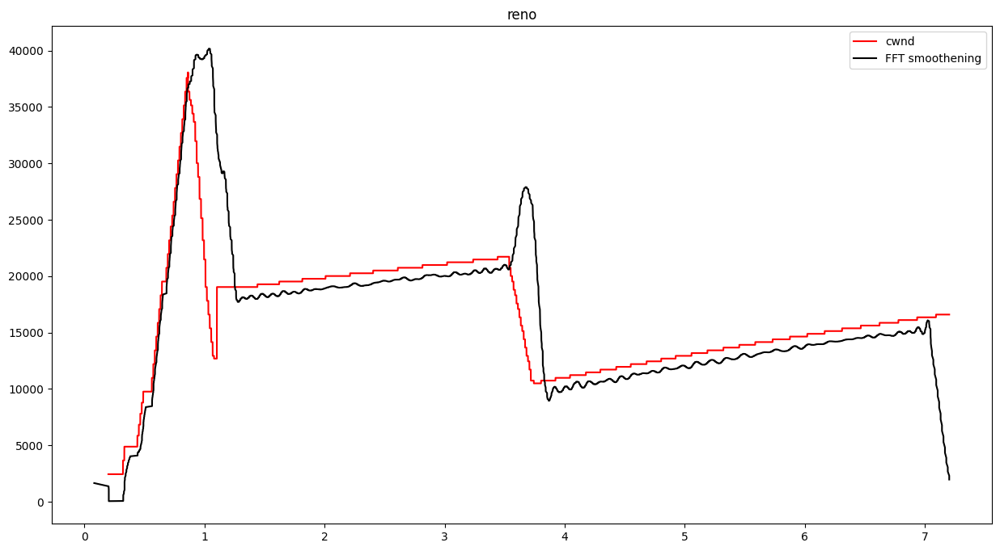

Reading ./Nebby/measurements/cubic-tcp.csv...
total bytes processed: 886.307 KBytes for cubic (unlimited)
Reading ./Nebby/measurements/cubic-tcp.csv...
total bytes processed: 886.307 KBytes for cubic (unlimited)
3988   3988
RTT 0.1 Freq  10.0


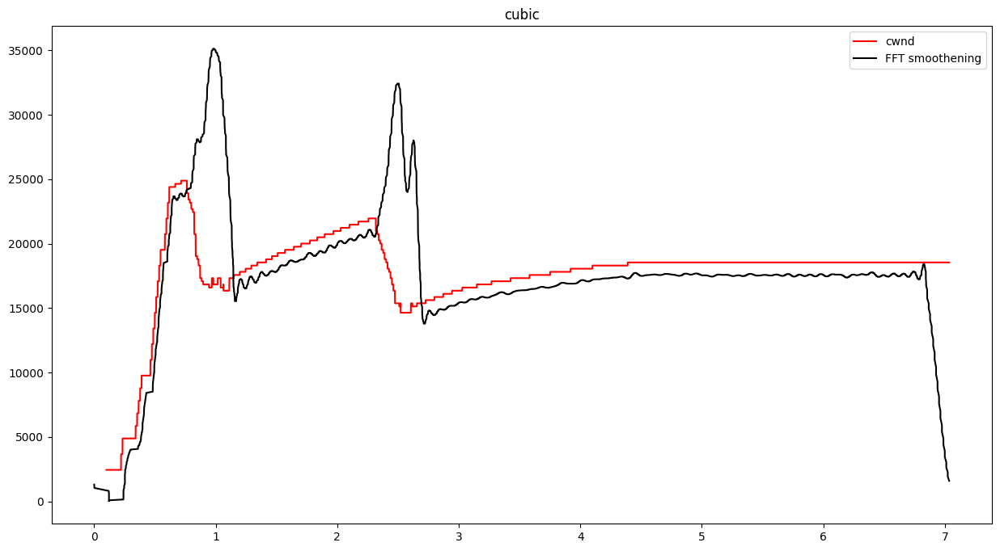

Reading ./Nebby/measurements/bbr-tcp.csv...
total bytes processed: 921.731 KBytes for bbr (unlimited)
Reading ./Nebby/measurements/bbr-tcp.csv...
total bytes processed: 921.731 KBytes for bbr (unlimited)
4154   4154
RTT 0.1 Freq  10.0


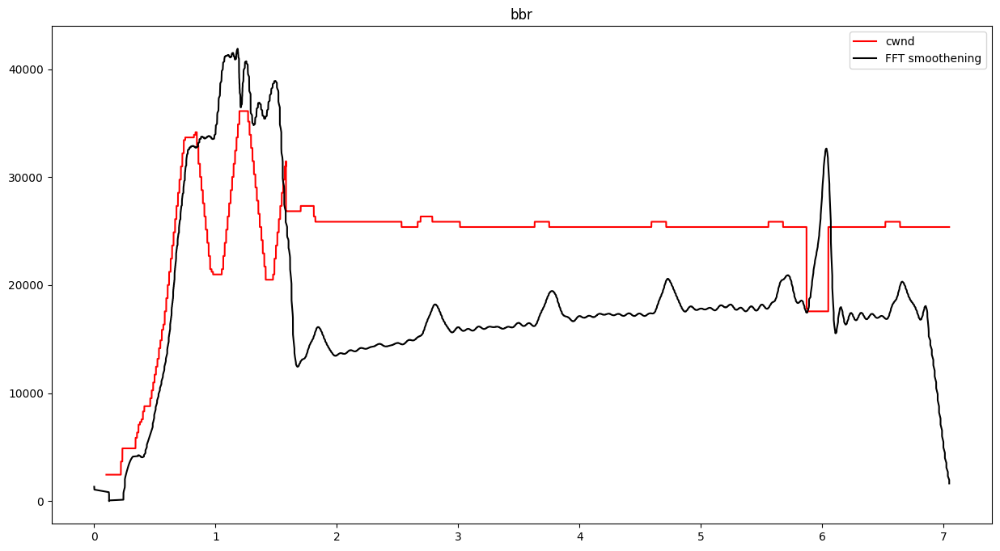

Reading ./Nebby/measurements/veno-tcp.csv...
total bytes processed: 906.927 KBytes for veno (unlimited)
Reading ./Nebby/measurements/veno-tcp.csv...
total bytes processed: 906.927 KBytes for veno (unlimited)
4128   4128
RTT 0.1 Freq  10.0


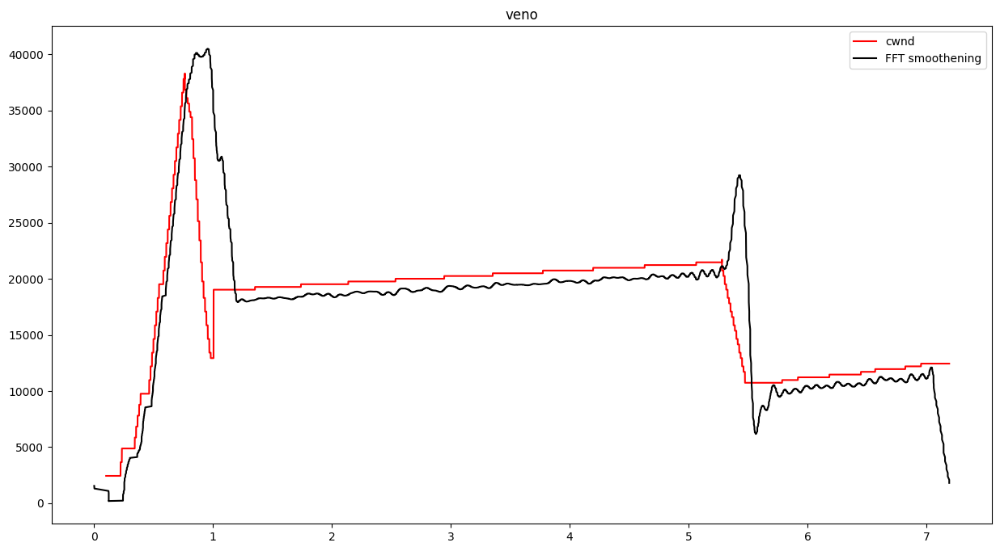

Reading ./Nebby/measurements/bic-tcp.csv...
total bytes processed: 925.035 KBytes for bic (unlimited)
Reading ./Nebby/measurements/bic-tcp.csv...
total bytes processed: 925.035 KBytes for bic (unlimited)
3956   3956
RTT 0.1 Freq  10.0


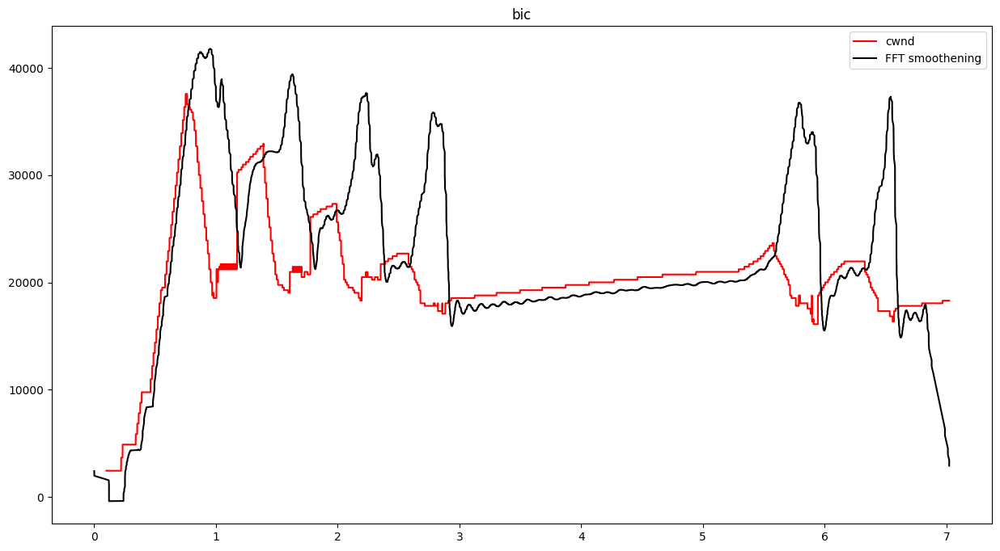

Reading ./Nebby/measurements/cdg-tcp.csv...
total bytes processed: 885.883 KBytes for cdg (unlimited)
Reading ./Nebby/measurements/cdg-tcp.csv...
total bytes processed: 885.883 KBytes for cdg (unlimited)
4111   4111
RTT 0.1 Freq  10.0


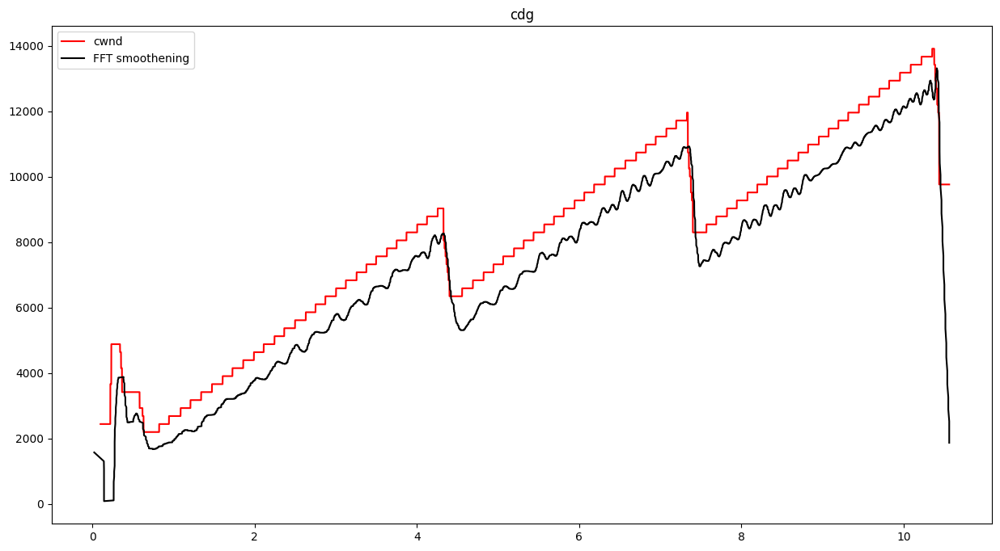

Reading ./Nebby/measurements/dctcp-tcp.csv...
total bytes processed: 905.443 KBytes for dctcp (unlimited)
Reading ./Nebby/measurements/dctcp-tcp.csv...
total bytes processed: 905.443 KBytes for dctcp (unlimited)
4098   4098
RTT 0.1 Freq  10.0


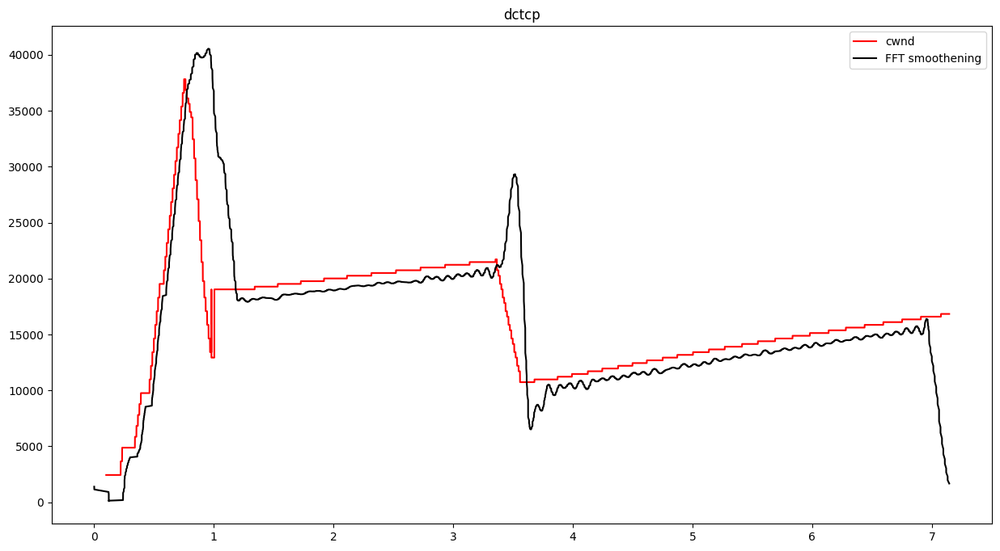

Reading ./Nebby/measurements/highspeed-tcp.csv...
total bytes processed: 905.443 KBytes for highspeed (unlimited)
Reading ./Nebby/measurements/highspeed-tcp.csv...
total bytes processed: 905.443 KBytes for highspeed (unlimited)
4096   4096
RTT 0.1 Freq  10.0


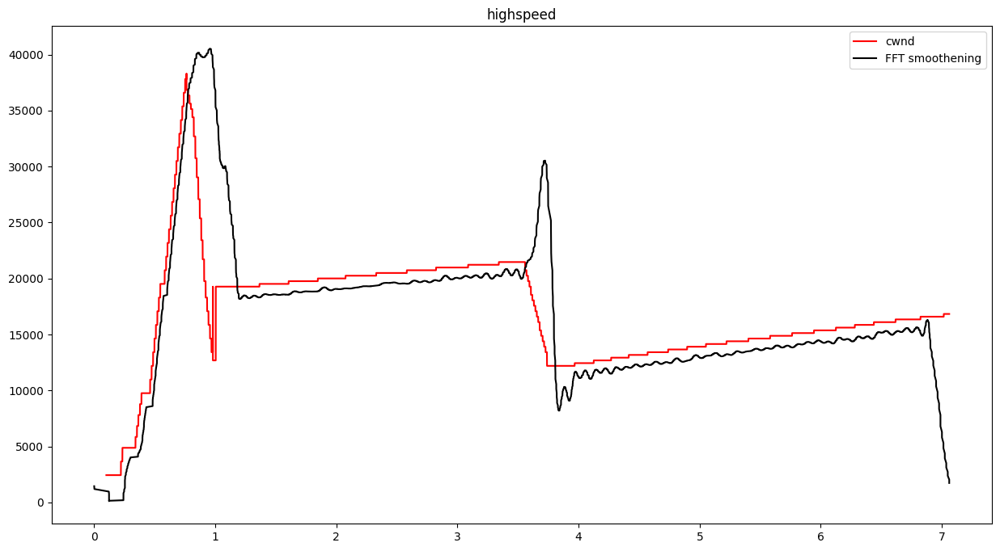

Reading ./Nebby/measurements/htcp-tcp.csv...
total bytes processed: 911.671 KBytes for htcp (unlimited)
Reading ./Nebby/measurements/htcp-tcp.csv...
total bytes processed: 911.671 KBytes for htcp (unlimited)
4114   4114
RTT 0.1 Freq  10.0


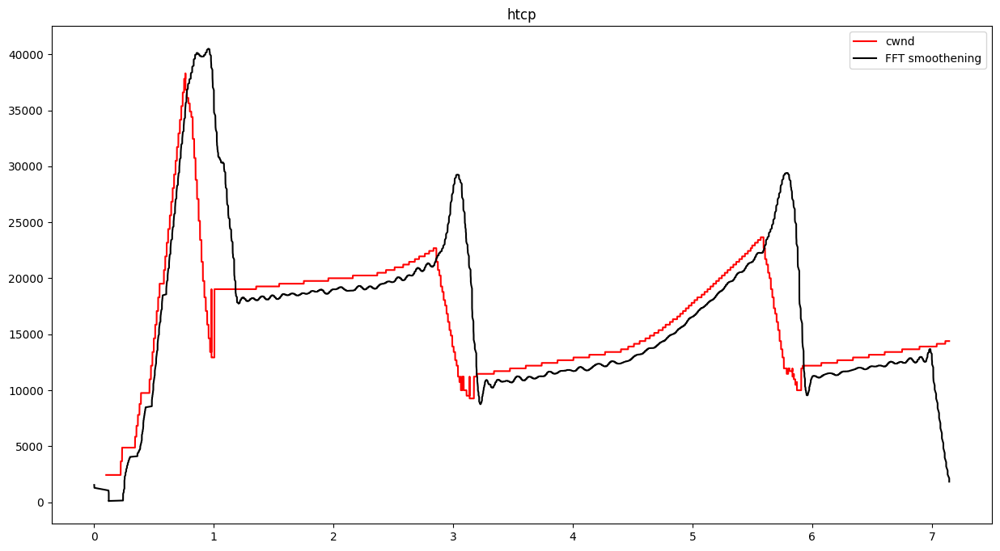

Reading ./Nebby/measurements/hybla-tcp.csv...
total bytes processed: 1302.499 KBytes for hybla (unlimited)
Reading ./Nebby/measurements/hybla-tcp.csv...
total bytes processed: 1302.499 KBytes for hybla (unlimited)
5760   5760
RTT 0.1 Freq  10.0


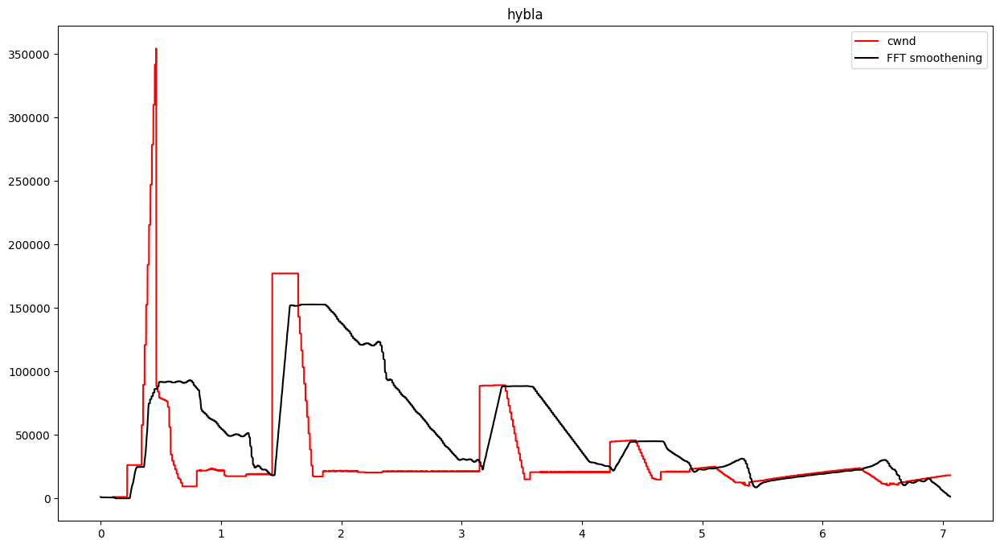

Reading ./Nebby/measurements/illinois-tcp.csv...
total bytes processed: 913.155 KBytes for illinois (unlimited)
Reading ./Nebby/measurements/illinois-tcp.csv...
total bytes processed: 913.155 KBytes for illinois (unlimited)
4134   4134
RTT 0.1 Freq  10.0


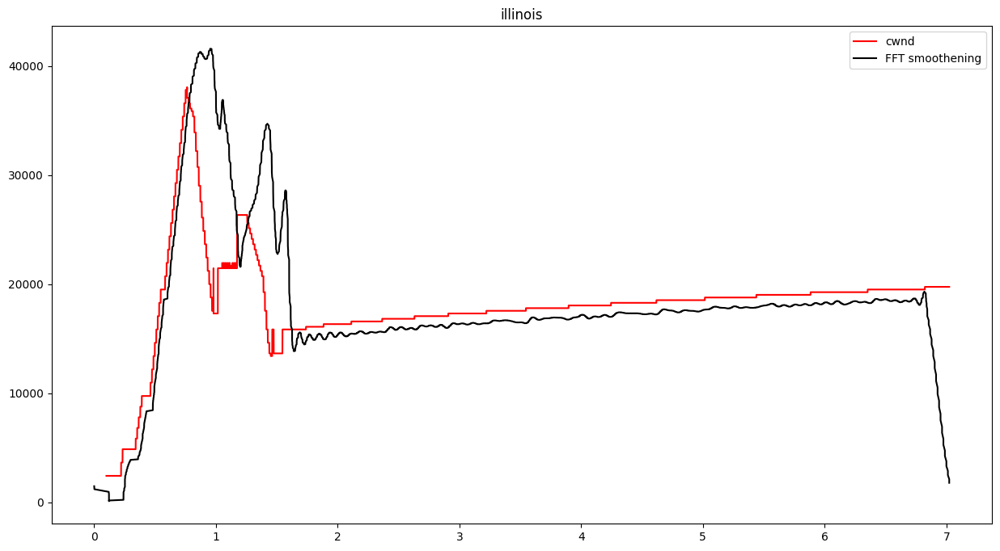

Reading ./Nebby/measurements/lp-tcp.csv...
total bytes processed: 893.751 KBytes for lp (unlimited)
Reading ./Nebby/measurements/lp-tcp.csv...
total bytes processed: 893.751 KBytes for lp (unlimited)
3871   3871
RTT 0.1 Freq  10.0


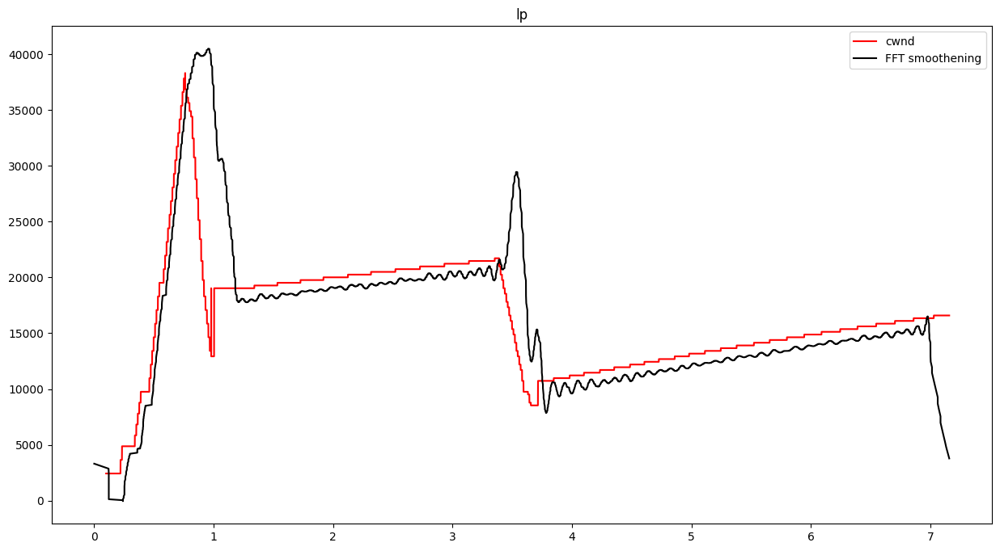

Reading ./Nebby/measurements/nv-tcp.csv...
total bytes processed: 879.939 KBytes for nv (unlimited)
Reading ./Nebby/measurements/nv-tcp.csv...
total bytes processed: 879.939 KBytes for nv (unlimited)
4002   4002
RTT 0.1 Freq  10.0


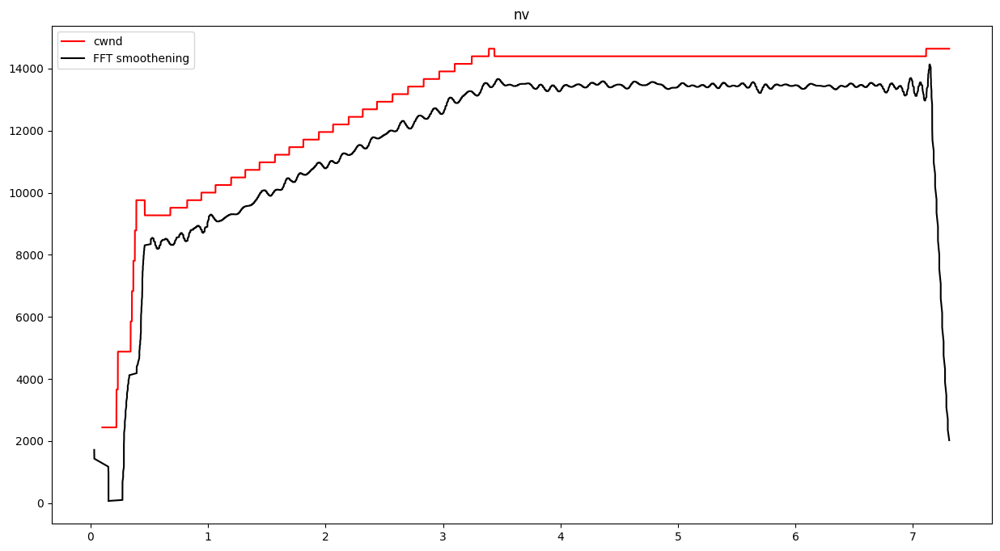

Reading ./Nebby/measurements/scalable-tcp.csv...
total bytes processed: 926.407 KBytes for scalable (unlimited)
Reading ./Nebby/measurements/scalable-tcp.csv...
total bytes processed: 926.407 KBytes for scalable (unlimited)
3910   3910
RTT 0.1 Freq  10.0


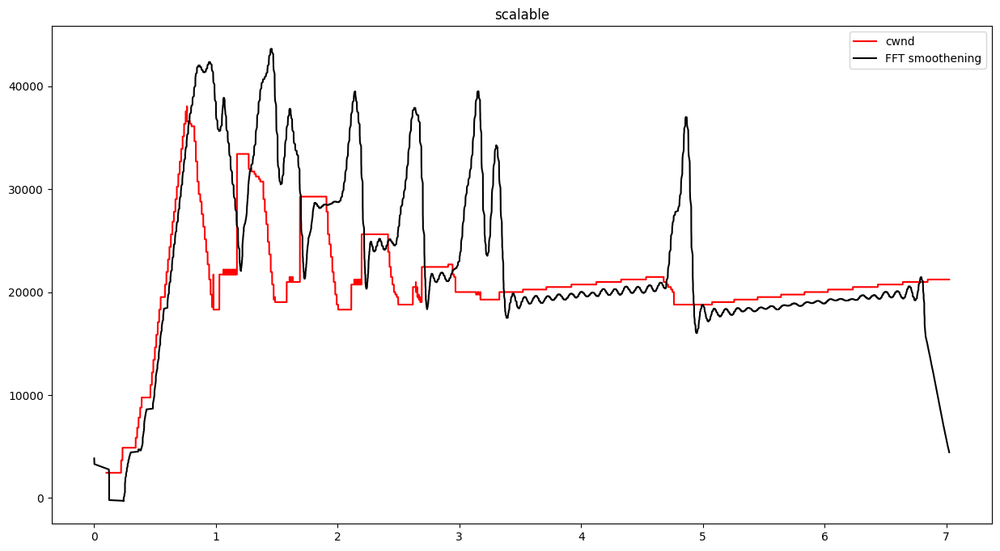

Reading ./Nebby/measurements/vegas-tcp.csv...
total bytes processed: 906.879 KBytes for vegas (unlimited)
Reading ./Nebby/measurements/vegas-tcp.csv...
total bytes processed: 906.879 KBytes for vegas (unlimited)
4139   4139
RTT 0.1 Freq  10.0


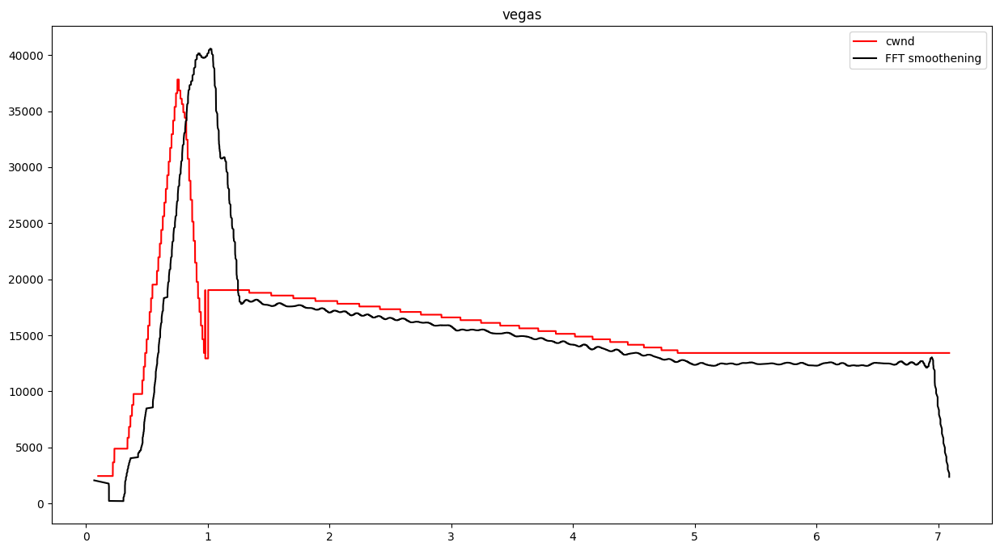

Reading ./Nebby/measurements/westwood-tcp.csv...
total bytes processed: 909.055 KBytes for westwood (unlimited)
Reading ./Nebby/measurements/westwood-tcp.csv...
total bytes processed: 909.055 KBytes for westwood (unlimited)
4175   4175
RTT 0.1 Freq  10.0


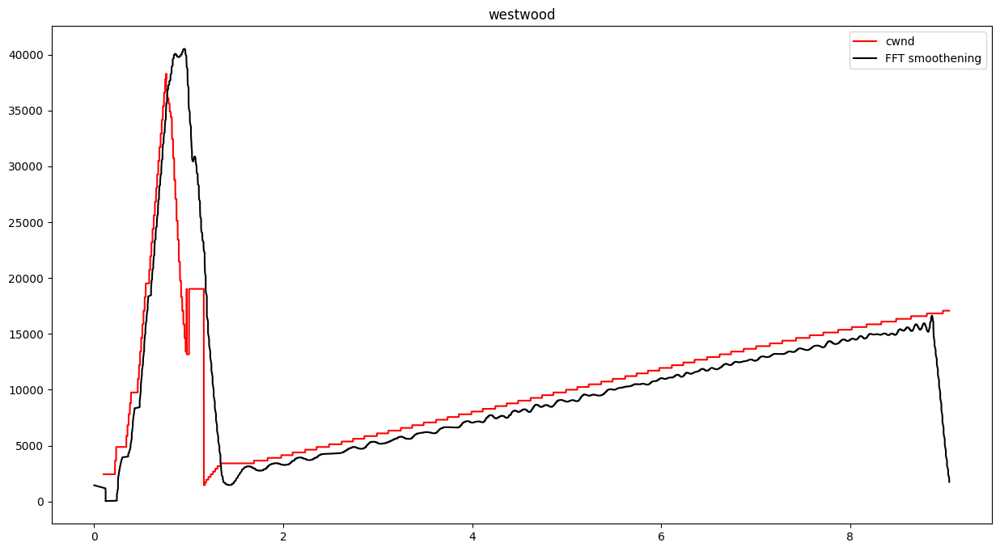

Reading ./Nebby/measurements/yeah-tcp.csv...
total bytes processed: 942.047 KBytes for yeah (unlimited)
Reading ./Nebby/measurements/yeah-tcp.csv...
total bytes processed: 942.047 KBytes for yeah (unlimited)
4206   4206
RTT 0.1 Freq  10.0


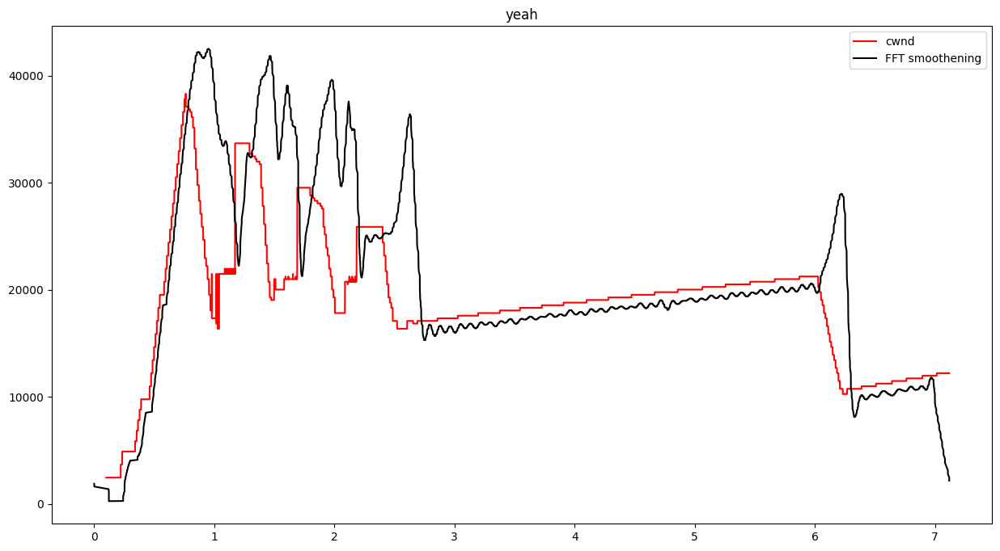

In [95]:
plot_one(ccs)

Reading ./Nebby/measurements/reno-tcp.csv...
total bytes processed: 904.127 KBytes for reno (unlimited)


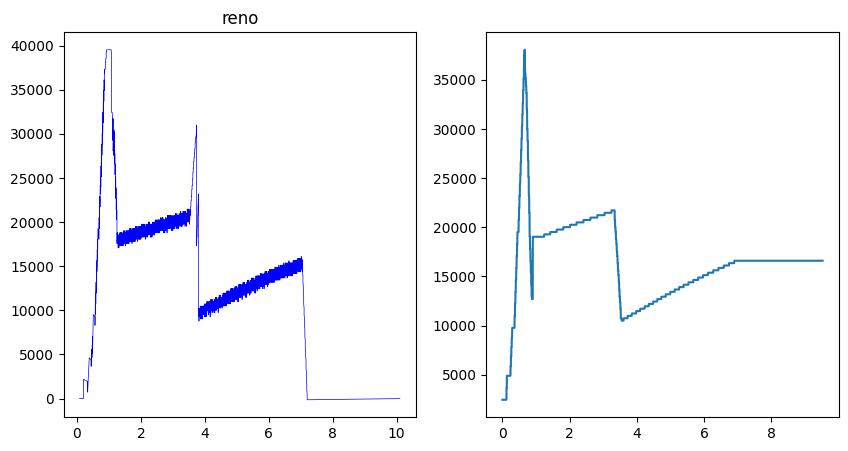

Reading ./Nebby/measurements/cubic-tcp.csv...
total bytes processed: 886.307 KBytes for cubic (unlimited)


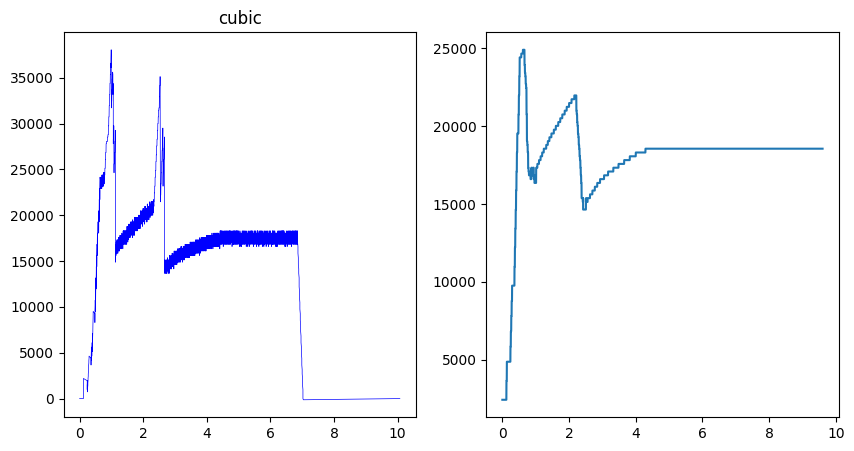

Reading ./Nebby/measurements/bbr-tcp.csv...
total bytes processed: 921.731 KBytes for bbr (unlimited)


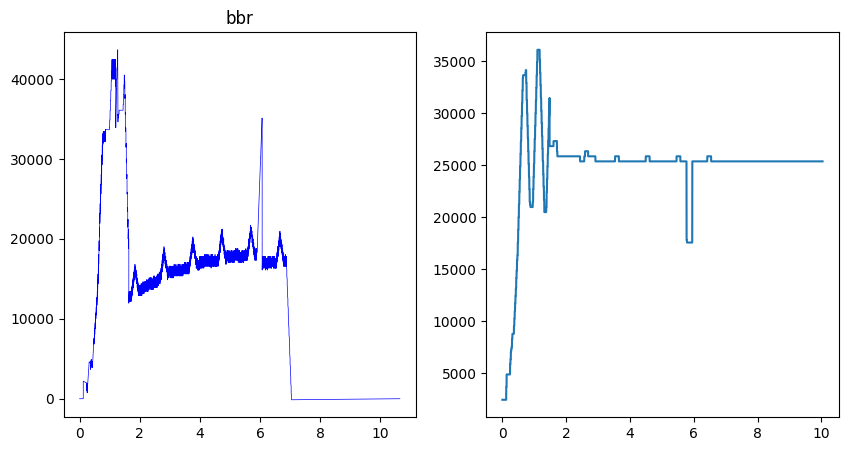

Reading ./Nebby/measurements/veno-tcp.csv...
total bytes processed: 906.927 KBytes for veno (unlimited)


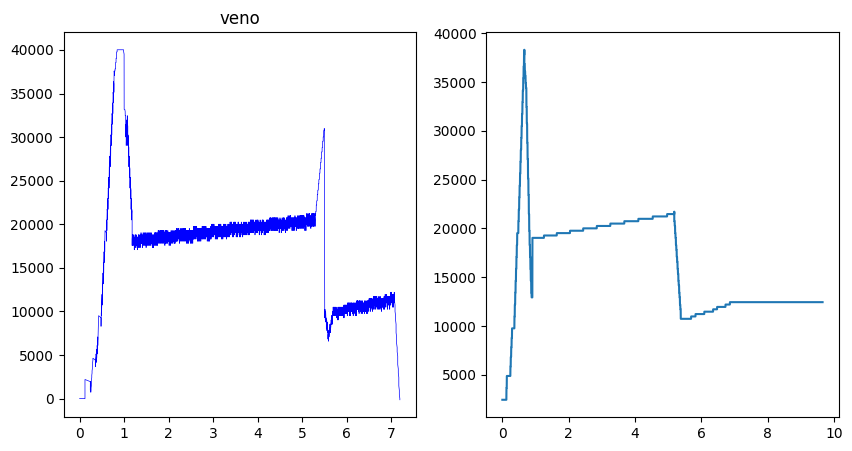

Reading ./Nebby/measurements/bic-tcp.csv...
total bytes processed: 925.035 KBytes for bic (unlimited)


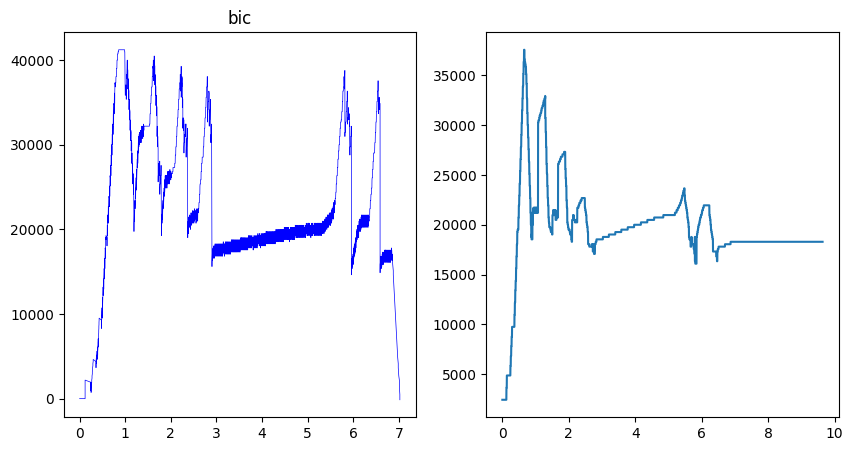

Reading ./Nebby/measurements/cdg-tcp.csv...
total bytes processed: 885.883 KBytes for cdg (unlimited)


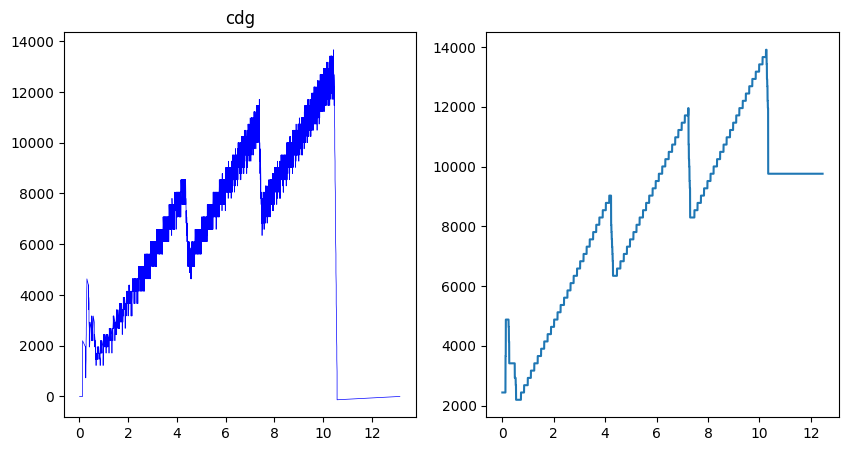

Reading ./Nebby/measurements/dctcp-tcp.csv...
total bytes processed: 905.443 KBytes for dctcp (unlimited)


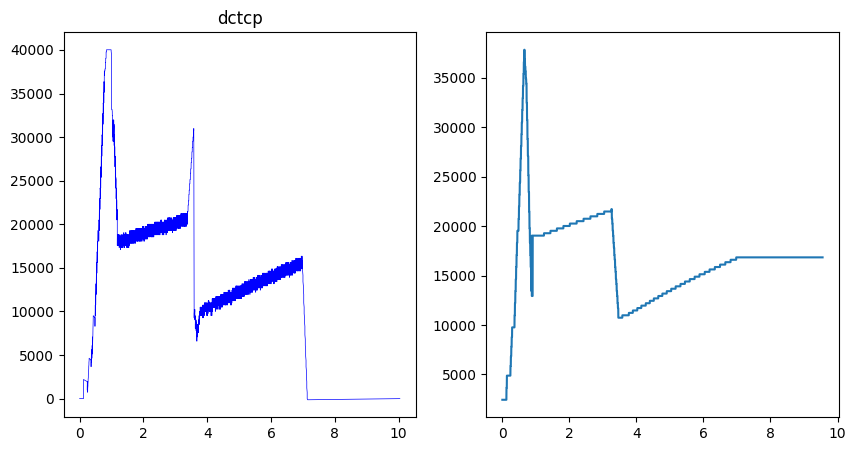

Reading ./Nebby/measurements/highspeed-tcp.csv...
total bytes processed: 905.443 KBytes for highspeed (unlimited)


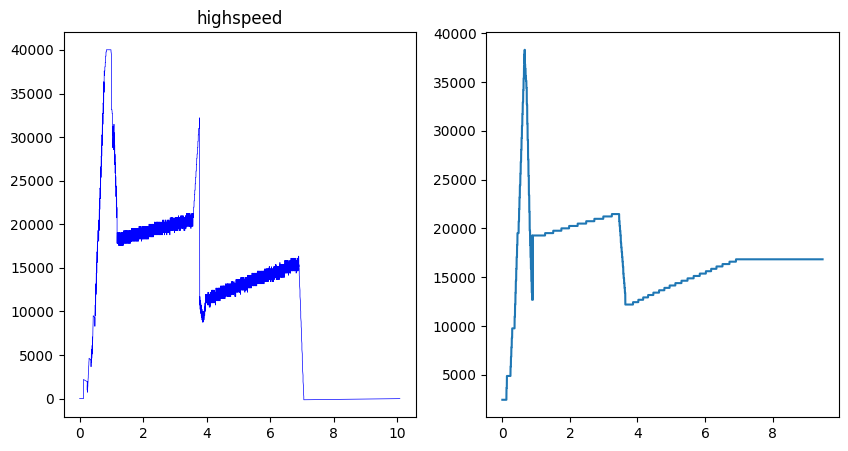

Reading ./Nebby/measurements/htcp-tcp.csv...
total bytes processed: 911.671 KBytes for htcp (unlimited)


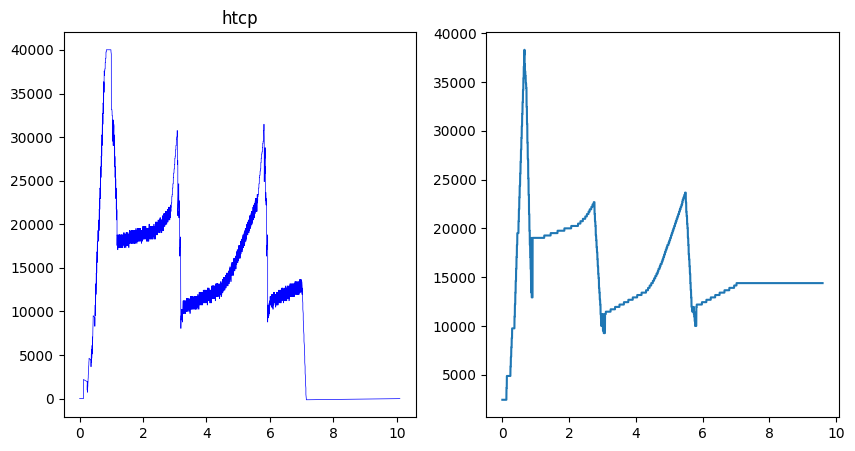

Reading ./Nebby/measurements/hybla-tcp.csv...
total bytes processed: 1302.499 KBytes for hybla (unlimited)


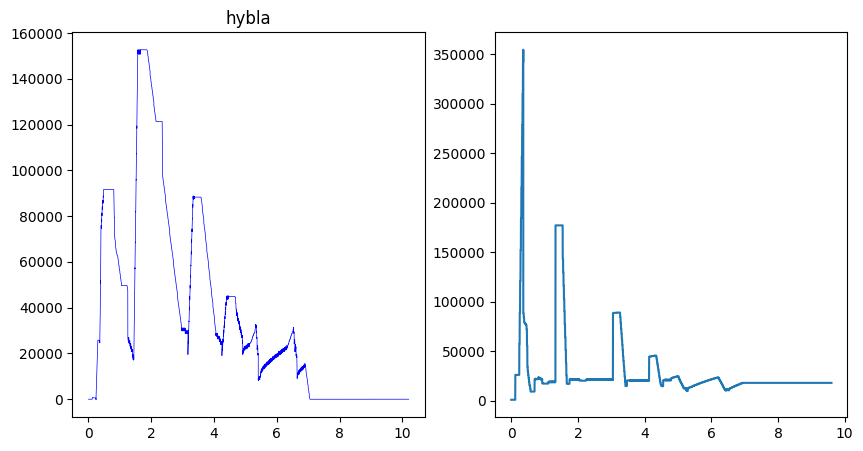

Reading ./Nebby/measurements/illinois-tcp.csv...
total bytes processed: 913.155 KBytes for illinois (unlimited)


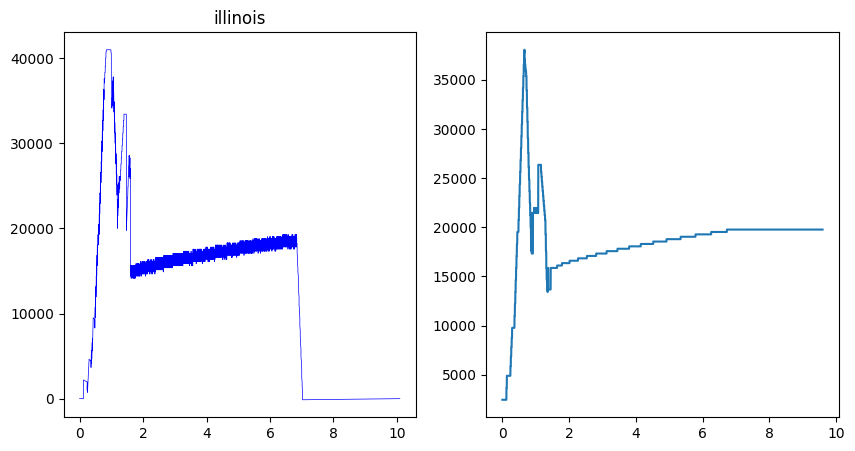

Reading ./Nebby/measurements/lp-tcp.csv...
total bytes processed: 893.751 KBytes for lp (unlimited)


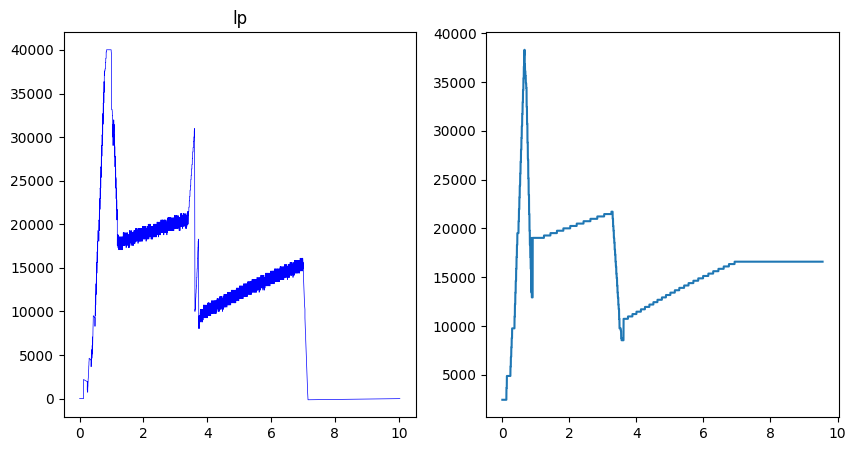

Reading ./Nebby/measurements/nv-tcp.csv...
total bytes processed: 879.939 KBytes for nv (unlimited)


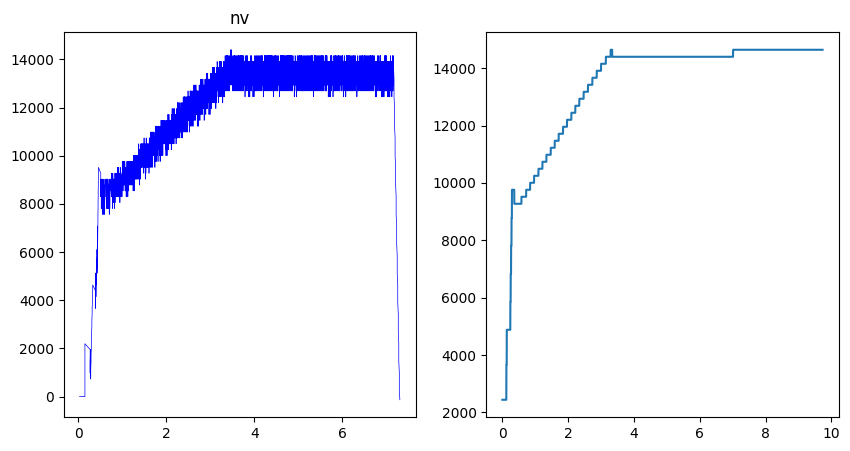

Reading ./Nebby/measurements/scalable-tcp.csv...
total bytes processed: 926.407 KBytes for scalable (unlimited)


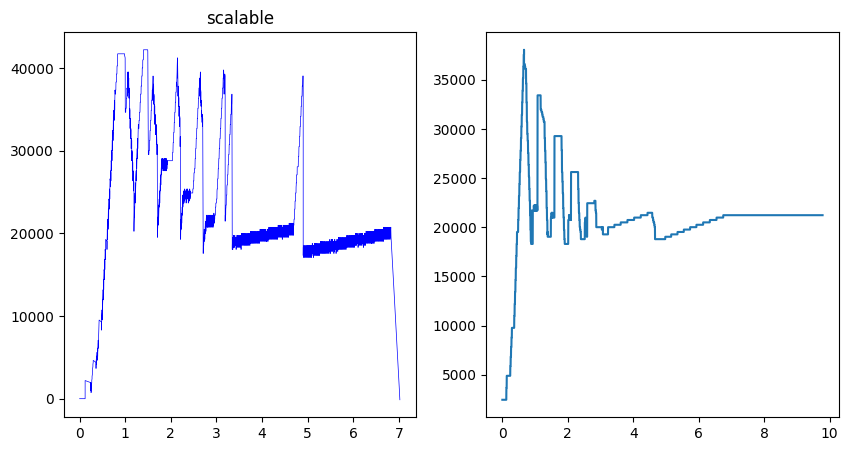

Reading ./Nebby/measurements/vegas-tcp.csv...
total bytes processed: 906.879 KBytes for vegas (unlimited)


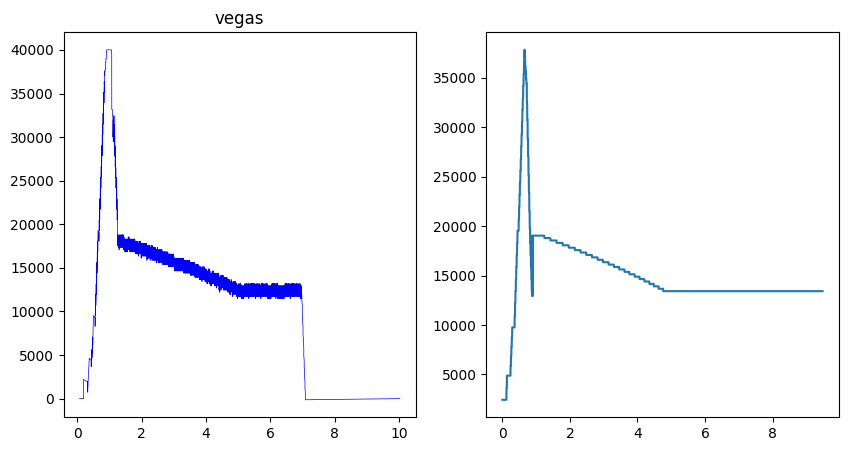

Reading ./Nebby/measurements/westwood-tcp.csv...
total bytes processed: 909.055 KBytes for westwood (unlimited)


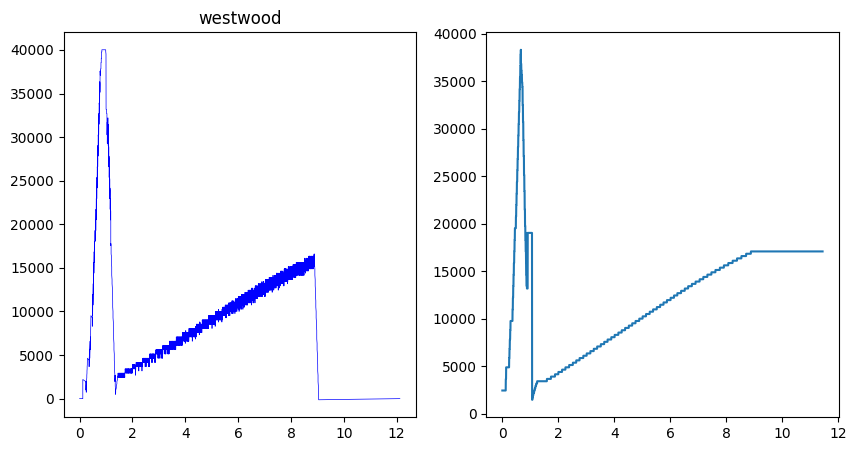

Reading ./Nebby/measurements/yeah-tcp.csv...
total bytes processed: 942.047 KBytes for yeah (unlimited)


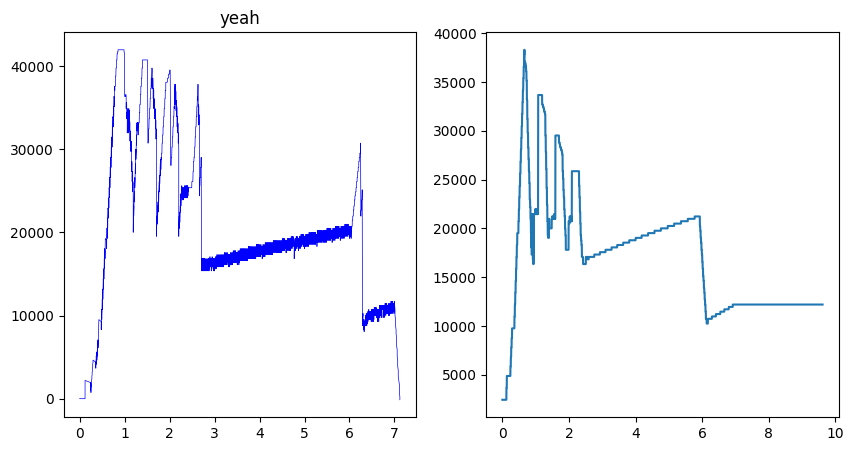

In [75]:
plot_cwnd_bf(ccs)

In [40]:
data, time = get_window(ccs[0], p="n")

Reading ./Nebby/measurements/reno-tcp.csv...
total bytes processed: 902.583 KBytes for reno (unlimited)


Reading ./Nebby/measurements/reno-tcp.csv...
total bytes processed: 904.127 KBytes for reno (unlimited)


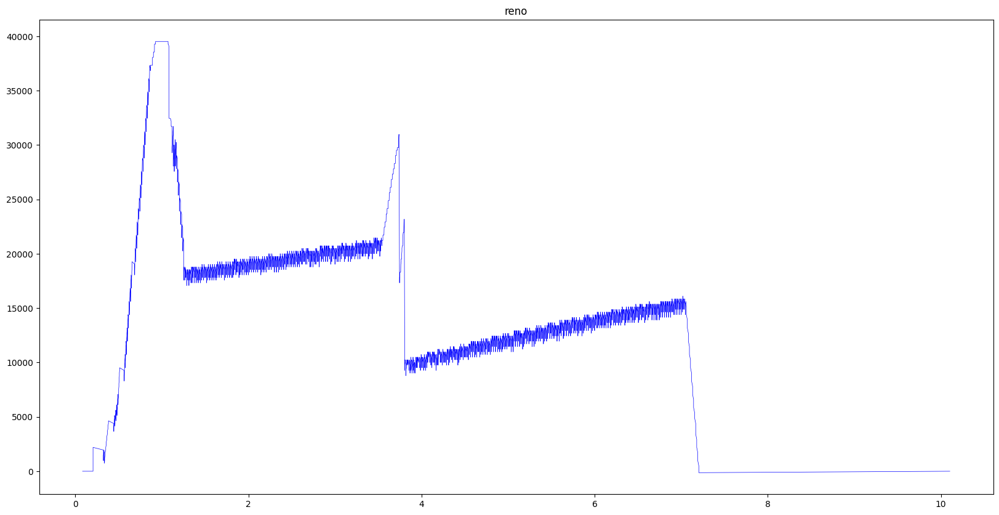

Reading ./Nebby/measurements/cubic-tcp.csv...
total bytes processed: 886.307 KBytes for cubic (unlimited)


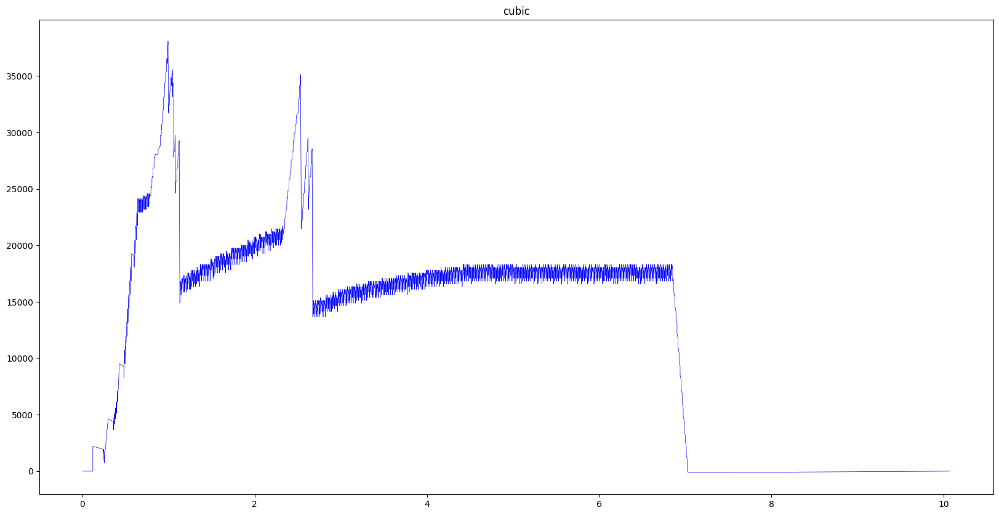

Reading ./Nebby/measurements/bbr-tcp.csv...
total bytes processed: 921.731 KBytes for bbr (unlimited)


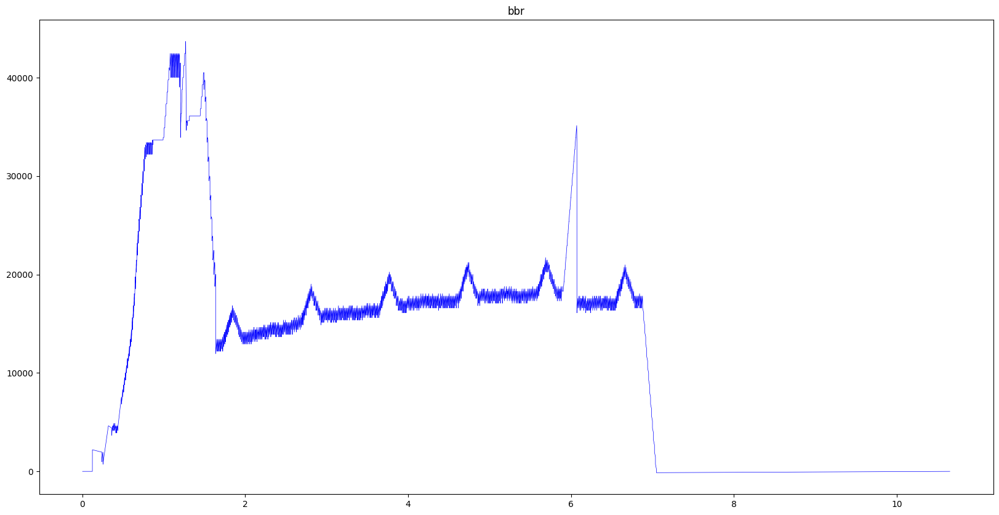

Reading ./Nebby/measurements/veno-tcp.csv...
total bytes processed: 906.927 KBytes for veno (unlimited)


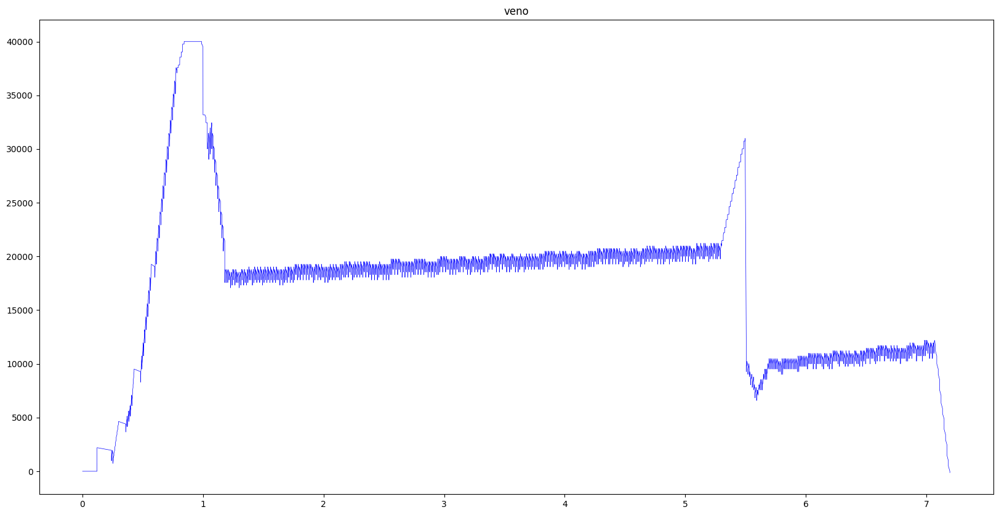

Reading ./Nebby/measurements/bic-tcp.csv...
total bytes processed: 925.035 KBytes for bic (unlimited)


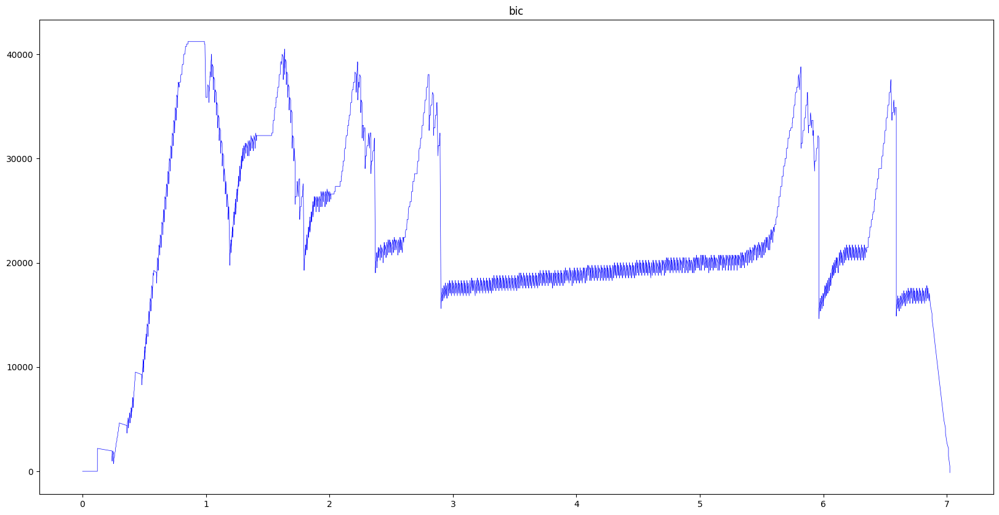

Reading ./Nebby/measurements/cdg-tcp.csv...
total bytes processed: 885.883 KBytes for cdg (unlimited)


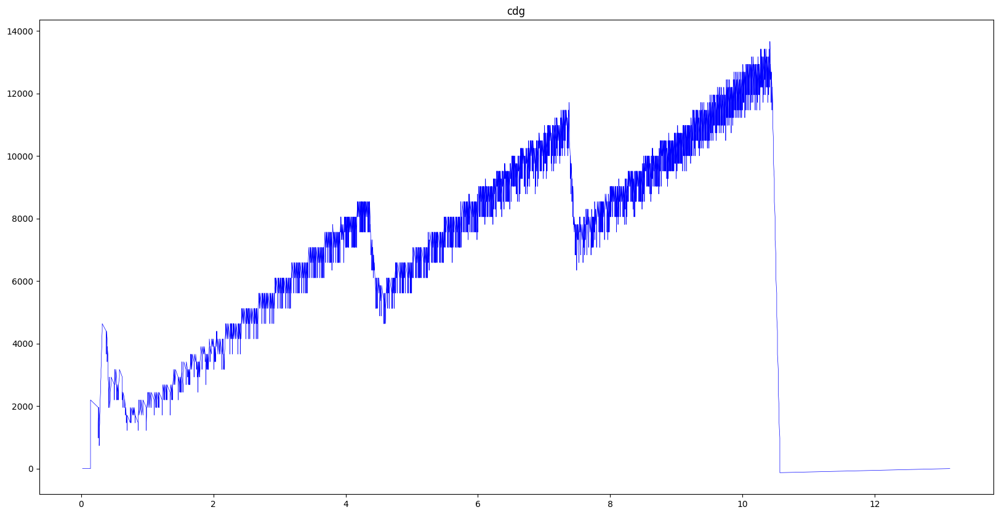

Reading ./Nebby/measurements/dctcp-tcp.csv...
total bytes processed: 905.443 KBytes for dctcp (unlimited)


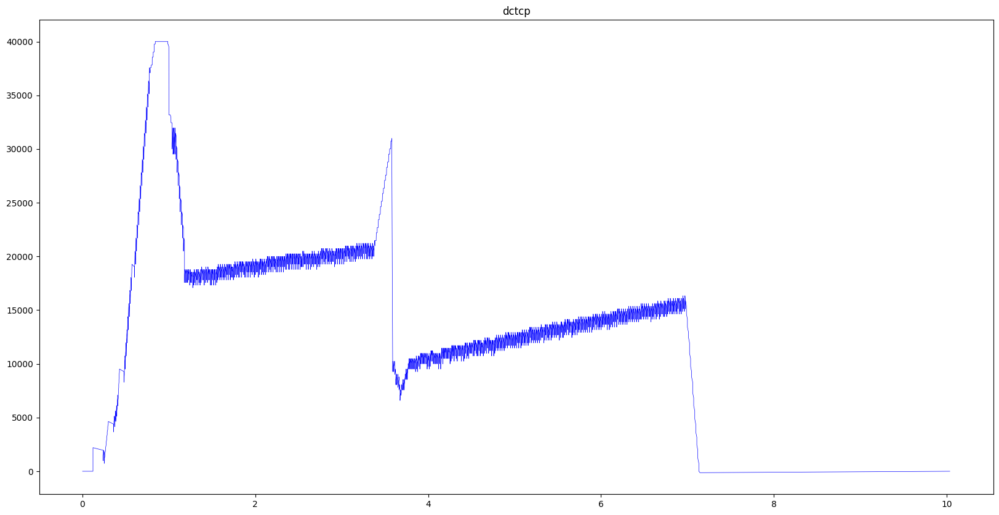

Reading ./Nebby/measurements/highspeed-tcp.csv...
total bytes processed: 905.443 KBytes for highspeed (unlimited)


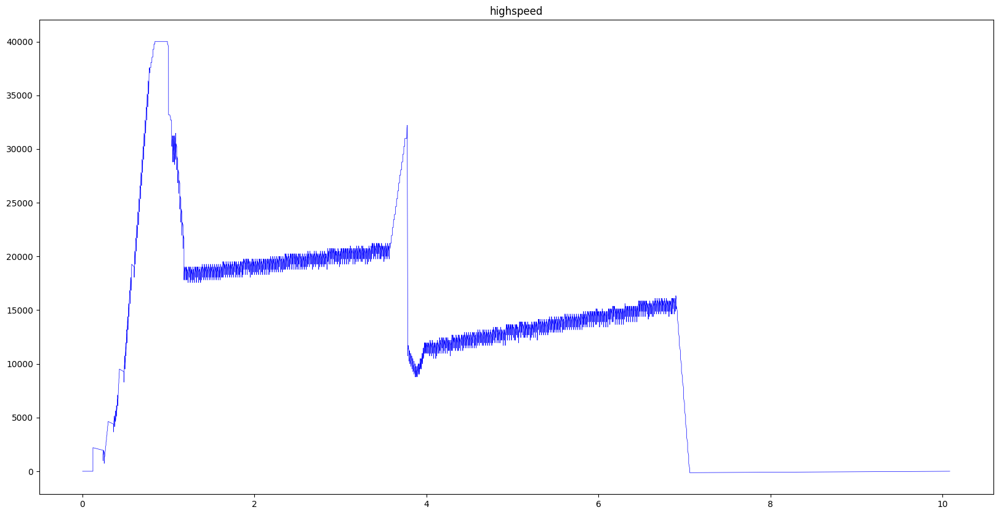

Reading ./Nebby/measurements/htcp-tcp.csv...
total bytes processed: 911.671 KBytes for htcp (unlimited)


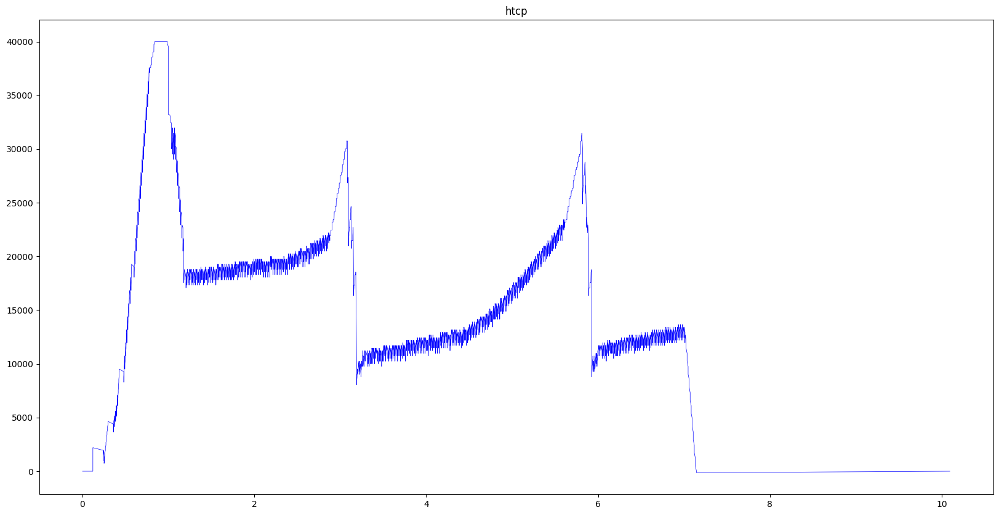

Reading ./Nebby/measurements/hybla-tcp.csv...
total bytes processed: 1302.499 KBytes for hybla (unlimited)


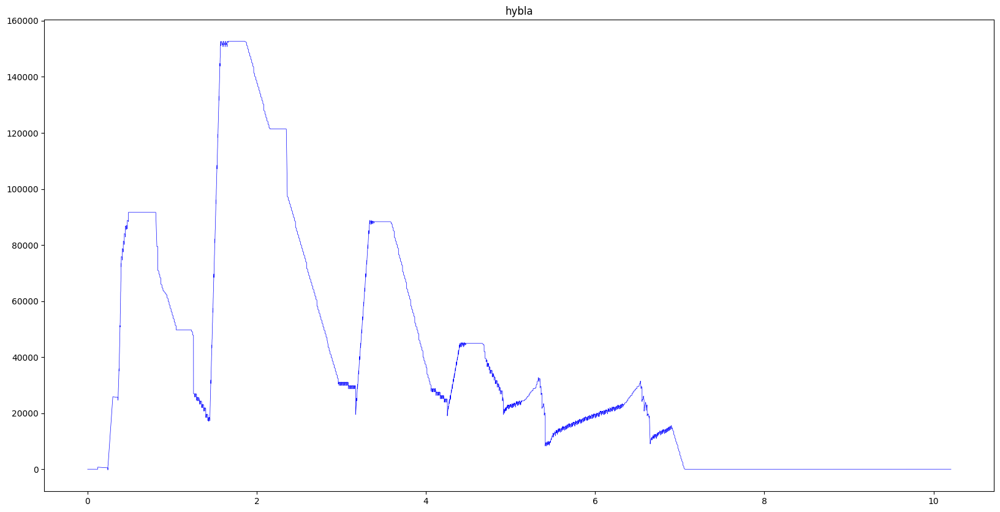

Reading ./Nebby/measurements/illinois-tcp.csv...
total bytes processed: 913.155 KBytes for illinois (unlimited)


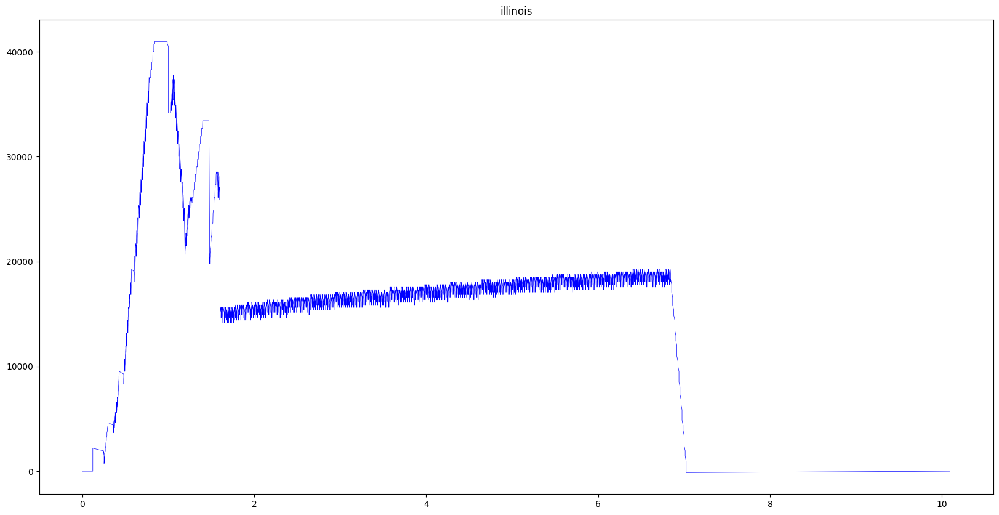

Reading ./Nebby/measurements/lp-tcp.csv...
total bytes processed: 893.751 KBytes for lp (unlimited)


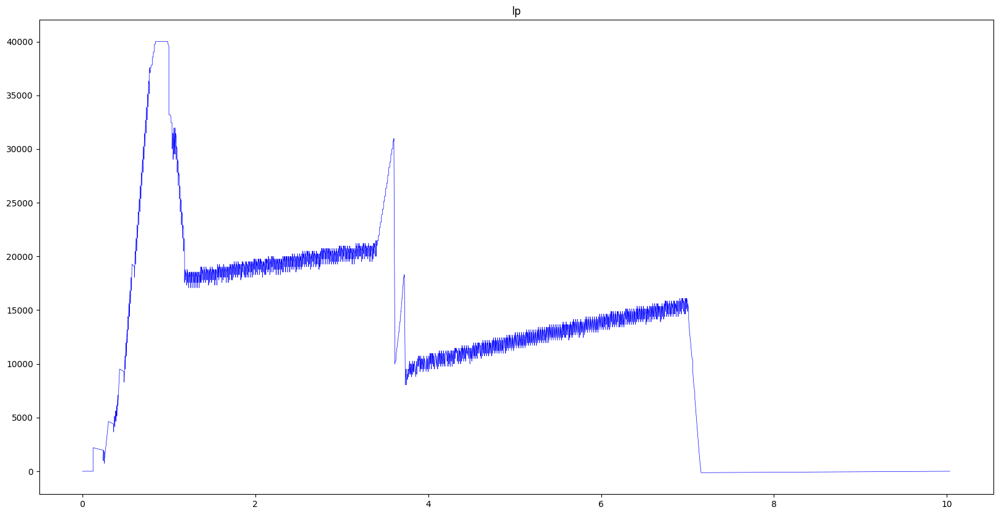

Reading ./Nebby/measurements/nv-tcp.csv...
total bytes processed: 879.939 KBytes for nv (unlimited)


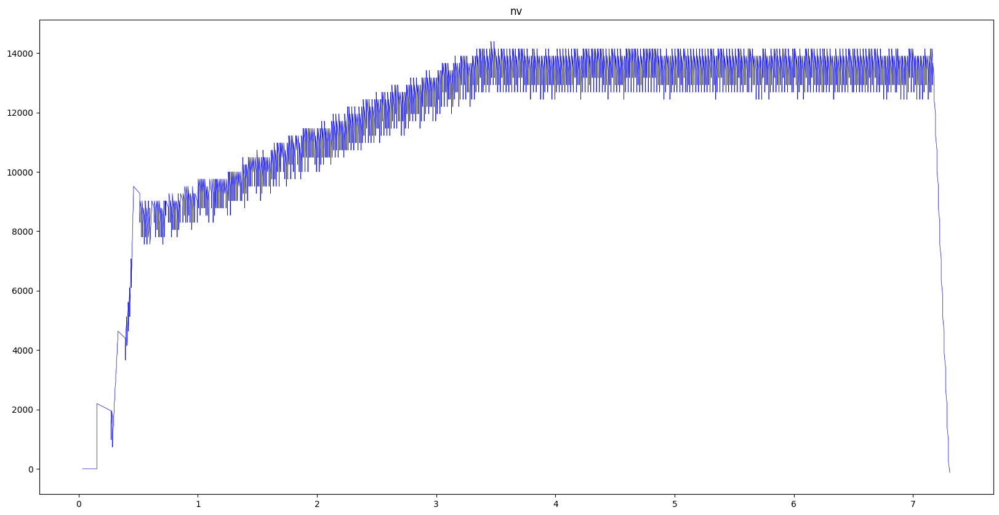

Reading ./Nebby/measurements/scalable-tcp.csv...
total bytes processed: 926.407 KBytes for scalable (unlimited)


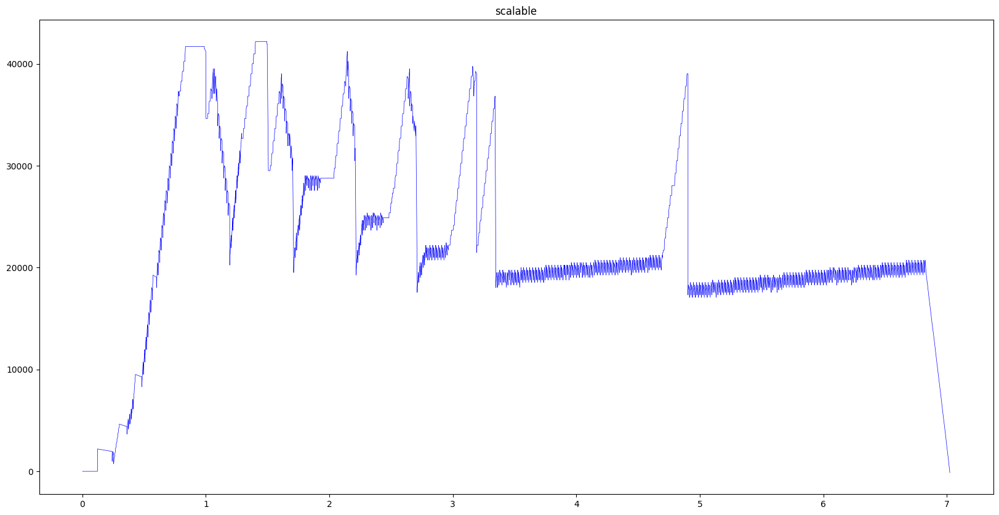

Reading ./Nebby/measurements/vegas-tcp.csv...
total bytes processed: 906.879 KBytes for vegas (unlimited)


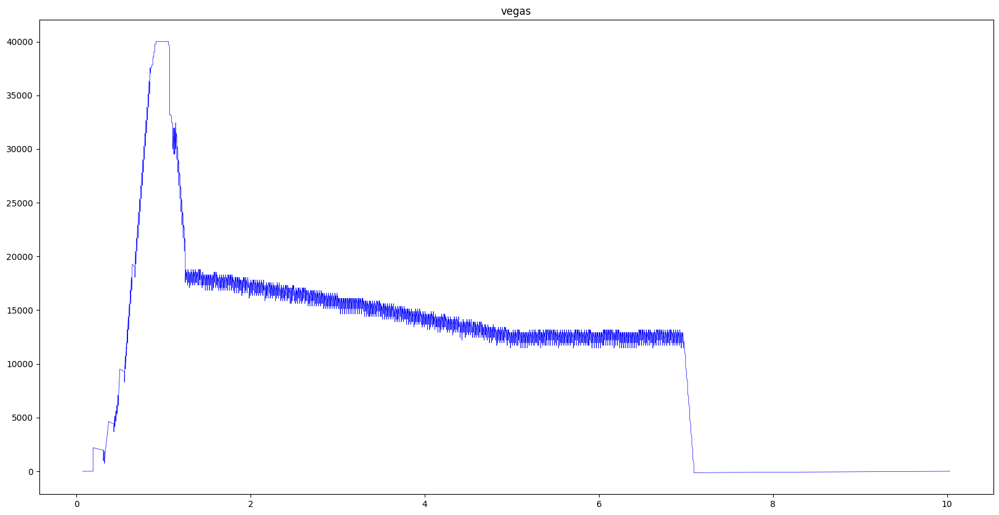

Reading ./Nebby/measurements/westwood-tcp.csv...
total bytes processed: 909.055 KBytes for westwood (unlimited)


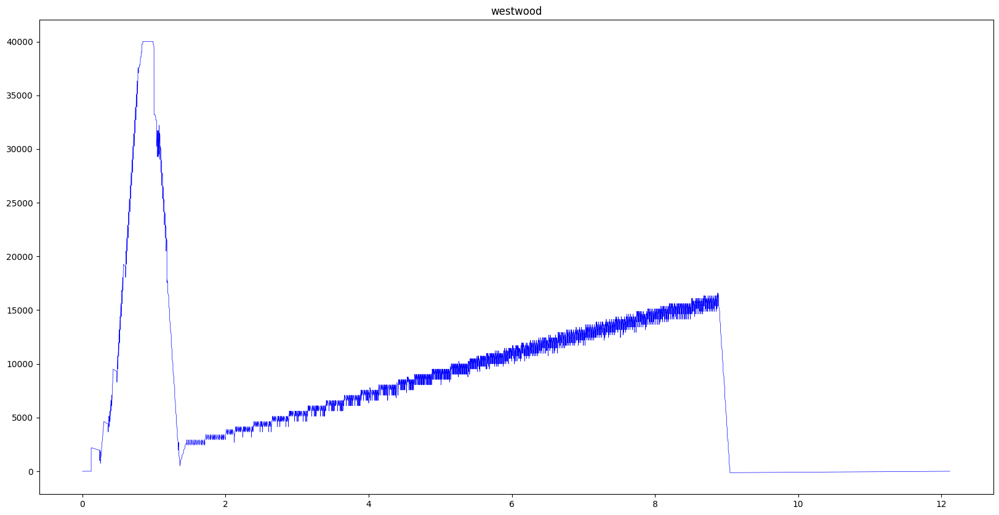

Reading ./Nebby/measurements/yeah-tcp.csv...
total bytes processed: 942.047 KBytes for yeah (unlimited)


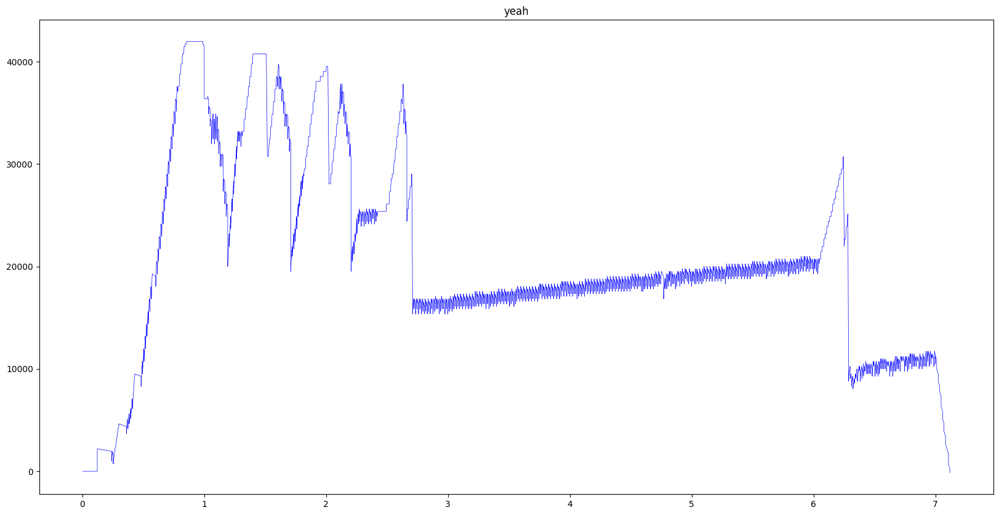

In [20]:
ccs = get_algo_files()
plot_g(ccs,z=1)

Reading ./Nebby/measurements/reno-tcp.csv...
total bytes processed: 904.127 KBytes for reno (unlimited)


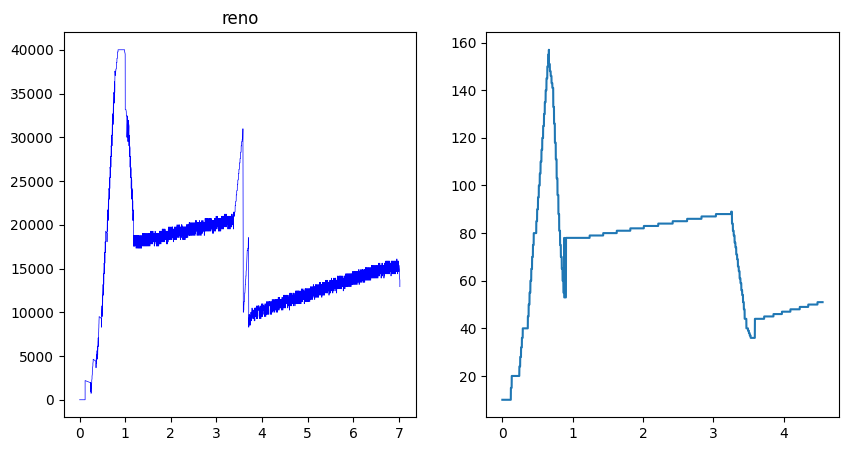

Reading ./Nebby/measurements/cubic-tcp.csv...
total bytes processed: 885.967 KBytes for cubic (unlimited)


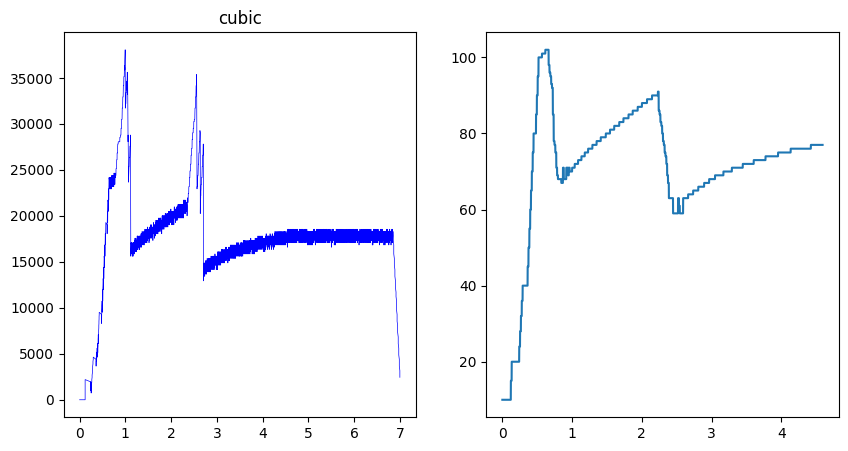

Reading ./Nebby/measurements/bbr-tcp.csv...
total bytes processed: 920.087 KBytes for bbr (unlimited)


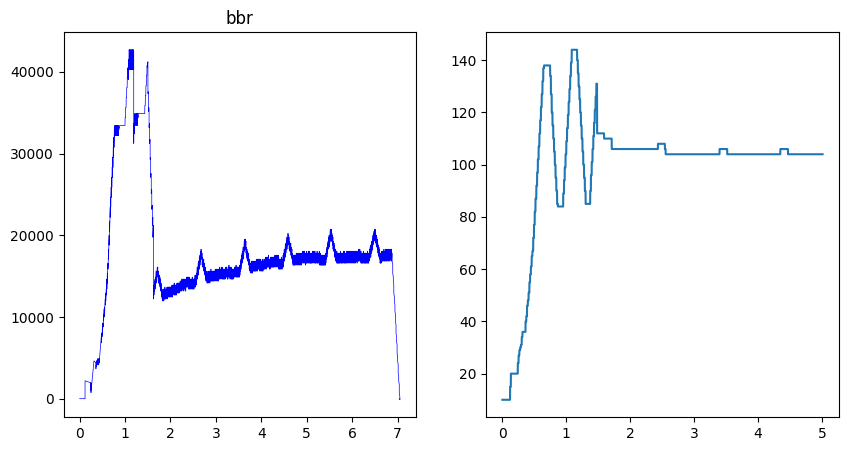

Reading ./Nebby/measurements/veno-tcp.csv...
total bytes processed: 903.08 KBytes for veno (unlimited)


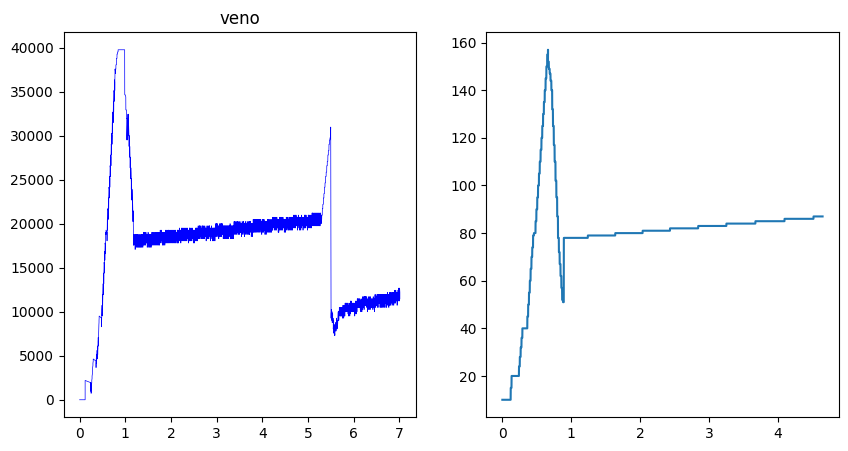

Reading ./Nebby/measurements/bic-tcp.csv...
total bytes processed: 937.639 KBytes for bic (unlimited)


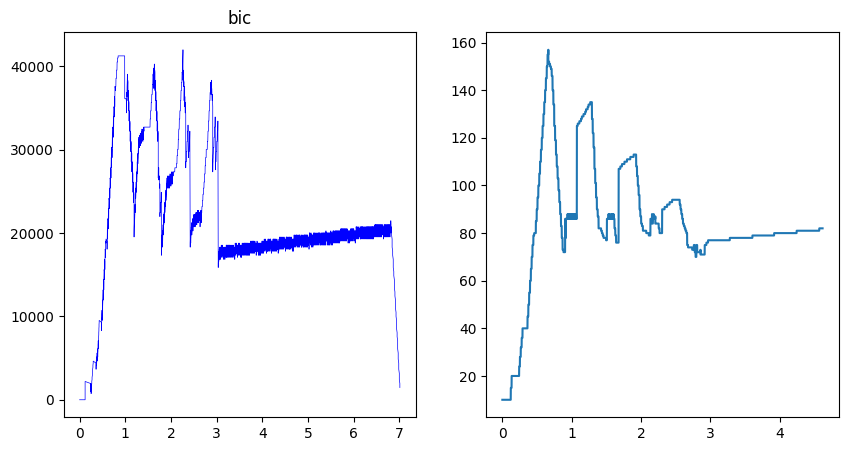

Reading ./Nebby/measurements/cdg-tcp.csv...
total bytes processed: 889.879 KBytes for cdg (unlimited)


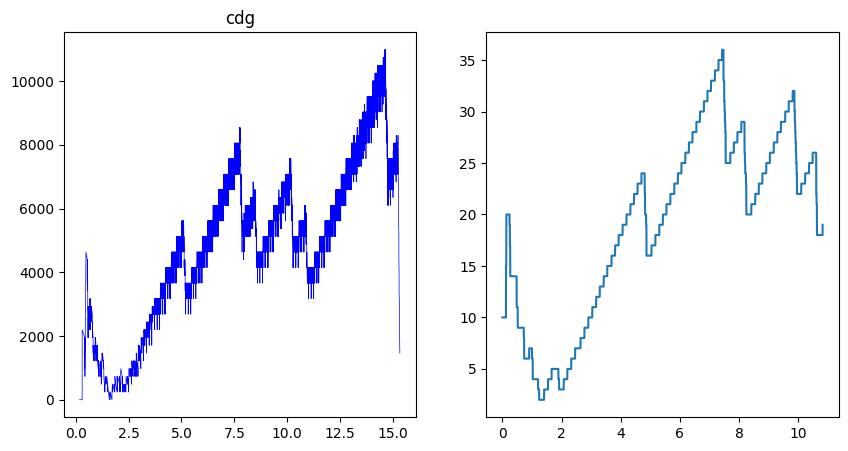

Reading ./Nebby/measurements/dctcp-tcp.csv...
total bytes processed: 903.679 KBytes for dctcp (unlimited)


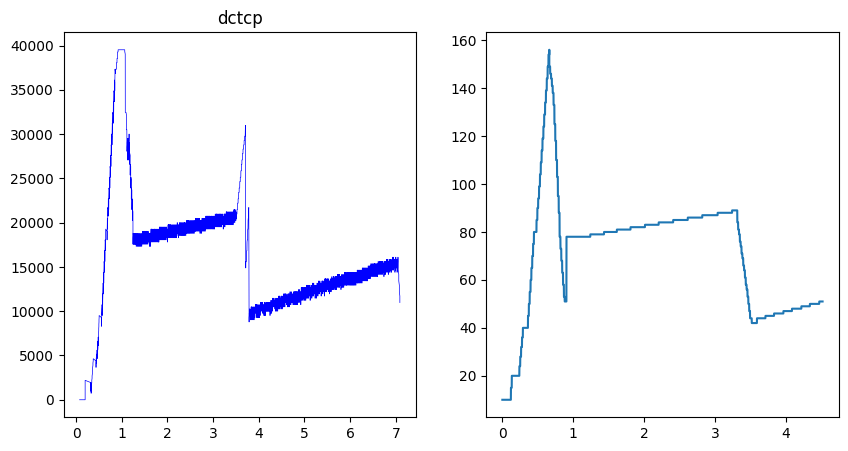

Reading ./Nebby/measurements/highspeed-tcp.csv...
total bytes processed: 903.723 KBytes for highspeed (unlimited)


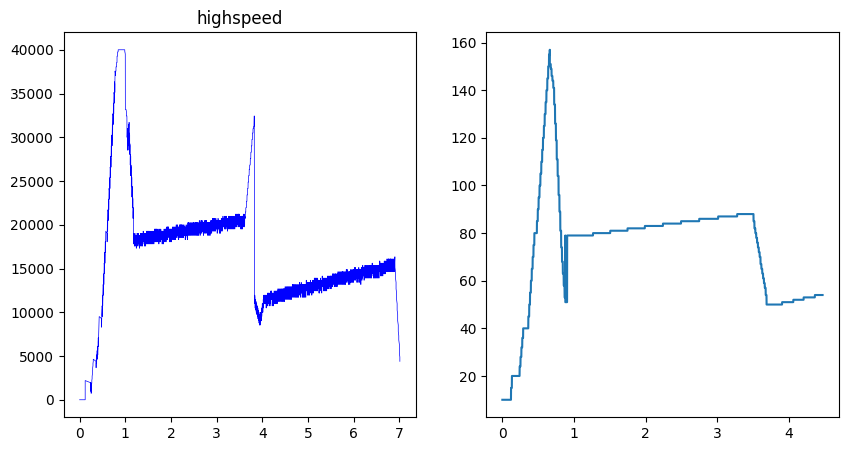

Reading ./Nebby/measurements/htcp-tcp.csv...
total bytes processed: 909.747 KBytes for htcp (unlimited)


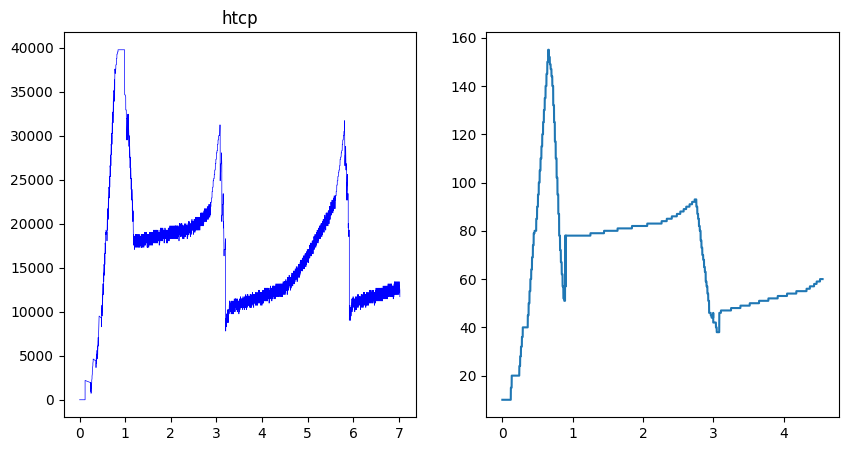

Reading ./Nebby/measurements/hybla-tcp.csv...
total bytes processed: 1298.299 KBytes for hybla (unlimited)


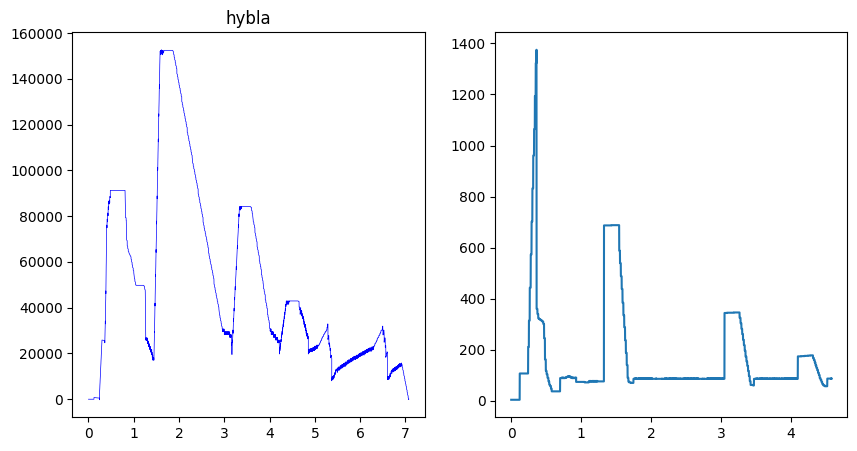

Reading ./Nebby/measurements/illinois-tcp.csv...
total bytes processed: 912.735 KBytes for illinois (unlimited)


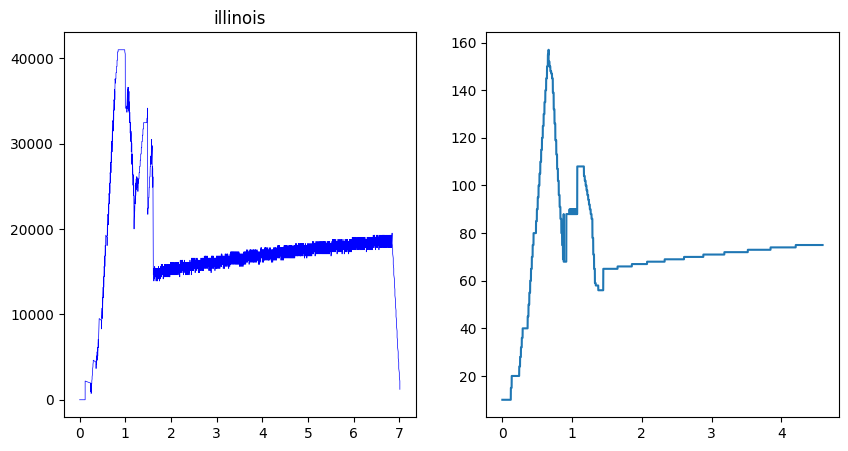

Reading ./Nebby/measurements/lp-tcp.csv...
total bytes processed: 903.635 KBytes for lp (unlimited)


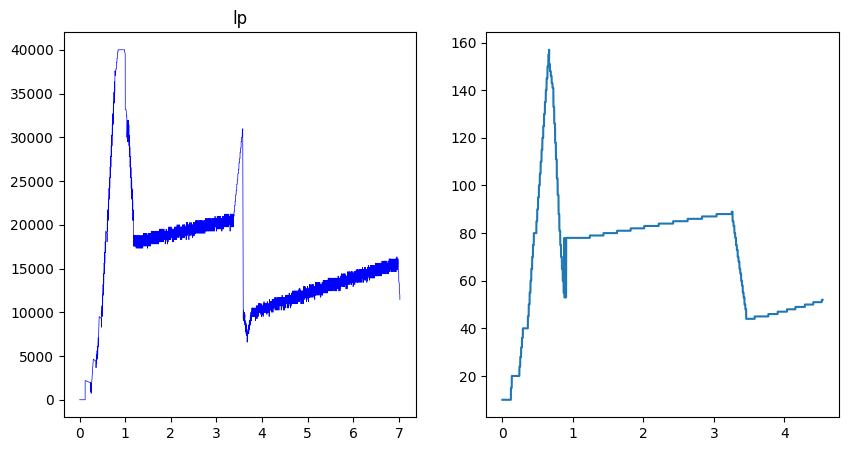

Reading ./Nebby/measurements/nv-tcp.csv...
total bytes processed: 861.524 KBytes for nv (unlimited)


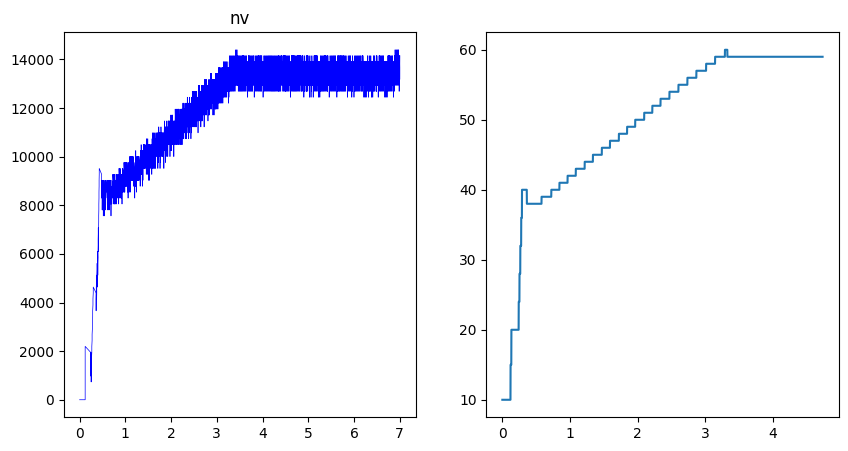

Reading ./Nebby/measurements/scalable-tcp.csv...
total bytes processed: 923.535 KBytes for scalable (unlimited)


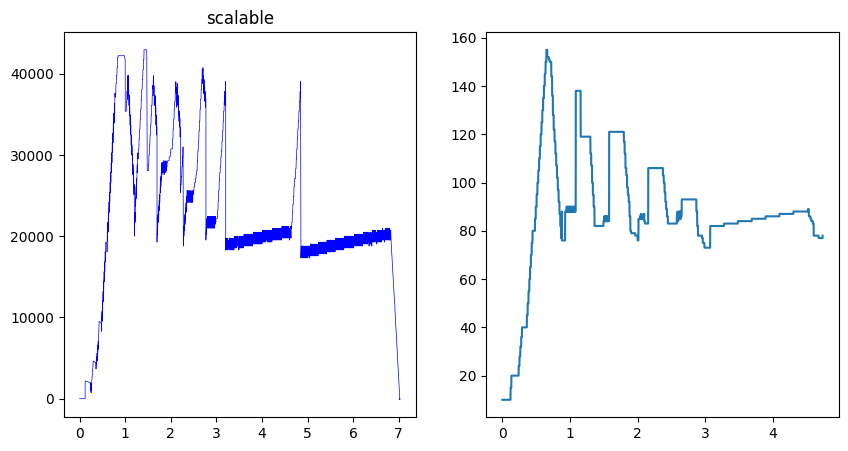

Reading ./Nebby/measurements/vegas-tcp.csv...
total bytes processed: 906.331 KBytes for vegas (unlimited)


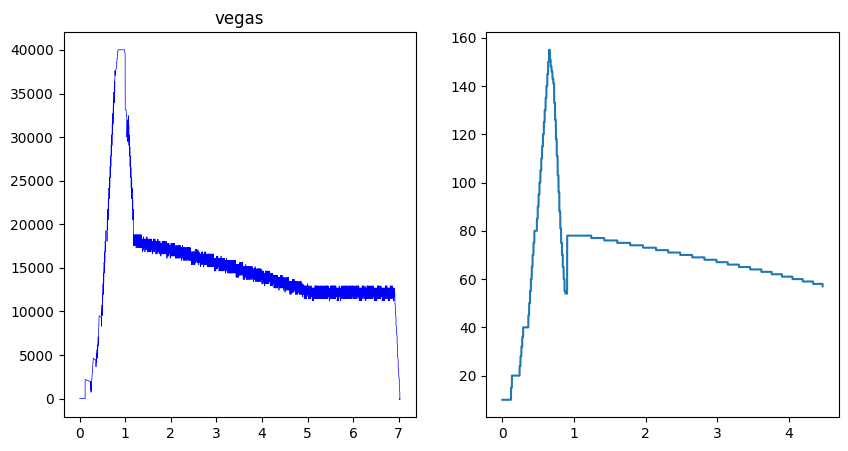

Reading ./Nebby/measurements/westwood-tcp.csv...
total bytes processed: 909.787 KBytes for westwood (unlimited)


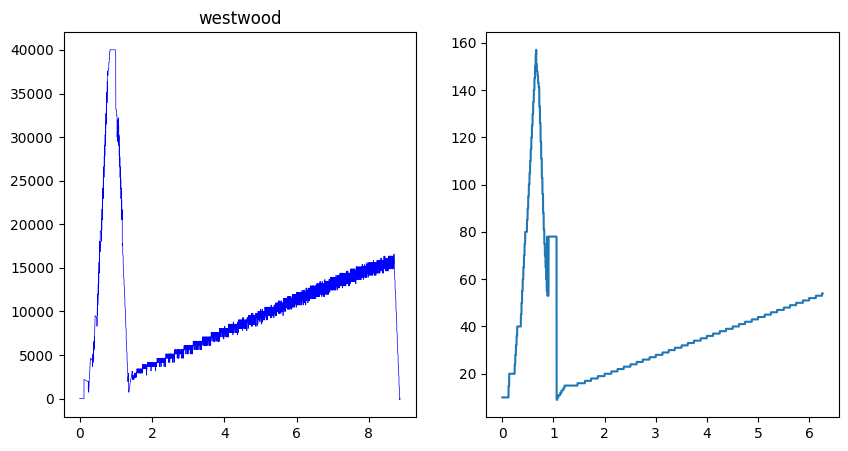

Reading ./Nebby/measurements/yeah-tcp.csv...
total bytes processed: 931.391 KBytes for yeah (unlimited)


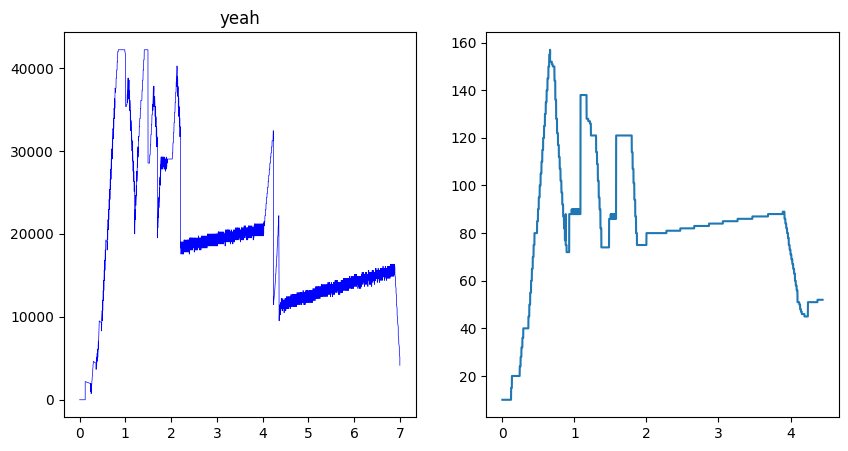

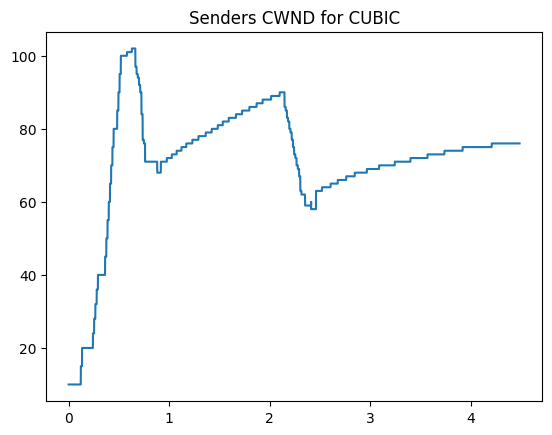

In [54]:
file = folder + "/" + "cubic-stats.csv"
df = pd.read_csv(file,sep=",")
plt.title("Senders CWND for CUBIC")
start = df['ts'][1]
df['ts'] = df['ts'] - start 
plt.plot(df['ts'], df['tcpi_snd_cwnd'])
plt.show()

# Getting the CWND trace from custom client

In [12]:
folder = "/home/lakshayr/nus_intern/Nebby/custom_clients/statsfiles"

In [13]:
from os import walk

f = []
for (dirpath, dirnames, filenames) in walk(folder):
    f.extend(filenames)

In [14]:
file = folder + "/" + filenames[0]

In [15]:
print(file)

/home/lakshayr/nus_intern/Nebby/custom_clients/statsfiles/lp-stats.csv


In [16]:
import pandas as pd

In [32]:
df = pd.read_csv(file,sep="\t")

In [37]:
df['ts']

0        1.686193e+09
1        1.686193e+09
2        1.686193e+09
3        1.686193e+09
4        1.686193e+09
             ...     
49995    1.686193e+09
49996    1.686193e+09
49997    1.686193e+09
49998    1.686193e+09
49999    1.686193e+09
Name: ts, Length: 50000, dtype: float64

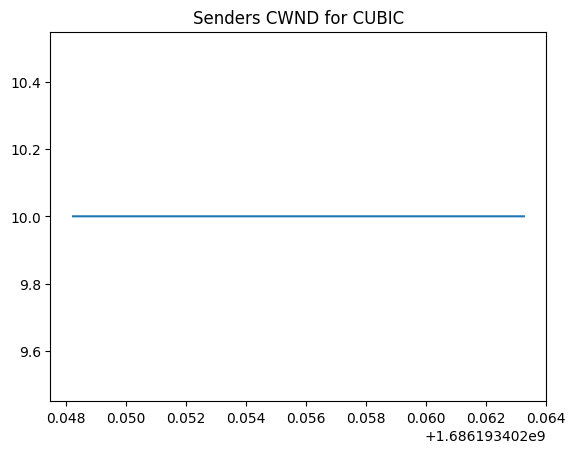

In [34]:
plt.title("Senders CWND for CUBIC")
plt.plot(df['ts'], df['tcpi_snd_cwnd'])
plt.show()

# Moving Average 

### 1 - Normal Moving Average
### 2 - Exponential Moving Average

In [568]:
curr_files = get_files("","35","500")
print(curr_files)

['cubic-35-500', 'reno-35-500', 'bbr-35-500']


In [120]:
def plot_ma(files, t=1, k=10, alpha=0.5):
    for file in files : 
        print(file)
        data, time = get_window(file, "n")
        if t == 0 or t == 1:
            ma_data = []
            for i in range(len(data)):
                if i-k < 0:
                    curr = sum(data[0:i+1])
                    curr += sum(data[i+1:abs(i-k)])
                    curr = float(curr)/k
                else :
                    curr = sum(data[i-k:i+1]);
                    curr = float(curr)/k
                ma_data.append(curr)
            title = "MA " + str(k)
            plt.figure(figsize =(10,8))
            plt.title(title)
            plt.plot(time, data, color="b", alpha=0.5, label='original signal')
            plt.plot(time, ma_data, 'k', label="MA")
            plt.show()
        if t == 0 or t == 2 :
            ma_data = []
            for i in range(len(data)):
                if i == 0:
                    curr = data[i]
                else :
                    curr = alpha*data[i] + (1-alpha)*ma_data[i-1]
                ma_data.append(curr)
            plt.figure(figsize =(10,8))
            plt.title("EMA "+str(alpha))
            plt.plot(time, data, color="b", alpha=0.5, label='original signal')
            plt.plot(time, ma_data, 'k', label="EMA")
            plt.show()

reno
Reading ./Nebby/measurements/reno-tcp.csv...
total bytes processed: 904.127 KBytes for reno (unlimited)


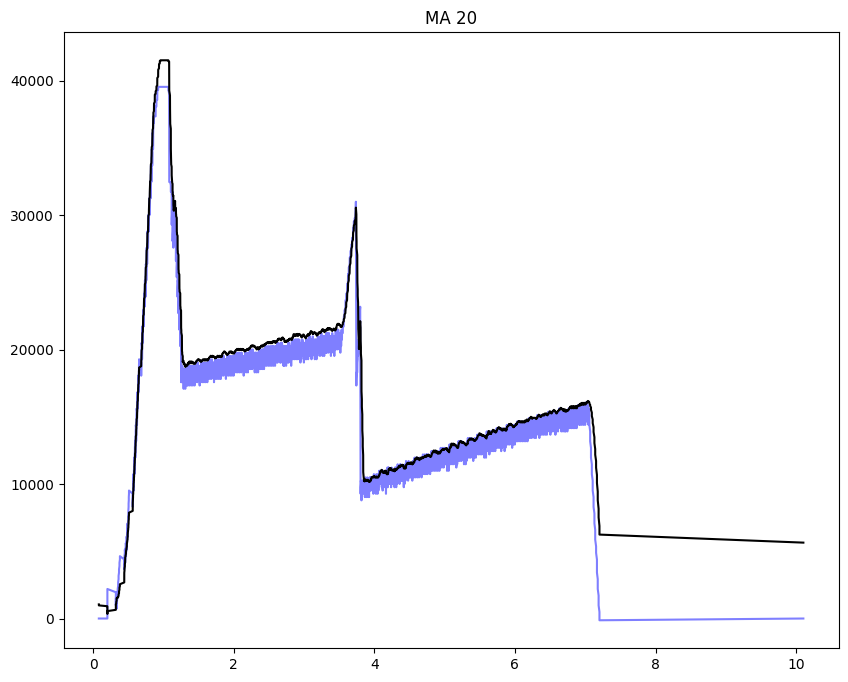

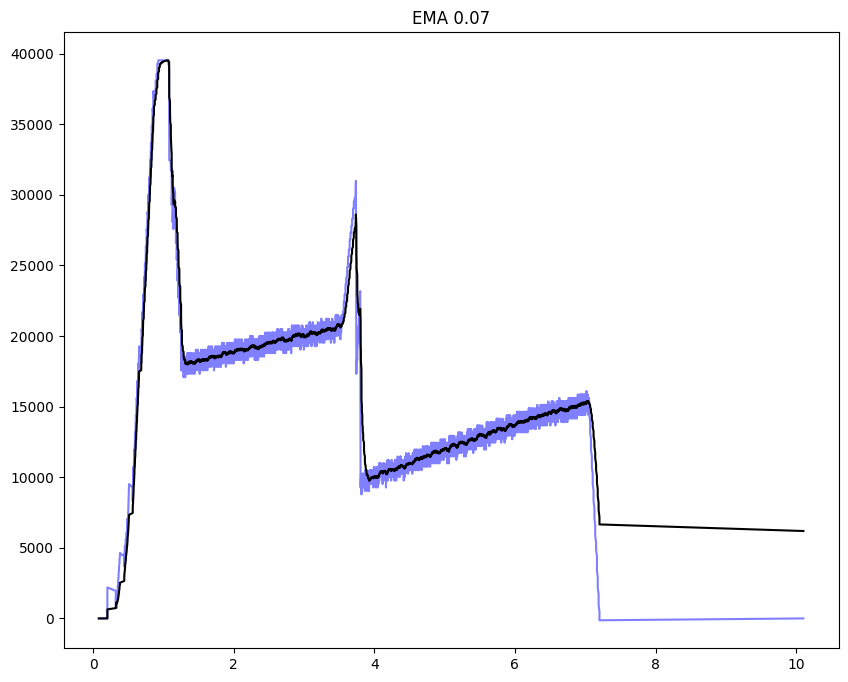

cubic
Reading ./Nebby/measurements/cubic-tcp.csv...
total bytes processed: 886.307 KBytes for cubic (unlimited)


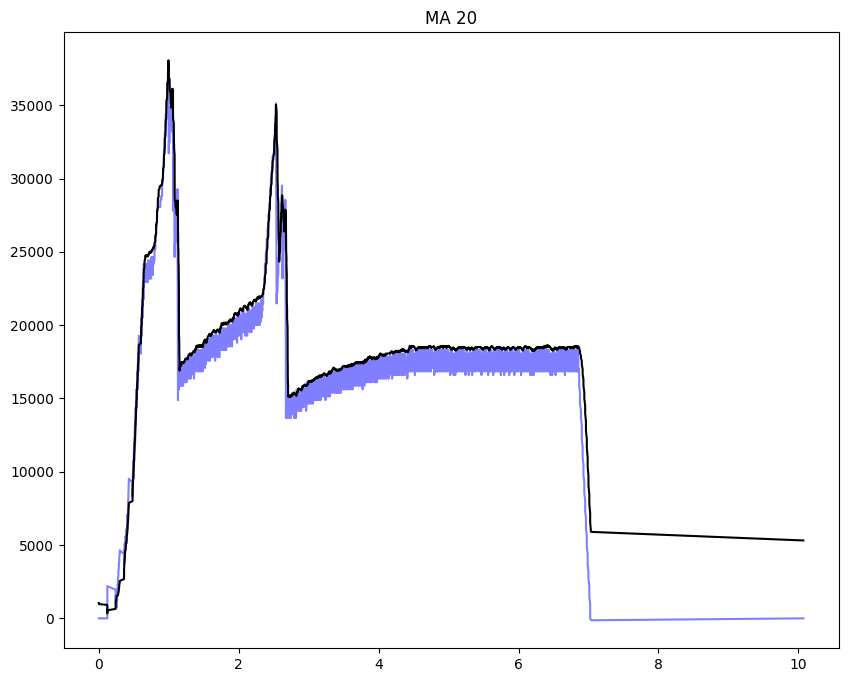

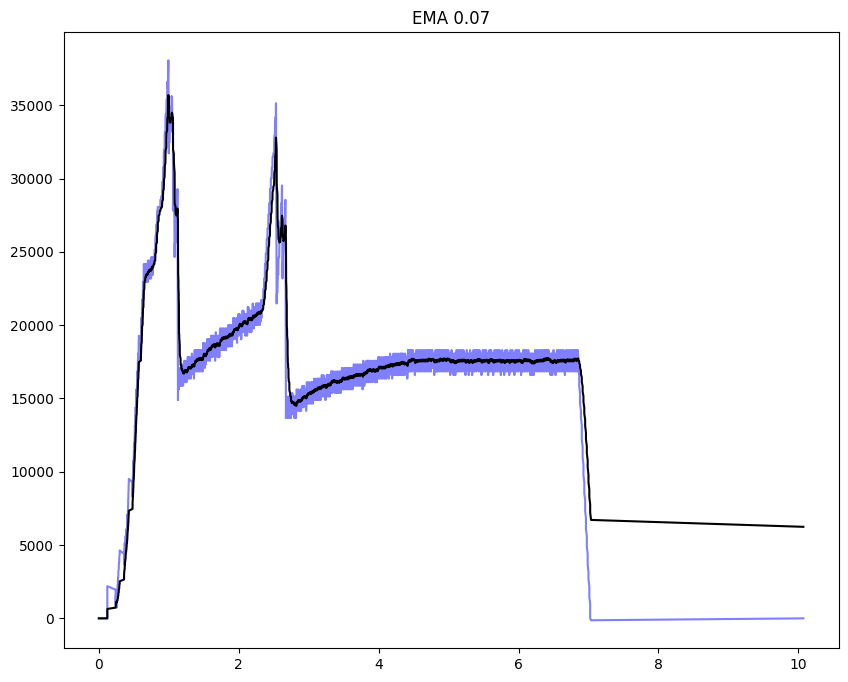

bbr
Reading ./Nebby/measurements/bbr-tcp.csv...
total bytes processed: 921.731 KBytes for bbr (unlimited)


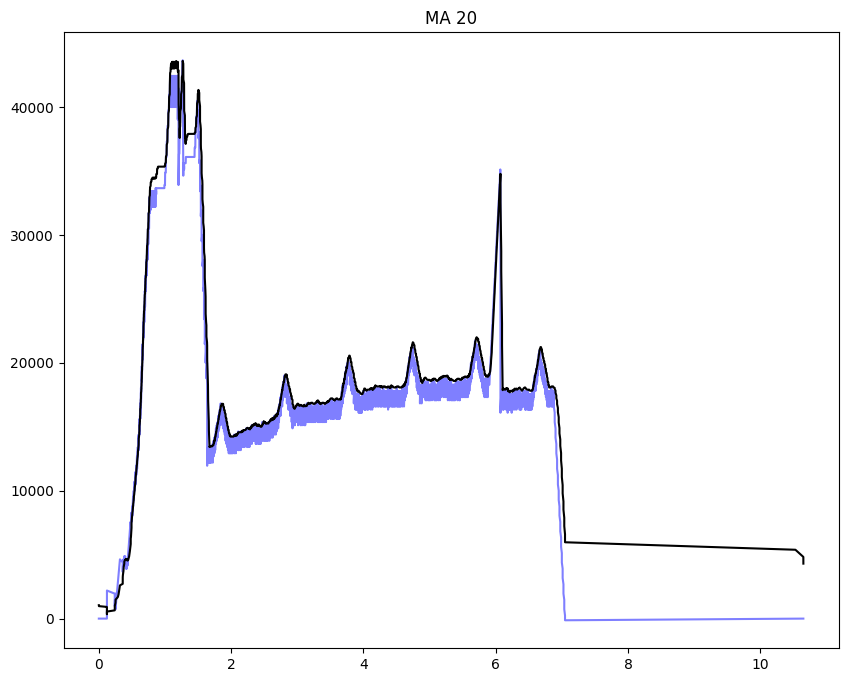

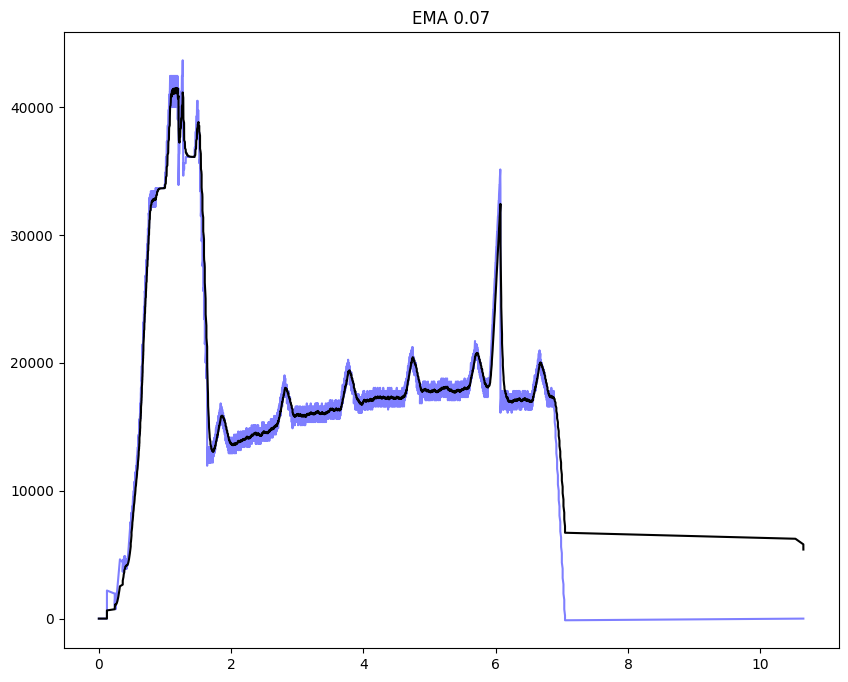

veno
Reading ./Nebby/measurements/veno-tcp.csv...
total bytes processed: 906.927 KBytes for veno (unlimited)


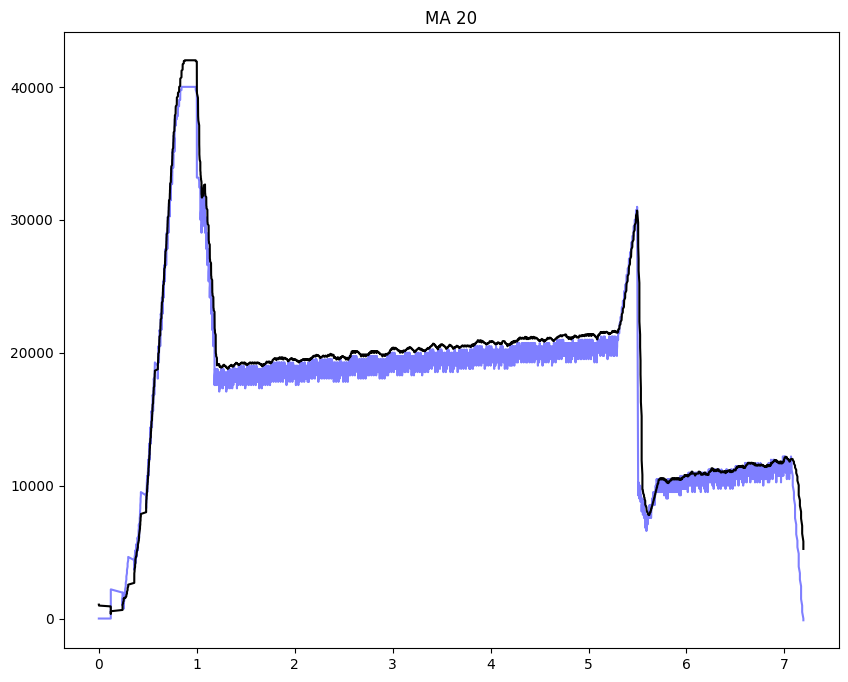

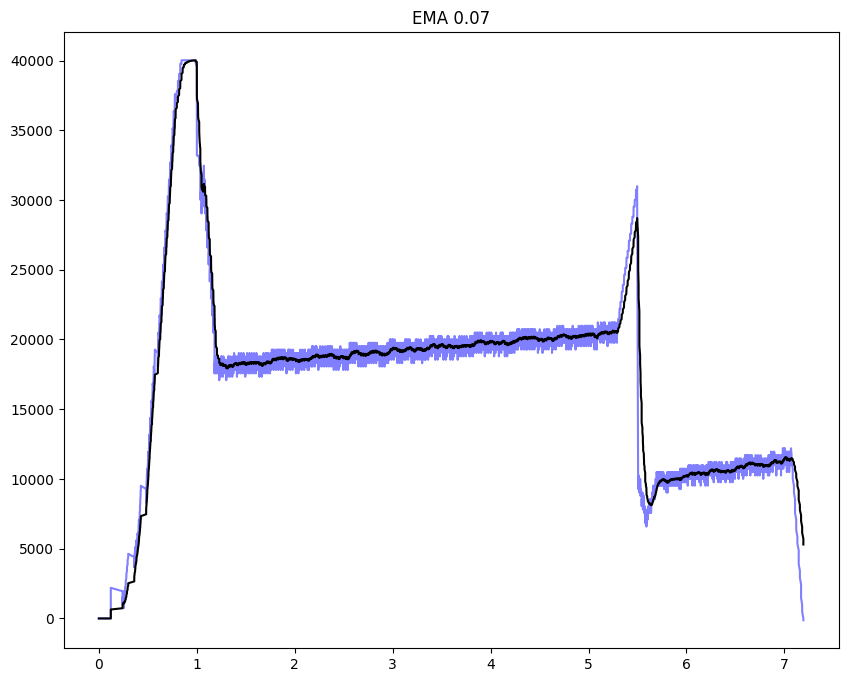

bic
Reading ./Nebby/measurements/bic-tcp.csv...
total bytes processed: 925.035 KBytes for bic (unlimited)


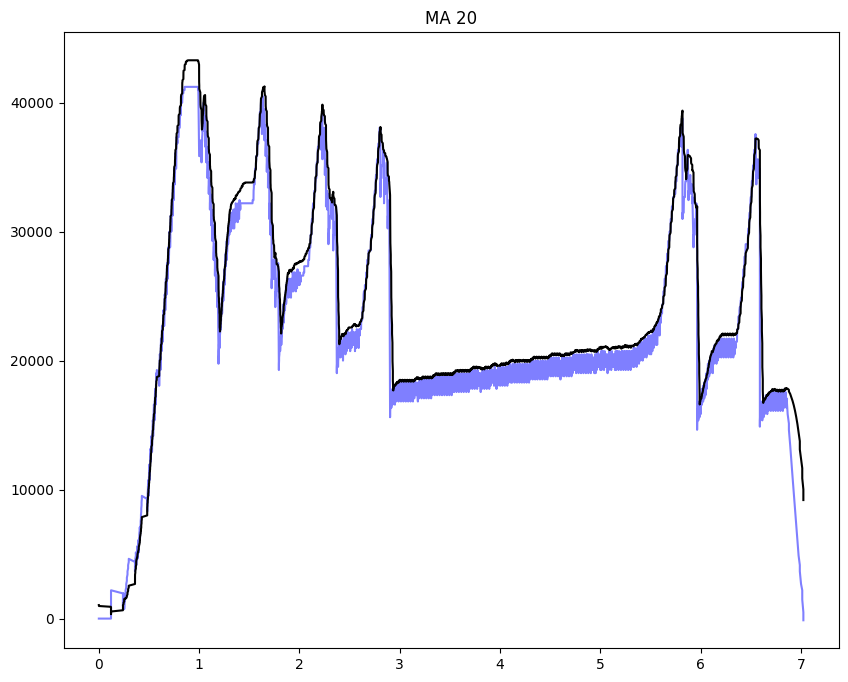

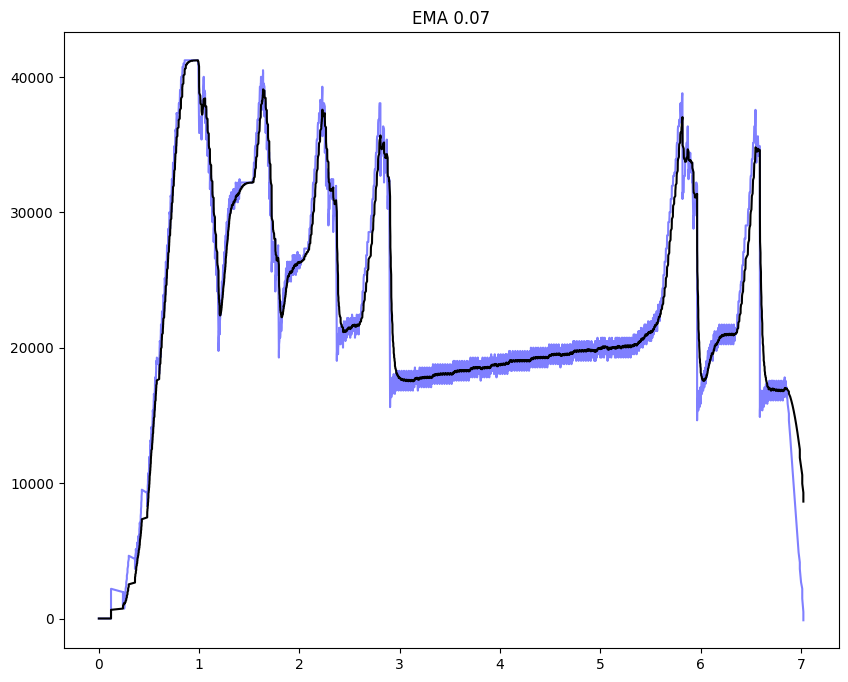

cdg
Reading ./Nebby/measurements/cdg-tcp.csv...
total bytes processed: 885.883 KBytes for cdg (unlimited)


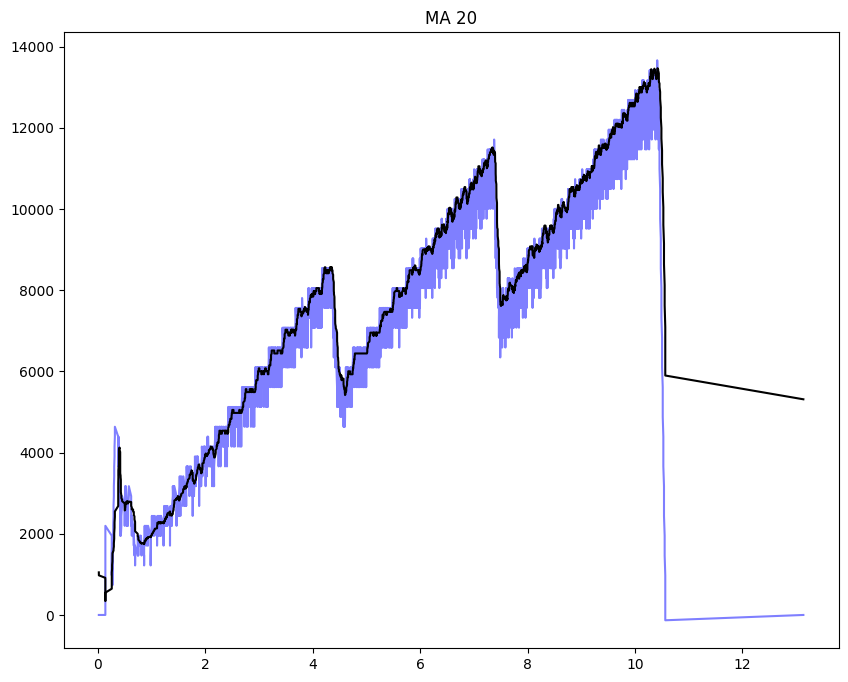

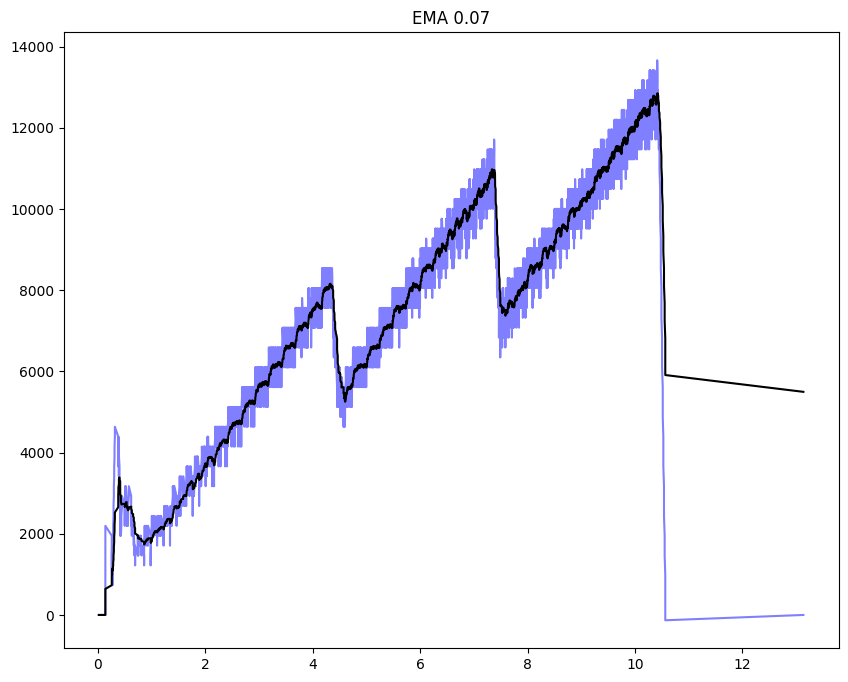

dctcp
Reading ./Nebby/measurements/dctcp-tcp.csv...
total bytes processed: 905.443 KBytes for dctcp (unlimited)


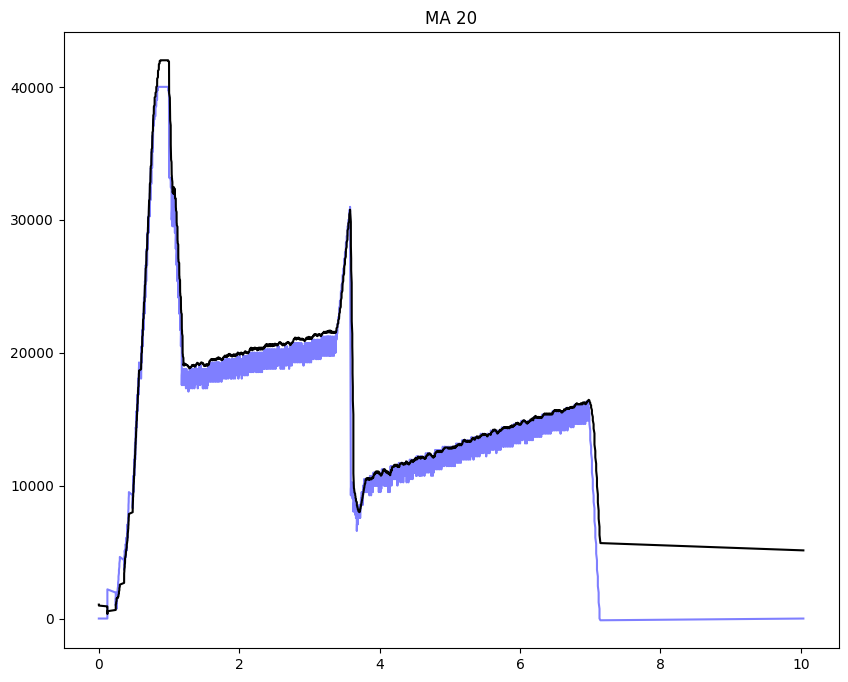

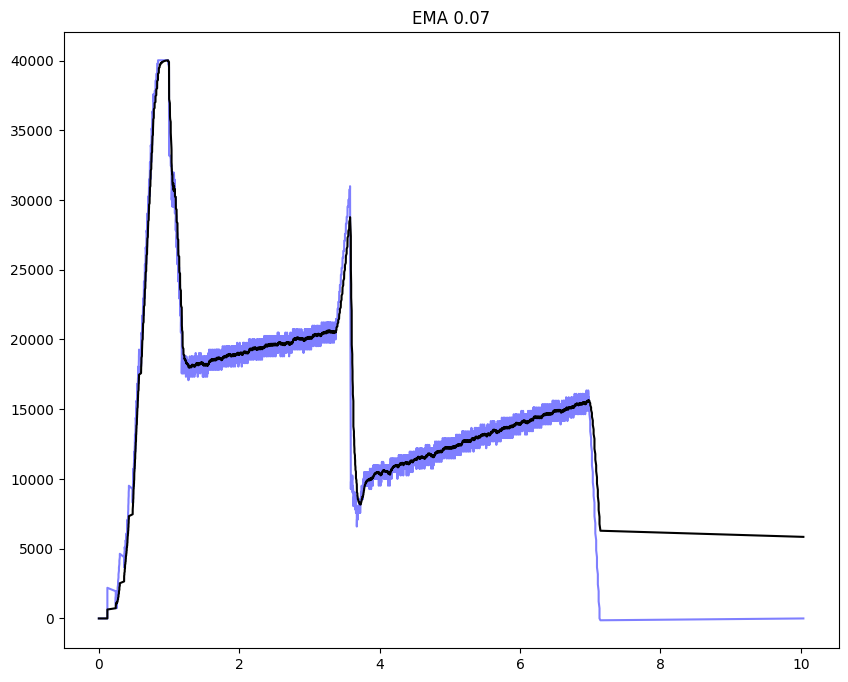

highspeed
Reading ./Nebby/measurements/highspeed-tcp.csv...
total bytes processed: 905.443 KBytes for highspeed (unlimited)


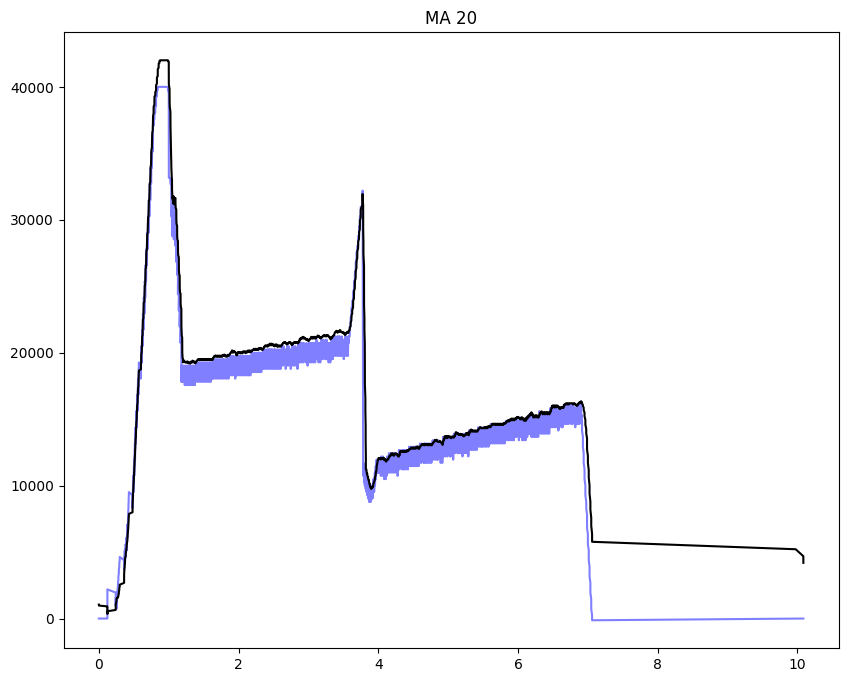

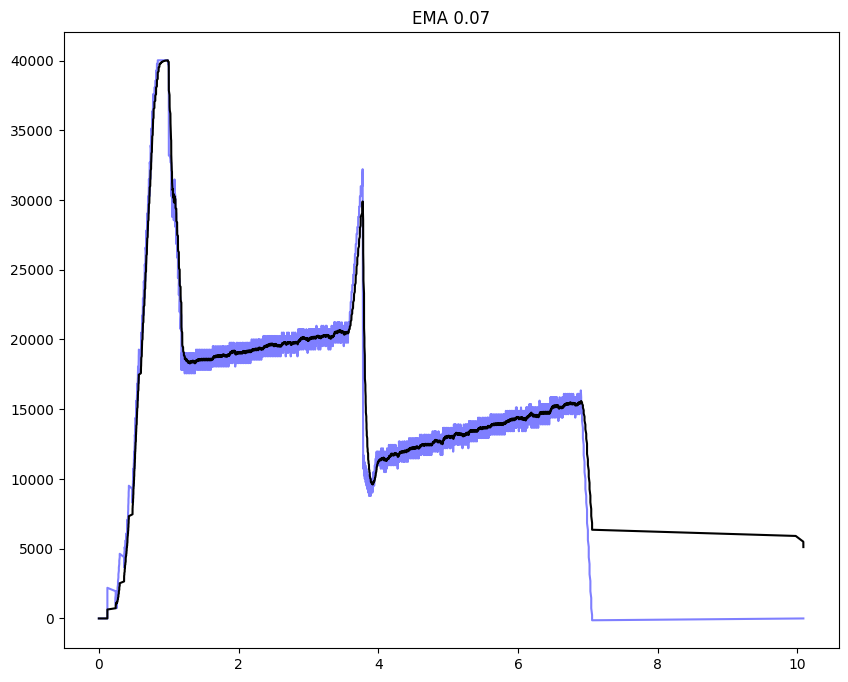

htcp
Reading ./Nebby/measurements/htcp-tcp.csv...
total bytes processed: 911.671 KBytes for htcp (unlimited)


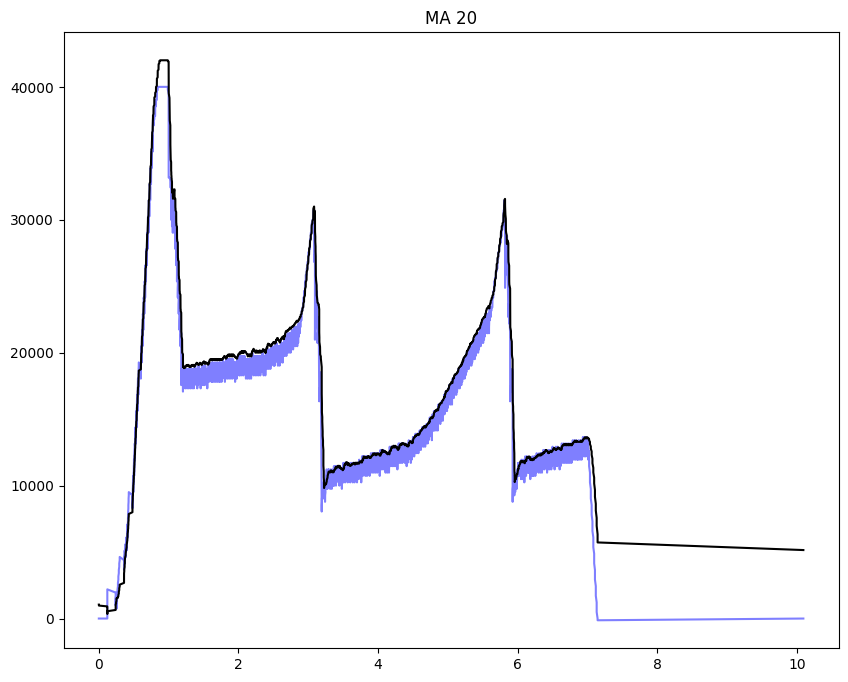

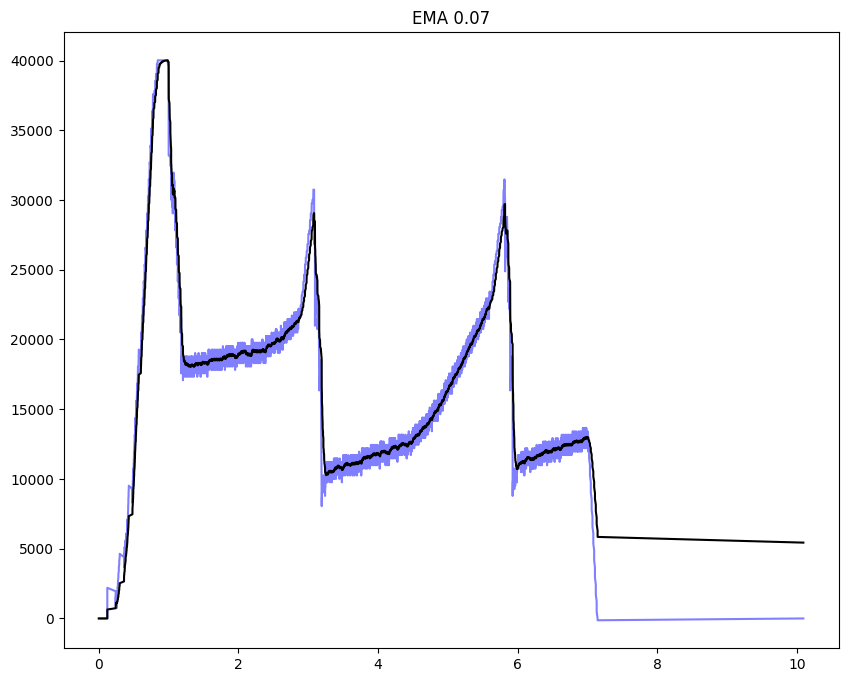

hybla
Reading ./Nebby/measurements/hybla-tcp.csv...
total bytes processed: 1302.499 KBytes for hybla (unlimited)


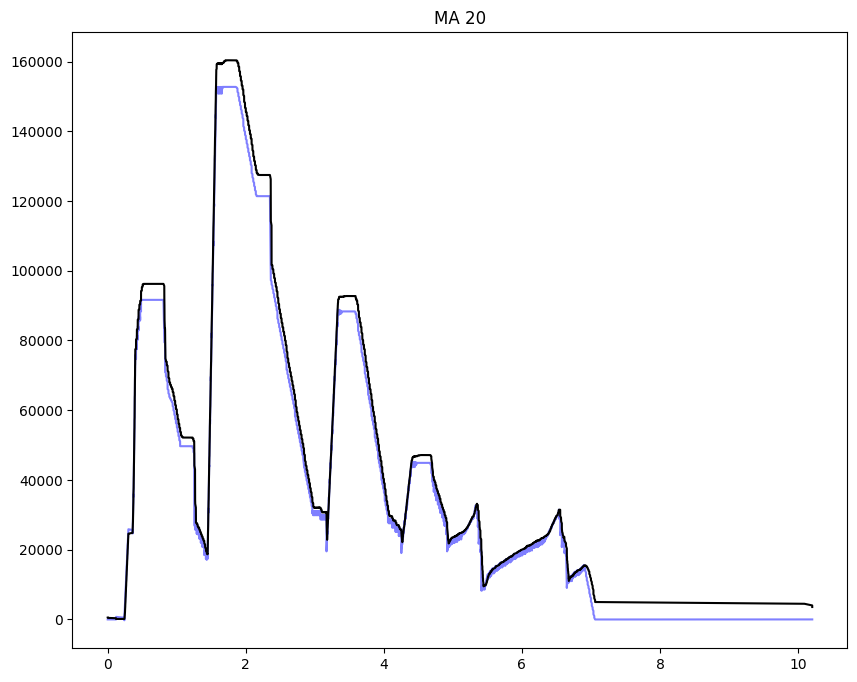

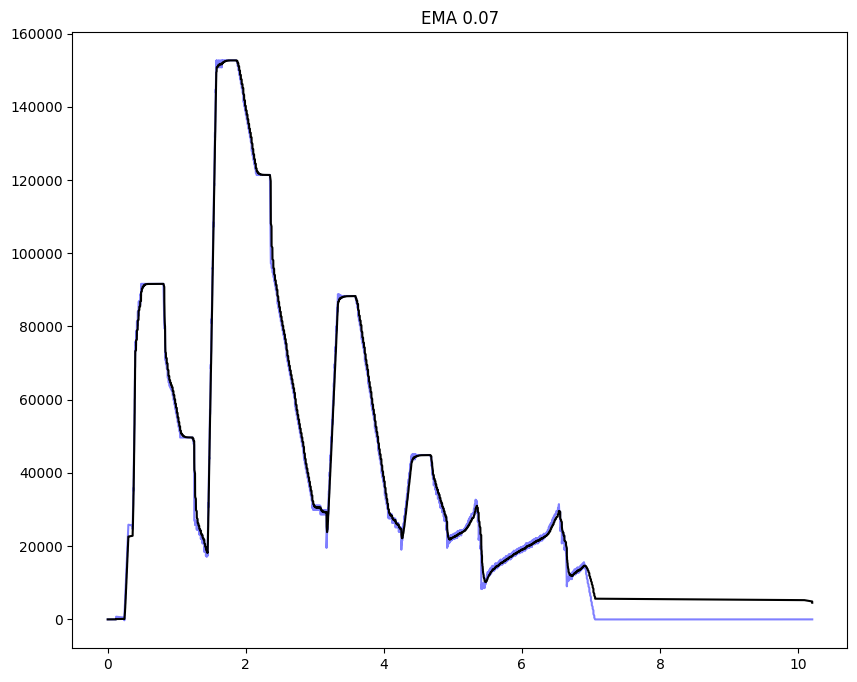

illinois
Reading ./Nebby/measurements/illinois-tcp.csv...
total bytes processed: 913.155 KBytes for illinois (unlimited)


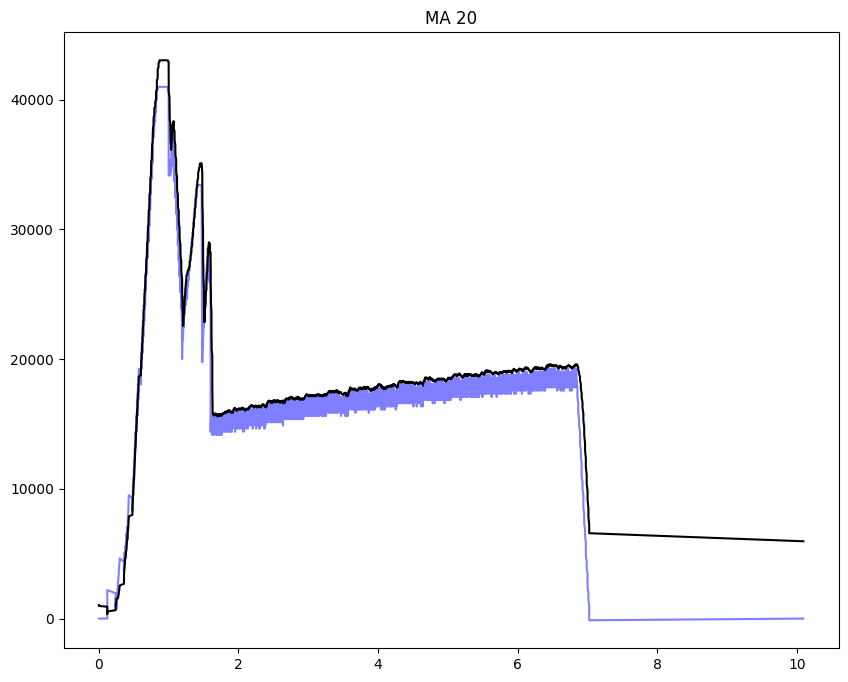

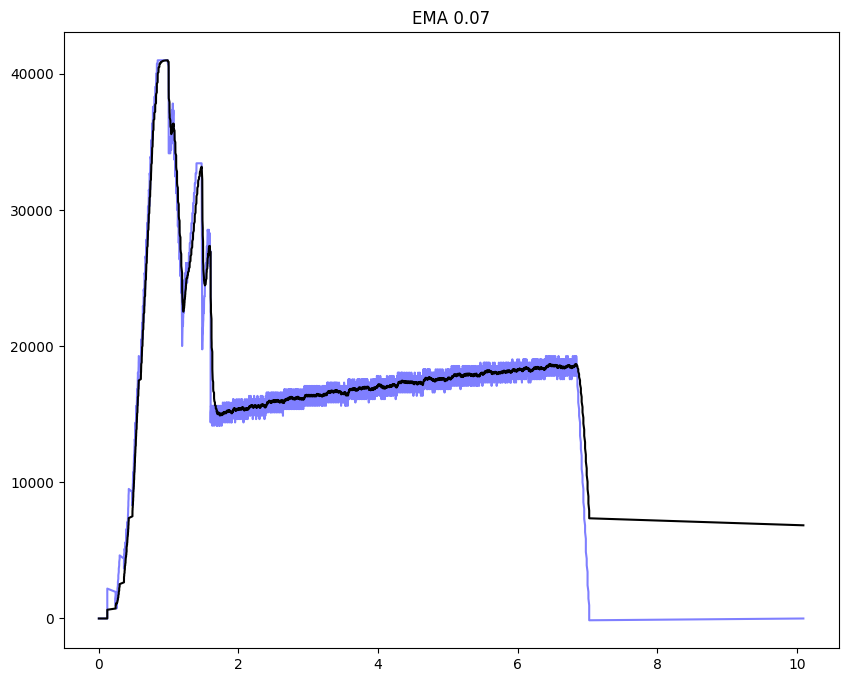

lp
Reading ./Nebby/measurements/lp-tcp.csv...
total bytes processed: 893.751 KBytes for lp (unlimited)


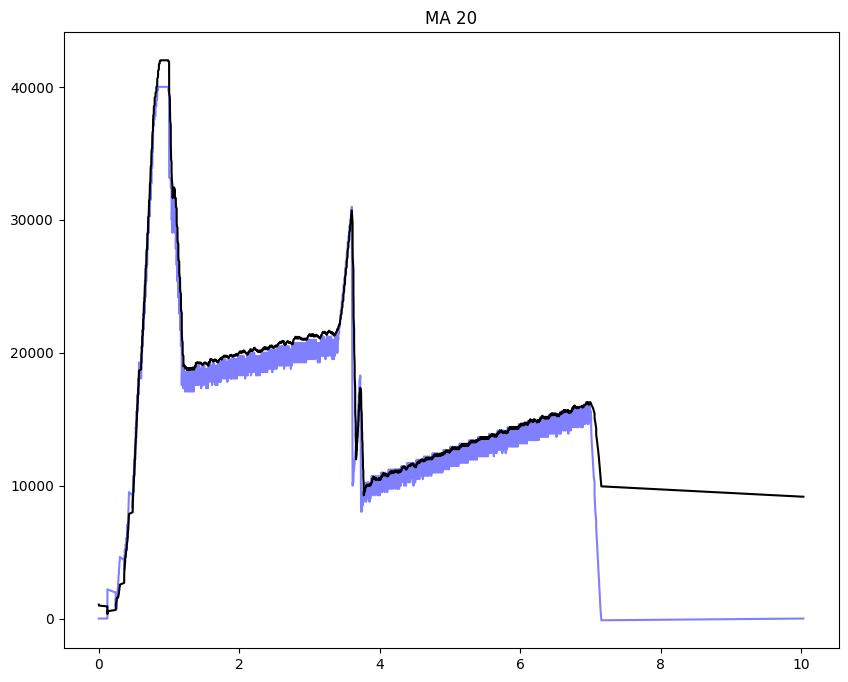

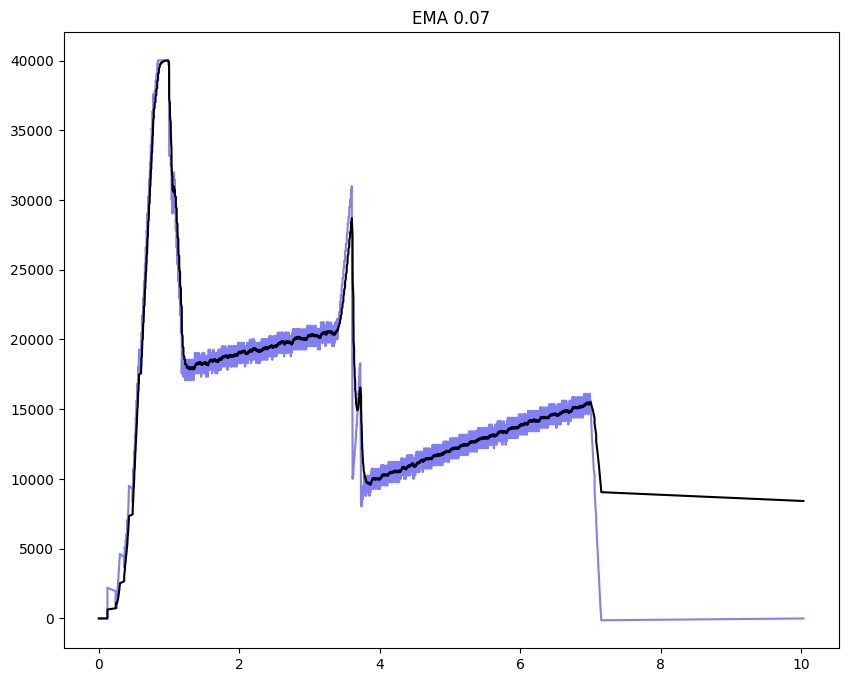

nv
Reading ./Nebby/measurements/nv-tcp.csv...
total bytes processed: 879.939 KBytes for nv (unlimited)


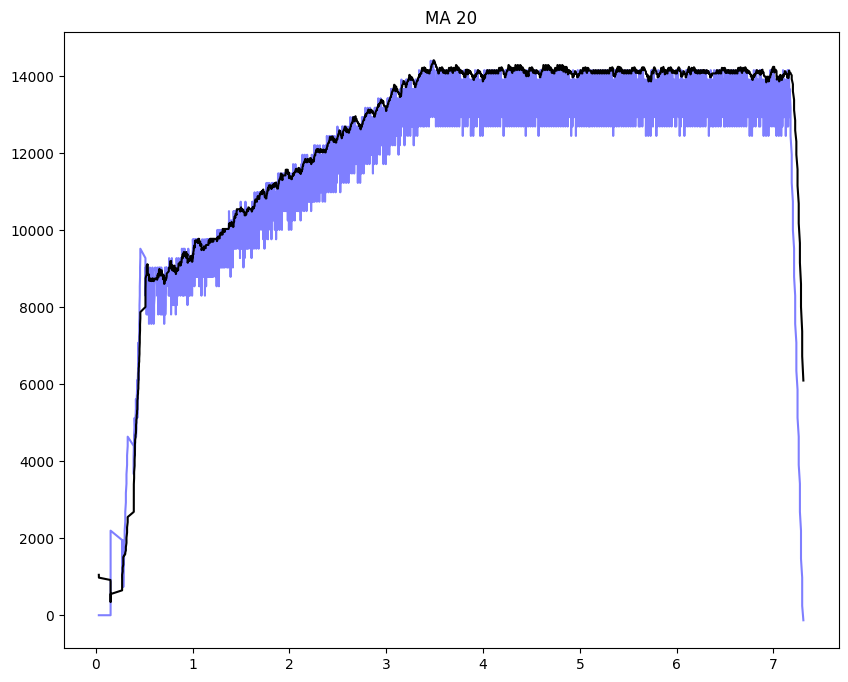

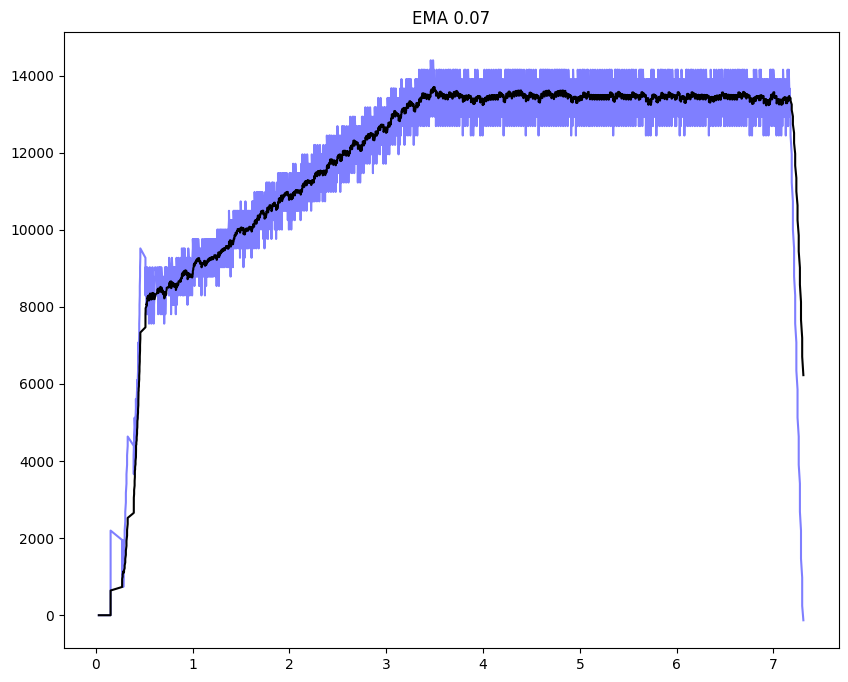

scalable
Reading ./Nebby/measurements/scalable-tcp.csv...
total bytes processed: 926.407 KBytes for scalable (unlimited)


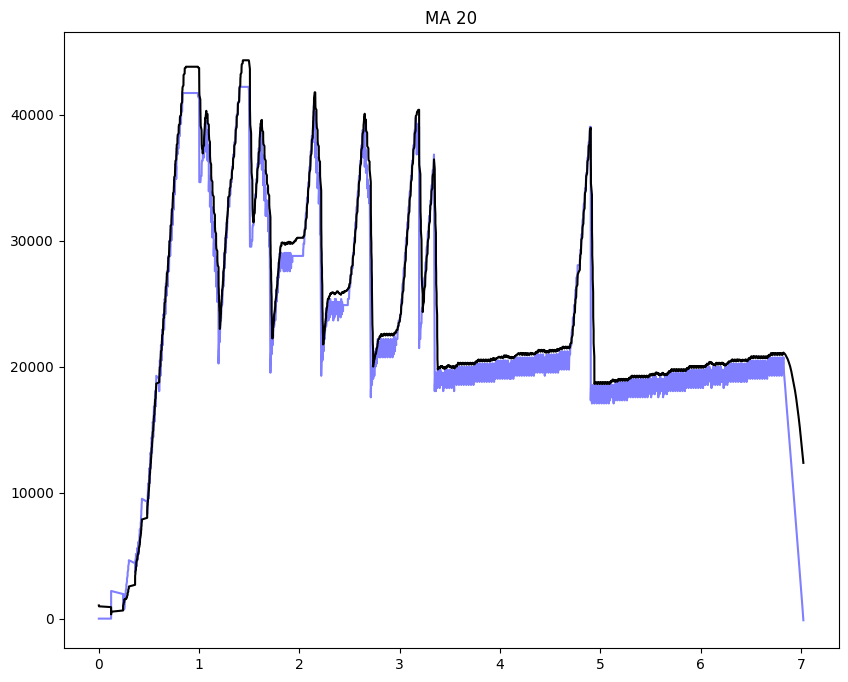

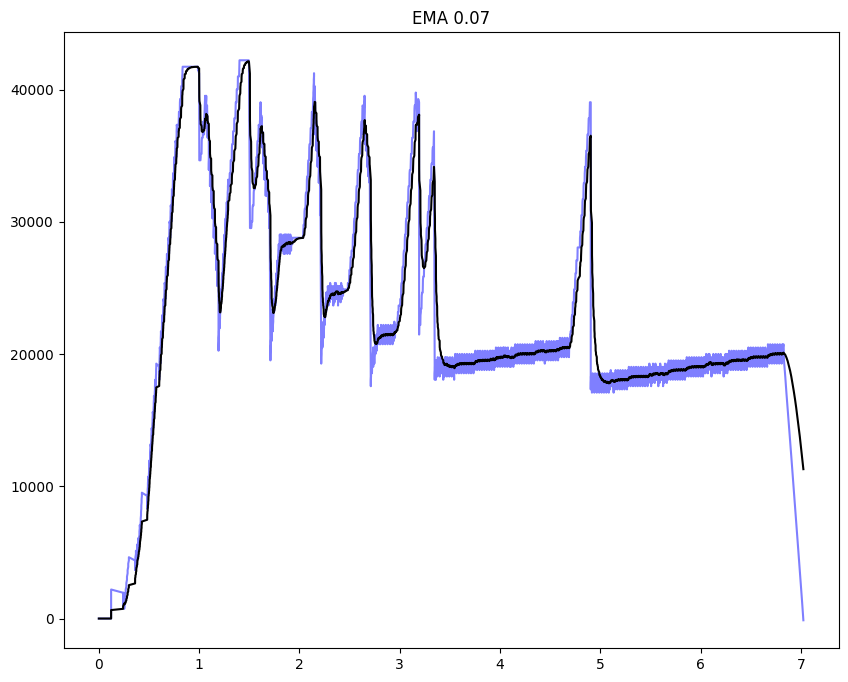

vegas
Reading ./Nebby/measurements/vegas-tcp.csv...
total bytes processed: 906.879 KBytes for vegas (unlimited)


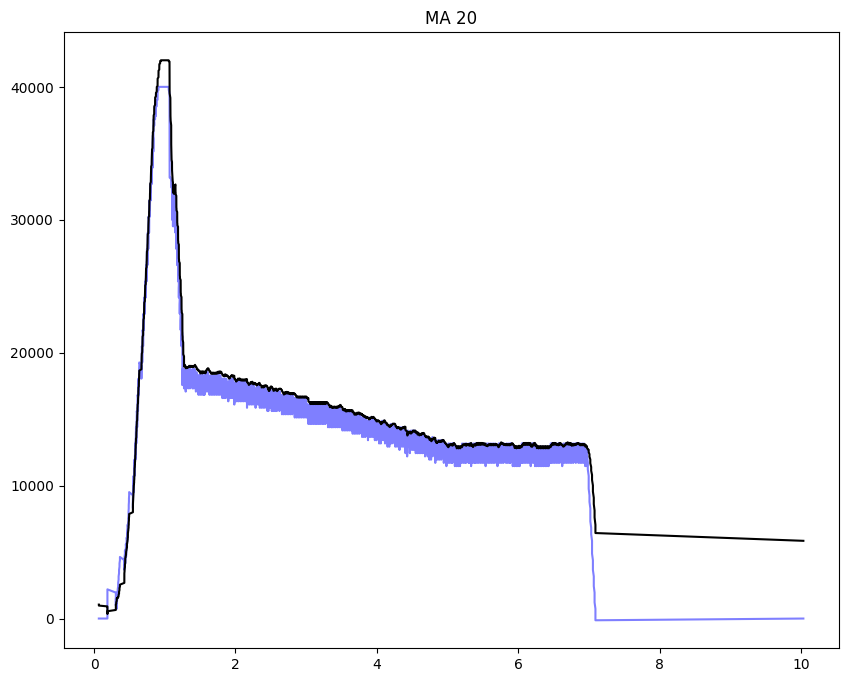

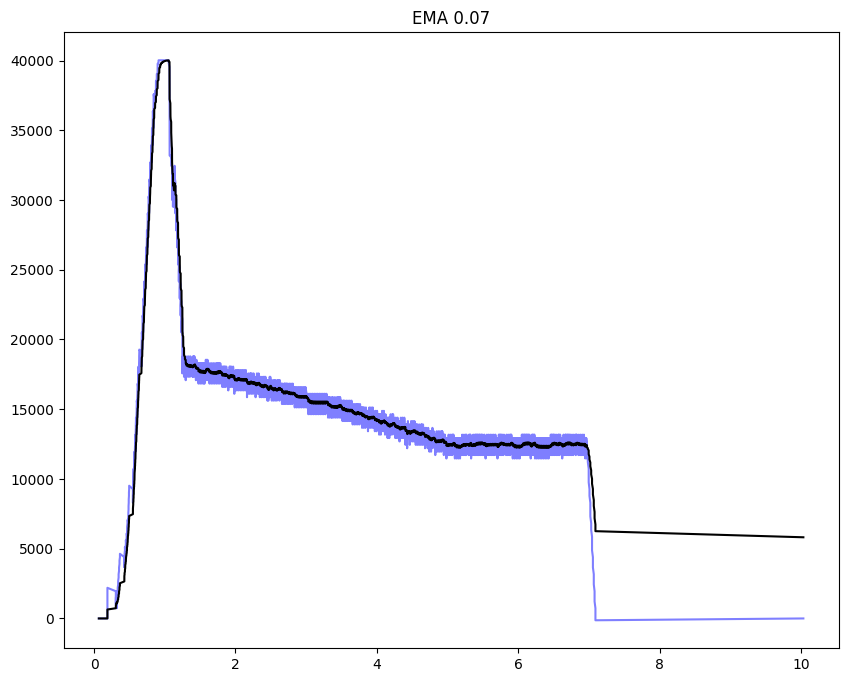

westwood
Reading ./Nebby/measurements/westwood-tcp.csv...
total bytes processed: 909.055 KBytes for westwood (unlimited)


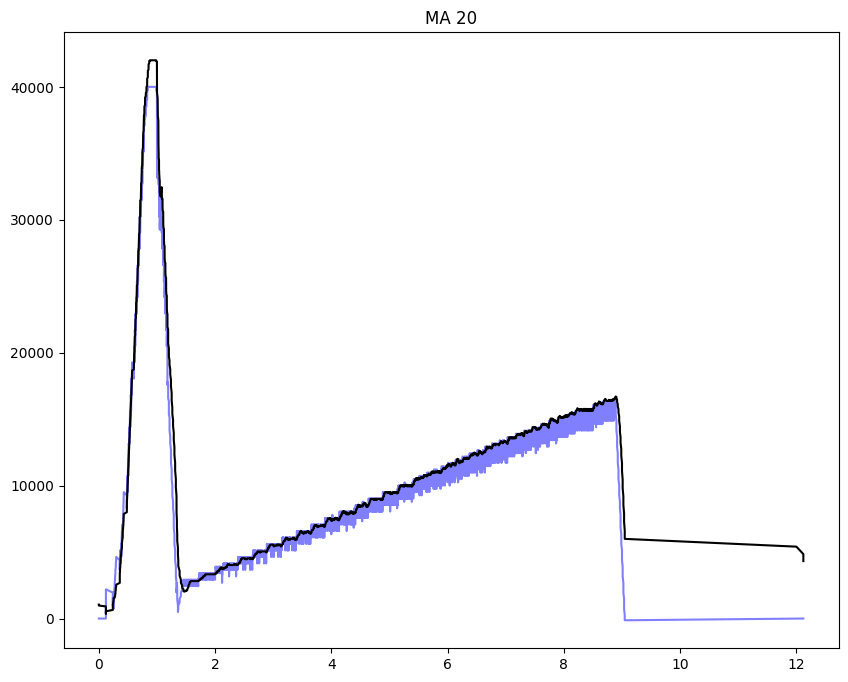

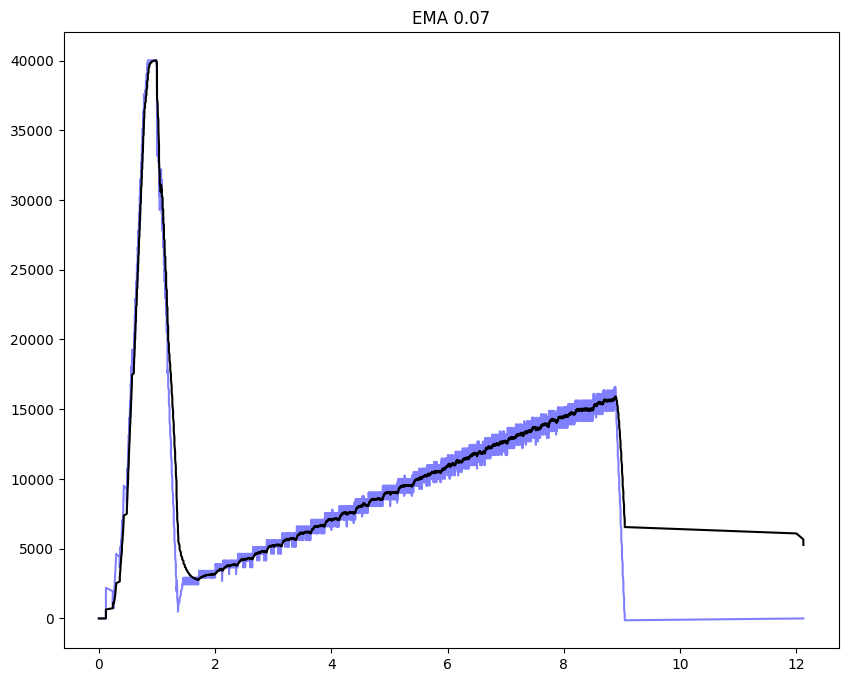

yeah
Reading ./Nebby/measurements/yeah-tcp.csv...
total bytes processed: 942.047 KBytes for yeah (unlimited)


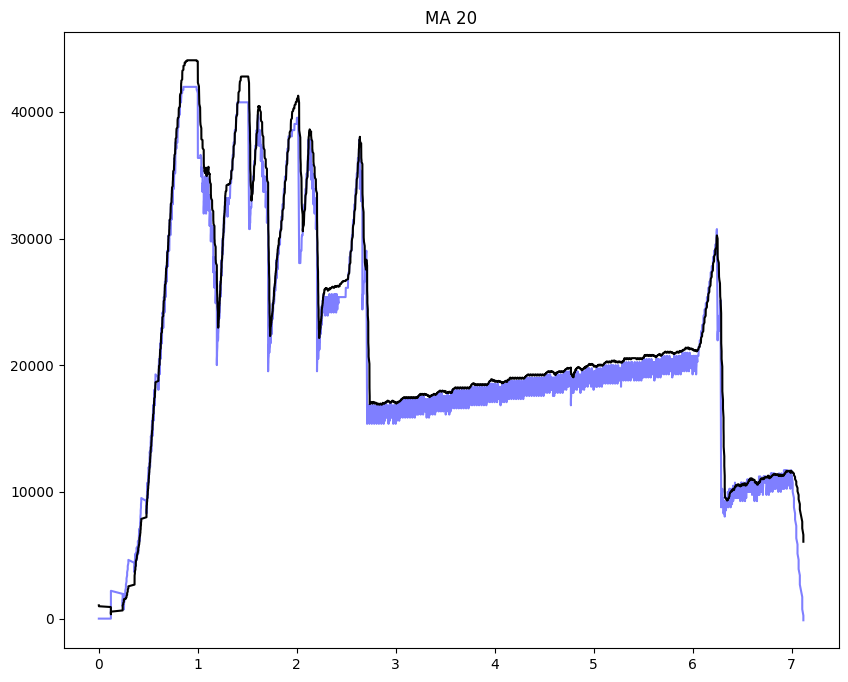

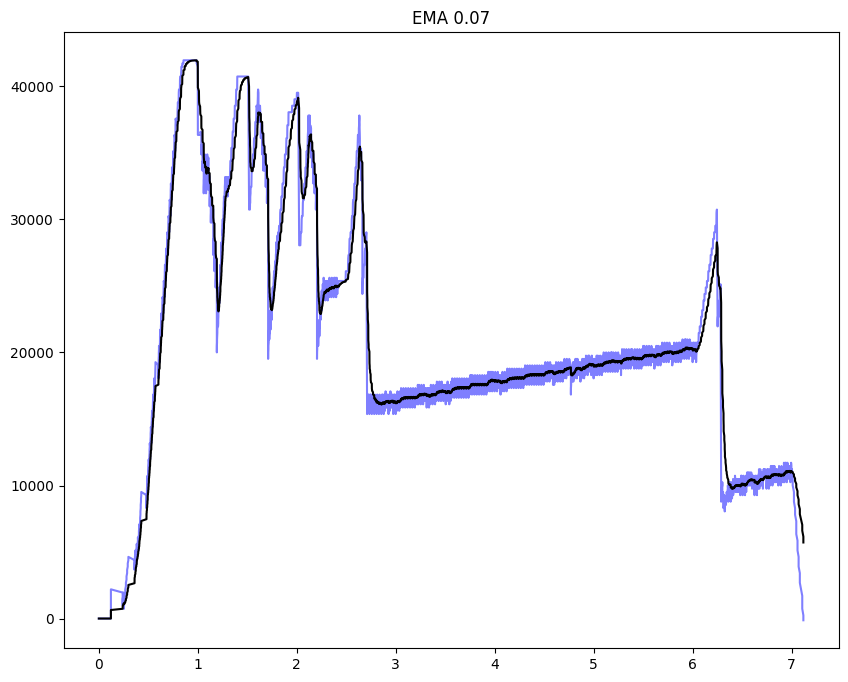

In [123]:
plot_ma(ccs,0, 20, 0.07)

# RTT threshold

In [7]:
from scipy.fft import rfft, rfftfreq
from scipy.fft import irfft
import numpy as np
import statistics


In [5]:
def get_window(f,p):
    algo_cc = f
    flows = process_flows(algo_cc, "./Nebby/measurements/")
    data = []
    time = []
    for port in flows.keys():
        if flows[port]["last_ack"] == 0 :
            continue
        else :
            data = flows[port]['windows']
            time = flows[port]['times']
            if p == "p":
                for i in range(len(flows[port]['windows'])):
                    print("{0:10}{1:10}".format(flows[port]['times'][i], flows[port]['windows'][i]))
        return data, time

In [537]:
curr_files = get_files("","35","500")
print(curr_files)

['cubic-35-500', 'reno-35-500', 'bbr-35-500']


In [6]:
def get_fft(data):
    n = len(data)
    data_step = 0.001
    yf = rfft(data)
    xf = rfftfreq(n,data_step)
    return yf,xf


In [167]:

def plot_rtt(files):
    for file in files :
        print(file)
        rtt = 2*float(file.split("-")[1])/1000
        data, time = get_window(file, "n")

#         print(len(data), " ", len(time))

        yf, xf = get_fft(data)
        abs_yf = np.abs(yf)
#         print(len(abs_yf), len(xf))
        sort_abs_yf = sorted(abs_yf)
        plt.title("FFT Decomposition")
#         plt.plot(xf, sort_abs_yf, color='b', alpha=0.5, lw=1)
#         plt.scatter(xf, sort_abs_yf, color='r', s=2)
#         plt.show()

        thresh  = (1/rtt)
        print("RTT", rtt, "Freq ", thresh)
#         print(xf)
        thresh_ind = 0
        for i in range(len(xf)) :
            freq = xf[i]
            if(freq > thresh):
                thresh_ind = i
                break
        print("Index ", thresh_ind)
#         print(xf[0:thresh_ind])
#         plt.title("Cleaned Frequencies")
#         plt.plot(xf[0:thresh_ind],np.abs(yf[0:thresh_ind]))
#         plt.show()

        yf_clean = yf
        yf_clean[thresh_ind+1:] = 0
        new_f_clean = irfft(yf_clean)
#         plt.title("Frequencies smaller than " + str(thresh))
#         plt.plot(time, data, color="b", alpha=0.5, label='original signal')
        start_len = len(time) - len(new_f_clean)
        plt.plot(time[start_len:], new_f_clean, 'k', label='FFT smoothing}', linewidth=2)
#         plt.legend()
#         plt.show()

cubic-35-500
Reading ./Nebby/measurements/cubic-35-500-tcp.csv...
total bytes processed: 877.307 KBytes for cubic-35-500 (unlimited)
3957   3957
1979 1979


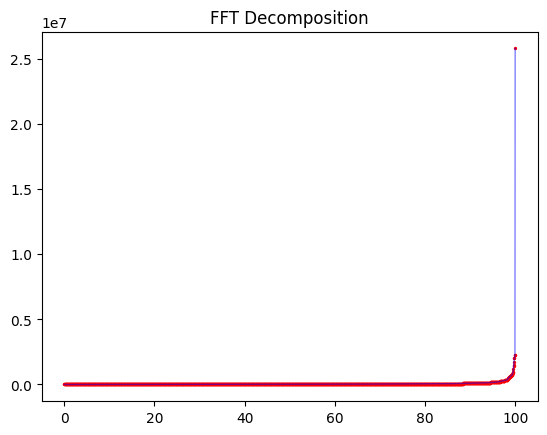

RTT 0.07 Freq  14.285714285714285
[0.00000000e+00 5.05433409e-02 1.01086682e-01 ... 9.98736416e+01
 9.99241850e+01 9.99747283e+01]
Index  283
[ 0.          0.05054334  0.10108668  0.15163002  0.20217336  0.2527167
  0.30326005  0.35380339  0.40434673  0.45489007  0.50543341  0.55597675
  0.60652009  0.65706343  0.70760677  0.75815011  0.80869345  0.8592368
  0.90978014  0.96032348  1.01086682  1.06141016  1.1119535   1.16249684
  1.21304018  1.26358352  1.31412686  1.3646702   1.41521355  1.46575689
  1.51630023  1.56684357  1.61738691  1.66793025  1.71847359  1.76901693
  1.81956027  1.87010361  1.92064695  1.9711903   2.02173364  2.07227698
  2.12282032  2.17336366  2.223907    2.27445034  2.32499368  2.37553702
  2.42608036  2.4766237   2.52716705  2.57771039  2.62825373  2.67879707
  2.72934041  2.77988375  2.83042709  2.88097043  2.93151377  2.98205711
  3.03260045  3.0831438   3.13368714  3.18423048  3.23477382  3.28531716
  3.3358605   3.38640384  3.43694718  3.48749052  3.53803

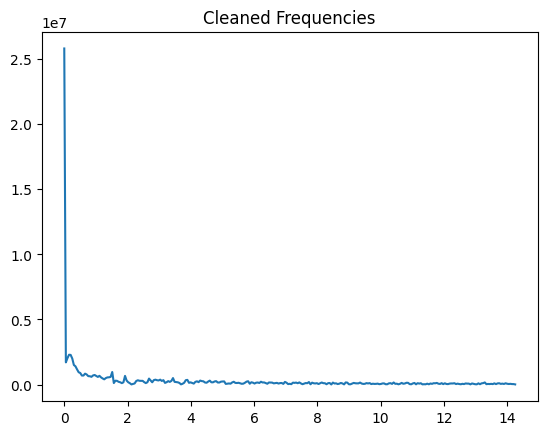

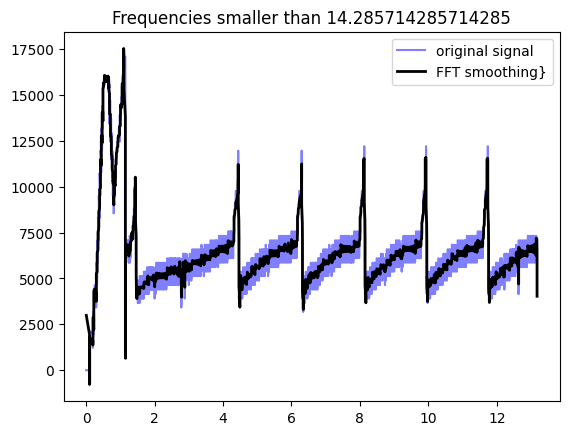

reno-35-500
Reading ./Nebby/measurements/reno-35-500-tcp.csv...
total bytes processed: 891.554 KBytes for reno-35-500 (unlimited)
3981   3981
1991 1991


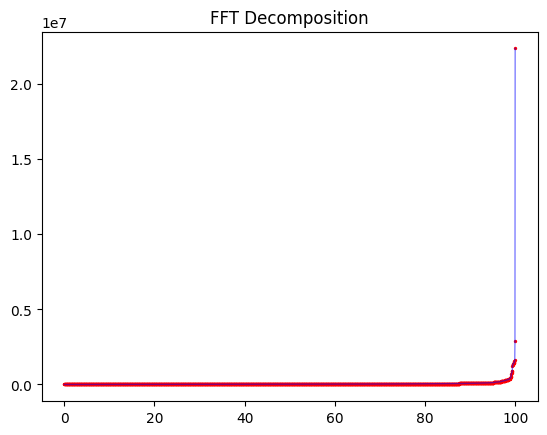

RTT 0.07 Freq  14.285714285714285
[0.00000000e+00 5.02386335e-02 1.00477267e-01 ... 9.98744034e+01
 9.99246420e+01 9.99748807e+01]
Index  285
[ 0.          0.05023863  0.10047727  0.1507159   0.20095453  0.25119317
  0.3014318   0.35167043  0.40190907  0.4521477   0.50238634  0.55262497
  0.6028636   0.65310224  0.70334087  0.7535795   0.80381814  0.85405677
  0.9042954   0.95453404  1.00477267  1.0550113   1.10524994  1.15548857
  1.2057272   1.25596584  1.30620447  1.3564431   1.40668174  1.45692037
  1.50715901  1.55739764  1.60763627  1.65787491  1.70811354  1.75835217
  1.80859081  1.85882944  1.90906807  1.95930671  2.00954534  2.05978397
  2.11002261  2.16026124  2.21049987  2.26073851  2.31097714  2.36121577
  2.41145441  2.46169304  2.51193168  2.56217031  2.61240894  2.66264758
  2.71288621  2.76312484  2.81336348  2.86360211  2.91384074  2.96407938
  3.01431801  3.06455664  3.11479528  3.16503391  3.21527254  3.26551118
  3.31574981  3.36598845  3.41622708  3.46646571  3.516

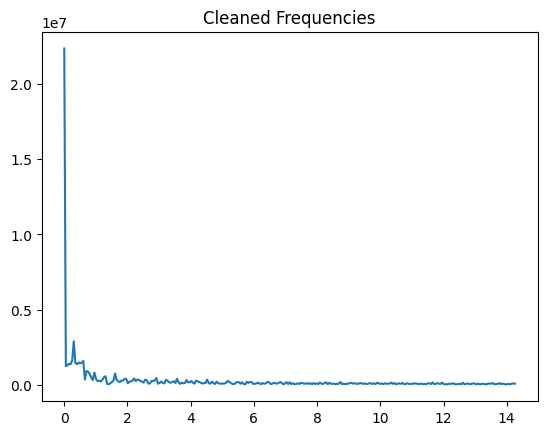

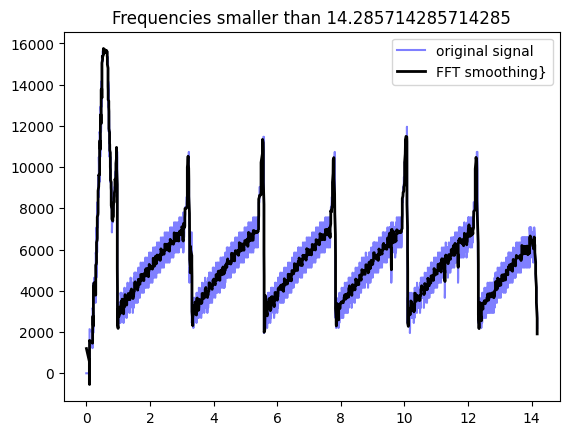

bbr-35-500
Reading ./Nebby/measurements/bbr-35-500-tcp.csv...
total bytes processed: 885.615 KBytes for bbr-35-500 (unlimited)
4086   4086
2044 2044


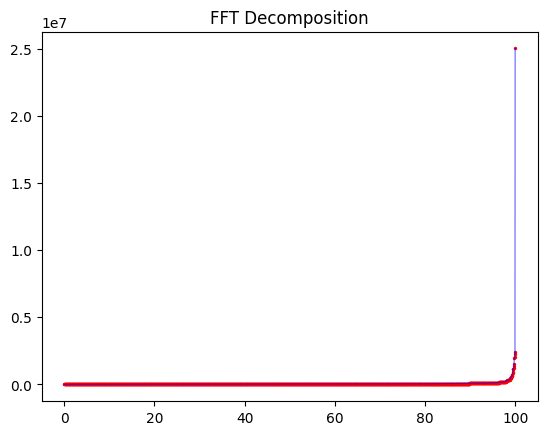

RTT 0.07 Freq  14.285714285714285
[0.00000000e+00 4.89476260e-02 9.78952521e-02 ... 9.99021047e+01
 9.99510524e+01 1.00000000e+02]
Index  292
[ 0.          0.04894763  0.09789525  0.14684288  0.1957905   0.24473813
  0.29368576  0.34263338  0.39158101  0.44052863  0.48947626  0.53842389
  0.58737151  0.63631914  0.68526676  0.73421439  0.78316202  0.83210964
  0.88105727  0.93000489  0.97895252  1.02790015  1.07684777  1.1257954
  1.17474302  1.22369065  1.27263828  1.3215859   1.37053353  1.41948116
  1.46842878  1.51737641  1.56632403  1.61527166  1.66421929  1.71316691
  1.76211454  1.81106216  1.86000979  1.90895742  1.95790504  2.00685267
  2.05580029  2.10474792  2.15369555  2.20264317  2.2515908   2.30053842
  2.34948605  2.39843368  2.4473813   2.49632893  2.54527655  2.59422418
  2.64317181  2.69211943  2.74106706  2.79001468  2.83896231  2.88790994
  2.93685756  2.98580519  3.03475281  3.08370044  3.13264807  3.18159569
  3.23054332  3.27949094  3.32843857  3.3773862   3.4263

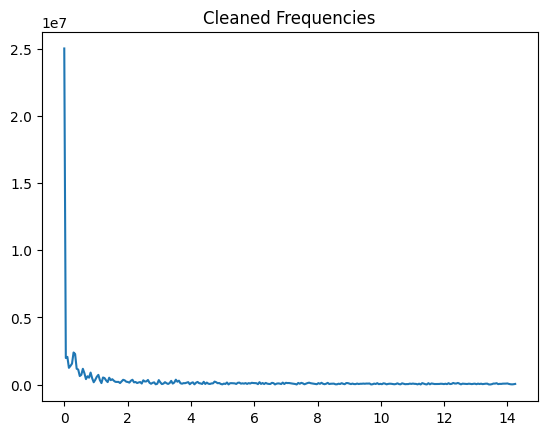

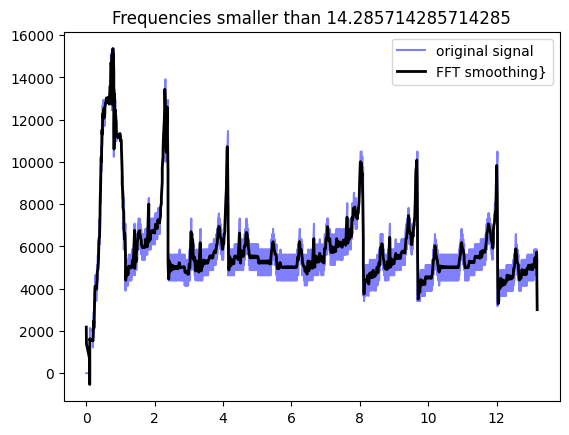

In [548]:
plot_rtt(curr_files)

In [36]:
import csv
import matplotlib.pyplot as plt
import sys
import math

SHOW=True
MULTI_GRAPH=False
SMOOTHENING=False
ONLY_STATS=False
s_factor=0.9

'''
TODO: 
o Add functionality where you only plot flows that send more than x bytes of data
o Sort stats and graphs by flow size
o Organize plots by flow size (larger flows have larger graphs)
o Custom smoothening function
'''

fields=["time", "frame_time_rel", "tcp_time_rel", "frame_num", "frame_len", "ip_src", "src_port", "ip_dest", "dest_port", "tcp_len", "seq", "ack"]

class pkt:
    contents=[]
    def __init__(self, fields) -> None:
        self.contents=[]
        for f in fields:
            self.contents.append(f)

    def get(self, field):
        return self.contents[fields.index(field)]
        

def process_flows(cc, dir):
    with open(dir+cc+"-tcp.csv") as csv_file:
        print("Reading "+dir+cc+"-tcp.csv...")
        csv_reader = csv.reader(csv_file, delimiter=',')
        line_count = 0
        total_bytes=0
        '''
        Flow tracking:
        o Identify all packets that are either sourced from or headed to 100.64.0.2
        o Group different flows by client's port
        '''
        flows={}
        data_sent=0
        port_set = set()
        for row in csv_reader:
            packet=pkt(row)
            validPkt=False
            if line_count==0:
                # reject the header
                line_count+=1
                continue
            if data_sent == 0 : 
                if "100.64.0." in packet.get("ip_src"):
                    num = int(packet.get("ip_src")[-1])
                    if num%2==0:
                        data_sent=1
                        host_port=packet.get("ip_src")
                if "100.64.0." in packet.get("ip_dest"):
                    num = int(packet.get("ip_dest")[-1])
                    if num%2==0:
                        data_sent=1
                        host_port=packet.get("ip_dest")
                if data_sent == 0:
                    continue
                    
            if packet.get("ip_src")==host_port and packet.get("frame_time_rel")!='' and packet.get("ack")!='': 
                # we care about this ACK packet
                validPkt=True
                port=packet.get("src_port")
                if port not in flows:
                    flows[port]={"serverip":packet.get("ip_dest"), "serverport":packet.get("dest_port"), "act_times":[],"times":[], "windows":[], "cwnd":[], "bif":0, "last_ack":0, "last_seq":0, "pif":0}
                flows[port]["act_times"].append(packet.get("time"))
                flows[port]["times"].append(float(packet.get("frame_time_rel")))
                flows[port]["bif"]-=max(0,(int(packet.get("ack"))-int(flows[port]["last_ack"])))
                flows[port]["last_ack"]=max(int(flows[port]["last_ack"]),int(packet.get("ack")))
                #flows[port]["windows"].append(int(flows[port]["bif"]))
                flows[port]["pif"]-=1
                flows[port]["cwnd"].append(flows[port]["pif"])
            elif packet.get("ip_dest")==host_port and packet.get("frame_time_rel")!='' and packet.get("seq")!='':
                #we care about this Data packet
                validPkt=True
                port=packet.get("dest_port")
                if port not in flows:
                    flows[port]={"serverip":packet.get("ip_src"), "serverport":packet.get("src_port"),"act_times":[], "times":[], "windows":[], "cwnd":[], "bif":0, "last_ack":0, "last_seq":0, "pif":0}
                flows[port]["times"].append(float(packet.get("frame_time_rel")))
                flows[port]["act_times"].append(packet.get("time"))
                flows[port]["bif"]+=max(0,(int(packet.get("seq"))-int(flows[port]["last_seq"])))
                flows[port]["last_seq"]=max(flows[port]["last_seq"],int(packet.get("seq")))
                flows[port]["pif"]+=1
                flows[port]["cwnd"].append(flows[port]["pif"])
            if SMOOTHENING and validPkt and len(flows[port]["windows"])>2:
                flows[port]["windows"].append(int((s_factor*flows[port]["windows"][-1])+((1-s_factor)*flows[port]["bif"])))
            elif validPkt:
                flows[port]["windows"].append(int(flows[port]["bif"]))
            line_count+=1
            total_bytes+=int(packet.get("frame_len"))
            #print(line_count, total_bytes)
            
        print("total bytes processed:", total_bytes/1000, "KBytes for", cc, "(unlimited)")
    return flows

def custom_smooth_function():
    pass

def get_flow_stats(flows):
    num=len(flows.keys())
    print("FLOW STATISTICS: \nNumber of flows: ", num)
    print("------------------------------------------------------------------------------")
    print('%6s'%"port", '%15s'%"SrcIP", '%8s'%"SrcPort",  '%8s'%"duration",  '%8s'%"start",  '%8s'%"end", '%8s'%"Sent (B)", '%8s'%"Recv (B)",)
    for k in flows.keys():
        print('%6s'%k, '%15s'%flows[k]["serverip"], '%8s'%flows[k]["serverport"], '%8s'%str('%.2f'%(flows[k]["times"][-1]-flows[k]["times"][0])), '%8s'%str('%.2f'%flows[k]["times"][0]), '%8s'%str('%.2f'%flows[k]["times"][-1]), '%8s'%flows[k]["last_seq"], '%8s'%flows[k]["last_ack"])
        #print("    * Flow "+str(k)+": ", flows[k]["last_ack"], " ", flows[k]["last_seq"], " bytes transfered.")
    return num

def run(files):
    flows = {}
    for f in files:
        algo_cc=f
        #Get the data for all the flows
        print("==============================================================================")
        print("opening trace ../measurements/"+algo_cc+".csv...")
        flows = process_flows(algo_cc, "./Nebby/measurements/")
        #decide on final graph layout
        num = get_flow_stats(flows)

        if ONLY_STATS:
            sys.exit()

        if num==1:
            MULTI_GRAPH=False
        #grid size
        if MULTI_GRAPH:
            size=(0,0)
            grids={1:(2,2), 2:(2,2), 4:(2,2), 6:(2,3), 9:(3,3), 12:(3,4), 15:(3,5), 16:(4,4), 20:(5,4), 24:(6,4), 30:(6,5), 36:(6,6), 40:(8,5), 42:(8,7), 49:(7,7)}
            g=num
            while g<=49 and g not in grids:
                g+=1
            if g in grids.keys():
                size=grids[g]
            else:
                size=grids[49]  
            fig, axs = plt.subplots(size[0], size[1])
            for i in range(size[0]):
                for j in range(size[1]):
                    #axs[i][j].legend(loc="lower right")
                    if i==size[0]-1:
                        axs[i][j].set_xlabel("Time (s)")
                    if j==0:
                        axs[i][j].set_ylabel("Bytes in flight")
        else:
            plt.xlabel("Time (s)")
            plt.ylabel("Bytes in flight")
        counter=0
        for port in flows.keys():
            if MULTI_GRAPH:  
                axs[counter%size[0]][(counter//size[0])%size[1]].scatter(flows[port]["times"], flows[port]["windows"], color="#858585")
                axs[counter%size[0]][(counter//size[0])%size[1]].plot(flows[port]["times"], flows[port]["windows"], label=str(port), linestyle="solid")
            else:
                plt.plot(flows[port]["times"], flows[port]["windows"], label=str(port), linestyle="solid")
                plt.scatter(flows[port]["times"], flows[port]["windows"], color="#858585")
            counter+=1
        if MULTI_GRAPH:
            counter=0
            for port in flows.keys():
                axs[counter%size[0]][(counter//size[0])%size[1]].legend()
                counter+=1
        else:
            plt.legend()
        if MULTI_GRAPH:
            fig.set_size_inches(16, 12)
        if SHOW:
            plt.show()
        else:
            plt.savefig("../logs/results/"+algo_cc+".png", dpi=600, bbox_inches='tight', pad_inches=0)
    return flows


opening trace ../measurements/test15.csv...
Reading ./Nebby/measurements/test15-tcp.csv...
total bytes processed: 969.966 KBytes for test15 (unlimited)
FLOW STATISTICS: 
Number of flows:  1
------------------------------------------------------------------------------
  port           SrcIP  SrcPort duration    start      end Sent (B) Recv (B)
 50420  172.26.191.172     8082    87.75     0.00    87.75   670214   670214


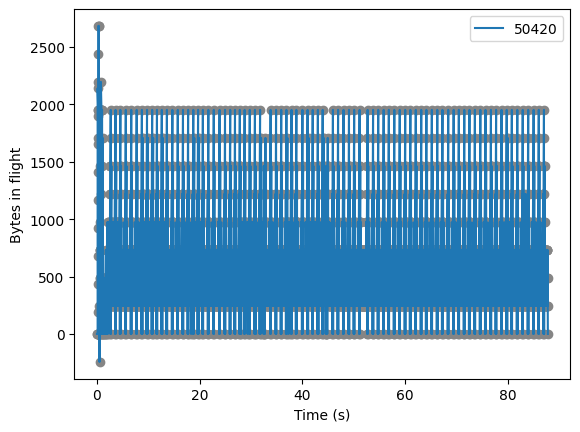

In [2]:
flows = run(["test15"])

In [3]:
def smoothen(data, func, para=10):
    times = data['times']
    windows = data['windows']
    new_times = []
    new_windows =[]
    if func == "cma" :
        for t in range(len(times)):
            # Keeping all the data points
            win = int(para/2)
            if t < win :
                val = sum(windows[0:t]) + sum(windows[t:t+win])
            else :
                val = sum(windows[t-win:t]) + sum(windows[t:t+win])
            val = val/para
            new_times.append(times[t])
            new_windows.append(val)

    return new_times, new_windows
                    

In [95]:
def plot_nice(files):
    for f in files:
        algo_cc = f
        flows = process_flows(algo_cc, "./Nebby/measurements/")
        for port in flows.keys():
            smooth = ""
            times, windows = smoothen(flows[port], "cma", 20) 
            fig, (ax1,ax2) = plt.subplots(2,1, figsize=(10,10))
            title = f + " : " + str(port) + smooth
            ax1.plot(flows[port]['times'], flows[port]['windows'], color='b',lw='0.5')
            ax1.title.set_text(title)
            ax2.plot(times, windows,color='r',lw='0.5')
            ax2.title.set_text(title+"_smooth")
#             plt.savefig(title + ".png")
            plt.show()
lags=[15,25,35,45]
files = []
for l in lags :
    name = "test"+str(l)
    files.append(name)


# Working with graphs

In [3]:
post_delays = ["15","25","35","45"]
link_speeds = ["100", "200", "500", "1000"]
ccs = ["cubic", "reno", "bbr"]

In [4]:
files = []
for cc in ccs :
    for d in post_delays:
        for link_speed in link_speeds :
            files.append(cc+"-"+d+"-"+link_speed)

In [131]:
def get_files(cc="",d="",s=""):
    new_f = []
    cc_list = [cc]
    d_list = [d]
    s_list = [s]
    if cc == "" :
        cc_list = ccs
    if d == "" :
        d_list = post_delays
    if s == "" :
        s_list = link_speeds
    for de in d_list :
        for sp in s_list:
            for co in cc_list:
                new_f.append(co+"-"+de+"-"+sp)
    return new_f

In [64]:
import pprint

In [2]:
def get_window(f,p):
    algo_cc = f
    flows = process_flows(algo_cc, "./Nebby/measurements/")
    data = []
    time = []
    for port in flows.keys():
        if flows[port]["last_ack"] == 0 :
            continue
        else :
            data = flows[port]['windows']
            time = flows[port]['times']
            if p == "p":
                for i in range(len(flows[port]['windows'])):
                    print("{0:10}{1:10}".format(flows[port]['times'][i], flows[port]['windows'][i]))
        time_index = len(time)-1
        for index in range(len(flows[port]['times'])-1):
            if flows[port]['times'][index+1] - flows[port]['times'][index] > 1 :
                time_index = index
        time_last = flows[port]['times'][time_index]
        data = data[:time_index+1]
        time = time[:time_index+1]
        return data, time

In [3]:
def plot_g(files,z=1):
    for f in files:
        algo_cc = f
        flows = process_flows(algo_cc, "./Nebby/measurements/")
        for port in flows.keys():
            if flows[port]["last_ack"] == 0 :
                continue
            smooth = ""
#             times, windows = smoothen(flows[port], "cma", 20) 
#             fig, (ax1,ax2) = plt.subplots(2,1, figsize=(10,10))
#             title = f + " : " + str(port) + smooth
#             ax1.plot(flows[port]['times'], flows[port]['windows'], color='b',lw='0.5')
#             ax1.title.set_text(title)
#             ax2.plot(times, windows,color='r',lw='0.5')
#             ax2.title.set_text(title+"_smooth")
            fig, ax, = plt.subplots(1,1, figsize=(20,10))
            ax.plot(flows[port]['times'][1:int(len(flows[port]['times'])/z)], flows[port]['windows'][1:int(len(flows[port]['times'])/z)], color='b',lw='0.5')
#             ax.scatter(flows[port]['times'], flows[port]['windows'], color='r', s=5)
            ax.title.set_text(f)
#             plt.savefig(title + ".png")
            plt.show()

In [96]:
curr_files = get_files("cubic","15","500")
get_window(curr_files)

Reading ./Nebby/measurements/cubic-15-500-tcp.csv...
total bytes processed: 878.287 KBytes for cubic-15-500 (unlimited)
       0.0         0
  0.005103         0
  0.072988        -1
  0.072997        -1
     0.073        -1
  0.073004        -1
  0.076758         0
  0.078585         0
  0.079703         0
  0.079714       189
  0.079717       433
   0.07972       677
  0.079723       921
  0.079726      1165
  0.079729      1409
  0.079731      1653
  0.079735      1897
  0.079738      2141
  0.146567      1952
  0.146578      1708
  0.146582      1464
  0.146586      1220
  0.151357      1464
  0.151379      1708
  0.151384      1952
  0.151388      2196
  0.151393      2440
  0.151397      2684
  0.151401      2928
  0.151405      3172
  0.170614      2928
  0.170623      2684
  0.175322      2928
  0.175343      3172
  0.175348      3416
  0.175351      3660
  0.219479      3660
   0.21949      3660
  0.219495      3660
  0.219499      3660
  0.219503      3660
   0.22422      366

Reading ./Nebby/measurements/cubic-15-100-tcp.csv...
total bytes processed: 1178.042 KBytes for cubic-15-100 (unlimited)


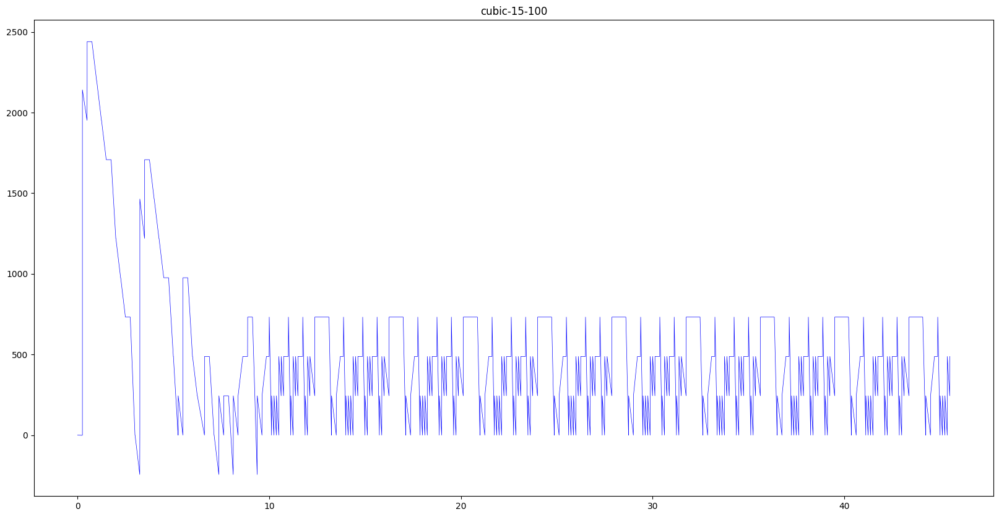

In [100]:
curr_files = get_files("cubic","15","100")
plot_g(curr_files,z=10)

Reading ./Nebby/measurements/bbr-15-1000-tcp.csv...
total bytes processed: 819.679 KBytes for bbr-15-1000 (unlimited)


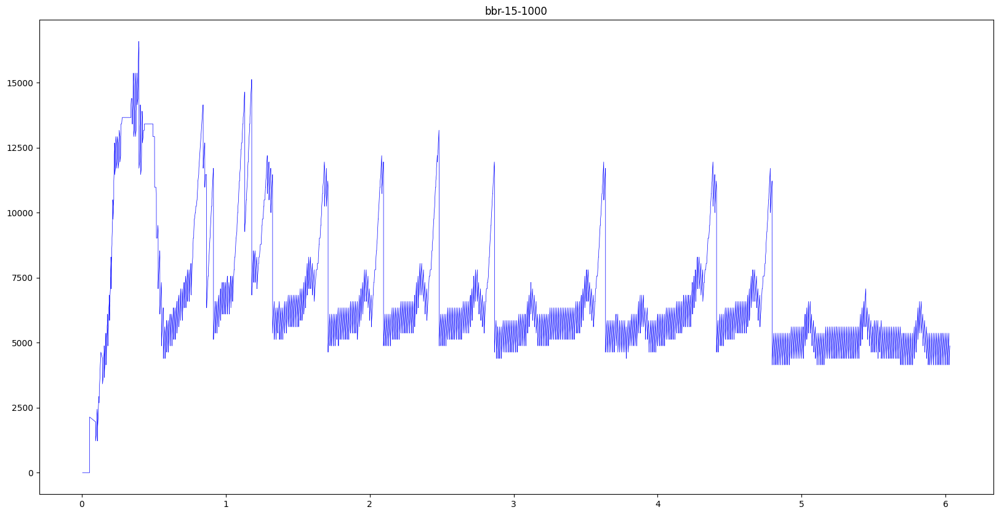

Reading ./Nebby/measurements/bbr-25-1000-tcp.csv...
total bytes processed: 961.34 KBytes for bbr-25-1000 (unlimited)


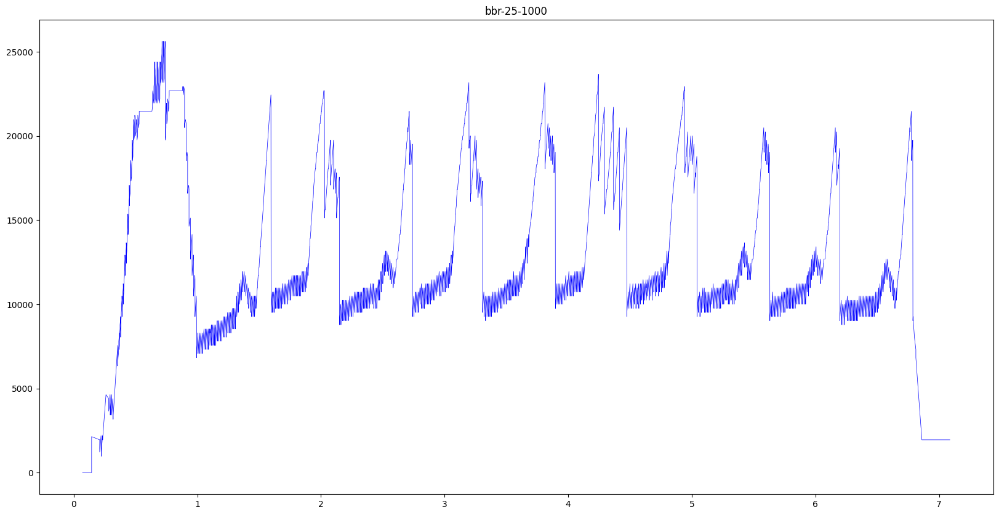

Reading ./Nebby/measurements/bbr-35-1000-tcp.csv...
total bytes processed: 953.154 KBytes for bbr-35-1000 (unlimited)


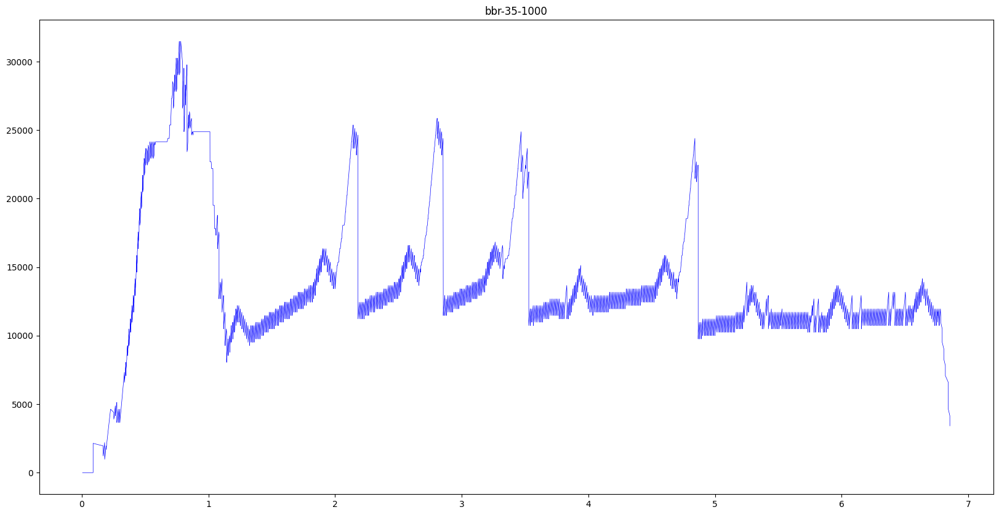

Reading ./Nebby/measurements/bbr-45-1000-tcp.csv...
total bytes processed: 963.234 KBytes for bbr-45-1000 (unlimited)


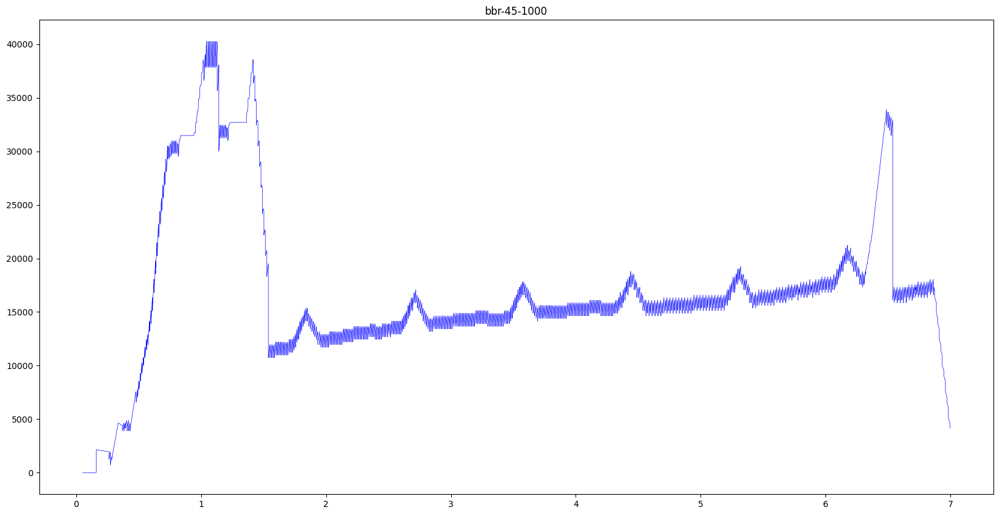

In [294]:
curr_files = get_files("bbr","","1000")
plot_g(curr_files)

### CC Same, PD diff, LS Same
##### 100 and 200 are pretty low, checking on 500 and 1000

In [128]:
link_speeds = ["500", "1000"]

Reading ./Nebby/measurements/reno-15-500-tcp.csv...
total bytes processed: 874.839 KBytes for reno-15-500 (unlimited)


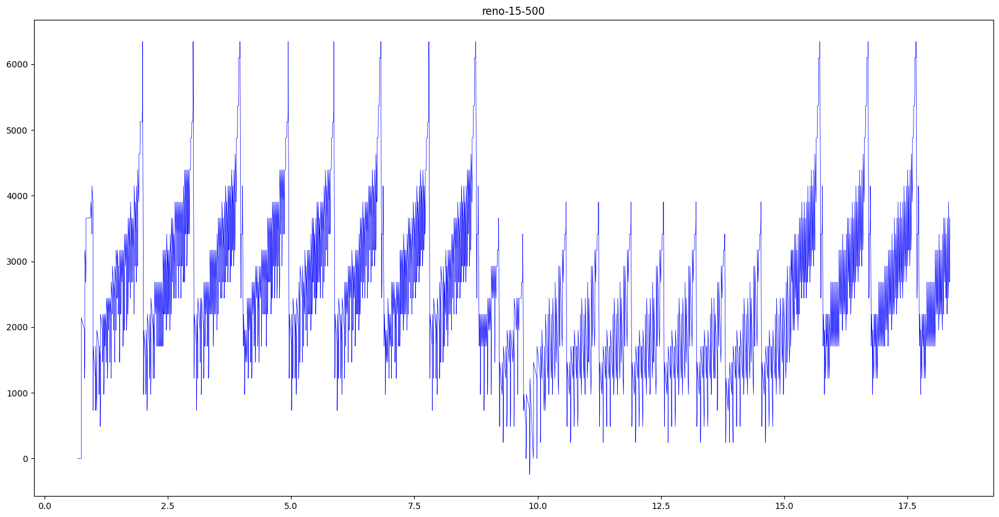

Reading ./Nebby/measurements/reno-25-500-tcp.csv...
total bytes processed: 867.655 KBytes for reno-25-500 (unlimited)


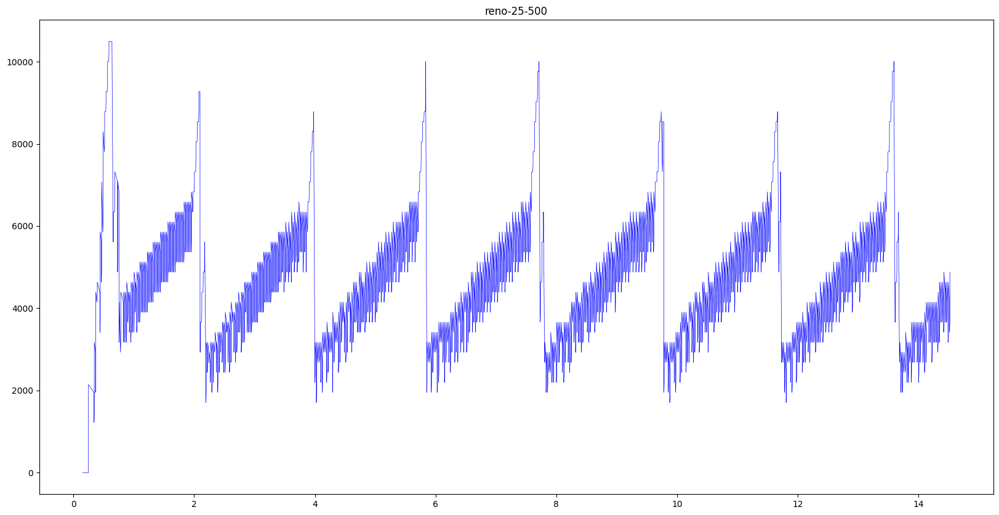

Reading ./Nebby/measurements/reno-35-500-tcp.csv...
total bytes processed: 891.554 KBytes for reno-35-500 (unlimited)


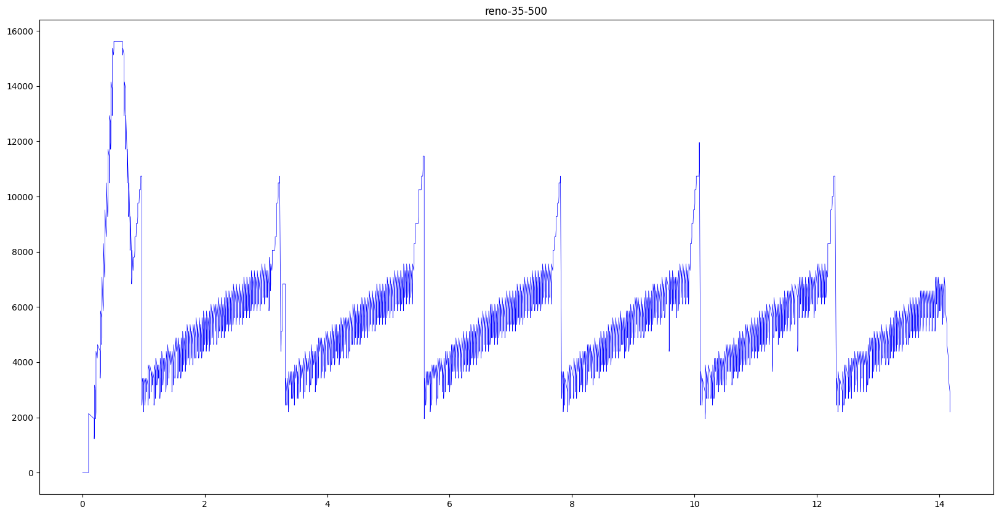

Reading ./Nebby/measurements/reno-45-500-tcp.csv...
total bytes processed: 858.967 KBytes for reno-45-500 (unlimited)


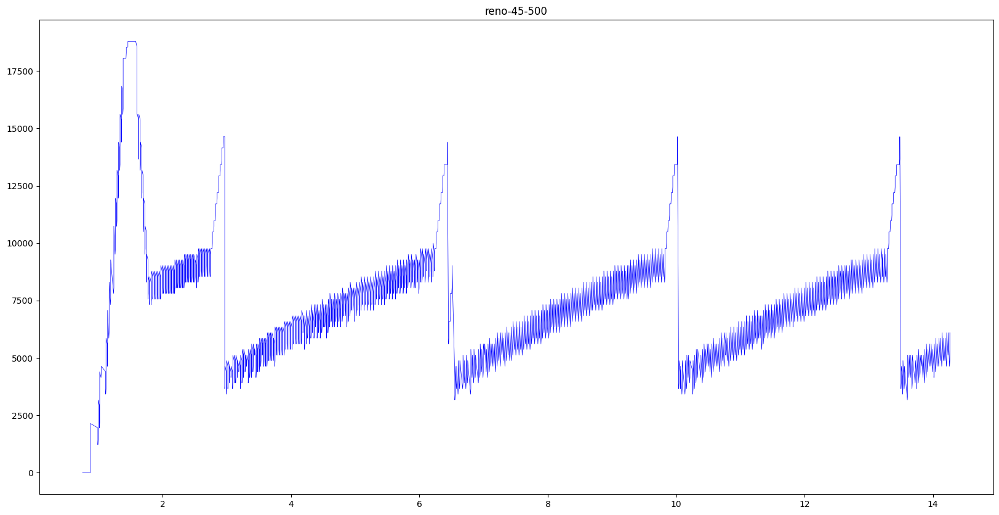

In [145]:
curr_files = get_files("reno","","500")
plot_g(curr_files)

Reading ./Nebby/measurements/cubic-15-500-tcp.csv...
total bytes processed: 878.287 KBytes for cubic-15-500 (unlimited)


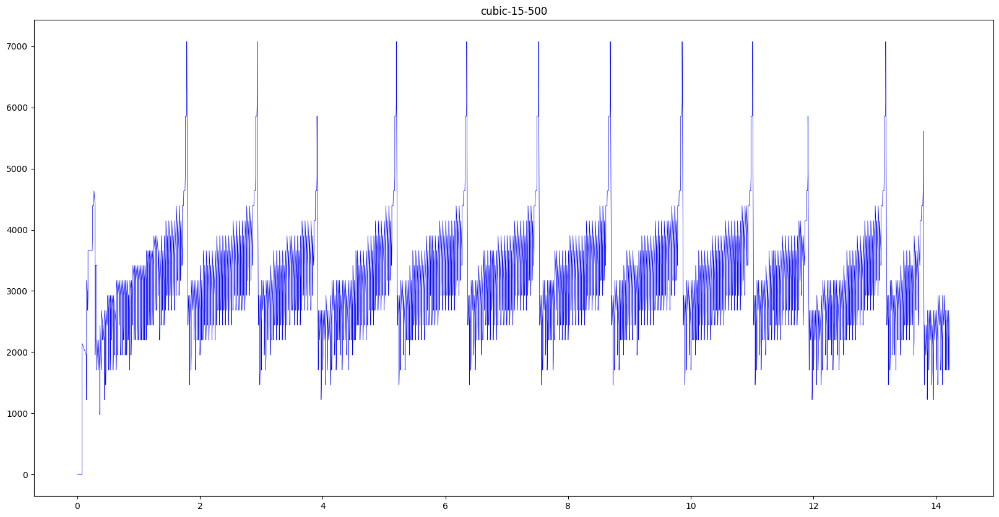

Reading ./Nebby/measurements/cubic-25-500-tcp.csv...
total bytes processed: 871.351 KBytes for cubic-25-500 (unlimited)


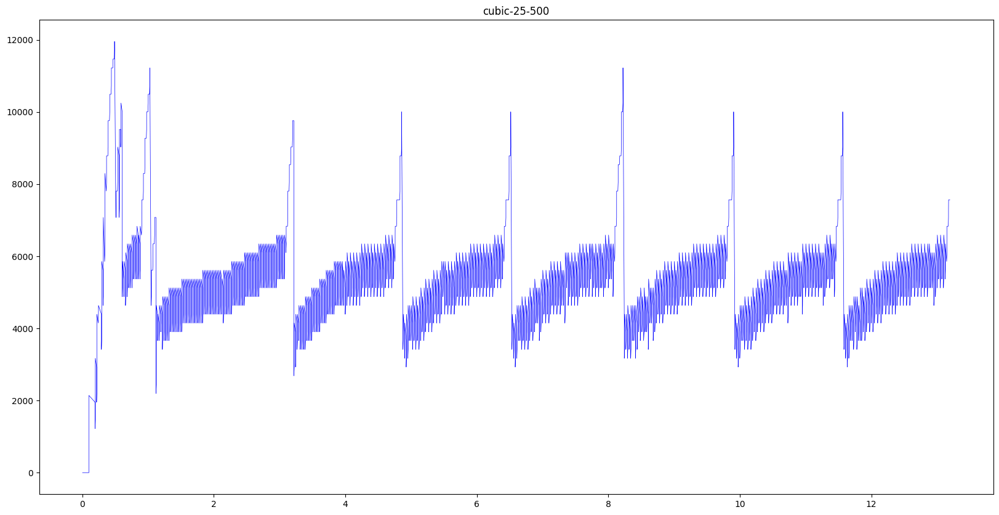

Reading ./Nebby/measurements/cubic-35-500-tcp.csv...
total bytes processed: 877.307 KBytes for cubic-35-500 (unlimited)


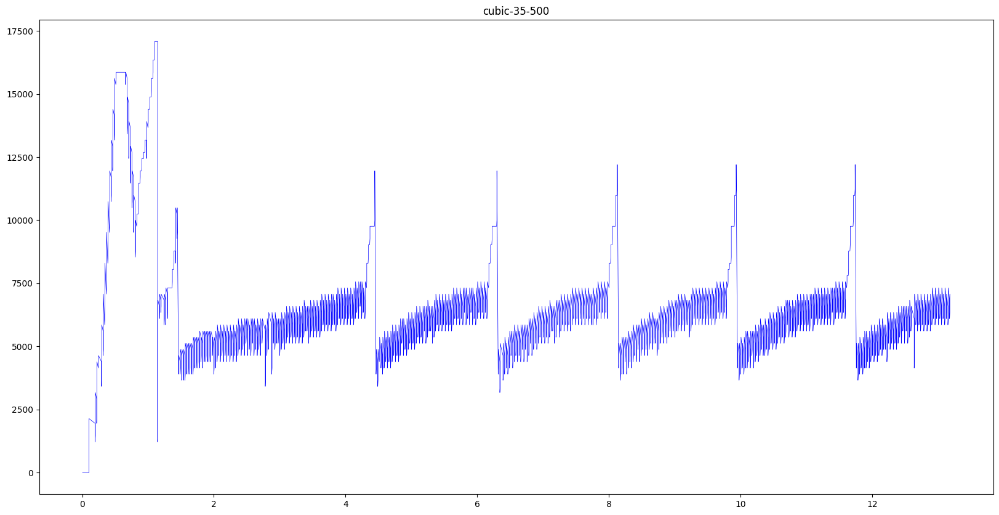

Reading ./Nebby/measurements/cubic-45-500-tcp.csv...
total bytes processed: 870.107 KBytes for cubic-45-500 (unlimited)


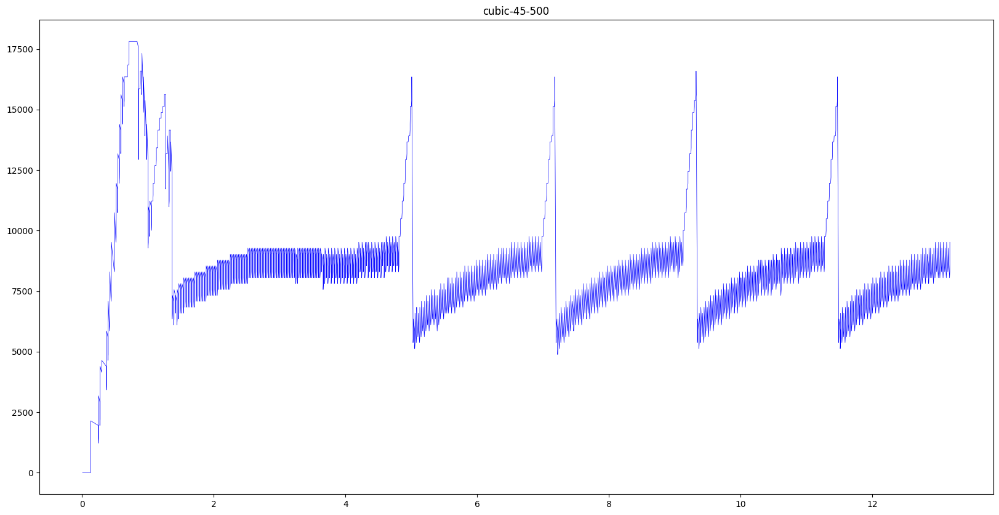

In [146]:
curr_files = get_files("cubic","","500")
plot_g(curr_files)

Reading ./Nebby/measurements/bbr-15-500-tcp.csv...
total bytes processed: 882.979 KBytes for bbr-15-500 (unlimited)


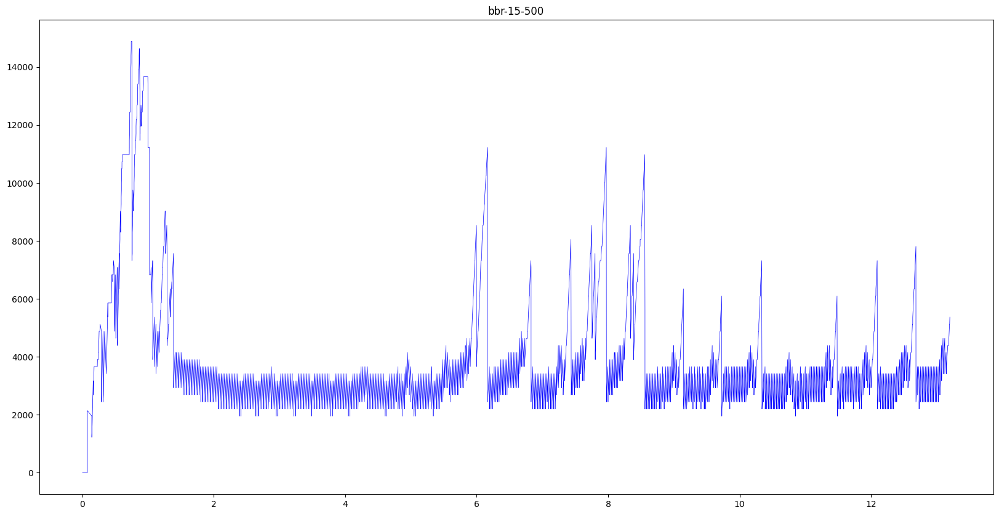

Reading ./Nebby/measurements/bbr-25-500-tcp.csv...
total bytes processed: 880.287 KBytes for bbr-25-500 (unlimited)


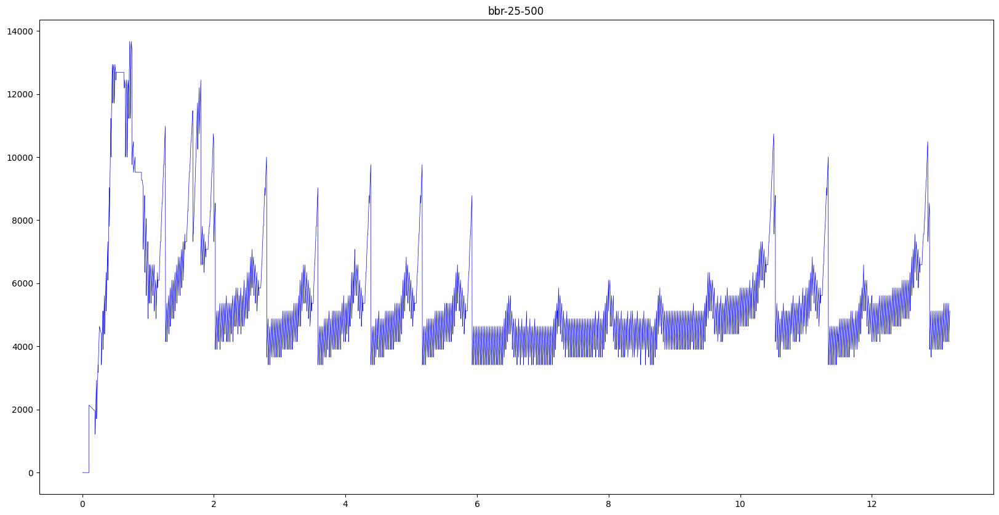

Reading ./Nebby/measurements/bbr-35-500-tcp.csv...
total bytes processed: 885.615 KBytes for bbr-35-500 (unlimited)


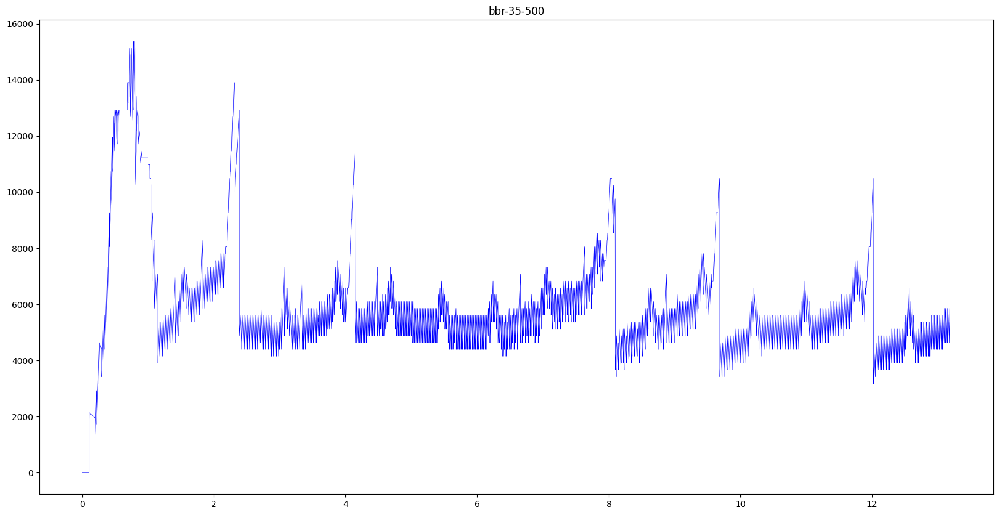

Reading ./Nebby/measurements/bbr-45-500-tcp.csv...
total bytes processed: 908.326 KBytes for bbr-45-500 (unlimited)


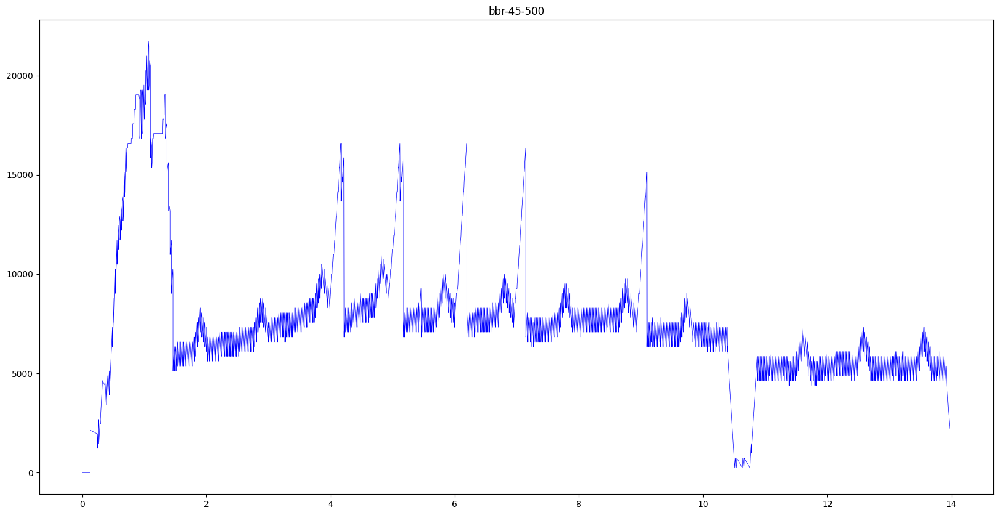

In [147]:
curr_files = get_files("bbr","","500")
plot_g(curr_files)

### CC Same, PD same, LS diff 

Reading ./Nebby/measurements/cubic-35-500-tcp.csv...
total bytes processed: 877.307 KBytes for cubic-35-500 (unlimited)


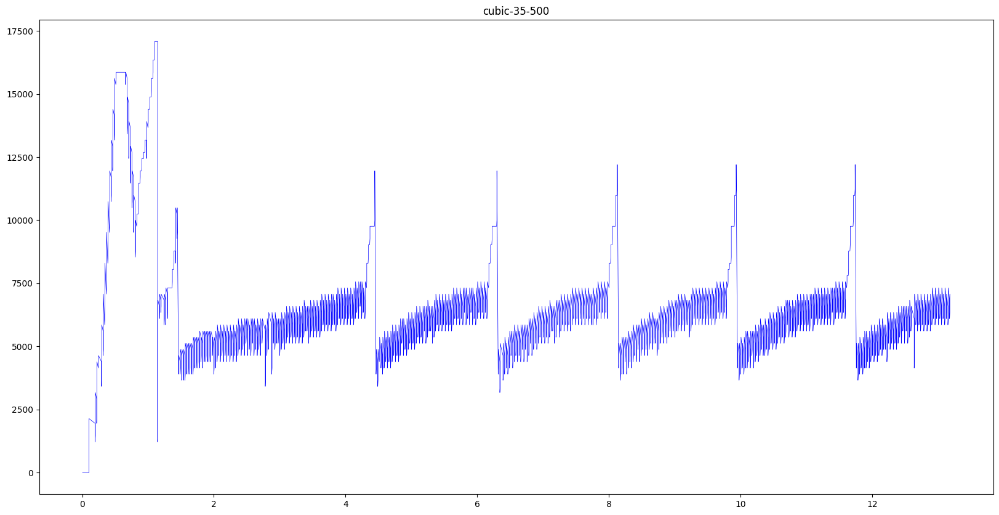

Reading ./Nebby/measurements/cubic-35-1000-tcp.csv...
total bytes processed: 881.142 KBytes for cubic-35-1000 (unlimited)


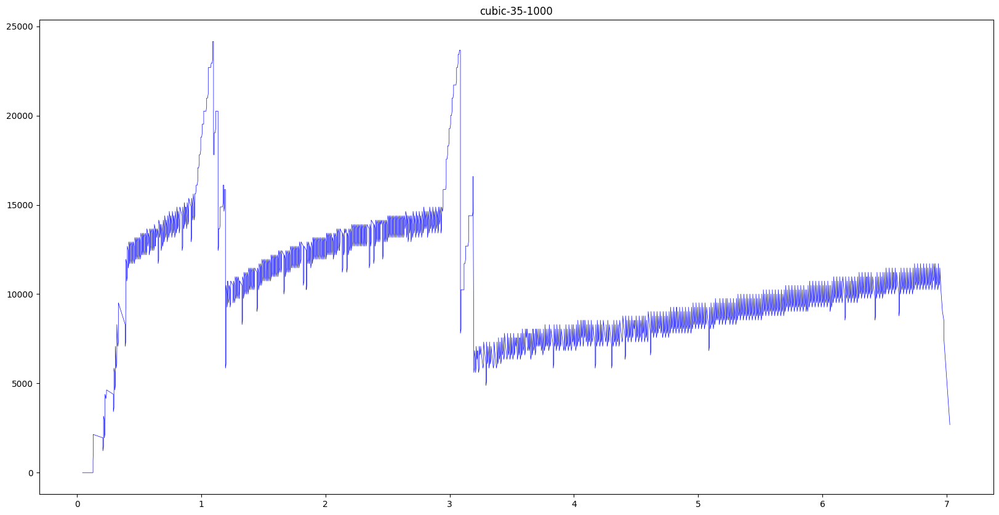

In [136]:
curr_files = get_files("cubic","35","")
plot_g(curr_files)

Reading ./Nebby/measurements/bbr-35-500-tcp.csv...
total bytes processed: 885.615 KBytes for bbr-35-500 (unlimited)


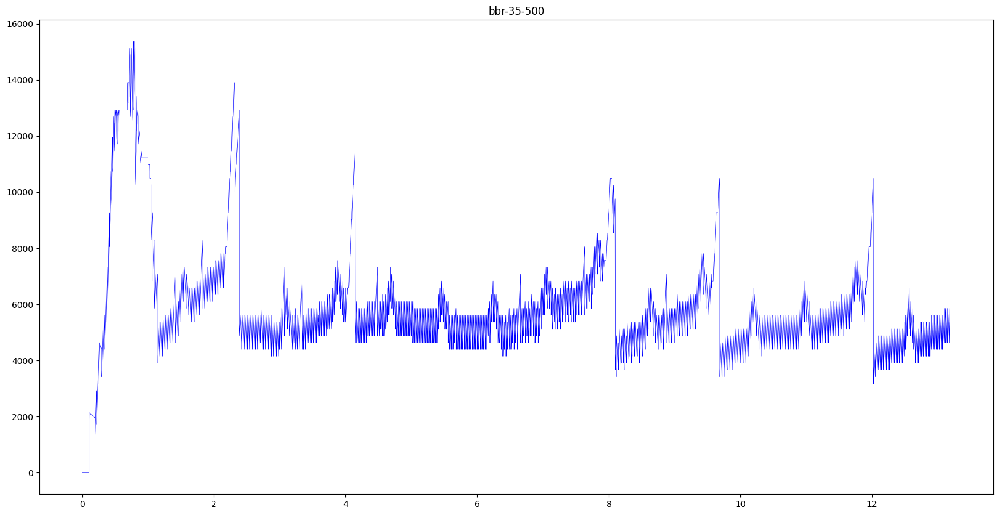

Reading ./Nebby/measurements/bbr-35-1000-tcp.csv...
total bytes processed: 953.154 KBytes for bbr-35-1000 (unlimited)


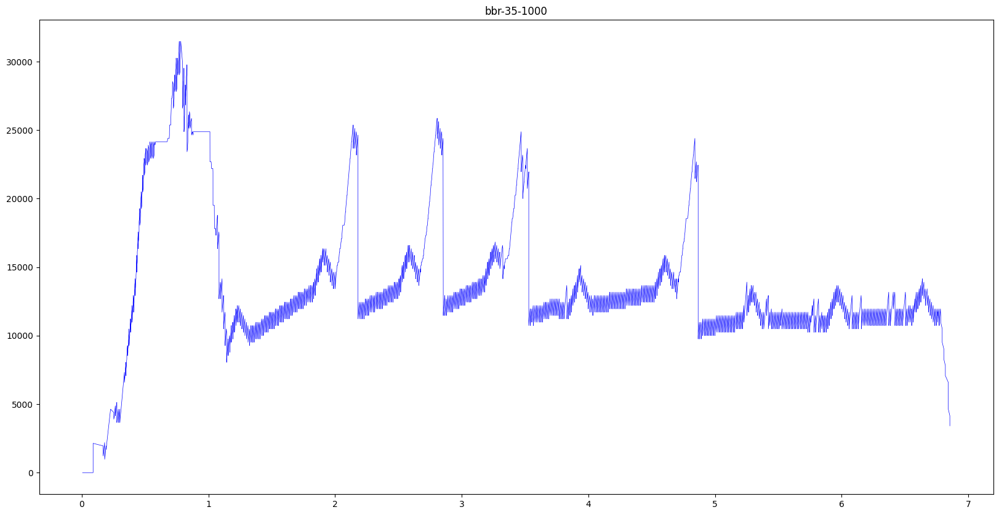

In [142]:
curr_files = get_files("bbr","35","")
plot_g(curr_files)

Reading ./Nebby/measurements/reno-35-500-tcp.csv...
total bytes processed: 891.554 KBytes for reno-35-500 (unlimited)


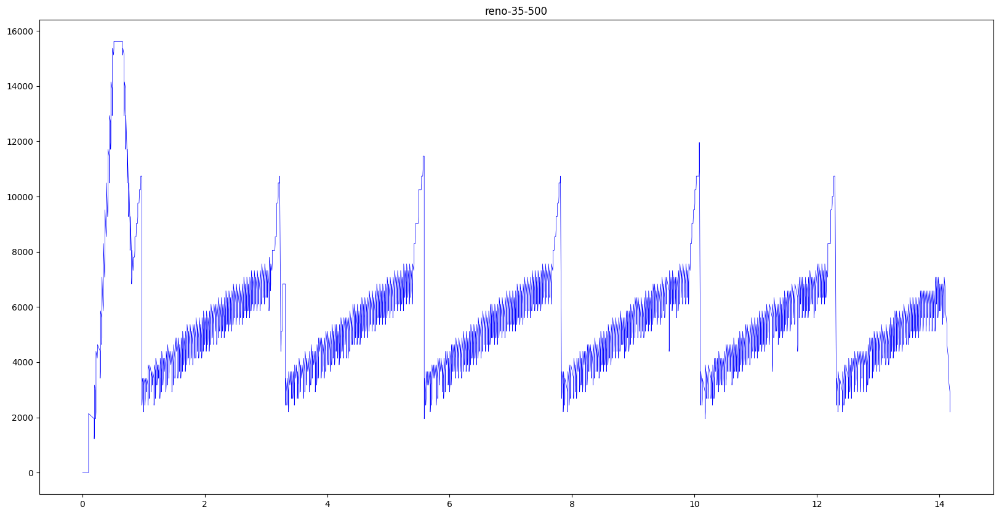

Reading ./Nebby/measurements/reno-35-1000-tcp.csv...
total bytes processed: 923.858 KBytes for reno-35-1000 (unlimited)


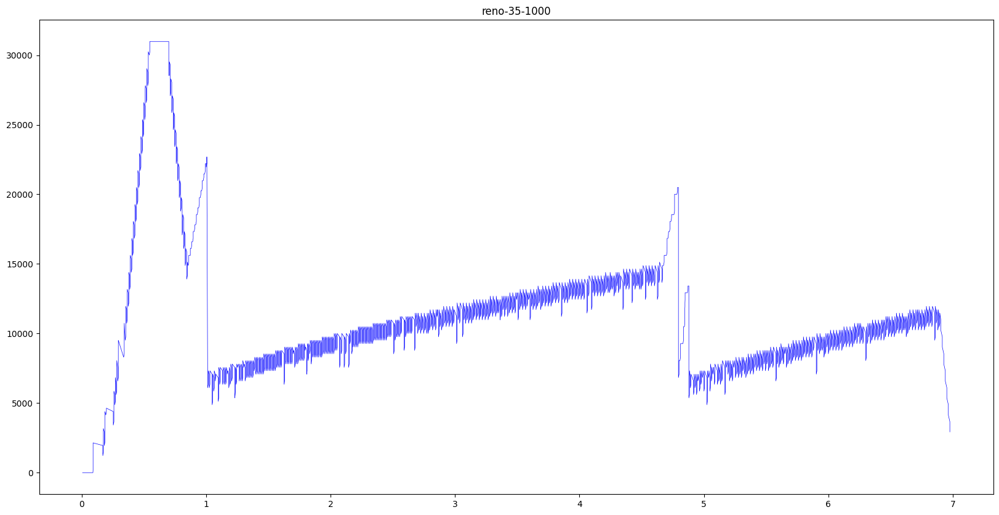

In [138]:
curr_files = get_files("reno","35","")
plot_g(curr_files)

### Zooming in 

Reading ./Nebby/measurements/cubic-15-100-tcp.csv...
total bytes processed: 1178.042 KBytes for cubic-15-100 (unlimited)


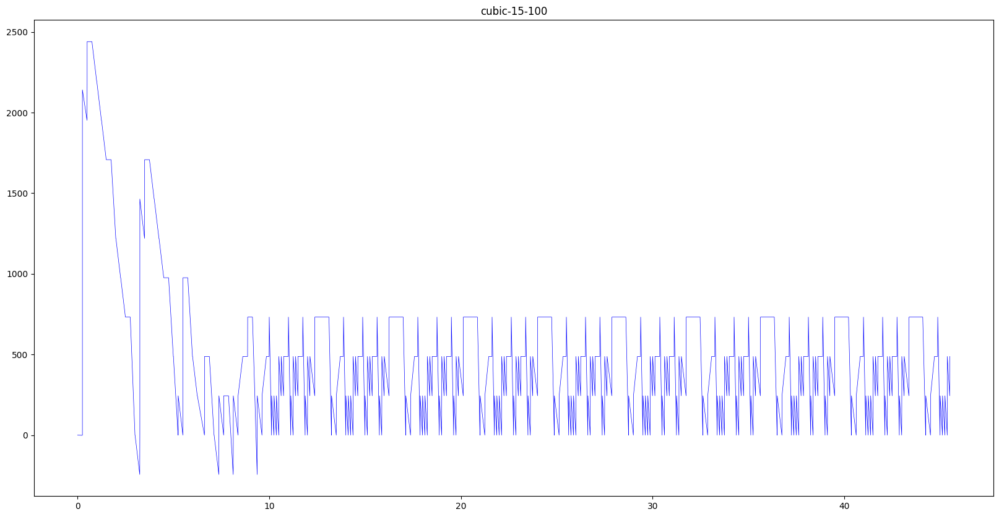

Reading ./Nebby/measurements/cubic-25-100-tcp.csv...
total bytes processed: 1044.51 KBytes for cubic-25-100 (unlimited)


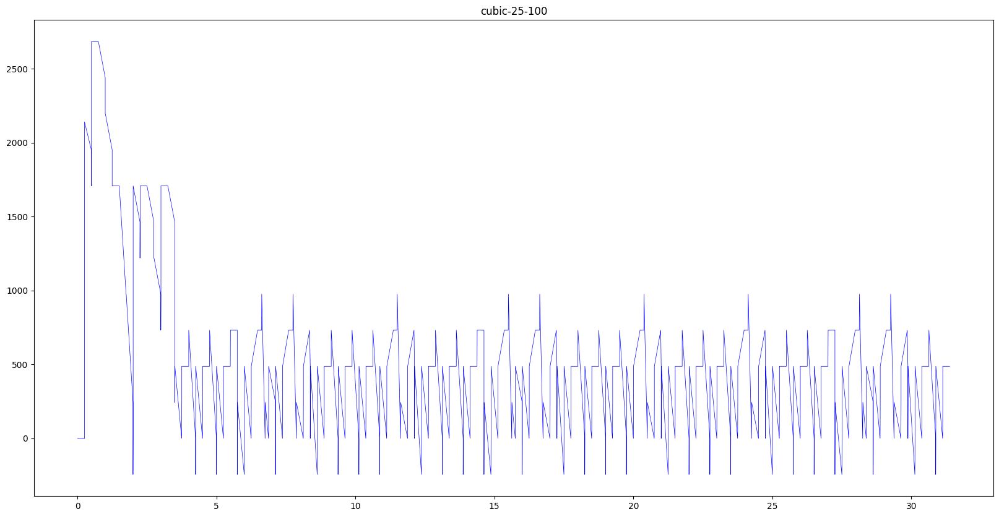

Reading ./Nebby/measurements/cubic-35-100-tcp.csv...
total bytes processed: 984.693 KBytes for cubic-35-100 (unlimited)


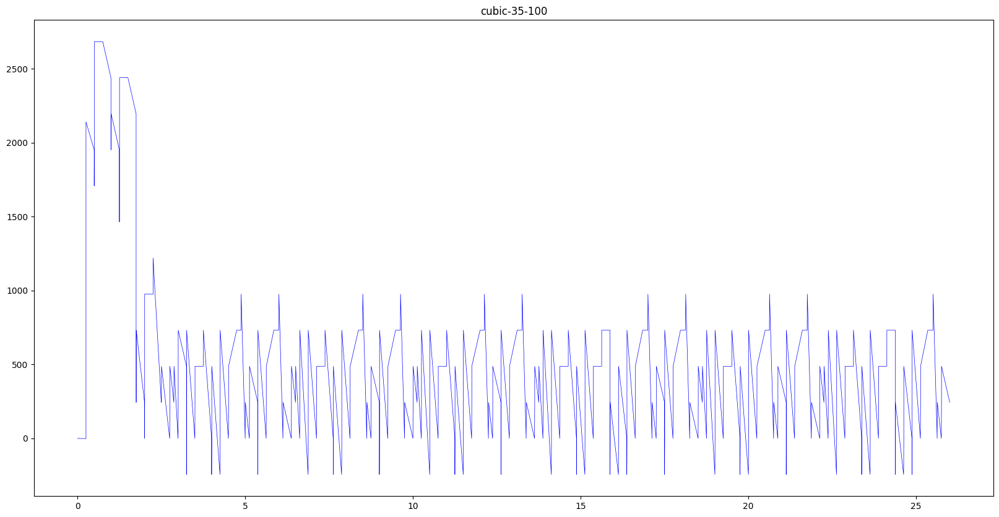

Reading ./Nebby/measurements/cubic-45-100-tcp.csv...
total bytes processed: 1070.698 KBytes for cubic-45-100 (unlimited)


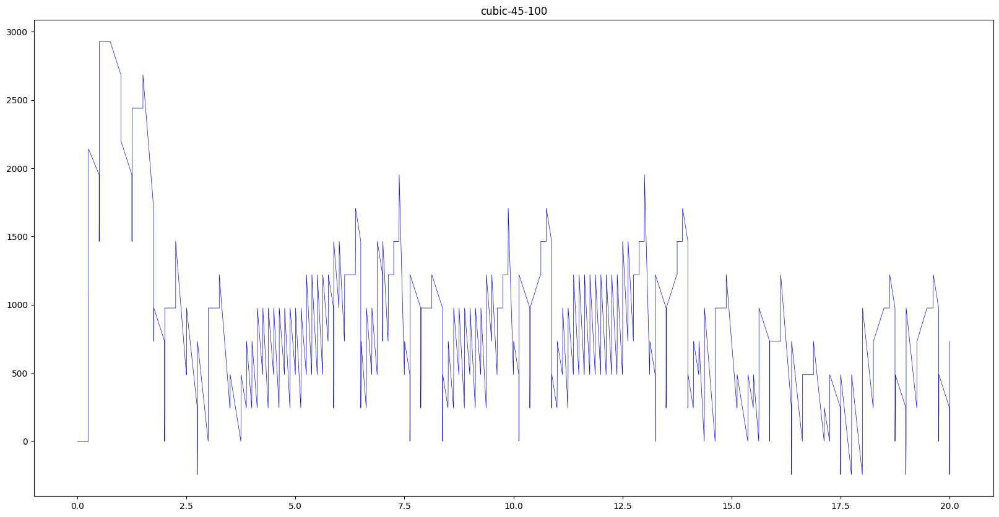

In [107]:
curr_files = get_files("cubic","","100")
plot_g(curr_files,z=10)

In [ ]:
curr_files = get_files("bbr","","100")
plot_g(curr_files,z=10)

### CC Diff, PD 35ms, LS 500ms


Reading ./Nebby/measurements/cubic-35-500-tcp.csv...
total bytes processed: 877.307 KBytes for cubic-35-500 (unlimited)


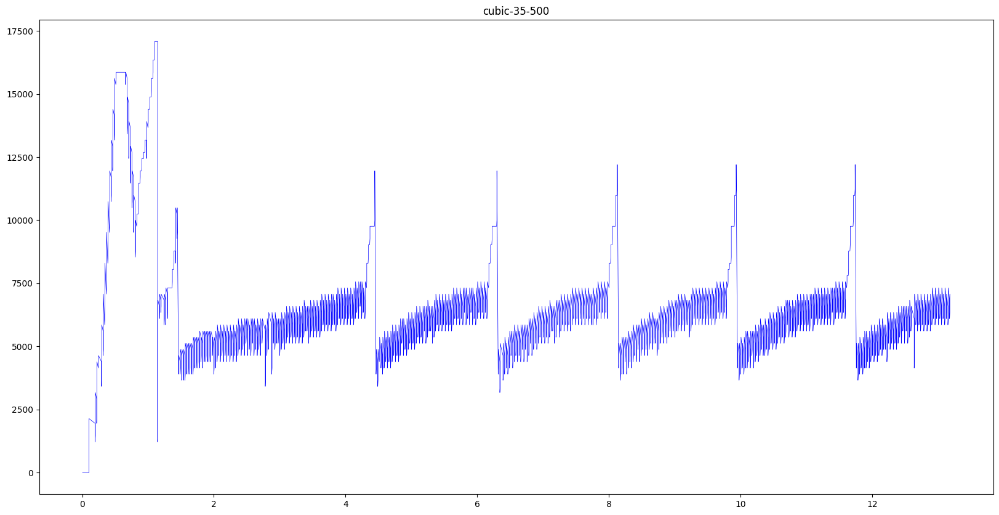

Reading ./Nebby/measurements/reno-35-500-tcp.csv...
total bytes processed: 891.554 KBytes for reno-35-500 (unlimited)


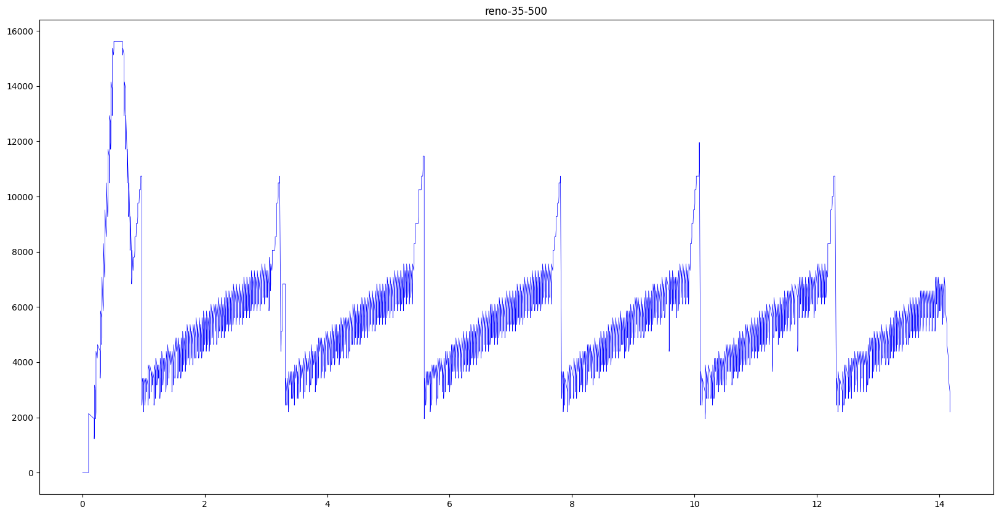

Reading ./Nebby/measurements/bbr-35-500-tcp.csv...
total bytes processed: 885.615 KBytes for bbr-35-500 (unlimited)


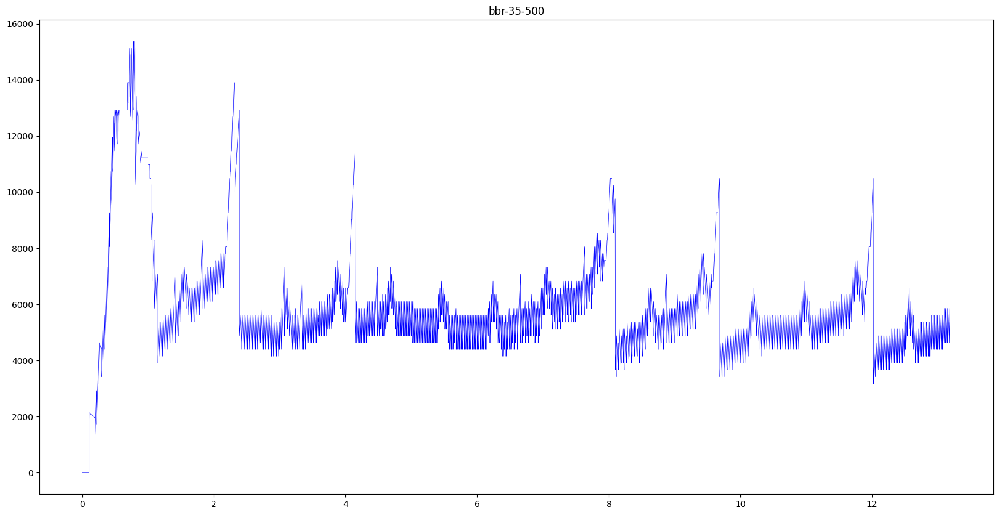

In [148]:
curr_files = get_files("","35","500")
plot_g(curr_files)

## Running different filters on it.

Reading ./Nebby/measurements/cubic-35-500-tcp.csv...
total bytes processed: 877.307 KBytes for cubic-35-500 (unlimited)


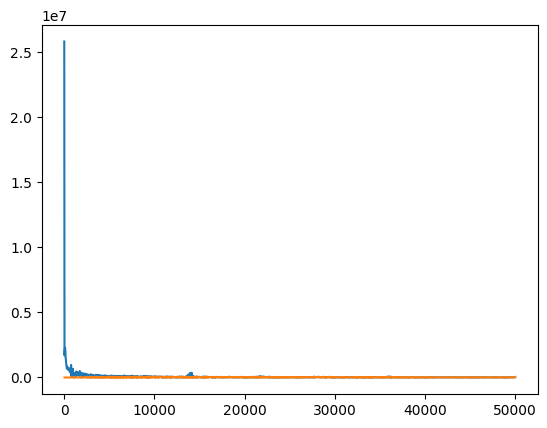

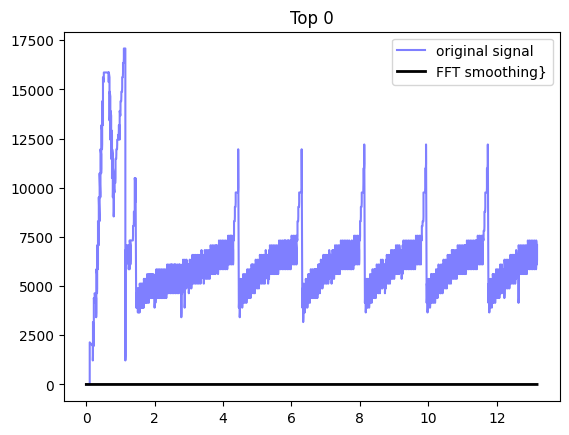

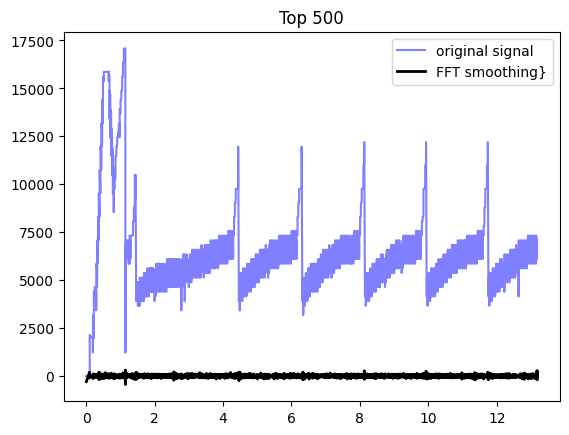

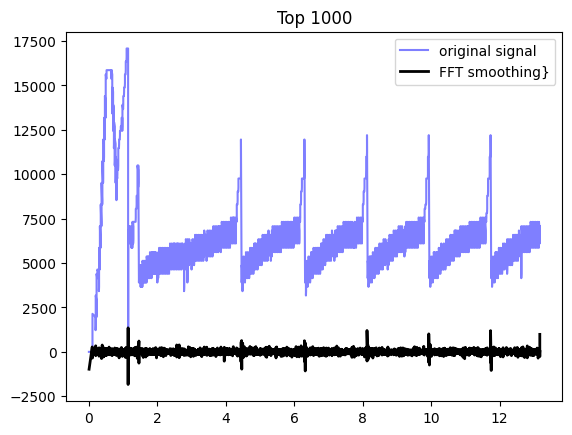

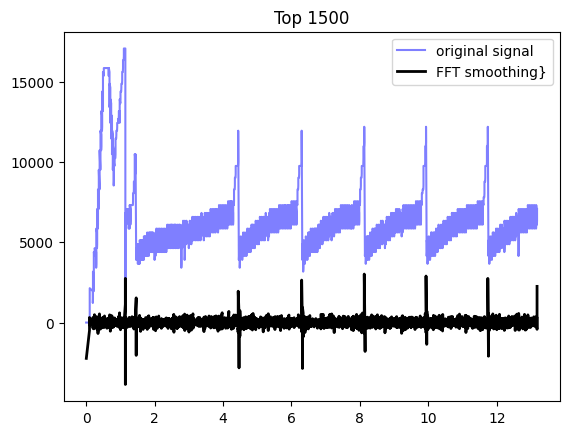

In [419]:
from scipy.fft import rfft, rfftfreq
from scipy.fft import irfft
import numpy as np
import statistics
curr_files = get_files("cubic","35","500")
data, time = get_window(curr_files[0], "n")
def get_fft(data):
    n = len(data)
    data_step = 0.00001
    yf = rfft(data)
    xf = rfftfreq(n,data_step)
    plt.plot(xf, np.abs(yf))
    return yf,xf
yf, xf = get_fft(data)
abs_yf = np.abs(yf)
sort_abs_yf = sorted(abs_yf)
xf = rfftfreq(n,data_step)
thresh  = abs_yf.mean()
indices = abs_yf<thresh
yf_clean = indices*yf
plt.plot(xf[1:],np.abs(yf_clean)[1:])
plt.show()
#Experiment :
#Let us run a loop to produce plots and see 
for i in range(0,len(sort_abs_yf),500):    
    thresh = sort_abs_yf[i]
    indices = abs_yf<thresh
    yf_clean = indices*yf
    new_f_clean = irfft(yf_clean)
    plt.title("Top " + str(i))
    plt.plot(time, data, color="b", alpha=0.5, label='original signal')
    plt.plot(time[1:], new_f_clean, 'k', label='FFT smoothing}', linewidth=2)
    plt.legend()
    plt.show()
#Experiment :
#Let us run a loop to produce plots and see 
# for i in range(50,500,50):    
#     thresh = sort_abs_yf[i]
#     indices = abs_yf>=thresh
#     yf_clean = indices*yf
#     new_f_clean = irfft(yf_clean)
#     plt.title("Top " + str(i))
#     plt.plot(time, data, color="b", alpha=0.5, label='original signal')
#     plt.plot(time[1:], new_f_clean, 'k', label='FFT smoothing}', linewidth=2)
#     plt.legend()
#     plt.show()

In [344]:
from scipy.fft import rfft, rfftfreq
import numpy as np
import statistics

In [355]:
curr_files = get_files("cubic","35","500")
data, time = get_window(curr_files[0], "n")

Reading ./Nebby/measurements/cubic-35-500-tcp.csv...
total bytes processed: 877.307 KBytes for cubic-35-500 (unlimited)


In [356]:
len(data)

3957

In [357]:
len(time)

3957

In [358]:
def get_fft(data):
    n = len(data)
    data_step = 0.00001
    yf = rfft(data)
    xf = rfftfreq(n,data_step)
    plt.plot(xf, np.abs(yf))
    return yf,xf

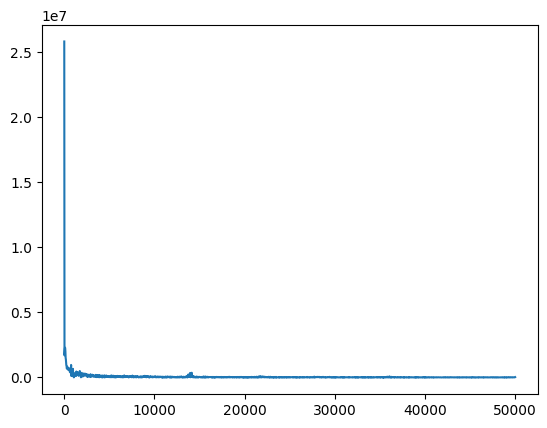

In [359]:
yf, xf = get_fft(data)

In [360]:
abs_yf = np.abs(yf)
sort_abs_yf = sorted(abs_yf, reverse=True)
xf = rfftfreq(n,data_step)

In [361]:
sort_abs_yf[0:10]

[25817629.0,
 2289897.456262522,
 2274662.165951875,
 2028292.819482818,
 1998871.184671487,
 1701437.9941697253,
 1502613.014905573,
 1399601.8249935997,
 1162245.1948963199,
 963118.6449965768]

In [362]:
mean = statistics.mean(sort_abs_yf)
mean

62679.166712257465

In [364]:
indices = abs_yf>mean
yf_clean = indices*yf

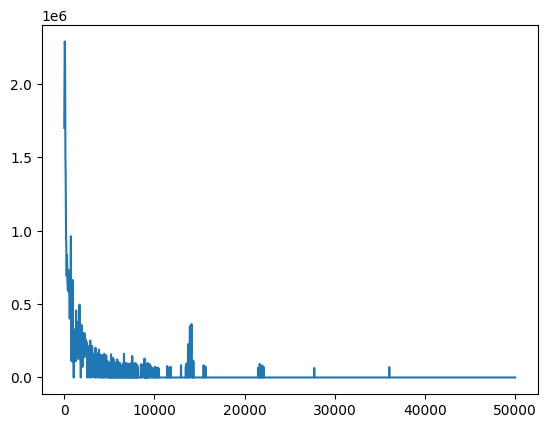

In [365]:
plt.plot(xf[1:],np.abs(yf_clean)[1:])

In [366]:
from scipy.fft import irfft

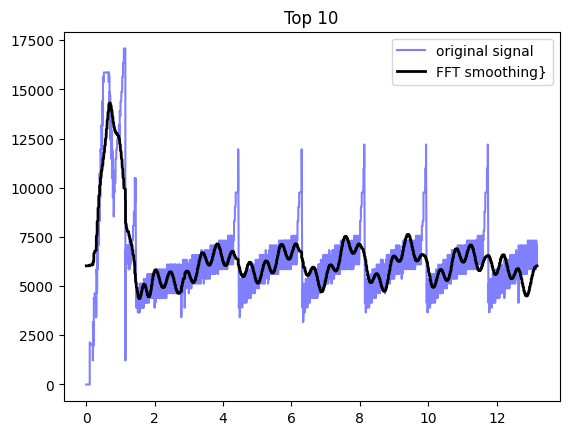

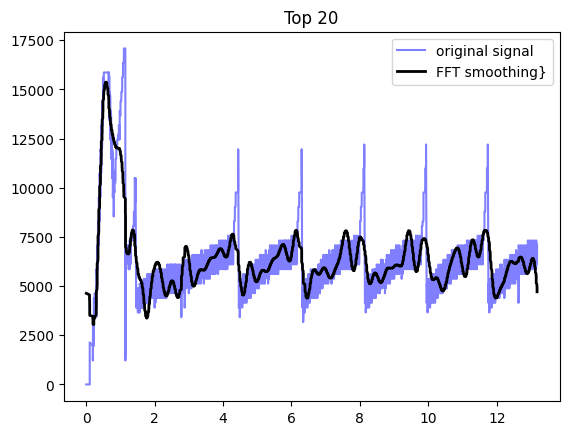

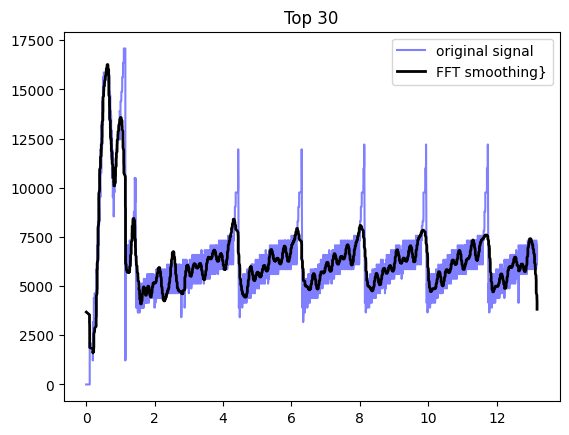

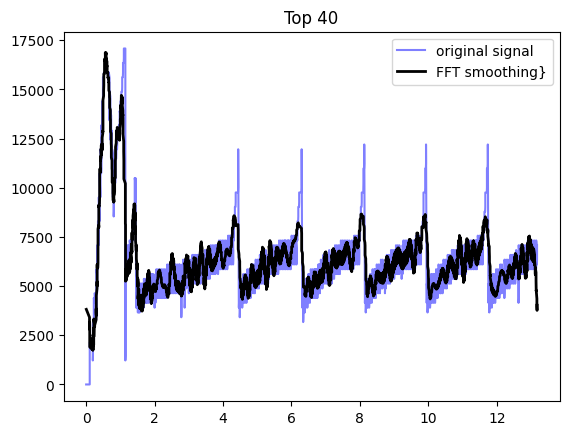

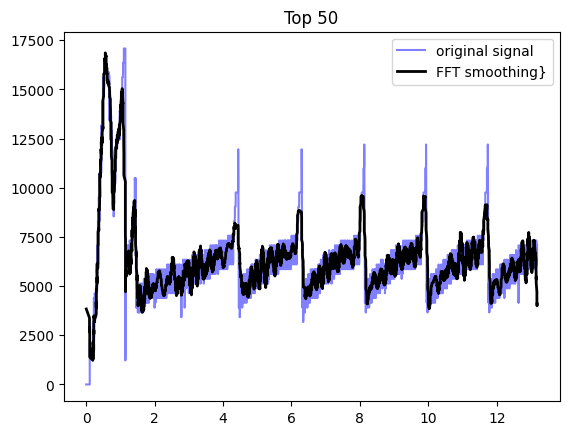

...

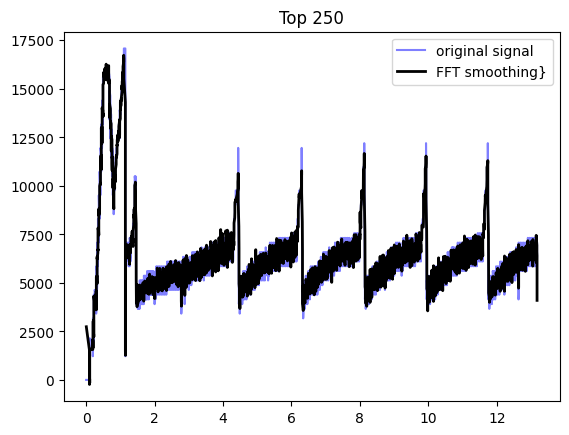

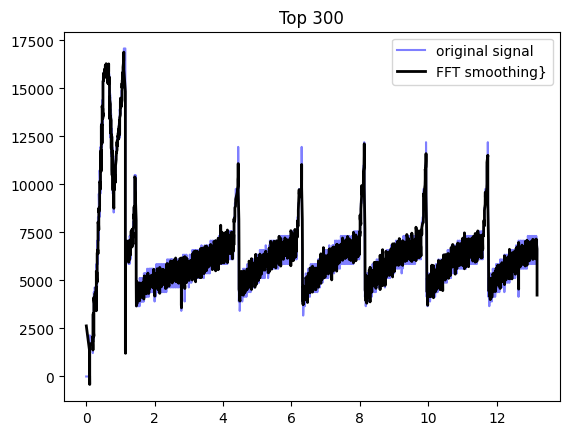

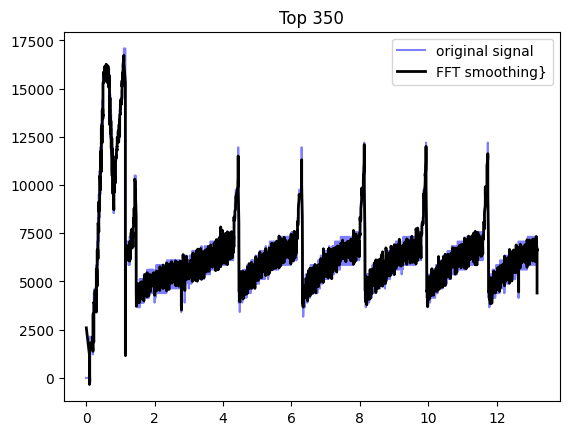

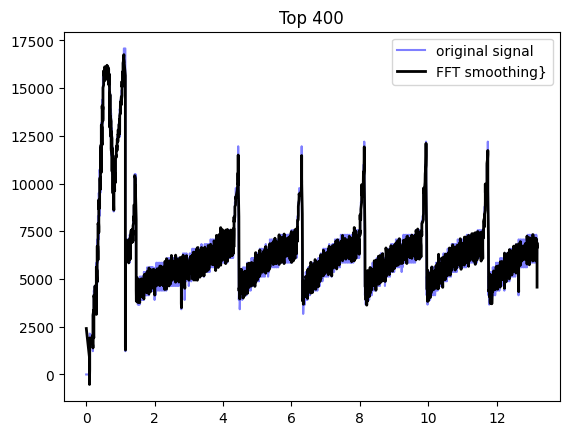

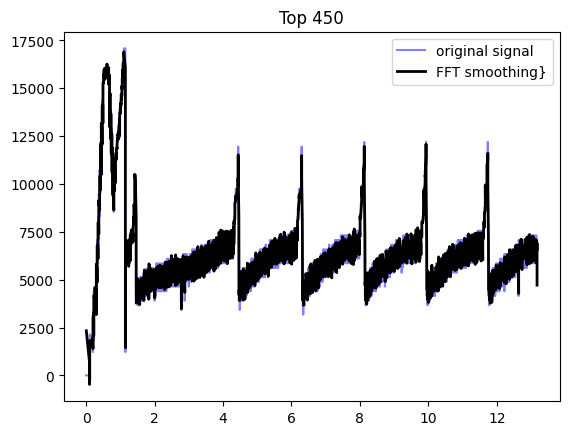

In [367]:
#Experiment :
#Let us run a loop to produce plots and see 
for i in range(10,50,10):    
    thresh = sort_abs_yf[i]
    indices = abs_yf>=thresh
    yf_clean = indices*yf
    new_f_clean = irfft(yf_clean)
    plt.title("Top " + str(i))
    plt.plot(time, data, color="b", alpha=0.5, label='original signal')
    plt.plot(time[1:], new_f_clean, 'k', label='FFT smoothing}', linewidth=2)
    plt.legend()
    plt.show()
#Experiment :
#Let us run a loop to produce plots and see 
for i in range(50,500,50):    
    thresh = sort_abs_yf[i]
    indices = abs_yf>=thresh
    yf_clean = indices*yf
    new_f_clean = irfft(yf_clean)
    plt.title("Top " + str(i))
    plt.plot(time, data, color="b", alpha=0.5, label='original signal')
    plt.plot(time[1:], new_f_clean, 'k', label='FFT smoothing}', linewidth=2)
    plt.legend()
    plt.show()

Reading ./Nebby/measurements/reno-35-500-tcp.csv...
total bytes processed: 891.554 KBytes for reno-35-500 (unlimited)
3981 3981
1991 1991


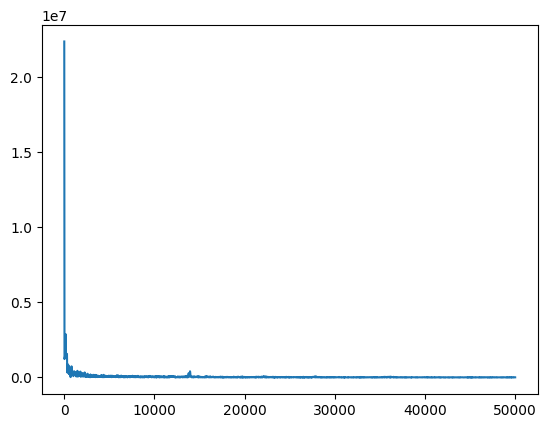

In [368]:
curr_files = get_files("reno","35","500")
data, time = get_window(curr_files[0], "n")
print(len(data), len(time))
yf, xf = get_fft(data)
print(len(yf), len(xf))
abs_yf = np.abs(yf)
sort_abs_yf = sorted(abs_yf, reverse=True)
mean = statistics.mean(sort_abs_yf)
indices = abs_yf>mean
yf_clean = indices*yf

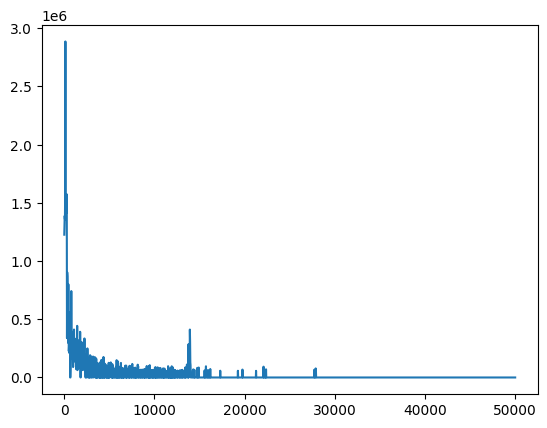

In [369]:
plt.plot(xf[1:],np.abs(yf_clean)[1:])

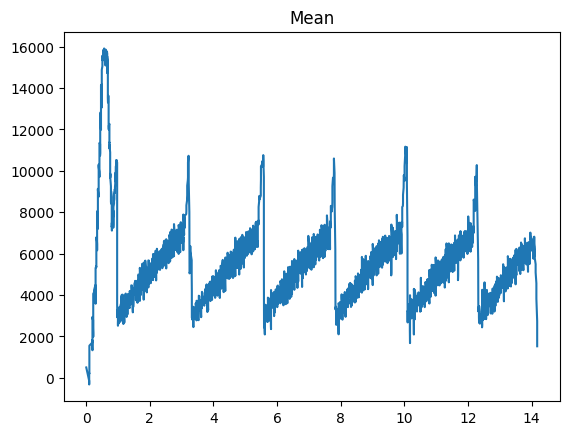

In [370]:
thresh = mean
indices = abs_yf>=thresh
yf_clean = indices*yf
new_f_clean = irfft(yf_clean)
plt.title("Mean")
plt.plot(time[1:], new_f_clean)
plt.show()

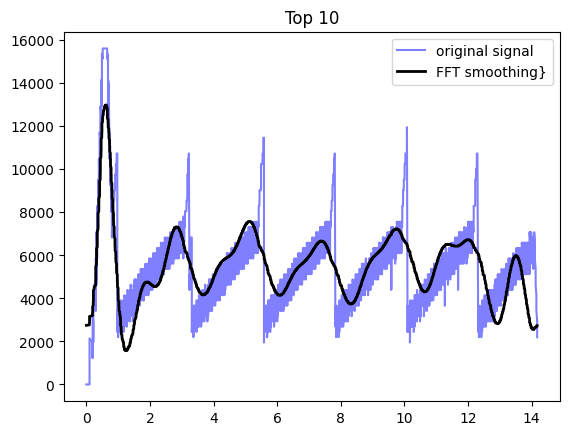

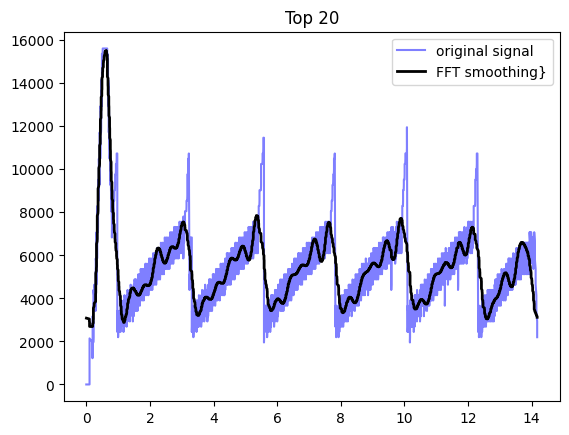

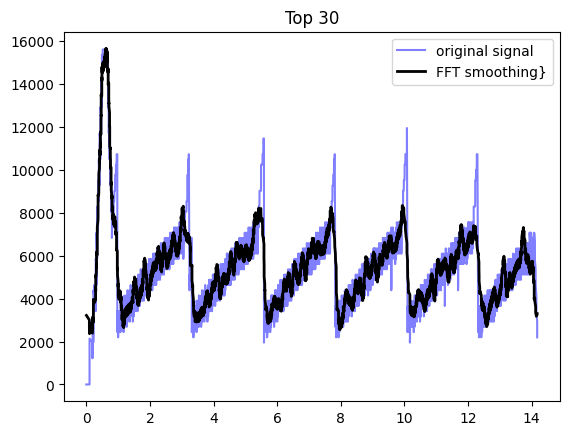

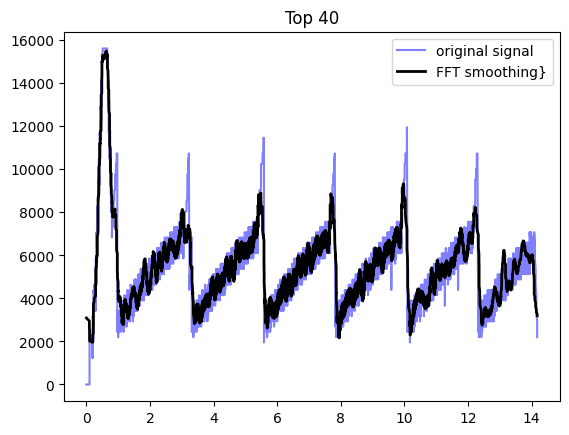

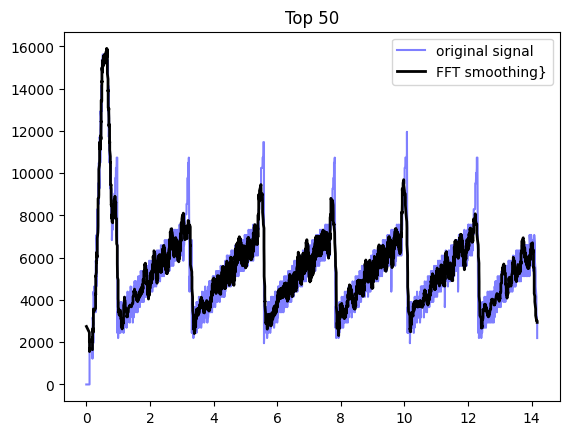

...

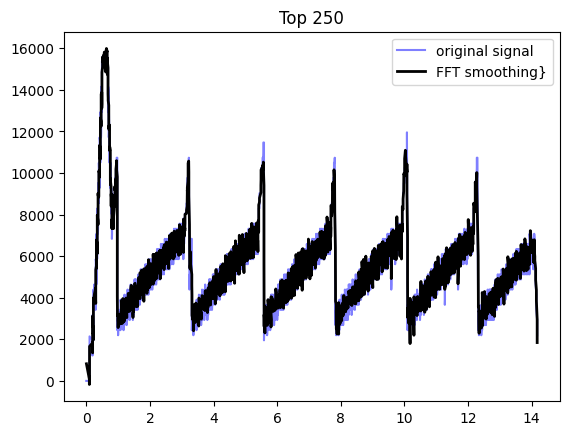

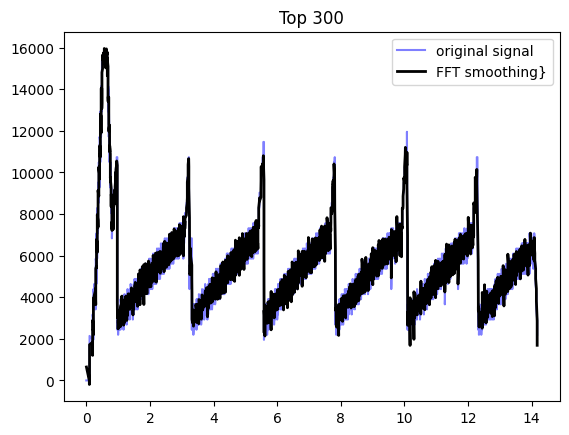

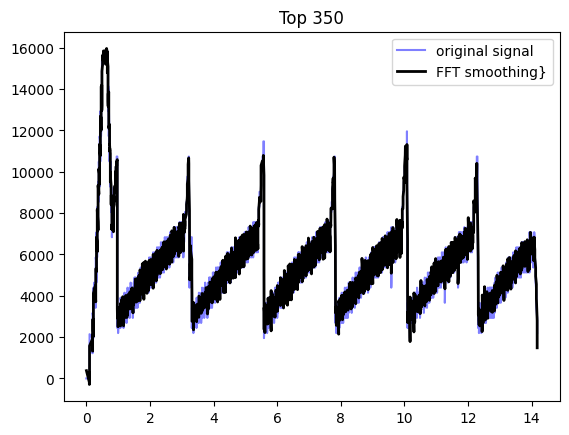

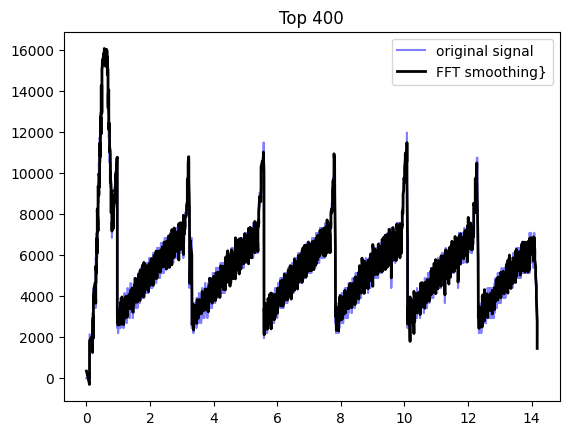

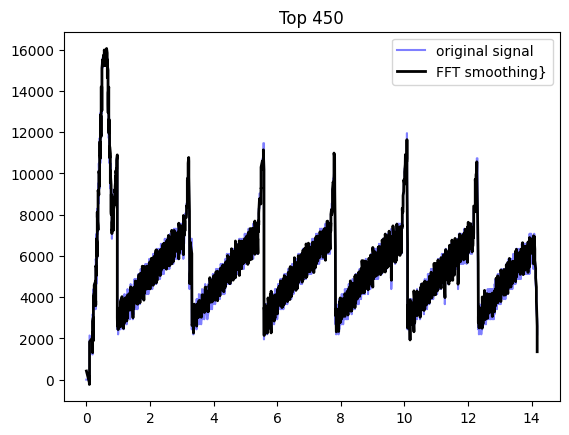

In [371]:
#Experiment :
#Let us run a loop to produce plots and see 
for i in range(10,50,10):    
    thresh = sort_abs_yf[i]
    indices = abs_yf>=thresh
    yf_clean = indices*yf
    new_f_clean = irfft(yf_clean)
    plt.title("Top " + str(i))
    plt.plot(time, data, color="b", alpha=0.5, label='original signal')
    plt.plot(time[1:], new_f_clean, 'k', label='FFT smoothing}', linewidth=2)
    plt.legend()
    plt.show()
#Experiment :
#Let us run a loop to produce plots and see 
for i in range(50,500,50):    
    thresh = sort_abs_yf[i]
    indices = abs_yf>=thresh
    yf_clean = indices*yf
    new_f_clean = irfft(yf_clean)
    plt.title("Top " + str(i))
    plt.plot(time, data, color="b", alpha=0.5, label='original signal')
    plt.plot(time[1:], new_f_clean, 'k', label='FFT smoothing}', linewidth=2)
    plt.legend()
    plt.show()

Reading ./Nebby/measurements/bbr-35-500-tcp.csv...
total bytes processed: 885.615 KBytes for bbr-35-500 (unlimited)
4086 4086


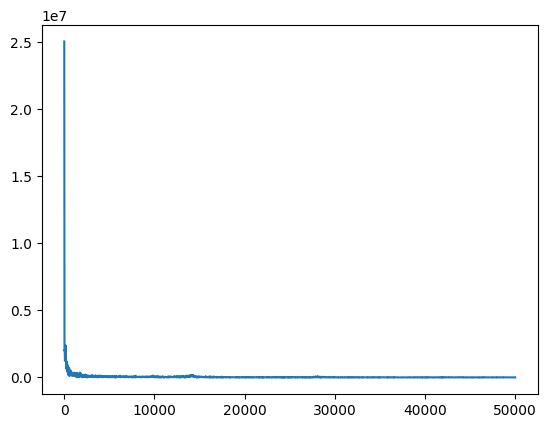

2044 2044


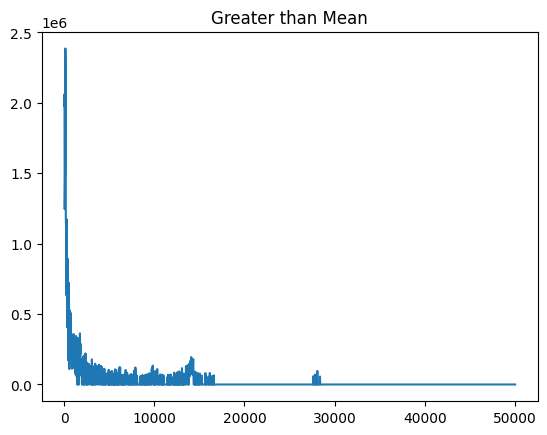

In [373]:
curr_files = get_files("bbr","35","500")
data, time = get_window(curr_files[0], "n")
print(len(data), len(time))
yf, xf = get_fft(data)
plt.show()
print(len(yf), len(xf))
abs_yf = np.abs(yf)
sort_abs_yf = sorted(abs_yf, reverse=True)
mean = statistics.mean(sort_abs_yf)
indices = abs_yf>mean
yf_clean = indices*yf
plt.title("Greater than Mean")
plt.plot(xf[1:],np.abs(yf_clean)[1:])

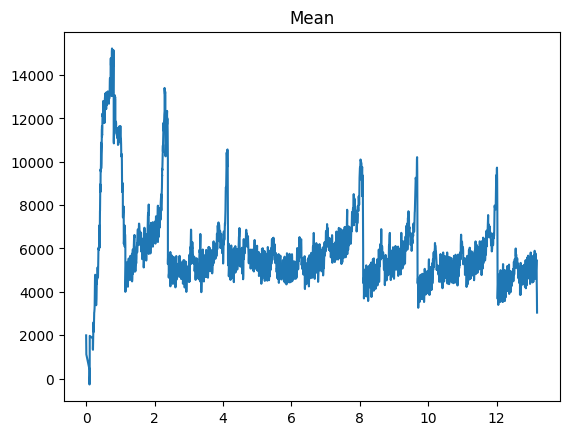

In [374]:
thresh = mean
indices = abs_yf>=thresh
yf_clean = indices*yf
new_f_clean = irfft(yf_clean)
plt.title("Mean")
plt.plot(time, new_f_clean)
plt.show()

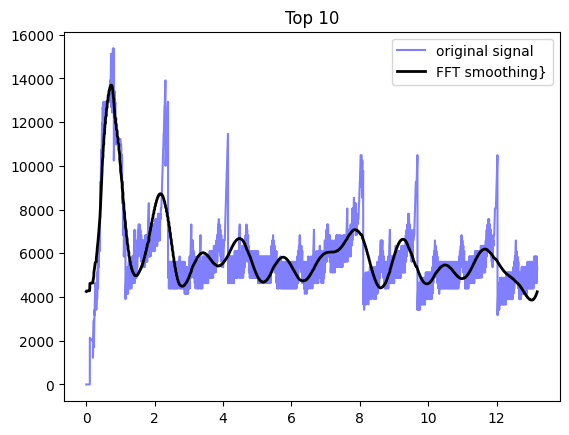

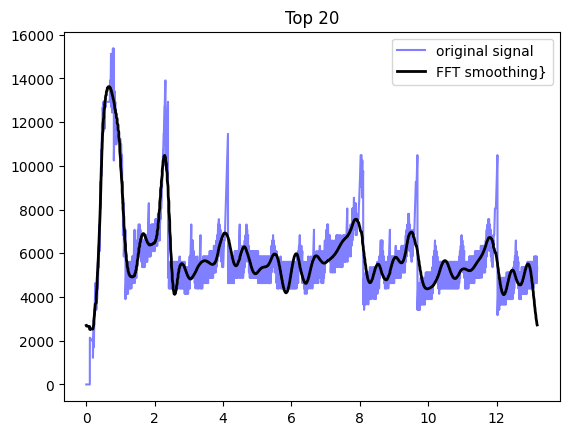

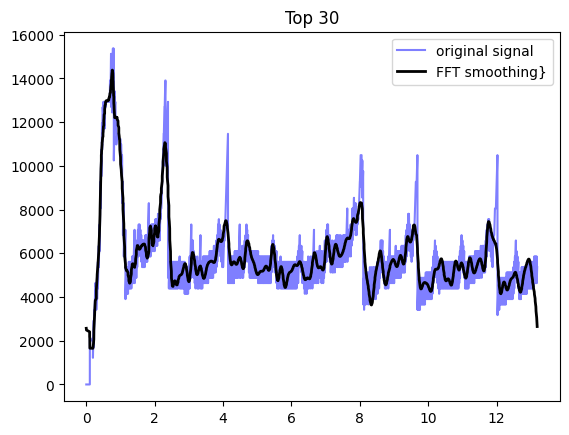

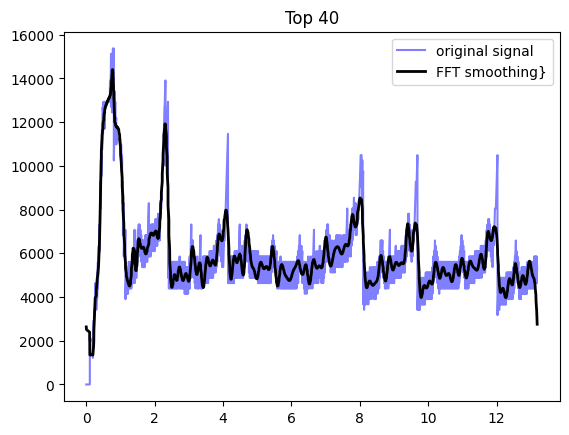

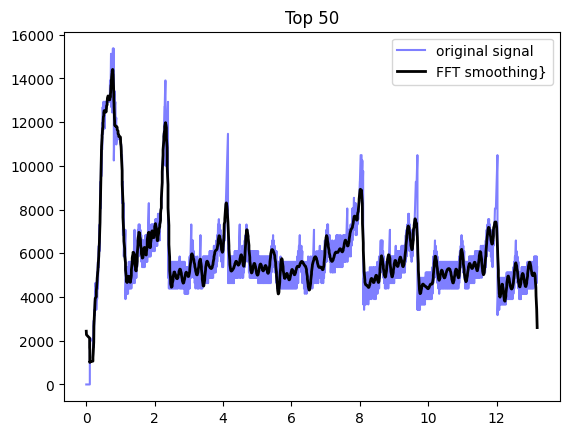

...

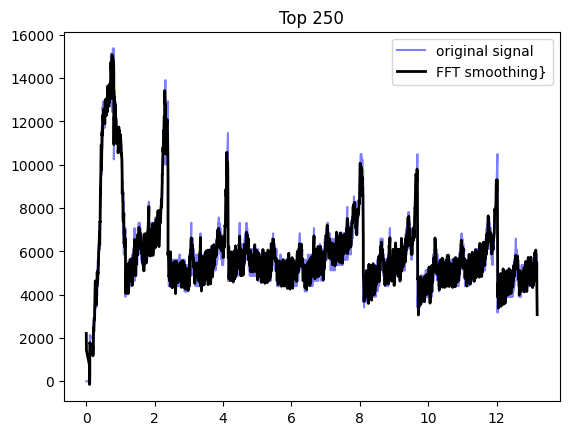

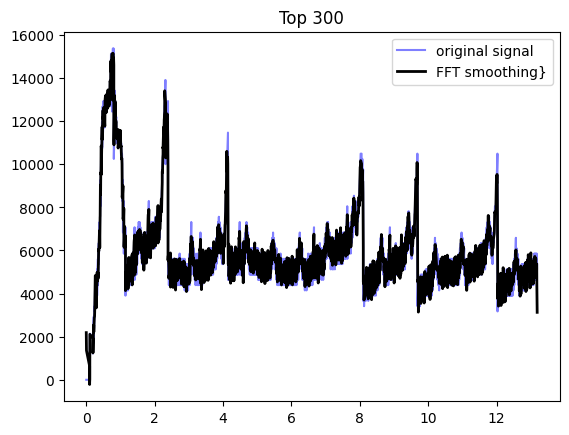

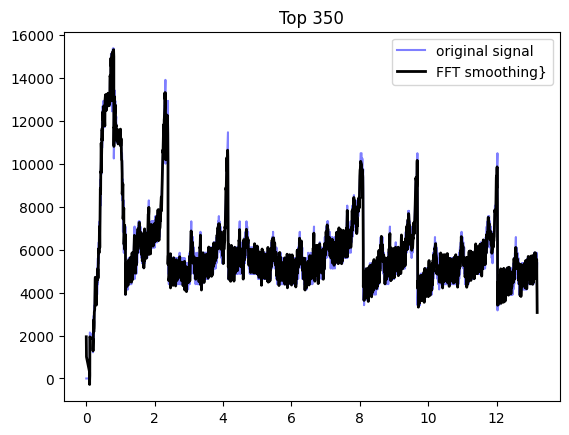

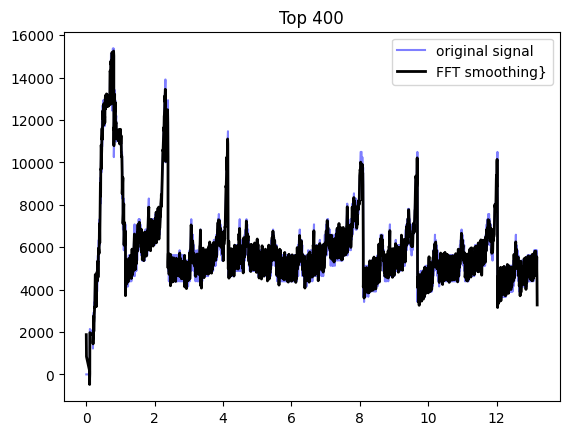

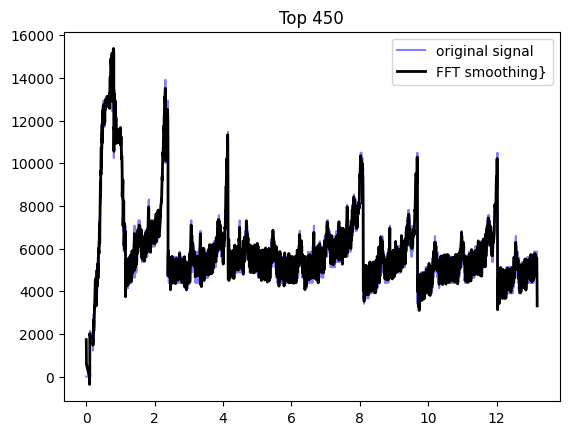

In [376]:
#Experiment :
#Let us run a loop to produce plots and see 
for i in range(10,50,10):    
    thresh = sort_abs_yf[i]
    indices = abs_yf>=thresh
    yf_clean = indices*yf
    new_f_clean = irfft(yf_clean)
    plt.title("Top " + str(i))
    plt.plot(time, data, color="b", alpha=0.5, label='original signal')
    plt.plot(time, new_f_clean, 'k', label='FFT smoothing}', linewidth=2)
    plt.legend()
    plt.show()
#Experiment :
#Let us run a loop to produce plots and see 
for i in range(50,500,50):    
    thresh = sort_abs_yf[i]
    indices = abs_yf>=thresh
    yf_clean = indices*yf
    new_f_clean = irfft(yf_clean)
    plt.title("Top " + str(i))
    plt.plot(time, data, color="b", alpha=0.5, label='original signal')
    plt.plot(time, new_f_clean, 'k', label='FFT smoothing}', linewidth=2)
    plt.legend()
    plt.show()

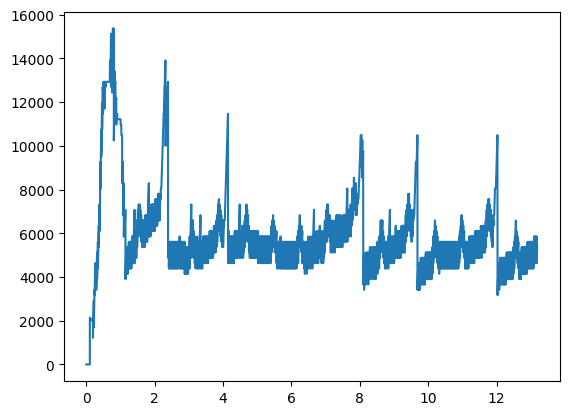

In [279]:
plt.plot(time, data)

# Using wavelet transform: How is it different from Fourier. 
#### Fourier works well when the frequency spectrum is stationary. As in you take the signal from any time to any time, the frequency spectrum would always remain the same. However, if you can see here, the peaks occur regularly but not exactly at regular intervals. Plus the first peak is different from other peaks. In these cases wavelet transform is used. It basically introduces another feature of time to work with in the freqeuncy spectrum of a signal.(Motivation to do this is 2 fold : Get a better filter, or get a frequency pattern, through which maybe classification becomes easier). So we can use a DWT filter.

In [295]:
import pywt

In [296]:
signal = data

In [315]:
import pywt
signal = data
def lowpassfilter(signal, thresh=0.63, wavelet="db4"):
    thresh = thresh*np.nanmax(signal)
    coeff = pywt.wavedec(signal, wavelet, mode="per")
    coeff[1:] = (pywt.threshold(i, value=thresh, mode="hard") for i in coeff[1:])
    reconstructed_signal = pywt.waverec(coeff, wavelet, mode="per")
    return reconstructed_signal
def plot_dwt(thresh,wv="db4"):
    fig, ax = plt.subplots(figsize=(12,8))
    ax.plot(signal, color="b", alpha=0.5, label='original signal')
    rec = lowpassfilter(signal, 0.5, wv)
    ax.plot(rec, 'k', label='DWT smoothing}', linewidth=2)
    ax.legend()
    ax.set_title('Removing High Frequency Noise with DWT', fontsize=18)
    ax.set_ylabel('Signal Amplitude', fontsize=16)
    ax.set_xlabel('Sample No', fontsize=16)
    plt.show()
plot_dwt(0.1,"rbio1.5")

In [321]:
def plot_dwt(thresh,wv="db4"):
    fig, ax = plt.subplots(figsize=(12,8))
    ax.plot(signal, color="b", alpha=0.5, label='original signal')
    rec = lowpassfilter(signal, 0.5, wv)
    ax.plot(rec, 'k', label='DWT smoothing}', linewidth=2)
    ax.legend()
    ax.set_title('Removing High Frequency Noise with DWT', fontsize=18)
    ax.set_ylabel('Signal Amplitude', fontsize=16)
    ax.set_xlabel('Sample No', fontsize=16)
    plt.show()

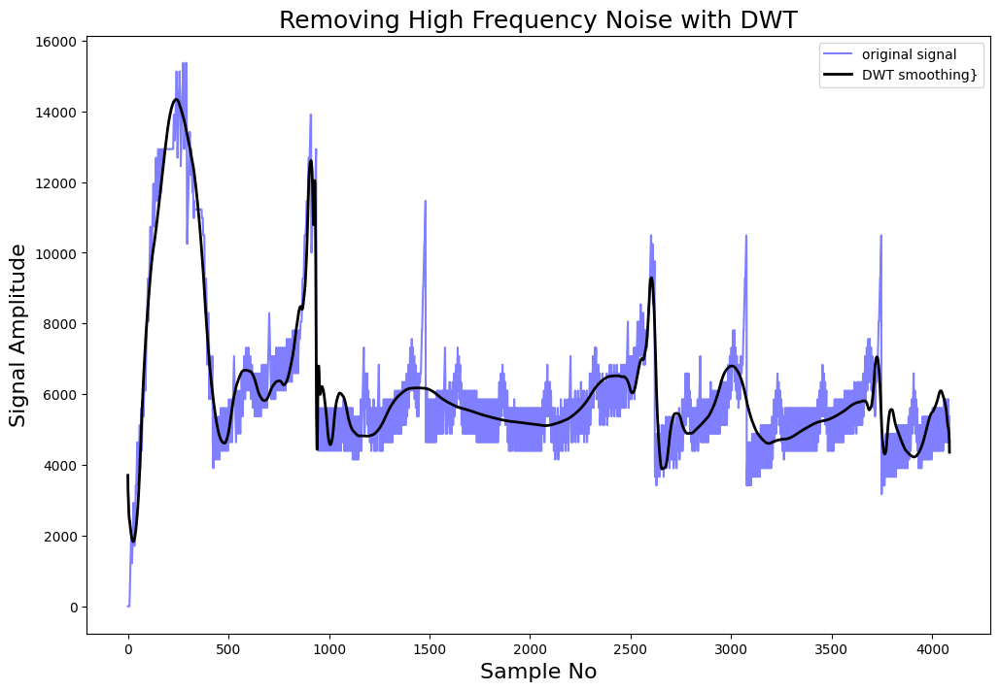

In [329]:
plot_dwt(0.1,"rbio1.5")

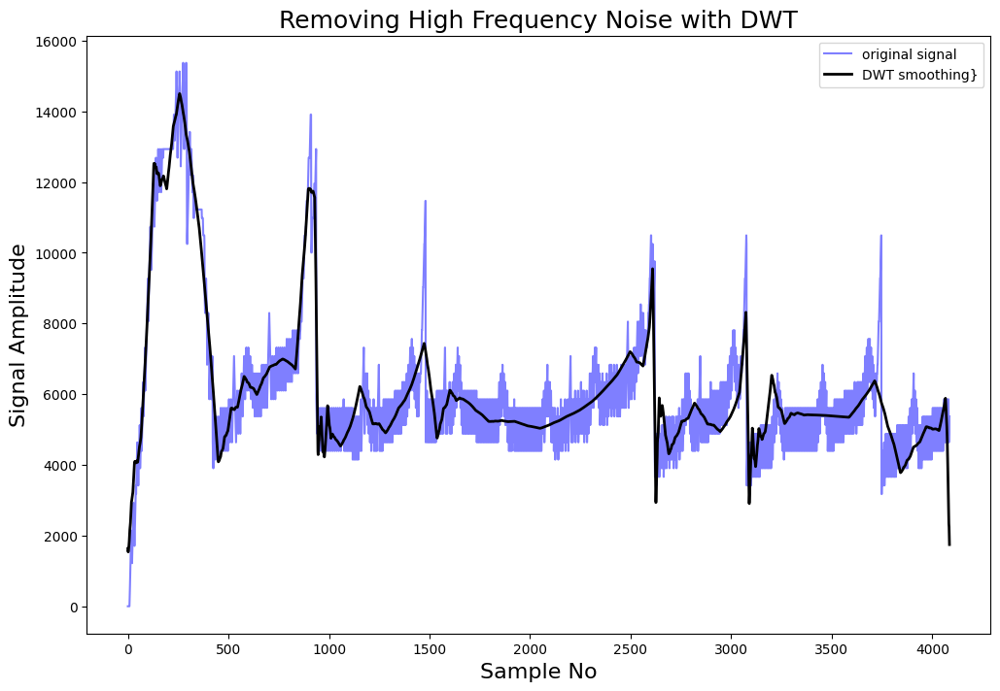

In [331]:
plot_dwt(0.5,"db3")

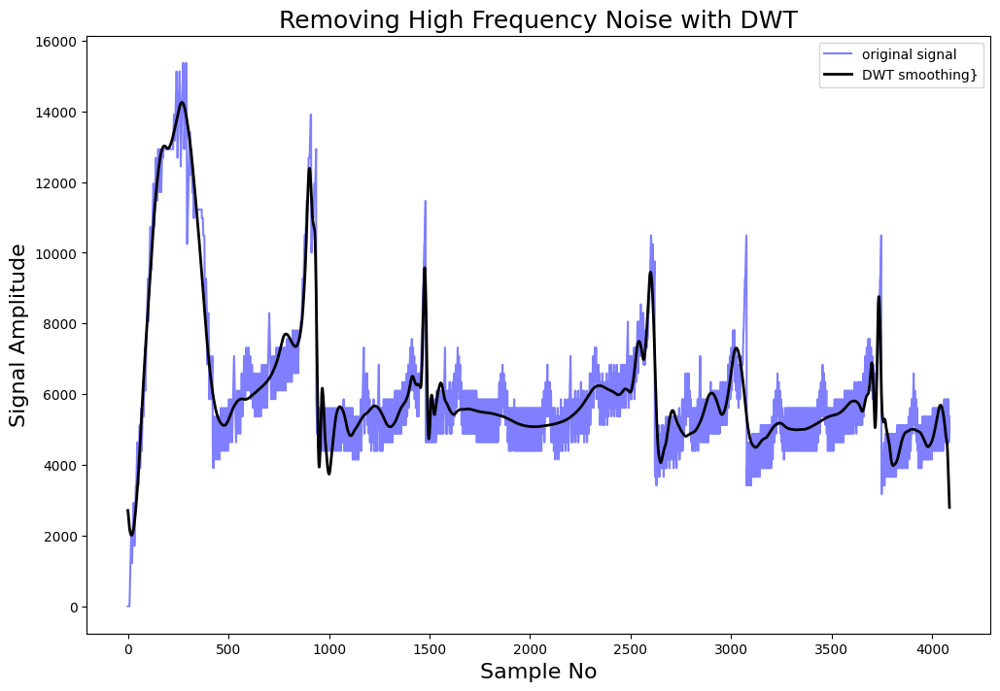

In [332]:
plot_dwt(0.5,"sym7")

## This sym7 is better than the other results.


# Getting the sites 

In [587]:
file = "websites.txt"

In [606]:
with open(file) as f :
    lines = f.readlines()
for line in range(len(lines)):
    if(line not in  [2,3,5,7,17,18,19,25]):
        name = lines[line][:-5]
        print(name.lower(), end=" ")

google youtube facebook twitter wikipedia amazon instagram linkedin reddit whatsapp openai yahoo bing xvideos live pornhub microsoft vk 